In [1]:
import pandas as pd
import numpy as np

#Lendo Arquivo
a = np.fromfile("dataAll.txt")
X = np.array_split(a, 1000)

#Inserindo viéis
Y = []
for i in range(len(X)):
    X[i] = np.insert(X[i],0, -1)
    
#Pegando as saídas esperadas    
for i in range(len(X)):
    Y.append(X[i][3])
    X[i] = np.delete(X[i],[3])

# Treinamento

In [2]:
#cálculo para a soma ponderada das entradas com seus respectivos pesos
def calculo_pesos(x,w):
    u = 0
    for i in range(len(w)):
        u = u + x[i] * w[i]
    #print(u)    
    return u

In [3]:
#função de ativação 
def funcao_ativacao(x,w):
    if(calculo_pesos(x,w) >= 0):
        return 1
    else:
        return 0

In [4]:
#cálculo do ajuste de pesos sinápticos
def ajuste_pesos(e,wi,xi, peso):
    n = peso
    aux = n * e * xi
    w_ajus = wi + aux
    return w_ajus

In [5]:
def train_perceptron(X, Y, menor, maior, peso):
    #w = [-0.5441,0.5562,-0.4024] #falta os pesos aleatórios
    w = np.random.uniform(menor, maior, 3)
    conv_max = False
    cont = 0
    qnt_ajuste_peso = 0
    while(conv_max == False):
        cont = cont + 1
        lista_pred = []
        conv = 0
        print("Epoch:",cont,"#################################")
        print("Vetor de pesos na época ",cont, ":",w)
        for i in range(len(X)): 
            yi = funcao_ativacao(X[i],w)
            e = Y[i] - yi
            if(e != 0):
                w = ajuste_pesos(e,w,X[i], peso)
                qnt_ajuste_peso = qnt_ajuste_peso + 1
            else:
                lista_pred.append(yi)
                conv = conv + 1 
              
        print("quantidade de exemplos corretos: ",conv)
        print("quantidade de exemplos errados: ",len(X) - conv)
        print()
        if(conv == len(X)):
            conv_max = True
            
    print("pesos final: ",w)
    print("quantidade de vezes que o peso foi ajustado: ",qnt_ajuste_peso)
    print("\n")
    return lista_pred,w,cont,qnt_ajuste_peso

# 2.1. Parte I – Resolvendo um Problema Linearmente Separável

In [6]:
(pred,W, epoca, qtdeAj) = train_perceptron(X,Y, -0.5, 0.5, 0.1)

Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.24100585 -0.22527354  0.44616893]
quantidade de exemplos corretos:  976
quantidade de exemplos errados:  24

Epoch: 2 #################################
Vetor de pesos na época  2 : [  -0.64100585  218.57726646 -217.28608107]
quantidade de exemplos corretos:  980
quantidade de exemplos errados:  20

Epoch: 3 #################################
Vetor de pesos na época  3 : [  -0.84100585  328.31500646 -253.88444107]
quantidade de exemplos corretos:  989
quantidade de exemplos errados:  11

Epoch: 4 #################################
Vetor de pesos na época  4 : [  -0.74100585  323.18375646 -323.06467107]
quantidade de exemplos corretos:  1000
quantidade de exemplos errados:  0

pesos final:  [  -0.74100585  323.18375646 -323.06467107]
quantidade de vezes que o peso foi ajustado:  55




In [7]:
print(W) #vetor de pesos após a convergência

[  -0.74100585  323.18375646 -323.06467107]


# Visualização da Fronteira de decisão

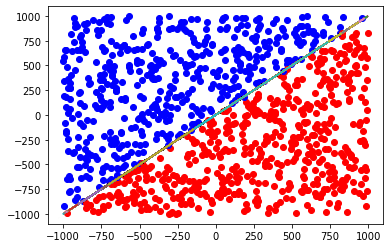

In [8]:
import matplotlib.pyplot as plt
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# 2.2. Parte II – Experimentação

In [9]:
#Lendo Arquivo
a = np.fromfile("data3.txt")
X = np.array_split(a, 600)

#Inserindo viéis
Y = []
for i in range(len(X)):
    X[i] = np.insert(X[i],0, -1)
    
#Pegando as saídas esperadas    
for i in range(len(X)):
    Y.append(X[i][3])
    X[i] = np.delete(X[i],[3])



In [10]:
def impressao(vEpocas, vAjustes):
    print("Média da qtde das Épocas ", np.mean(vEpocas))
    print("Média da qtde dos Ajustes ", np.mean(vAjustes))
    print("Desvio padrão das Épocas ", np.std(vEpocas))
    print("Desvio padrão dos Ajustes ", np.std(vAjustes))
    

# Primeira configuração

In [11]:
vEpoca = []
vAjuste = []    
for i in range (100):    
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-42.43414689  52.68427403  53.5011534 ]
quantidade de exemplos corretos:  408
quantidade de exemplos errados:  192

Epoch: 2 #################################
Vetor de pesos na época  2 : [34.36585311 51.39293039 23.06930691]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [35.96585311 51.00002128 21.297094  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [36.76585311 50.77420465 20.40300744]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [37.16585311 50.63629177 19.98328467]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na époc

quantidade de exemplos corretos:  536
quantidade de exemplos errados:  64

Epoch: 2 #################################
Vetor de pesos na época  2 : [30.13999128 38.47765182 36.72666237]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 3 #################################
Vetor de pesos na época  3 : [33.33999128 42.01853803 27.80808267]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 4 #################################
Vetor de pesos na época  4 : [33.73999128 43.44974473 24.54593096]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 5 #################################
Vetor de pesos na época  5 : [34.13999128 44.28370998 22.17738159]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 6 #################################
Vetor de pesos na época  6 : [34.13999128 44.93654957 20.71808165]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epo

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [62.33280976 81.73156292 34.40191685]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [62.33280976 81.93844011 33.87188397]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [62.33280976 82.14531729 33.34185109]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [62.33280976 82.35219447 32.81181822]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [62.33280976 82.55907165 32.28178534]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  509
quantidade de exemplos errados:  91

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -5.39194427  12.4339078  -12.45889021]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.60805573 14.98237841 -7.94723555]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 2.60805573 15.42134036 -6.19227009]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 3.80805573 15.40420757 -5.53411857]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 3.80805573 15.5617948  -5.07959546]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1



quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 13.50485296  55.55471428 -21.7073516 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 13.90485296  55.64208974 -21.1752084 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 13.90485296  55.79967698 -20.72068529]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 13.90485296  55.95726421 -20.26616218]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 14.30485296  55.87015591 -20.20207404]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 12.13275394  58.61296972 -29.91425323]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 13.73275394  58.93236133 -28.2770289 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 14.53275394  59.17301734 -27.14760436]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 14.53275394  59.55863405 -26.14332909]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 14.53275394  59.94425075 -25.13905382]
quantidade de exemplos corretos:  596
quantidade de exemplos 

quantidade de exemplos corretos:  418
quantidade de exemplos errados:  182

Epoch: 3 #################################
Vetor de pesos na época  3 : [-18.25826242  48.93431045 -51.75748141]
quantidade de exemplos corretos:  508
quantidade de exemplos errados:  92

Epoch: 4 #################################
Vetor de pesos na época  4 : [ -0.65826242  55.94405108 -40.0738958 ]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 5 #################################
Vetor de pesos na época  5 : [  6.54173758  58.04407917 -34.50000417]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 10.54173758  58.97781698 -31.13601796]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 12.54173758  58.99058263 -29.90070952]
quantidade de exemplos corretos:  592
quantidade de exemplos

quantidade de exemplos corretos:  441
quantidade de exemplos errados:  159

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 2.89583977  9.24792468 30.6921765 ]
quantidade de exemplos corretos:  534
quantidade de exemplos errados:  66

Epoch: 4 #################################
Vetor de pesos na época  4 : [12.49583977 17.22238732 15.36719645]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 5 #################################
Vetor de pesos na época  5 : [14.49583977 19.09168692  9.97910114]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 6 #################################
Vetor de pesos na época  6 : [14.89583977 19.46341293  8.52889013]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [14.89583977 19.67029012  7.99885725]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Ep

quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 3 #################################
Vetor de pesos na época  3 : [36.36014085 46.16918768 28.94463507]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 4 #################################
Vetor de pesos na época  4 : [37.16014085 46.93384464 26.18111201]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 5 #################################
Vetor de pesos na época  5 : [37.16014085 47.82063465 24.29461883]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 6 #################################
Vetor de pesos na época  6 : [37.16014085 48.47347425 22.83531889]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 7 #################################
Vetor de pesos na época  7 : [37.16014085 48.90864025 21.81414089]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoc

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 12 #################################
Vetor de pesos na época  12 : [58.4588426  77.20123427 31.45021009]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 13 #################################
Vetor de pesos na época  13 : [58.4588426  77.40811145 30.92017722]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [58.4588426  77.61498863 30.39014434]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [58.4588426  77.82186582 29.86011146]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [58.4588426  77.82186582 29.86011146]
quantidade de vezes que o peso foi ajustado:  89


Rodada  44
Epoch: 1 #################################
Vetor de pesos na época  

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 20.09194032  77.22295228 -27.6797156 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 20.09194032  77.38053951 -27.22519249]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 20.49194032  77.29343121 -27.16110435]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 20.49194032  77.45101844 -26.70658123]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 20.89194032  77.36391014 -26.64249309]
quantidade de exemplos corretos:  599
quantidade de exe

Vetor de pesos na época  13 : [ 14.98956542  60.15279152 -21.70945401]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 15.38956542  60.06568322 -21.64536587]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 15.38956542  60.22327045 -21.19084276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 15.78956542  60.13616215 -21.12675462]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 15.78956542  60.29374938 -20.67223151]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 16.18956542  60.2066410

quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 11.71535257  44.73449116 -15.45475288]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 12.11535257  44.64738286 -15.39066474]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 12.11535257  44.80497009 -14.93614163]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 12.51535257  44.71786179 -14.87205349]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 12.51535257  44.71786179 -14.87205349]
quantidade de vezes que o peso foi ajustado:  404


Rodada  58
Epoch: 1 #################################
Vetor de pesos na época  1 : [-42.33066617  71.

Vetor de pesos na época  18 : [ 25.11059435  99.46345945 -38.86707035]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 25.11059435  99.62104668 -38.41254724]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 25.11059435  99.77863391 -37.95802413]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 25.11059435  99.93622115 -37.50350102]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 25.11059435 100.09380838 -37.04897791]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 25.11059435 100.2513956

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 11 #################################
Vetor de pesos na época  11 : [35.91423655 65.70497268 -3.97594389]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [35.91423655 65.70497268 -3.97594389]
quantidade de vezes que o peso foi ajustado:  37


Rodada  66
Epoch: 1 #################################
Vetor de pesos na época  1 : [-19.6479658   -6.36930639 -49.32593501]
quantidade de exemplos corretos:  466
quantidade de exemplos errados:  134

Epoch: 2 #################################
Vetor de pesos na época  2 : [-19.6479658   20.35384586 -31.26637214]
quantidade de exemplos corretos:  513
quantidade de exemplos errados:  87

Epoch: 3 #################################
Vetor de pesos na época  3 : [ -2.4479658   27.8484501  -21.01096306]
quantidade de exemplos corretos:  566
quantidade de exemplos errados:  34

Epoch: 4 #################################
Vetor de pesos na 

Vetor de pesos na época  3 : [64.88078944 83.72575287 30.75215041]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [64.48078944 84.07054293 30.64184031]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [64.08078944 84.41533298 30.53153021]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [64.08078944 84.41533298 30.53153021]
quantidade de vezes que o peso foi ajustado:  10


Rodada  71
Epoch: 1 #################################
Vetor de pesos na época  1 : [-21.37402495 -78.07177537  51.24311431]
quantidade de exemplos corretos:  312
quantidade de exemplos errados:  288

Epoch: 2 #################################
Vetor de pesos na época  2 : [-20.57402495 -17.82200637  24.16739279]
quantidade de exemplos corretos:  460
quantidade de exemplos errados:  140


quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 7.2892088  10.31615075  3.39212976]
quantidade de vezes que o peso foi ajustado:  137


Rodada  78
Epoch: 1 #################################
Vetor de pesos na época  1 : [-59.05190998  86.90442294 -26.46989535]
quantidade de exemplos corretos:  458
quantidade de exemplos errados:  142

Epoch: 2 #################################
Vetor de pesos na época  2 : [ -2.25190998  87.05249892 -26.27391493]
quantidade de exemplos corretos:  563
quantidade de exemplos errados:  37

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 12.54809002  85.43142706 -25.24665342]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 17.34809002  84.52222379 -24.86721317]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 5 #################################
Vetor de pesos n

quantidade de exemplos corretos:  482
quantidade de exemplos errados:  118

Epoch: 2 #################################
Vetor de pesos na época  2 : [-5.64171273e-02  7.09213090e+01 -5.50332689e+01]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 3 #################################
Vetor de pesos na época  3 : [  6.74358287  74.37073425 -47.54886637]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 11.94358287  76.06092905 -42.69662693]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 15.14358287  76.42554987 -40.44761817]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 16.74358287  76.74494148 -38.81039384]
quantidade de exemplos corretos:  592
quantidade d

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [66.17606694 86.94293407 36.68314779]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [66.17606694 87.14981125 36.15311492]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [66.17606694 87.35668843 35.62308204]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [66.17606694 87.56356561 35.09304916]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [66.17606694 87.7704428  34.56301628]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  536
quantidade de exemplos errados:  64

Epoch: 3 #################################
Vetor de pesos na época  3 : [  1.69883276  50.36400976 -33.66652224]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 4 #################################
Vetor de pesos na época  4 : [  7.69883276  51.85348096 -29.05954156]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 10.49883276  52.32837661 -26.77386599]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 12.09883276  52.64776822 -25.13664166]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 12.89883276  52.88275463 -24.03973718]
quantidade de exemplos corretos:  596
quantidade de exemplos 

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [29.13534832 73.0229186   3.23045672]
quantidade de vezes que o peso foi ajustado:  124


Rodada  95
Epoch: 1 #################################
Vetor de pesos na época  1 : [-64.01322119  -3.22691523  76.52919369]
quantidade de exemplos corretos:  286
quantidade de exemplos errados:  314

Epoch: 2 #################################
Vetor de pesos na época  2 : [14.38677881 20.67290691 32.15608018]
quantidade de exemplos corretos:  552
quantidade de exemplos errados:  48

Epoch: 3 #################################
Vetor de pesos na época  3 : [19.98677881 26.49382041 19.1784047 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 4 #################################
Vetor de pesos na época  4 : [21.18677881 27.85208405 15.12980513]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 5 #################################
Vetor de pesos na época  

# Grafico 1

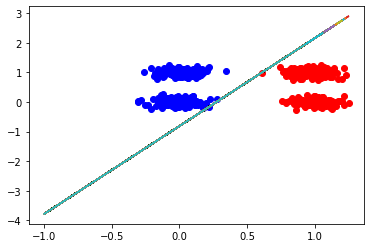

In [12]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Segunda configuração

In [13]:
vEpoca = []
vAjuste = []   
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.37683997 0.94943893 0.03636859]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.37683997 0.94943893 0.03636859]
quantidade de vezes que o peso foi ajustado:  0


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.05411365  0.19773724  0.0161854 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.05411365  0.62588415 -0.03444384]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.34588635 0.60123291 0.0152588 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.34588635 0.60123291 0.0152588 ]
quantidade de vezes que o peso foi ajustado:  3


Rodada  3
Epoch: 1 #################################

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.5400219  1.02539061 0.15889578]
quantidade de vezes que o peso foi ajustado:  9


Rodada  14
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.27264017  0.70996686  0.26859381]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.12735983 0.9907163  0.12012403]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.52735983 0.91159993 0.14816696]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.52735983 0.91159993 0.14816696]
quantidade de vezes que o peso foi ajustado:  4


Rodada  15
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.14087675 -0.30699779 -0.11202614]
quantidade de exemplos corretos:  599
quantidade d

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.31037503  1.10467815 -0.03682834]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.31037503  1.26938732 -0.43747662]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.31037503 1.52825866 0.07248309]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.71037503 1.44115036 0.13657123]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.71037503 1.44115036 0.13657123]
quantidade de vezes que o peso foi ajustado:  8


Rodada  29
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.86485755  

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.65302824 1.0513142  0.15472691]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.65302824 1.0513142  0.15472691]
quantidade de vezes que o peso foi ajustado:  8


Rodada  39
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.81943873 -0.18879225 -0.76094152]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.38056127  0.99673166 -0.54599079]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [1.94387316e-02 1.30355932e+00 2.65367153e-05]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.41943873  1.4784284  -0.07540689]
quantidade de exemplos corretos:  598


Vetor de pesos na época  1 : [ 0.92662502 -0.44162238 -0.71414371]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.27337498  0.74390153 -0.49919297]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.12662502  0.98037908 -0.39531027]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.12662502  1.2386959  -0.07268061]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.52662502  1.15957953 -0.04463768]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.52662502  1.15957953 -0.04463768]
quantidade de vezes que o peso foi ajustado:  9


Rodada  50
Epoch: 1 #

quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.46521128  1.219213   -0.02316292]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.46521128  1.219213   -0.02316292]
quantidade de vezes que o peso foi ajustado:  4


Rodada  65
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.26171351 0.92314178 0.84523122]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.66171351 1.26724225 0.26206334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.66171351  1.46957454 -0.1315223 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.66171351  1.46957454 -0.1315223 ]
quantidade de vezes que o peso foi ajustado:  5


Rodada  66
Epoch: 1

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.1244251   0.97518201 -0.27410886]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.2755749   0.95053078 -0.22440623]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.2755749   0.95053078 -0.22440623]
quantidade de vezes que o peso foi ajustado:  3


Rodada  79
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.07177453 -0.62156797 -0.2332205 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.32822547  0.27682947 -0.23131359]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.0

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.66763391 1.04233977 0.07576712]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.66763391 1.04233977 0.07576712]
quantidade de vezes que o peso foi ajustado:  6


Rodada  93
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.66705219 -0.45186738  0.16068039]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.26705219  0.48161206  0.19667307]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.13294781 0.79948414 0.10937702]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.53294781 0.

# Gráfico 2

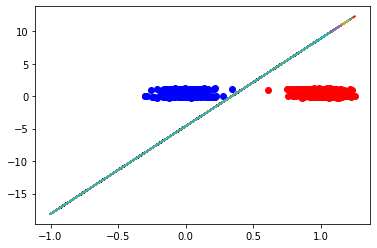

In [14]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Terceira configuração

In [15]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.4)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.13846026  0.21066135  0.39558221]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.26153974  0.56949998 -0.05002071]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.26153974  0.56949998 -0.05002071]
quantidade de vezes que o peso foi ajustado:  3


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.36911359 -0.47574736  0.14217182]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.43088641  0.32184084 -0.06847016]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.03088641  0.735487   -0.06865628]
quantidade de exemplos corretos:

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.03635347  0.18577602  0.10071902]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.03635347  0.61392293  0.05008979]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.36364653 0.58927169 0.09979242]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.36364653 0.58927169 0.09979242]
quantidade de vezes que o peso foi ajustado:  5


Rodada  16
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.19538059  0.36388133 -0.24011244]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.1953805

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.43462124  0.83237781 -0.03917019]
quantidade de vezes que o peso foi ajustado:  5


Rodada  27
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.08121488  0.25227764 -0.2051854 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.08121488  0.68042455 -0.25581464]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.08121488  0.96239927  0.19580389]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.31878512  1.17106179 -0.13039266]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.31878512  1.17106179 -0.13039266]
quantidade de vezes que o

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.32041894 1.36737179 0.40061665]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.72041894  1.48061497 -0.0302844 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.72041894  1.48061497 -0.0302844 ]
quantidade de vezes que o peso foi ajustado:  12


Rodada  40
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.12727695 -0.12746765 -0.00303818]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.27272305  0.32533049 -0.10337006]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.127

Vetor de pesos na época  1 : [-0.32185227  0.08091057 -0.00775723]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.32185227  0.50905748 -0.05838647]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.07814773  0.85808802 -0.08097277]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.07814773 1.02366719 0.33750513]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.47814773  1.2705351  -0.00872973]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.47814773  1.2705351  -0.00872973]
quantidade de vezes que o peso foi ajustado:  10


Rodada  54
Epoch: 1 ###

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.08151605  0.61837092 -0.18175658]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.08151605  0.87949971 -0.12757651]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.08151605 1.09862458 0.3725985 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.48151605 1.29044508 0.03180488]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.48151605 1.29044508 0.03180488]
quantidade de vezes que o peso foi ajustado:  10


Rodada  67
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.25965761 

Vetor de pesos na época  4 : [0.53186633 0.84666091 0.14286261]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.53186633 0.84666091 0.14286261]
quantidade de vezes que o peso foi ajustado:  5


Rodada  79
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.48097118 -0.45075139  0.26505811]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.31902882  0.39733932  0.18542213]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.08097118 0.78609684 0.04693058]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.48097118 0.70698047 0.07497351]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.48097

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.37543576 0.59321187 0.15029524]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.37543576 0.59321187 0.15029524]
quantidade de vezes que o peso foi ajustado:  6


Rodada  92
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.06746192  0.20629038 -0.24130462]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.06746192  0.57198022 -0.27754836]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.06746192  0.88757415 -0.20170859]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.06746192

# Gráfico 3

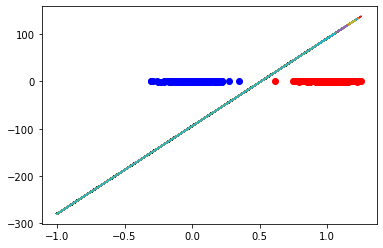

In [16]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Quarta configuração

In [17]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 26.21226707 -90.97464705 -13.3702439 ]
quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 2 #################################
Vetor de pesos na época  2 : [ -3.58773293 -61.09861544   1.68403782]
quantidade de exemplos corretos:  212
quantidade de exemplos errados:  388

Epoch: 3 #################################
Vetor de pesos na época  3 : [-21.78773293 -31.65660823  12.14622424]
quantidade de exemplos corretos:  168
quantidade de exemplos errados:  432

Epoch: 4 #################################
Vetor de pesos na época  4 : [-13.38773293 -13.83149775   3.39350709]
quantidade de exemplos corretos:  346
quantidade de exemplos errados:  254

Epoch: 5 #################################
Vetor de pesos na época  5 : [-5.38773293 -4.53839386  0.72408961]
quantidade de exemplos corretos:  502
quantidade de exemplos errados:  98

Epoch: 6 #################################
Vetor 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 14 #################################
Vetor de pesos na época  14 : [26.10680015 55.46026311 10.55599631]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 15 #################################
Vetor de pesos na época  15 : [26.20680015 55.42578489 10.45106562]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 16 #################################
Vetor de pesos na época  16 : [26.30680015 55.39130668 10.34613492]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17 #################################
Vetor de pesos na época  17 : [26.40680015 55.35682846 10.24120423]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 18 #################################
Vetor de pesos na época  18 : [26.50680015 55.32235024 10.13627354]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 27 #################################
Vetor de pesos na época  27 : [18.56851882 75.24481396 -8.81344205]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 28 #################################
Vetor de pesos na época  28 : [18.66851882 75.21724525 -8.82260876]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 29 #################################
Vetor de pesos na época  29 : [18.76851882 75.18967654 -8.83177546]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 30 #################################
Vetor de pesos na época  30 : [18.86851882 75.16210784 -8.84094216]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 31 #################################
Vetor de pesos na época  31 : [18.96851882 75.13453913 -8.85010886]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 11 #################################
Vetor de pesos na época  11 : [  8.54569439  38.70567221 -19.92947406]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 12 #################################
Vetor de pesos na época  12 : [  8.94569439  38.72859802 -19.62471402]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 13 #################################
Vetor de pesos na época  13 : [  9.34569439  38.75152384 -19.31995398]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 14 #################################
Vetor de pesos na época  14 : [  9.64569439  38.79422874 -19.02220467]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 15 #################################
Vetor de pesos na época  15 : [  9.84569439  38.85439275 -18.73984854]
quantidade de exemplos corretos:  596
quantidade de ex

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [24.42454572 31.88829673 14.49189965]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 19 #################################
Vetor de pesos na época  19 : [24.42454572 31.94001602 14.35939143]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 20 #################################
Vetor de pesos na época  20 : [24.42454572 31.99173532 14.22688321]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [24.42454572 32.04345462 14.09437499]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [24.42454572 32.09517391 13.96186677]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  504
quantidade de exemplos errados:  96

Epoch: 4 #################################
Vetor de pesos na época  4 : [11.17944635 88.27193804  1.42320194]
quantidade de exemplos corretos:  573
quantidade de exemplos errados:  27

Epoch: 5 #################################
Vetor de pesos na época  5 : [13.87944635 87.77765824  0.16545539]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 6 #################################
Vetor de pesos na época  6 : [15.27944635 87.47972013 -0.30165146]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 7 #################################
Vetor de pesos na época  7 : [16.27944635 87.25199961 -0.72095966]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 8 #################################
Vetor de pesos na época  8 : [17.17944635 87.04264078 -1.1554086 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Ep

Vetor de pesos na época  19 : [63.21664378 79.86393477 42.41532501]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 20 #################################
Vetor de pesos na época  20 : [63.11664378 80.10616828 42.0489342 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 21 #################################
Vetor de pesos na época  21 : [63.01664378 80.34840179 41.68254338]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 22 #################################
Vetor de pesos na época  22 : [62.91664378 80.59063529 41.31615257]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 23 #################################
Vetor de pesos na época  23 : [62.91664378 80.75384519 40.95132758]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 24 #################################
Vetor de pesos na época  24 : [62.91664378 80.91705509 40.5865026 ]
qu

quantidade de exemplos corretos:  371
quantidade de exemplos errados:  229

Epoch: 4 #################################
Vetor de pesos na época  4 : [-26.64337395  -4.50975118 -18.3609503 ]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 5 #################################
Vetor de pesos na época  5 : [-16.24337395   0.19825584 -13.54982573]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 6 #################################
Vetor de pesos na época  6 : [-6.24337395  5.13947611 -9.02092779]
quantidade de exemplos corretos:  497
quantidade de exemplos errados:  103

Epoch: 7 #################################
Vetor de pesos na época  7 : [-1.14337395  7.45254321 -5.94518687]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 0.85662605  8.04636556 -4.54106993]
quantidade de exemplos corretos:  584
quantidade de exemplos erra

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 40 #################################
Vetor de pesos na época  40 : [  8.03489119  31.20304839 -11.18212507]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 41 #################################
Vetor de pesos na época  41 : [  8.13489119  31.18127132 -11.16610304]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [  8.13489119  31.22066813 -11.05247226]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 43 #################################
Vetor de pesos na época  43 : [  8.23489119  31.19889105 -11.03645022]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [  8.23489119  31.23828786 -10.92281944]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 20.92614116  83.11129791 -31.07777473]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 20.92614116  83.15069472 -30.96414396]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 20.92614116  83.19009153 -30.85051318]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 20.92614116  83.22948834 -30.7368824 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 20.92614116  83.26888515 -30.62325162]
quantidade de exemplos corretos:  599
quantidade de exe

Vetor de pesos na época  12 : [60.88630745 78.00804726 12.26260507]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 13 #################################
Vetor de pesos na época  13 : [60.68630745 78.14487665 12.36498244]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [60.48630745 78.28170604 12.46735981]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [60.28630745 78.41853544 12.56973717]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 16 #################################
Vetor de pesos na época  16 : [60.18630745 78.49419095 12.5745058 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17 #################################
Vetor de pesos na época  17 : [60.08630745 78.56984646 12.57927442]
qu

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 6.24154471 23.29310965 -8.14328865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 6.24154471 23.33250646 -8.02965787]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 6.34154471 23.31072938 -8.01363584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 6.34154471 23.35012619 -7.90000506]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 6.44154471 23.32834912 -7.88398302]
quantidade de exemplos corretos:  600
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 15 #################################
Vetor de pesos na época  15 : [68.04303927 97.36652127 39.09384864]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 16 #################################
Vetor de pesos na época  16 : [68.14303927 97.33204305 38.98891794]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 17 #################################
Vetor de pesos na época  17 : [68.24303927 97.29756483 38.88398725]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 18 #################################
Vetor de pesos na época  18 : [68.34303927 97.26308661 38.77905656]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 19 #################################
Vetor de pesos na época  19 : [68.44303927 97.22860839 38.67412586]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 29.13150286  71.84975989 -15.67811258]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 29.03150286  71.91093378 -15.58050384]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 28.93150286  71.97210766 -15.4828951 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 28.83150286  72.03328154 -15.38528636]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 28.83150286  72.03328154 -15.38528636]
quantidade de vezes que o peso foi ajustado:  392


Rodada  23
Epoch: 1 #################################
Vetor de 

Vetor de pesos na época  4 : [-59.67547043  -6.07958246 -47.01096064]
quantidade de exemplos corretos:  369
quantidade de exemplos errados:  231

Epoch: 5 #################################
Vetor de pesos na época  5 : [-48.77547043   0.1085146  -42.14808553]
quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 6 #################################
Vetor de pesos na época  6 : [-38.47547043   4.95730636 -36.99577496]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 7 #################################
Vetor de pesos na época  7 : [-28.17547043   9.65070557 -31.90415807]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 8 #################################
Vetor de pesos na época  8 : [-17.97547043  14.3811711  -26.77853448]
quantidade de exemplos corretos:  407
quantidade de exemplos errados:  193

Epoch: 9 #################################
Vetor de pesos na época  9 : [ -8.07547043  18.93026197

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 16 #################################
Vetor de pesos na época  16 : [37.96592594 48.72355567 24.84860059]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 17 #################################
Vetor de pesos na época  17 : [37.96592594 48.88676556 24.48377561]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 18 #################################
Vetor de pesos na época  18 : [37.96592594 49.04997546 24.11895062]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 19 #################################
Vetor de pesos na época  19 : [38.06592594 49.13752985 23.74935701]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 20 #################################
Vetor de pesos na época  20 : [38.06592594 49.24632135 23.49406251]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 26 #################################
Vetor de pesos na época  26 : [44.8743858  58.11623244 27.44524155]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 27 #################################
Vetor de pesos na época  27 : [44.8743858  58.22502394 27.18994705]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 28 #################################
Vetor de pesos na época  28 : [44.8743858  58.33381544 26.93465255]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [44.8743858  58.38553474 26.80214433]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [44.8743858  58.43725404 26.66963611]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 4.33441237 17.45362884 -6.95708516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [ 4.33441237 17.49302565 -6.84345438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 4.33441237 17.53242245 -6.7298236 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 4.33441237 17.57181926 -6.61619283]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 4.33441237 17.61121607 -6.50256205]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 85.12327342 104.71887911  62.37023901]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 85.22327342 104.92737043  61.77810167]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 85.32327342 105.13586174  61.18596433]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 85.42327342 105.34435305  60.59382698]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 85.42327342 105.57338037  60.10692212]
quantidade de exemplos corretos:  592
quantidade de ex

Vetor de pesos na época  68 : [ 84.82327342 111.18956896  48.16421344]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 84.82327342 111.24128826  48.03170522]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 84.82327342 111.29300755  47.899197  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 84.82327342 111.34472685  47.76668878]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 84.82327342 111.39644614  47.63418056]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 84.82327342 111.4481654

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 28 #################################
Vetor de pesos na época  28 : [42.40164104 92.22556829 16.53096466]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 29 #################################
Vetor de pesos na época  29 : [42.50164104 92.19109007 16.42603396]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 30 #################################
Vetor de pesos na época  30 : [42.60164104 92.15661185 16.32110327]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 31 #################################
Vetor de pesos na época  31 : [42.70164104 92.12213363 16.21617257]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 32 #################################
Vetor de pesos na época  32 : [42.80164104 92.08765541 16.11124188]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 80.30945144 104.61941417  47.21555783]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 80.30945144 104.67113347  47.08304961]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 80.30945144 104.72285277  46.95054139]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 80.30945144 104.77457206  46.81803318]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 80.30945144 104.82629136  46.68552496]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 14 #################################
Vetor de pesos na época  14 : [  7.54725405  30.08396422 -14.23140317]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 15 #################################
Vetor de pesos na época  15 : [  7.54725405  30.18036839 -13.98033435]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 16 #################################
Vetor de pesos na época  16 : [  7.54725405  30.27677257 -13.72926553]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 17 #################################
Vetor de pesos na época  17 : [  7.54725405  30.37317674 -13.47819671]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 18 #################################
Vetor de pesos na época  18 : [  7.54725405  30.46958092 -13.2271279 ]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 45.85954019 100.94762097 -27.52651398]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 45.65954019 101.08335517 -27.31087222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 45.45954019 101.21908936 -27.09523046]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 45.25954019 101.35482356 -26.8795887 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 45.05954019 101.49055775 -26.66394694]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 14 #################################
Vetor de pesos na época  14 : [12.25192296 16.11346628  7.03070365]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 15 #################################
Vetor de pesos na época  15 : [12.25192296 16.16518558  6.89819543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [12.25192296 16.21690487  6.76568721]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [12.25192296 16.26862417  6.633179  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 18 #################################
Vetor de pesos na época  18 : [12.25192296 16.32034346  6.50067078]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 14 #################################
Vetor de pesos na época  14 : [  5.80056223  23.35071358 -10.55890324]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 15 #################################
Vetor de pesos na época  15 : [  5.80056223  23.44711776 -10.30783443]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 16 #################################
Vetor de pesos na época  16 : [  5.80056223  23.54352193 -10.05676561]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 5.80056223 23.63992611 -9.80569679]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 5.90056223 23.66176997 -9.67266099]
quantidade de exemplos corretos:  597
quantidade de exemplos 

Vetor de pesos na época  37 : [ 14.97021502  60.09245347 -25.89115747]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 14.97021502  60.18885764 -25.64008865]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 14.97021502  60.28526182 -25.38901983]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 14.97021502  60.381666   -25.13795102]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 15.07021502  60.40350986 -25.00491522]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 15.17021502  60.4253537

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 8.95622934 11.37501367  6.36675272]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 8.95622934 11.59671117  5.89512943]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 8.95622934 11.75992107  5.53030444]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 9.05622934 11.78966442  5.27920528]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 9.05622934 11.84138372  5.14669706]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Vetor de pesos na época  36 : [  9.13195033  36.49555395 -13.92971339]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 37 #################################
Vetor de pesos na época  37 : [  9.13195033  36.53495076 -13.81608261]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 38 #################################
Vetor de pesos na época  38 : [  9.13195033  36.57434757 -13.70245183]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 39 #################################
Vetor de pesos na época  39 : [  9.13195033  36.61374438 -13.58882106]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 40 #################################
Vetor de pesos na época  40 : [  9.13195033  36.65314118 -13.47519028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 41 #################################
Vetor de pesos na época  41 : [  9.23195033  36.6313641

Epoch: 7 #################################
Vetor de pesos na época  7 : [46.37881104 55.69696847 37.35853312]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 8 #################################
Vetor de pesos na época  8 : [46.47881104 56.27309124 36.17944673]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 9 #################################
Vetor de pesos na época  9 : [46.37881104 56.8014299  35.32517864]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 10 #################################
Vetor de pesos na época  10 : [46.47881104 57.15223696 34.49285527]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 11 #################################
Vetor de pesos na época  11 : [46.57881104 57.36072827 33.90071793]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 12 #################################
Vetor de pesos na época  12 :

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 15 #################################
Vetor de pesos na época  15 : [64.43731314 79.40891855 46.47615135]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 16 #################################
Vetor de pesos na época  16 : [64.53731314 79.61740986 45.884014  ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 17 #################################
Vetor de pesos na época  17 : [64.63731314 79.82590117 45.29187666]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 18 #################################
Vetor de pesos na época  18 : [64.63731314 80.05492849 44.8049718 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 19 #################################
Vetor de pesos na época  19 : [64.53731314 80.297162   44.43858098]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 78 #################################
Vetor de pesos na época  78 : [64.23731314 85.26818331 33.09409617]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [64.23731314 85.26818331 33.09409617]
quantidade de vezes que o peso foi ajustado:  1265


Rodada  47
Epoch: 1 #################################
Vetor de pesos na época  1 : [-22.14394895  73.4183882   37.59535555]
quantidade de exemplos corretos:  311
quantidade de exemplos errados:  289

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 6.75605105 73.19518646 22.49394337]
quantidade de exemplos corretos:  482
quantidade de exemplos errados:  118

Epoch: 3 #################################
Vetor de pesos na época  3 : [18.55605105 72.29527344 12.77105327]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 4 #################################
Vetor de pesos na épo

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 3.50270622 14.54973261 -6.31498319]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 3.50270622 14.64613679 -6.06391437]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 3.60270622 14.66798066 -5.93087857]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 3.70270622 14.68982452 -5.79784277]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 3.70270622 14.72922133 -5.68421199]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 21 #################################
Vetor de pesos na época  21 : [17.55739956 23.27297834  9.41580925]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 22 #################################
Vetor de pesos na época  22 : [17.55739956 23.32469764  9.28330103]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 23 #################################
Vetor de pesos na época  23 : [17.55739956 23.37641694  9.15079281]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 24 #################################
Vetor de pesos na época  24 : [17.55739956 23.42813623  9.01828459]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [17.55739956 23.42813623  9.01828459]
quantidade de vezes que o peso foi ajustado:  1089


Rodada  51
Epoch: 1 #################################
Vetor de pesos na época

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 29.13246073 116.0731128  -48.18286539]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 54 #################################
Vetor de pesos na época  54 : [ 29.23246073 116.09495667 -48.04982959]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 29.33246073 116.11680053 -47.91679379]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 56 #################################
Vetor de pesos na época  56 : [ 29.43246073 116.1386444  -47.78375799]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 57 #################################
Vetor de pesos na época  57 : [ 29.53246073 116.16048827 -47.65072219]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 30.63246073 117.69379681 -42.3610948 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 30.63246073 117.73319362 -42.24746402]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 30.73246073 117.71141655 -42.23144199]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 30.73246073 117.75081336 -42.11781121]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 30.83246073 117.72903628 -42.10178917]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 15 #################################
Vetor de pesos na época  15 : [57.71896249 78.96039576 35.52635823]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 16 #################################
Vetor de pesos na época  16 : [57.91896249 78.9039416  35.30283659]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 17 #################################
Vetor de pesos na época  17 : [58.11896249 78.84748744 35.07931495]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 18 #################################
Vetor de pesos na época  18 : [58.21896249 78.8772308  34.82821579]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 19 #################################
Vetor de pesos na época  19 : [58.31896249 78.90697415 34.57711663]
quantidade de exemplos corretos:  597
quantidade de exemplos errados: 

Vetor de pesos na época  23 : [ 12.37551627  49.0164621  -22.50454017]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 12.37551627  49.11286628 -22.25347135]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 12.37551627  49.20927046 -22.00240253]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 12.37551627  49.30567463 -21.75133372]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 12.37551627  49.40207881 -21.5002649 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 12.37551627  49.4984829

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 7 #################################
Vetor de pesos na época  7 : [73.45385759 95.78567834 54.21442206]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 8 #################################
Vetor de pesos na época  8 : [73.95385759 95.80839481 53.39572364]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 9 #################################
Vetor de pesos na época  9 : [74.25385759 95.86220701 52.80038351]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 10 #################################
Vetor de pesos na época  10 : [74.55385759 95.9160192  52.20504337]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 11 #################################
Vetor de pesos na época  11 : [74.85385759 95.96983139 51.60970323]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Ep

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 67 #################################
Vetor de pesos na época  67 : [ 75.55385759 100.02752857  40.61187296]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 68 #################################
Vetor de pesos na época  68 : [ 75.55385759 100.07924787  40.47936474]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 75.55385759 100.13096716  40.34685652]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 75.55385759 100.18268646  40.21434831]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 75.55385759 100.23440575  40.08184009]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 14.22997536  55.32149832 -20.03581771]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 14.22997536  55.36089513 -19.92218693]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 14.32997536  55.33911806 -19.9061649 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 64 #################################
Vetor de pesos na época  64 : [ 14.32997536  55.37851487 -19.79253412]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 14.42997536  55.35673779 -19.77651208]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 24.13097898 101.80115082 -51.49097027]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 24.43097898 101.84385572 -51.19322096]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 24.73097898 101.88656063 -50.89547166]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 25.03097898 101.92926553 -50.59772235]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 25.33097898 101.97197044 -50.29997304]
quantidade de exemplos corretos:  594
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [ 26.63097898 105.62545066 -39.5686679 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #################################
Vetor de pesos na época  95 : [ 26.63097898 105.66484747 -39.45503712]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 96 #################################
Vetor de pesos na época  96 : [ 26.63097898 105.70424428 -39.34140635]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 97 #################################
Vetor de pesos na época  97 : [ 26.63097898 105.74364109 -39.22777557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 98 #################################
Vetor de pesos na época  98 : [ 26.63097898 105.7830379  -39.11414479]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  533
quantidade de exemplos errados:  67

Epoch: 12 #################################
Vetor de pesos na época  12 : [  0.95530595  18.58228401 -12.53124644]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 13 #################################
Vetor de pesos na época  13 : [  2.45530595  19.00632106 -11.28274058]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 14 #################################
Vetor de pesos na época  14 : [  3.45530595  19.22698194 -10.45128464]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 15 #################################
Vetor de pesos na época  15 : [  4.05530595  19.27115232 -10.03112185]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 4.45530595 19.35100023 -9.62181577]
quantidade de exemplos corretos:  593
quantidade de e

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 17 #################################
Vetor de pesos na época  17 : [  6.44348389  25.96489427 -12.0232326 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 18 #################################
Vetor de pesos na época  18 : [  6.44348389  26.06129845 -11.77216378]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 19 #################################
Vetor de pesos na época  19 : [  6.44348389  26.15770262 -11.52109497]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 20 #################################
Vetor de pesos na época  20 : [  6.44348389  26.2541068  -11.27002615]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 21 #################################
Vetor de pesos na época  21 : [  6.44348389  26.35051098 -11.01895733]
quantidade de exemplos corretos:  597
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [39.61532982 51.50798219 23.65637023]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 30 #################################
Vetor de pesos na época  30 : [39.61532982 51.55970148 23.52386201]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [39.61532982 51.61142078 23.39135379]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 32 #################################
Vetor de pesos na época  32 : [39.61532982 51.66314008 23.25884557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 33 #################################
Vetor de pesos na época  33 : [39.61532982 51.71485937 23.12633735]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 36 #################################
Vetor de pesos na época  36 : [  9.78419933  38.83859566 -15.18197865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 37 #################################
Vetor de pesos na época  37 : [  9.78419933  38.87799247 -15.06834787]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 38 #################################
Vetor de pesos na época  38 : [  9.78419933  38.91738928 -14.9547171 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 39 #################################
Vetor de pesos na época  39 : [  9.78419933  38.95678609 -14.84108632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 40 #################################
Vetor de pesos na época  40 : [  9.78419933  38.99618289 -14.72745554]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 32 #################################
Vetor de pesos na época  32 : [42.36239656 93.37367359 15.60706734]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 33 #################################
Vetor de pesos na época  33 : [42.46239656 93.33919538 15.50213665]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 34 #################################
Vetor de pesos na época  34 : [42.56239656 93.30471716 15.39720595]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 35 #################################
Vetor de pesos na época  35 : [42.66239656 93.27023894 15.29227526]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 36 #################################
Vetor de pesos na época  36 : [42.76239656 93.23576072 15.18734456]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 27 #################################
Vetor de pesos na época  27 : [  7.16276499  28.63682394 -10.74543684]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 28 #################################
Vetor de pesos na época  28 : [  7.16276499  28.67622075 -10.63180607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 29 #################################
Vetor de pesos na época  29 : [  7.16276499  28.71561755 -10.51817529]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 30 #################################
Vetor de pesos na época  30 : [  7.26276499  28.69384048 -10.50215325]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 31 #################################
Vetor de pesos na época  31 : [  7.26276499  28.73323729 -10.38852248]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 12 #################################
Vetor de pesos na época  12 : [31.45433561 39.04552647 21.64380533]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 13 #################################
Vetor de pesos na época  13 : [31.35433561 39.28775998 21.27741452]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 14 #################################
Vetor de pesos na época  14 : [31.25433561 39.52999349 20.9110237 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 15 #################################
Vetor de pesos na época  15 : [31.15433561 39.772227   20.54463289]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 16 #################################
Vetor de pesos na época  16 : [31.05433561 40.01446051 20.17824207]
quantidade de exemplos corretos:  594
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 25 #################################
Vetor de pesos na época  25 : [42.28541233 71.82385069 20.63156909]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 26 #################################
Vetor de pesos na época  26 : [42.38541233 71.78937247 20.52663839]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 27 #################################
Vetor de pesos na época  27 : [42.48541233 71.75489425 20.4217077 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 28 #################################
Vetor de pesos na época  28 : [42.58541233 71.72041603 20.316777  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 29 #################################
Vetor de pesos na época  29 : [42.68541233 71.68593781 20.21184631]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 15 #################################
Vetor de pesos na época  15 : [24.64298606 31.89251664 15.95196511]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 16 #################################
Vetor de pesos na época  16 : [24.74298606 31.98007103 15.5823715 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 17 #################################
Vetor de pesos na época  17 : [24.74298606 32.08886253 15.327077  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 18 #################################
Vetor de pesos na época  18 : [24.74298606 32.19765403 15.0717825 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 19 #################################
Vetor de pesos na época  19 : [24.84298606 32.22739739 14.82068333]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  407
quantidade de exemplos errados:  193

Epoch: 6 #################################
Vetor de pesos na época  6 : [ -6.60320873  12.63797025 -15.3132979 ]
quantidade de exemplos corretos:  483
quantidade de exemplos errados:  117

Epoch: 7 #################################
Vetor de pesos na época  7 : [ -0.90320873  15.11944699 -11.71482424]
quantidade de exemplos corretos:  551
quantidade de exemplos errados:  49

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 1.39679127 15.8701408  -9.9471526 ]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 2.69679127 16.21830373 -8.85456387]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 3.39679127 16.24853342 -8.424779  ]
quantidade de exemplos corretos:  590
quantidade de exemplos erra

quantidade de exemplos corretos:  347
quantidade de exemplos errados:  253

Epoch: 5 #################################
Vetor de pesos na época  5 : [-31.09370786  15.12243316 -41.29949908]
quantidade de exemplos corretos:  395
quantidade de exemplos errados:  205

Epoch: 6 #################################
Vetor de pesos na época  6 : [-21.59370786  20.52325936 -35.3999572 ]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 7 #################################
Vetor de pesos na época  7 : [-11.49370786  25.14399814 -30.18890117]
quantidade de exemplos corretos:  442
quantidade de exemplos errados:  158

Epoch: 8 #################################
Vetor de pesos na época  8 : [ -3.49370786  28.54418249 -25.66095599]
quantidade de exemplos corretos:  510
quantidade de exemplos errados:  90

Epoch: 9 #################################
Vetor de pesos na época  9 : [  0.50629214  30.28369634 -22.47917578]
quantidade de exemplos corretos:  546
quantidade de exem

quantidade de exemplos corretos:  301
quantidade de exemplos errados:  299

Epoch: 4 #################################
Vetor de pesos na época  4 : [-0.68823506 66.18409076 37.16243811]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 5 #################################
Vetor de pesos na época  5 : [18.91176494 65.44256026 22.41903059]
quantidade de exemplos corretos:  544
quantidade de exemplos errados:  56

Epoch: 6 #################################
Vetor de pesos na época  6 : [24.51176494 64.87225081 16.75838465]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 7 #################################
Vetor de pesos na época  7 : [25.91176494 64.62339075 15.26965453]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 8 #################################
Vetor de pesos na época  8 : [26.61176494 64.47785361 14.49724657]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4



quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 17 #################################
Vetor de pesos na época  17 : [58.27811894 73.16687279 39.70294048]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 18 #################################
Vetor de pesos na época  18 : [58.17811894 73.4091063  39.33654966]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 19 #################################
Vetor de pesos na época  19 : [58.07811894 73.65133981 38.97015885]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 20 #################################
Vetor de pesos na época  20 : [57.97811894 73.89357331 38.60376803]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 21 #################################
Vetor de pesos na época  21 : [57.87811894 74.13580682 38.23737722]
quantidade de exemplos corretos:  594
quantidade de exemplos errados: 

pesos final:  [58.17811894 77.27461899 29.98270768]
quantidade de vezes que o peso foi ajustado:  705


Rodada  79
Epoch: 1 #################################
Vetor de pesos na época  1 : [-95.86015564  38.90813403  64.69922326]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [-65.86015564  38.9056647   49.5748451 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 3 #################################
Vetor de pesos na época  3 : [-35.86015564  38.90319537  34.45046695]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 4 #################################
Vetor de pesos na época  4 : [-5.86015564 38.90072604 19.3260888 ]
quantidade de exemplos corretos:  412
quantidade de exemplos errados:  188

Epoch: 5 #################################
Vetor de pesos na época  5 : [12.93984436 38.06605214  8.60199154]
quantidade de exemplos

Vetor de pesos na época  15 : [  6.45171701  26.24269937 -12.80843713]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 16 #################################
Vetor de pesos na época  16 : [  6.55171701  26.32122506 -12.54122174]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 17 #################################
Vetor de pesos na época  17 : [  6.55171701  26.41762924 -12.29015292]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 18 #################################
Vetor de pesos na época  18 : [  6.55171701  26.51403341 -12.03908411]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 19 #################################
Vetor de pesos na época  19 : [  6.55171701  26.61043759 -11.78801529]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 20 #################################
Vetor de pesos na época  20 : [  6.55171701  26.7068417

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 55.54236007 114.83784157 -21.35307242]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 55.44236007 114.89901546 -21.25546368]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 55.34236007 114.96018934 -21.15785493]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 55.24236007 115.02136323 -21.06024619]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 55.14236007 115.08253711 -20.96263745]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 28 #################################
Vetor de pesos na época  28 : [19.38138619 76.33084455 -7.31184162]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 29 #################################
Vetor de pesos na época  29 : [19.48138619 76.30327585 -7.32100832]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 30 #################################
Vetor de pesos na época  30 : [19.58138619 76.27570714 -7.33017502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 31 #################################
Vetor de pesos na época  31 : [19.68138619 76.24813843 -7.33934172]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 32 #################################
Vetor de pesos na época  32 : [19.78138619 76.22056973 -7.34850842]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 51 #################################
Vetor de pesos na época  51 : [46.59757622 61.5892481  25.311978  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 52 #################################
Vetor de pesos na época  52 : [46.59757622 61.6409674  25.17946978]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 53 #################################
Vetor de pesos na época  53 : [46.59757622 61.69268669 25.04696156]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 54 #################################
Vetor de pesos na época  54 : [46.59757622 61.74440599 24.91445334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 55 #################################
Vetor de pesos na época  55 : [46.59757622 61.79612529 24.78194512]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

Vetor de pesos na época  27 : [ 17.33932042  68.41115129 -33.1280456 ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 17.43932042  68.48967699 -32.86083021]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 17.43932042  68.58608116 -32.6097614 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 17.43932042  68.68248534 -32.35869258]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 17.43932042  68.77888951 -32.10762376]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 17.43932042  68.8752936

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 18.93932042  70.96547151 -24.97748903]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 18.93932042  71.00486832 -24.86385825]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 19.03932042  70.98309124 -24.84783622]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 19.13932042  70.96131417 -24.83181418]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 19.13932042  71.00071098 -24.71818341]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  484
quantidade de exemplos errados:  116

Epoch: 7 #################################
Vetor de pesos na época  7 : [18.46517106 22.30215881 18.54669188]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 8 #################################
Vetor de pesos na época  8 : [19.26517106 23.34678291 15.92284582]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 9 #################################
Vetor de pesos na época  9 : [19.36517106 23.85231197 14.86000885]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 10 #################################
Vetor de pesos na época  10 : [19.36517106 24.14803106 14.25870891]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 11 #################################
Vetor de pesos na época  11 : [19.46517106 24.35652237 13.66657157]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 12.33740854  49.55416364 -20.46458703]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 12.43740854  49.57600751 -20.33155123]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 40 #################################
Vetor de pesos na época  40 : [ 12.53740854  49.59785137 -20.19851543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [ 12.53740854  49.63724818 -20.08488465]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 12.53740854  49.67664499 -19.97125387]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 19 #################################
Vetor de pesos na época  19 : [47.33430788 59.40633651 32.10285778]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 20 #################################
Vetor de pesos na época  20 : [47.23430788 59.64857002 31.73646697]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 21 #################################
Vetor de pesos na época  21 : [47.13430788 59.89080353 31.37007615]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 22 #################################
Vetor de pesos na época  22 : [47.03430788 60.13303704 31.00368534]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 23 #################################
Vetor de pesos na época  23 : [46.93430788 60.37527055 30.63729452]
quantidade de exemplos corretos:  594
quantidade de exemplos errados: 

quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 8 #################################
Vetor de pesos na época  8 : [25.85446898 31.28416426 20.76646547]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 9 #################################
Vetor de pesos na época  9 : [25.85446898 31.79517585 19.81345395]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 10 #################################
Vetor de pesos na época  10 : [25.95446898 32.07411833 19.10205676]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 11 #################################
Vetor de pesos na época  11 : [26.05446898 32.28260964 18.50991942]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 12 #################################
Vetor de pesos na época  12 : [26.15446898 32.49110096 17.91778207]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 43 #################################
Vetor de pesos na época  43 : [52.1800274  76.20044499  4.18950645]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 44 #################################
Vetor de pesos na época  44 : [52.0800274  76.26161888  4.2871152 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 45 #################################
Vetor de pesos na época  45 : [51.9800274  76.32279276  4.38472394]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 46 #################################
Vetor de pesos na época  46 : [51.8800274  76.38396664  4.48233268]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 47 #################################
Vetor de pesos na época  47 : [51.7800274  76.44514053  4.57994142]
quantidade de exemplos corretos:  599
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 58 #################################
Vetor de pesos na época  58 : [ 22.52376852  88.58809004 -32.39051767]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 59 #################################
Vetor de pesos na época  59 : [ 22.52376852  88.62748685 -32.27688689]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 60 #################################
Vetor de pesos na época  60 : [ 22.62376852  88.60570977 -32.26086485]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 22.62376852  88.64510658 -32.14723407]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 22.72376852  88.6233295  -32.13121204]
quantidade de exemplos corretos:  599
quantidade de exe

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 15.43120021  61.3267264  -27.25629129]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 15.43120021  61.42313057 -27.00522247]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 15.43120021  61.51953475 -26.75415365]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 15.43120021  61.61593893 -26.50308483]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 15.43120021  61.7123431  -26.25201602]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 8 #################################
Vetor de pesos na época  8 : [13.53145911 16.67927041 11.07224935]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 9 #################################
Vetor de pesos na época  9 : [13.63145911 17.03802002 10.24819264]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 10 #################################
Vetor de pesos na época  10 : [13.73145911 17.24651133  9.6560553 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 11 #################################
Vetor de pesos na época  11 : [13.73145911 17.47553865  9.16915043]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 12 #################################
Vetor de pesos na época  12 : [13.63145911 17.71777216  8.80275962]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Vetor de pesos na época  51 : [ 20.48716477  80.98168908 -32.21132623]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 20.48716477  81.02108589 -32.09769545]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 20.48716477  81.0604827  -31.98406468]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 54 #################################
Vetor de pesos na época  54 : [ 20.48716477  81.09987951 -31.8704339 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 55 #################################
Vetor de pesos na época  55 : [ 20.48716477  81.13927631 -31.75680312]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 56 #################################
Vetor de pesos na época  56 : [ 20.48716477  81.1786731

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 16.73003129  87.62860469 -28.66538697]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 17.53003129  87.4684932  -28.58136832]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 14 #################################
Vetor de pesos na época  14 : [ 18.33003129  87.30838171 -28.49734967]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 19.03003129  87.16800462 -28.41739809]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 19.73003129  87.02762753 -28.33744652]
quantidade de exemplos corretos:  595
quantidade de exe

# Gráfico 4

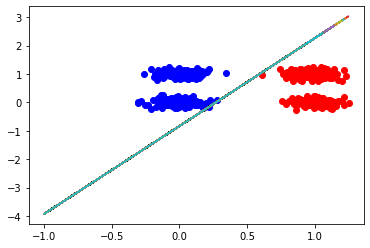

In [18]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Quinta configuraçao

In [19]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.47490723  0.77795761  0.70624806]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.62509277 0.81435488 0.25703116]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.62509277 0.81435488 0.25703116]
quantidade de vezes que o peso foi ajustado:  13


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.94549965  0.89442316  0.76232159]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.65450035 0.95140483 0.3203444 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.65450035 1.00312412 0.18783618]
quantidade de exemplos corretos:  600
qua

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.14983053  0.39335791 -0.0488204 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.14983053  0.39335791 -0.0488204 ]
quantidade de vezes que o peso foi ajustado:  27


Rodada  16
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.11053623 -0.74790033 -0.10866854]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.28946377 -0.04525495 -0.09437516]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.08946377  0.1804814   0.04607631]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.0

quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.09112054  0.13272076  0.52081951]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.10887946 0.38318703 0.25960204]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.20887946 0.42864897 0.15806405]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.30887946 0.4113219  0.05932063]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.30887946 0.4113219  0.05932063]
quantidade de vezes que o peso foi ajustado:  30


Rodada  30
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.15471479 -0

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.33673902 0.64151073 0.18326409]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.43673902 0.62027361 0.06896498]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.43673902 0.62027361 0.06896498]
quantidade de vezes que o peso foi ajustado:  7


Rodada  44
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.73535253 -0.18136619 -0.21718815]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.03535253  0.51541608 -0.05224424]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.23535253  

Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.41934408  0.50560893 -0.71529102]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.01934408  0.74646512 -0.33022476]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.18065592  0.79107136 -0.17980518]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.28065592  0.76929429 -0.16378315]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.28065592  0.76929429 -0.16378315]
quantidade de vezes que o peso foi ajustado:  15


Rodada  59
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.79527337 -0.89477059 -0.06227952]
quantidade de exemplos corretos:  583
q

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [0.21832163 0.64038519 0.0510646 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 9 #################################
Vetor de pesos na época  9 : [0.21832163 0.66708085 0.04374265]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 0.31832163  0.63260263 -0.06118805]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.31832163  0.63260263 -0.06118805]
quantidade de vezes que o peso foi ajustado:  16


Rodada  69
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.34790906 -0.91060553  0.73288629]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.147

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.27169645  0.95949635 -0.28216061]
quantidade de vezes que o peso foi ajustado:  11


Rodada  82
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.77815941 -0.2137406   0.32820952]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.02184059 0.12310154 0.13375641]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.12184059  0.21498645 -0.00325032]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.12184059  0.21498645 -0.00325032]
quantidade de vezes que o peso foi ajustado:  17


Rodada  83
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.32071393  0.17046446  0.48131718]
quantidade de exemplos corretos:  589


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.23861188  0.59016879 -0.0262446 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.23861188  0.59016879 -0.0262446 ]
quantidade de vezes que o peso foi ajustado:  28


Rodada  96
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.47079957  0.23378279  0.62646261]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.22920043 0.50639199 0.2639172 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.32920043 0.53964799 0.06677737]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.32920043 0.53964799 0.06677737]
quantidade de vezes que o peso f

# Gráfico 5

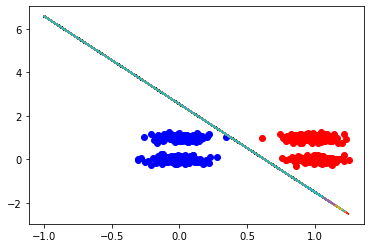

In [20]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Sexta configuração

In [21]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.1)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.02992082 -0.18394995 -0.27063455]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.17007918  0.12500771 -0.19651114]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.07007918  0.30069467 -0.01899985]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.12992082 0.27475277 0.00043654]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.12992082 0.27475277 0.00043654]
quantidade de vezes que o peso foi ajustado:  11


Rodada  2
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.45833307 -0.04657746  0.33397522]
quantidade de exemplos corretos:  596

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [-0.0199397   0.22752154  0.0880909 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.0800603  0.28909296 0.00830742]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [0.0800603  0.32269813 0.09674946]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 0.1800603   0.36477078 -0.01233611]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.1800603   0.36477078 -0.01233611]
quantidade de vezes que o peso foi ajustado:  20


Rodada  14
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.2186795

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.1043911  0.34037242 0.09878101]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.1043911  0.38421923 0.09764633]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.2043911   0.4072336  -0.00991678]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.2043911   0.4072336  -0.00991678]
quantidade de vezes que o peso foi ajustado:  19


Rodada  29
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.0604716  -0.37398025 -0.14582669]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.2395284   0.04060757 -0.02450322]
quantidade de exemplos corretos:  596
quantida

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.0869171   0.28263442 -0.07532841]
quantidade de vezes que o peso foi ajustado:  8


Rodada  38
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.01706055 -0.09009849  0.272663  ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.01706055  0.19284359  0.01743344]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.08293945  0.25102571 -0.06989762]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.08293945  0.25102571 -0.06989762]
quantidade de vezes que o peso foi ajustado:  9


Rodada  39
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.19220934 -0.46680519  0.34527999]
quantidade de exemplos corretos:  593


quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.14836679 0.45275826 0.06097236]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.14836679 0.49339614 0.05334862]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.14836679 0.53403401 0.04572488]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.24836679 0.50646531 0.03655818]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.24836679 0.50646531 0.03655818]
quantidade de vezes que o peso foi ajustado:  13


Rodada  53
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.17309483  0.206

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.26806673 0.67420803 0.08044382]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [0.26806673 0.70090369 0.07312187]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 0.36806673  0.66642547 -0.03180883]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.36806673  0.66642547 -0.03180883]
quantidade de vezes que o peso foi ajustado:  12


Rodada  64
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.29174775 -0.0436437   0.28598406]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.0082522

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.14427943  0.34853148 -0.05383023]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.14427943  0.34853148 -0.05383023]
quantidade de vezes que o peso foi ajustado:  3


Rodada  76
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.00526149 -0.17612107  0.00201207]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.10526149  0.04847829  0.0024888 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.00526149  0.15188983  0.00244227]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.09

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.02746632  0.30173374 -0.07331815]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.02746632 0.35674482 0.03671626]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.12746632  0.37814302 -0.05643508]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.12746632  0.37814302 -0.05643508]
quantidade de vezes que o peso foi ajustado:  22


Rodada  87
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.4502897  -0.23454285  0.49608295]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.0502

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.14697136 0.20221329 0.05030169]
quantidade de vezes que o peso foi ajustado:  5


Rodada  100
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.19123974 -0.16132098 -0.27161882]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.20876026  0.23698683 -0.15910233]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.00876026  0.32627043 -0.00221228]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.09123974  0.3699877  -0.02107064]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.0912

# Gráfico 6

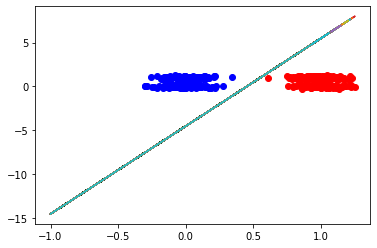

In [22]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Sétima configuração

In [23]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -100, 100, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-86.72923181  -5.41170125  40.64523326]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [-83.72923181  -5.41194818  39.13279545]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 3 #################################
Vetor de pesos na época  3 : [-80.72923181  -5.41219511  37.62035763]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 4 #################################
Vetor de pesos na época  4 : [-77.72923181  -5.41244205  36.10791982]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 5 #################################
Vetor de pesos na época  5 : [-74.72923181  -5.41268898  34.595482  ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 6 #################################
Ve

quantidade de exemplos corretos:  183
quantidade de exemplos errados:  417

Epoch: 22 #################################
Vetor de pesos na época  22 : [-32.55919255  -9.82905038 -27.73658133]
quantidade de exemplos corretos:  199
quantidade de exemplos errados:  401

Epoch: 23 #################################
Vetor de pesos na época  23 : [-31.44919255  -8.37234088 -27.28982172]
quantidade de exemplos corretos:  216
quantidade de exemplos errados:  384

Epoch: 24 #################################
Vetor de pesos na época  24 : [-30.42919255  -6.95311842 -26.73808672]
quantidade de exemplos corretos:  227
quantidade de exemplos errados:  373

Epoch: 25 #################################
Vetor de pesos na época  25 : [-29.41919255  -5.58498964 -26.16562024]
quantidade de exemplos corretos:  240
quantidade de exemplos errados:  360

Epoch: 26 #################################
Vetor de pesos na época  26 : [-28.41919255  -4.27553937 -25.57342934]
quantidade de exemplos corretos:  254
quantid

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 2.37080745 13.15199275 -7.52094849]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 2.43080745 13.16254223 -7.46727352]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 2.49080745 13.17309171 -7.41359856]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 74 #################################
Vetor de pesos na época  74 : [ 2.55080745 13.18364119 -7.35992359]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 75 #################################
Vetor de pesos na época  75 : [ 2.60080745 13.19558473 -7.30721083]
quantidade de exemplos corretos:  588
quantidade de exemplos erra

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 3.41080745 13.52126233 -6.01450676]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 3.41080745 13.53090275 -5.98939988]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 3.41080745 13.54054316 -5.964293  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 119 #################################
Vetor de pesos na época  119 : [ 3.41080745 13.55018358 -5.93918612]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 120 #################################
Vetor de pesos na época  120 : [ 3.41080745 13.559824   -5.91407924]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 3.48080745 13.76431017 -5.29955222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 3.48080745 13.76824985 -5.28818914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 164 #################################
Vetor de pesos na época  164 : [ 3.48080745 13.77218953 -5.27682606]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 165 #################################
Vetor de pesos na época  165 : [ 3.48080745 13.77612921 -5.26546298]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 166 #################################
Vetor de pesos na época  166 : [ 3.48080745 13.78006889 -5.25409991]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 3.73080745 13.85563567 -4.83906325]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 3.74080745 13.85345796 -4.83746105]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 3.75080745 13.85128025 -4.83585885]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 3.75080745 13.85521993 -4.82449577]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 3.76080745 13.85304223 -4.82289356]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  217
quantidade de exemplos errados:  383

Epoch: 48 #################################
Vetor de pesos na época  48 : [-3.73587105 -1.51173792 -1.83551655]
quantidade de exemplos corretos:  338
quantidade de exemplos errados:  262

Epoch: 49 #################################
Vetor de pesos na época  49 : [-2.57587105 -0.74941184 -1.47864451]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 50 #################################
Vetor de pesos na época  50 : [-1.52587105 -0.27186321 -1.01768667]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 51 #################################
Vetor de pesos na época  51 : [-0.57587105  0.25117516 -0.6688286 ]
quantidade de exemplos corretos:  504
quantidade de exemplos errados:  96

Epoch: 52 #################################
Vetor de pesos na época  52 : [-0.11587105  0.47192273 -0.40365774]
quantidade de exemplos corretos:  565
quantidade de exemplos 

Vetor de pesos na época  42 : [  4.12605154  26.08641087 -15.72444342]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 43 #################################
Vetor de pesos na época  43 : [  4.20605154  26.12199615 -15.62267305]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 44 #################################
Vetor de pesos na época  44 : [  4.29605154  26.1494333  -15.53175528]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 45 #################################
Vetor de pesos na época  45 : [  4.37605154  26.1721531  -15.45148312]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 46 #################################
Vetor de pesos na época  46 : [  4.46605154  26.18641023 -15.38260284]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 47 #################################
Vetor de pesos na época  47 : [  4.54605154  26.20

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 89 #################################
Vetor de pesos na época  89 : [  6.39605154  26.60132341 -13.39728259]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 90 #################################
Vetor de pesos na época  90 : [  6.42605154  26.6055939  -13.36750766]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 91 #################################
Vetor de pesos na época  91 : [  6.45605154  26.60986439 -13.33773273]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 92 #################################
Vetor de pesos na época  92 : [  6.48605154  26.61413488 -13.3079578 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 93 #################################
Vetor de pesos na época  93 : [  6.51605154  26.61840537 -13.27818287]
quantidade de exemplos corretos:  593
quantidade de exe

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 152 #################################
Vetor de pesos na época  152 : [  6.83605154  27.12956039 -11.74689209]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 153 #################################
Vetor de pesos na época  153 : [  6.83605154  27.13920081 -11.7217852 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 154 #################################
Vetor de pesos na época  154 : [  6.83605154  27.14884122 -11.69667832]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 155 #################################
Vetor de pesos na época  155 : [  6.83605154  27.15848164 -11.67157144]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 156 #################################
Vetor de pesos na época  156 : [  6.83605154  27.16812206 -11.64646456]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 215 #################################
Vetor de pesos na época  215 : [  6.96605154  27.43475177 -10.8133784 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 216 #################################
Vetor de pesos na época  216 : [  6.96605154  27.43869145 -10.80201532]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 217 #################################
Vetor de pesos na época  217 : [  6.96605154  27.44263113 -10.79065225]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 218 #################################
Vetor de pesos na época  218 : [  6.96605154  27.44657081 -10.77928917]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 219 #################################
Vetor de pesos na época  219 : [  6.96605154  27.45051049 -10.76792609]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 261 #################################
Vetor de pesos na época  261 : [  6.96605154  27.61597709 -10.29067682]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 262 #################################
Vetor de pesos na época  262 : [  6.96605154  27.61991677 -10.27931375]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 263 #################################
Vetor de pesos na época  263 : [  6.96605154  27.62385645 -10.26795067]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 264 #################################
Vetor de pesos na época  264 : [  6.96605154  27.62779613 -10.25658759]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 265 #################################
Vetor de pesos na época  265 : [  6.96605154  27.63173581 -10.24522451]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [ 7.15605154 27.66915299 -9.98752109]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 305 #################################
Vetor de pesos na época  305 : [ 7.16605154 27.66697528 -9.98591889]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 306 #################################
Vetor de pesos na época  306 : [ 7.17605154 27.66479757 -9.98431668]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [ 7.17605154 27.66873725 -9.97295361]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 308 #################################
Vetor de pesos na época  308 : [ 7.18605154 27.66655955 -9.9713514 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 364 #################################
Vetor de pesos na época  364 : [ 7.50605154 27.69142524 -9.64736702]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 365 #################################
Vetor de pesos na época  365 : [ 7.51605154 27.68924753 -9.64576482]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 366 #################################
Vetor de pesos na época  366 : [ 7.51605154 27.69318722 -9.63440174]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 367 #################################
Vetor de pesos na época  367 : [ 7.52605154 27.69100951 -9.63279954]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 368 #################################
Vetor de pesos na época  368 : [ 7.53605154 27.6888318  -9.63119733]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 51 #################################
Vetor de pesos na época  51 : [7.32566972 9.11847528 5.01979628]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 52 #################################
Vetor de pesos na época  52 : [7.31566972 9.14269863 4.9831572 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 53 #################################
Vetor de pesos na época  53 : [7.30566972 9.16692198 4.94651811]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 54 #################################
Vetor de pesos na época  54 : [7.29566972 9.19114534 4.90987903]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 55 #################################
Vetor de pesos na época  55 : [7.28566972 9.21536869 4.87323995]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 56 #

Vetor de pesos na época  113 : [7.27566972 9.65869295 3.81875718]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 114 #################################
Vetor de pesos na época  114 : [7.27566972 9.66386488 3.80550636]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 115 #################################
Vetor de pesos na época  115 : [7.27566972 9.6690368  3.79225554]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 116 #################################
Vetor de pesos na época  116 : [7.28566972 9.66558898 3.78176247]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [7.28566972 9.67076091 3.76851165]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 118 #################################
Vetor de pesos na época  118 : [7.29566972 9.66731309 3.75801858]
quantidad

quantidade de exemplos corretos:  495
quantidade de exemplos errados:  105

Epoch: 62 #################################
Vetor de pesos na época  62 : [52.2050529  55.54962389 47.37934125]
quantidade de exemplos corretos:  509
quantidade de exemplos errados:  91

Epoch: 63 #################################
Vetor de pesos na época  63 : [52.1750529  55.94154386 46.8738078 ]
quantidade de exemplos corretos:  518
quantidade de exemplos errados:  82

Epoch: 64 #################################
Vetor de pesos na época  64 : [52.1750529  56.27601129 46.4030648 ]
quantidade de exemplos corretos:  525
quantidade de exemplos errados:  75

Epoch: 65 #################################
Vetor de pesos na época  65 : [52.1650529  56.58603986 45.97315187]
quantidade de exemplos corretos:  531
quantidade de exemplos errados:  69

Epoch: 66 #################################
Vetor de pesos na época  66 : [52.1550529  56.86673396 45.57927911]
quantidade de exemplos corretos:  536
quantidade de exemplos err

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 133 #################################
Vetor de pesos na época  133 : [51.0750529  62.6567664  37.15448752]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 134 #################################
Vetor de pesos na época  134 : [51.0950529  62.67593787 37.08426406]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 135 #################################
Vetor de pesos na época  135 : [51.1150529  62.69510934 37.0140406 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 136 #################################
Vetor de pesos na época  136 : [51.1350529  62.71428081 36.94381714]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 137 #################################
Vetor de pesos na época  137 : [51.1450529  62.73512994 36.88460341]
quantidade de exemplos corretos:  591
quantidade de exem

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 197 #################################
Vetor de pesos na época  197 : [50.8850529  64.13703312 34.29026416]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 198 #################################
Vetor de pesos na época  198 : [50.8750529  64.16125647 34.25362508]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 199 #################################
Vetor de pesos na época  199 : [50.8650529  64.18547982 34.216986  ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 200 #################################
Vetor de pesos na época  200 : [50.8550529  64.20970317 34.18034692]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 201 #################################
Vetor de pesos na época  201 : [50.8450529  64.23392652 34.14370784]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos errados:  4

Epoch: 258 #################################
Vetor de pesos na época  258 : [50.7750529  65.18616193 32.13091245]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 259 #################################
Vetor de pesos na época  259 : [50.7750529  65.19704108 32.105383  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 260 #################################
Vetor de pesos na época  260 : [50.7750529  65.20792023 32.07985355]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 261 #################################
Vetor de pesos na época  261 : [50.7750529  65.21879938 32.0543241 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 262 #################################
Vetor de pesos na época  262 : [50.7750529  65.22967853 32.02879464]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 263 #############

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 327 #################################
Vetor de pesos na época  327 : [50.7650529  65.89336312 30.47946851]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 328 #################################
Vetor de pesos na época  328 : [50.7650529  65.89853505 30.46621769]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 329 #################################
Vetor de pesos na época  329 : [50.7650529  65.90370698 30.45296686]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 330 #################################
Vetor de pesos na época  330 : [50.7650529  65.9088789  30.43971604]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [50.7650529  65.91405083 30.42646522]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 388 #################################
Vetor de pesos na época  388 : [50.7650529  66.20885082 29.67116837]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 389 #################################
Vetor de pesos na época  389 : [50.7650529  66.21402275 29.65791755]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 390 #################################
Vetor de pesos na época  390 : [50.7650529  66.21919468 29.64466673]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 391 #################################
Vetor de pesos na época  391 : [50.7650529  66.22436661 29.6314159 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 392 #################################
Vetor de pesos na época  392 : [50.7650529  66.22953854 29.61816508]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  442 : [50.7650529  66.48813502 28.95562399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 443 #################################
Vetor de pesos na época  443 : [50.7650529  66.49330694 28.94237316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 444 #################################
Vetor de pesos na época  444 : [50.7650529  66.49847887 28.92912234]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 445 #################################
Vetor de pesos na época  445 : [50.7650529  66.5036508  28.91587152]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 446 #################################
Vetor de pesos na época  446 : [50.7650529  66.50882273 28.9026207 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 447 #################################
Vetor de pesos na época  447 : [50.7650529  66.51399466 28.8

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 501 #################################
Vetor de pesos na época  501 : [50.7650529  66.79327886 28.17382549]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 502 #################################
Vetor de pesos na época  502 : [50.7650529  66.79845079 28.16057467]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 503 #################################
Vetor de pesos na época  503 : [50.7650529  66.80362272 28.14732385]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 504 #################################
Vetor de pesos na época  504 : [50.7650529  66.80879465 28.13407303]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 505 #################################
Vetor de pesos na época  505 : [50.7650529  66.81396658 28.1208222 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 561 #################################
Vetor de pesos na época  561 : [50.7650529  67.10359463 27.37877618]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 562 #################################
Vetor de pesos na época  562 : [50.7650529  67.10876656 27.36552536]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 563 #################################
Vetor de pesos na época  563 : [50.7650529  67.11393849 27.35227453]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 564 #################################
Vetor de pesos na época  564 : [50.7650529  67.11911042 27.33902371]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 565 #################################
Vetor de pesos na época  565 : [50.7650529  67.12428235 27.32577289]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  622 : [50.7750529  67.41046258 26.57323379]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 623 #################################
Vetor de pesos na época  623 : [50.7750529  67.41563451 26.55998297]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 624 #################################
Vetor de pesos na época  624 : [50.7850529  67.41218669 26.5494899 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 625 #################################
Vetor de pesos na época  625 : [50.7850529  67.41735862 26.53623908]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [50.7850529  67.42253055 26.52298826]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 627 #################################
Vetor de pesos na época  627 : [50.7950529  67.41908273 26.5

quantidade de exemplos corretos:  552
quantidade de exemplos errados:  48

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 21.11315376  99.22012509 -68.26070297]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 20.79315376  99.54827729 -67.82375693]
quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 28 #################################
Vetor de pesos na época  28 : [ 20.51315376  99.84498827 -67.4206309 ]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 29 #################################
Vetor de pesos na época  29 : [ 20.27315376 100.10469495 -67.06032784]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 30 #################################
Vetor de pesos na época  30 : [ 20.07315376 100.34299575 -66.71976116]
quantidade de exemplos corretos:  561
quantidade d

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 19.91315376 104.28663724 -59.09572893]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 93 #################################
Vetor de pesos na época  93 : [ 19.97315376 104.29718671 -59.04205396]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 94 #################################
Vetor de pesos na época  94 : [ 20.03315376 104.30773619 -58.988379  ]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 95 #################################
Vetor de pesos na época  95 : [ 20.09315376 104.31828567 -58.93470403]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 96 #################################
Vetor de pesos na época  96 : [ 20.15315376 104.32883515 -58.88102907]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 22.89315376 105.2073653  -55.43855116]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 22.93315376 105.22091675 -55.38649676]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 164 #################################
Vetor de pesos na época  164 : [ 22.98315376 105.22676049 -55.34494404]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 165 #################################
Vetor de pesos na época  165 : [ 23.02315376 105.24031193 -55.29288963]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 166 #################################
Vetor de pesos na época  166 : [ 23.07315376 105.23984764 -55.2633303 ]
quantidade de exemplos corretos:  590
qua

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 25.13315376 105.49108909 -53.40850043]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 25.16315376 105.49535958 -53.3787255 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 25.19315376 105.49963007 -53.34895057]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 25.22315376 105.50390056 -53.31917564]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 25.25315376 105.50817105 -53.28940071]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 226 #################################


quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 282 #################################
Vetor de pesos na época  282 : [ 26.79315376 105.78126948 -51.61839805]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 283 #################################
Vetor de pesos na época  283 : [ 26.81315376 105.78728588 -51.59016243]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 26.83315376 105.79330228 -51.56192682]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 26.85315376 105.79931868 -51.53369121]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 26.87315376 105.80533508 -51.50545559]
quantidade de exemplos corretos:  594
quantid

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 27.16315376 106.35051689 -49.90341202]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 27.16315376 106.3601573  -49.87830514]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 27.16315376 106.36979772 -49.85319826]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 27.16315376 106.37943814 -49.82809138]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 27.16315376 106.38907856 -49.80298449]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 353 #################################


quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 27.16315376 106.83253777 -48.64806793]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 27.16315376 106.84217818 -48.62296105]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 27.16315376 106.8518186  -48.59785417]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 27.16315376 106.86145902 -48.57274729]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 402 #################################
Vetor de pesos na época  402 : [ 27.16315376 106.87109944 -48.54764041]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 27.16315376 107.37240115 -47.24208255]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 27.16315376 107.38204157 -47.21697567]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 27.16315376 107.39168199 -47.19186879]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 27.16315376 107.40132241 -47.16676191]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 27.16315376 107.41096282 -47.14165503]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  510 : [ 27.16315376 107.91226454 -45.83609717]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 511 #################################
Vetor de pesos na época  511 : [ 27.16315376 107.92190496 -45.81099029]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 512 #################################
Vetor de pesos na época  512 : [ 27.16315376 107.93154538 -45.78588341]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 27.16315376 107.94118579 -45.76077653]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 27.16315376 107.95082621 -45.73566965]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 27.16315376 

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 566 #################################
Vetor de pesos na época  566 : [ 27.49315376 108.2060789  -44.81962076]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 567 #################################
Vetor de pesos na época  567 : [ 27.50315376 108.20826329 -44.80631718]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 568 #################################
Vetor de pesos na época  568 : [ 27.51315376 108.21044767 -44.7930136 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 569 #################################
Vetor de pesos na época  569 : [ 27.52315376 108.21263206 -44.77971002]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 570 #################################
Vetor de pesos na época  570 : [ 27.53315376 108.21481645 -44.76640644]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 629 #################################
Vetor de pesos na época  629 : [ 27.65315376 108.42619409 -44.07269882]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 630 #################################
Vetor de pesos na época  630 : [ 27.65315376 108.43013377 -44.06133574]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 631 #################################
Vetor de pesos na época  631 : [ 27.65315376 108.43407345 -44.04997266]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 632 #################################
Vetor de pesos na época  632 : [ 27.65315376 108.43801313 -44.03860959]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 633 #################################
Vetor de pesos na época  633 : [ 27.65315376 108.44195281 -44.02724651]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 696 #################################
Vetor de pesos na época  696 : [ 27.65315376 108.6901527  -43.31137261]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 697 #################################
Vetor de pesos na época  697 : [ 27.65315376 108.69409238 -43.30000953]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 698 #################################
Vetor de pesos na época  698 : [ 27.65315376 108.69803207 -43.28864645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 699 #################################
Vetor de pesos na época  699 : [ 27.65315376 108.70197175 -43.27728338]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 700 #################################
Vetor de pesos na época  700 : [ 27.65315376 108.70591143 -43.2659203 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 754 #################################
Vetor de pesos na época  754 : [ 27.65315376 108.91865419 -42.6523141 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 755 #################################
Vetor de pesos na época  755 : [ 27.65315376 108.92259387 -42.64095102]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 756 #################################
Vetor de pesos na época  756 : [ 27.65315376 108.92653356 -42.62958794]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 757 #################################
Vetor de pesos na época  757 : [ 27.65315376 108.93047324 -42.61822486]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 758 #################################
Vetor de pesos na época  758 : [ 27.65315376 108.93441292 -42.60686179]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 817 #################################
Vetor de pesos na época  817 : [ 27.65315376 109.16685409 -41.9364402 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 818 #################################
Vetor de pesos na época  818 : [ 27.65315376 109.17079377 -41.92507712]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 819 #################################
Vetor de pesos na época  819 : [ 27.65315376 109.17473345 -41.91371404]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 820 #################################
Vetor de pesos na época  820 : [ 27.65315376 109.17867313 -41.90235096]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 821 #################################
Vetor de pesos na época  821 : [ 27.65315376 109.18261281 -41.89098789]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  875 : [ 27.65315376 109.39535558 -41.27738169]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 876 #################################
Vetor de pesos na época  876 : [ 27.65315376 109.39929526 -41.26601861]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 877 #################################
Vetor de pesos na época  877 : [ 27.65315376 109.40323494 -41.25465553]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 878 #################################
Vetor de pesos na época  878 : [ 27.65315376 109.40717462 -41.24329245]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 879 #################################
Vetor de pesos na época  879 : [ 27.65315376 109.4111143  -41.23192937]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 880 #################################
Vetor de pesos na época  880 : [ 27.65315376 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 934 #################################
Vetor de pesos na época  934 : [ 27.65315376 109.62779675 -40.6069601 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 935 #################################
Vetor de pesos na época  935 : [ 27.65315376 109.63173643 -40.59559702]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 936 #################################
Vetor de pesos na época  936 : [ 27.65315376 109.63567611 -40.58423394]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 937 #################################
Vetor de pesos na época  937 : [ 27.65315376 109.63961579 -40.57287086]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 938 #################################
Vetor de pesos na época  938 : [ 27.65315376 109.64355547 -40.56150779]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  998 : [ 27.92315376 109.71476683 -40.14326672]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 999 #################################
Vetor de pesos na época  999 : [ 27.93315376 109.71258913 -40.14166452]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1000 #################################
Vetor de pesos na época  1000 : [ 27.93315376 109.71652881 -40.13030144]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1001 #################################
Vetor de pesos na época  1001 : [ 27.94315376 109.7143511  -40.12869924]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1002 #################################
Vetor de pesos na época  1002 : [ 27.94315376 109.71829078 -40.11733616]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1003 #################################
Vetor de pesos na época  1003 : [ 27.9

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1052 #################################
Vetor de pesos na época  1052 : [ 28.23315376 109.73787056 -39.83224763]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1053 #################################
Vetor de pesos na época  1053 : [ 28.24315376 109.73569285 -39.83064542]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1054 #################################
Vetor de pesos na época  1054 : [ 28.24315376 109.73963253 -39.81928234]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1055 #################################
Vetor de pesos na época  1055 : [ 28.25315376 109.73745482 -39.81768014]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1056 #################################
Vetor de pesos na época  1056 : [ 28.26315376 109.73527712 -39.81607794]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1108 #################################
Vetor de pesos na época  1108 : [ 28.56315376 109.75661887 -39.51802412]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1109 #################################
Vetor de pesos na época  1109 : [ 28.56315376 109.76055855 -39.50666104]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1110 #################################
Vetor de pesos na época  1110 : [ 28.57315376 109.75838084 -39.50505884]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1111 #################################
Vetor de pesos na época  1111 : [ 28.58315376 109.75620313 -39.50345664]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1112 #################################
Vetor de pesos na época  1112 : [ 28.58315376 109.76014281 -39.49209356]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1160 #################################
Vetor de pesos na época  1160 : [ 28.86315376 109.77796062 -39.21997031]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1161 #################################
Vetor de pesos na época  1161 : [ 28.87315376 109.77578291 -39.2183681 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1162 #################################
Vetor de pesos na época  1162 : [ 28.87315376 109.77972259 -39.20700502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1163 #################################
Vetor de pesos na época  1163 : [ 28.88315376 109.77754488 -39.20540282]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1164 #################################
Vetor de pesos na época  1164 : [ 28.88315376 109.78148456 -39.19403974]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1224 #################################
Vetor de pesos na época  1224 : [ 29.23315376 109.80375682 -38.85388568]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1225 #################################
Vetor de pesos na época  1225 : [ 29.24315376 109.80157911 -38.85228347]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1226 #################################
Vetor de pesos na época  1226 : [ 29.24315376 109.80551879 -38.84092039]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1227 #################################
Vetor de pesos na época  1227 : [ 29.25315376 109.80334109 -38.83931819]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1228 #################################
Vetor de pesos na época  1228 : [ 29.25315376 109.80728077 -38.82795511]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1285 #################################
Vetor de pesos na época  1285 : [ 29.58315376 109.82996876 -38.50236853]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1286 #################################
Vetor de pesos na época  1286 : [ 29.59315376 109.82779105 -38.50076633]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1287 #################################
Vetor de pesos na época  1287 : [ 29.60315376 109.82561334 -38.49916412]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1288 #################################
Vetor de pesos na época  1288 : [ 29.60315376 109.82955302 -38.48780105]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1289 #################################
Vetor de pesos na época  1289 : [ 29.61315376 109.82737531 -38.48619884]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1338 #################################
Vetor de pesos na época  1338 : [ 29.89315376 109.8491328  -38.20271251]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1339 #################################
Vetor de pesos na época  1339 : [ 29.90315376 109.84695509 -38.20111031]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1340 #################################
Vetor de pesos na época  1340 : [ 29.90315376 109.85089477 -38.18974723]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1341 #################################
Vetor de pesos na época  1341 : [ 29.91315376 109.84871707 -38.18814503]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1342 #################################
Vetor de pesos na época  1342 : [ 29.92315376 109.84653936 -38.18654282]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 31 #################################
Vetor de pesos na época  31 : [ 0.38614968  1.91288731 -1.00536967]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 32 #################################
Vetor de pesos na época  32 : [ 0.42614968  1.9208721  -0.96443906]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 0.46614968  1.92316468 -0.93396305]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 0.47614968  1.93101725 -0.90724152]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 0.47614968  1.94065767 -0.88213463]
quantidade de exemplos corretos:  596
quantidade de exemplos errados

quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 35 #################################
Vetor de pesos na época  35 : [ 56.19367783 115.33908469 -43.64950212]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 36 #################################
Vetor de pesos na época  36 : [ 55.95367783 115.53716817 -43.39383398]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 37 #################################
Vetor de pesos na época  37 : [ 55.73367783 115.71828836 -43.15747695]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 38 #################################
Vetor de pesos na época  38 : [ 55.53367783 115.88170088 -42.94272024]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 39 #################################
Vetor de pesos na época  39 : [ 55.33367783 116.0451134  -42.72796352]
quantidade de exemplos corretos:  582
quantidade d

Vetor de pesos na época  100 : [ 51.28367783 119.14543573 -38.39141568]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 51.26367783 119.15900915 -38.36985151]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 51.24367783 119.17258257 -38.34828733]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 51.22367783 119.18615599 -38.32672316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 104 #################################
Vetor de pesos na época  104 : [ 51.20367783 119.19972941 -38.30515898]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 51.18367783 

Vetor de pesos na época  148 : [ 50.32367783 119.79695987 -37.35633523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 50.30367783 119.81053329 -37.33477106]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 50.28367783 119.82410671 -37.31320688]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 50.26367783 119.83768013 -37.2916427 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 50.24367783 119.85125355 -37.27007853]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 50.22367783 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 199 #################################
Vetor de pesos na época  199 : [ 49.30367783 120.48920426 -36.25656225]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 200 #################################
Vetor de pesos na época  200 : [ 49.28367783 120.50277768 -36.23499808]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 201 #################################
Vetor de pesos na época  201 : [ 49.26367783 120.5163511  -36.2134339 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 202 #################################
Vetor de pesos na época  202 : [ 49.24367783 120.52992452 -36.19186972]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 203 #################################
Vetor de pesos na época  203 : [ 49.22367783 120.54349794 -36.17030555]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 48.25367783 121.1864144  -35.14793092]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 48.24367783 121.19253179 -35.13817005]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 48.23367783 121.19864917 -35.12840917]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 266 #################################
Vetor de pesos na época  266 : [ 48.22367783 121.20476656 -35.1186483 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 48.21367783 121.21088395 -35.10888743]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  325 : [ 47.63367783 121.56569248 -34.54275672]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 47.62367783 121.57180987 -34.53299584]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 47.61367783 121.57792726 -34.52323497]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 47.60367783 121.58404465 -34.5134741 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 329 #################################
Vetor de pesos na época  329 : [ 47.59367783 121.59016203 -34.50371322]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 330 #################################
Vetor de pesos na época  330 : [ 47.58367783 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 395 #################################
Vetor de pesos na época  395 : [ 46.93367783 121.99390967 -33.85949552]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 46.92367783 122.00002706 -33.84973464]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 46.91367783 122.00614445 -33.83997377]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 46.90367783 122.01226184 -33.8302129 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 46.89367783 122.01837923 -33.82045202]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 46.35367783 122.3487182  -33.29336481]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 46.34367783 122.35483559 -33.28360394]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 46.33367783 122.36095298 -33.27384306]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 46.32367783 122.36707037 -33.26408219]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 46.31367783 122.37318776 -33.25432131]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 506 #################################
Vetor de pesos na época  506 : [ 45.82367783 122.67293979 -32.77603847]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 507 #################################
Vetor de pesos na época  507 : [ 45.81367783 122.67905718 -32.7662776 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 508 #################################
Vetor de pesos na época  508 : [ 45.80367783 122.68517457 -32.75651672]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 509 #################################
Vetor de pesos na época  509 : [ 45.79367783 122.69129196 -32.74675585]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 510 #################################
Vetor de pesos na época  510 : [ 45.78367783 122.69740934 -32.73699498]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 565 #################################
Vetor de pesos na época  565 : [ 45.23367783 123.03386571 -32.20014689]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 566 #################################
Vetor de pesos na época  566 : [ 45.22367783 123.0399831  -32.19038602]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 567 #################################
Vetor de pesos na época  567 : [ 45.21367783 123.04610049 -32.18062514]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 568 #################################
Vetor de pesos na época  568 : [ 45.20367783 123.05221787 -32.17086427]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 569 #################################
Vetor de pesos na época  569 : [ 45.19367783 123.05833526 -32.16110339]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 622 #################################
Vetor de pesos na época  622 : [ 44.66367783 123.38255685 -31.64377706]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 623 #################################
Vetor de pesos na época  623 : [ 44.65367783 123.38867424 -31.63401618]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 624 #################################
Vetor de pesos na época  624 : [ 44.64367783 123.39479163 -31.62425531]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 625 #################################
Vetor de pesos na época  625 : [ 44.63367783 123.40090902 -31.61449443]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 626 #################################
Vetor de pesos na época  626 : [ 44.62367783 123.4070264  -31.60473356]
quantidade de exemplos corretos:  600
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 51 #################################
Vetor de pesos na época  51 : [11.43551294 14.69216205  7.23850871]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 52 #################################
Vetor de pesos na época  52 : [11.43551294 14.7030412   7.21297926]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 53 #################################
Vetor de pesos na época  53 : [11.43551294 14.71392035  7.18744981]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 54 #################################
Vetor de pesos na época  54 : [11.43551294 14.7247995   7.16192036]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 55 #################################
Vetor de pesos na época  55 : [11.43551294 14.73567865  7.13639091]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 113 #################################
Vetor de pesos na época  113 : [11.43551294 15.09272277  6.24505696]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 114 #################################
Vetor de pesos na época  114 : [11.43551294 15.0978947   6.23180614]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 115 #################################
Vetor de pesos na época  115 : [11.43551294 15.10306663  6.21855531]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [11.43551294 15.10823856  6.20530449]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [11.43551294 15.11341048  6.19205367]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  22 : [-33.68406796 -30.44274908 -65.4031192 ]
quantidade de exemplos corretos:  248
quantidade de exemplos errados:  352

Epoch: 23 #################################
Vetor de pesos na época  23 : [-34.20406796 -28.40107089 -63.84157644]
quantidade de exemplos corretos:  266
quantidade de exemplos errados:  334

Epoch: 24 #################################
Vetor de pesos na época  24 : [-34.54406796 -26.54171018 -62.28871793]
quantidade de exemplos corretos:  279
quantidade de exemplos errados:  321

Epoch: 25 #################################
Vetor de pesos na época  25 : [-34.75406796 -24.8188557  -60.74491012]
quantidade de exemplos corretos:  288
quantidade de exemplos errados:  312

Epoch: 26 #################################
Vetor de pesos na época  26 : [-34.87406796 -23.19519994 -59.20811178]
quantidade de exemplos corretos:  292
quantidade de exemplos errados:  308

Epoch: 27 #################################
Vetor de pesos na época  27 : [-34.95406796 -

quantidade de exemplos corretos:  539
quantidade de exemplos errados:  61

Epoch: 84 #################################
Vetor de pesos na época  84 : [  1.54593204  19.17573248 -13.77408967]
quantidade de exemplos corretos:  546
quantidade de exemplos errados:  54

Epoch: 85 #################################
Vetor de pesos na época  85 : [  1.74593204  19.2761812  -13.55189401]
quantidade de exemplos corretos:  549
quantidade de exemplos errados:  51

Epoch: 86 #################################
Vetor de pesos na época  86 : [  1.93593204  19.3690077  -13.3420759 ]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 87 #################################
Vetor de pesos na época  87 : [  2.10593204  19.4529514  -13.14824085]
quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 88 #################################
Vetor de pesos na época  88 : [  2.28593204  19.5198118  -12.97789788]
quantidade de exemplos corretos:  562
quantidade d

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 5.20593204 20.39363051 -9.7019684 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 5.20593204 20.40327093 -9.67686152]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 5.20593204 20.41291134 -9.65175464]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 5.20593204 20.42255176 -9.62664776]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 154 #################################
Vetor de pesos na época  154 : [ 5.20593204 20.43219218 -9.60154087]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 5.30593204 20.85230693 -8.41693732]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 214 #################################
Vetor de pesos na época  214 : [ 5.30593204 20.85624661 -8.40557424]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 215 #################################
Vetor de pesos na época  215 : [ 5.30593204 20.86018629 -8.39421116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 216 #################################
Vetor de pesos na época  216 : [ 5.30593204 20.86412597 -8.38284809]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 217 #################################
Vetor de pesos na época  217 : [ 5.30593204 20.86806565 -8.37148501]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 274 #################################
Vetor de pesos na época  274 : [ 5.32593204 21.08039268 -7.74331132]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 275 #################################
Vetor de pesos na época  275 : [ 5.33593204 21.07821498 -7.74170912]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 276 #################################
Vetor de pesos na época  276 : [ 5.33593204 21.08215466 -7.73034604]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 5.34593204 21.07997695 -7.72874384]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 5.34593204 21.08391663 -7.71738076]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 331 #################################
Vetor de pesos na época  331 : [ 5.65593204 21.10308067 -7.41772474]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 332 #################################
Vetor de pesos na época  332 : [ 5.66593204 21.10090297 -7.41612254]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [ 5.66593204 21.10484265 -7.40475946]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 334 #################################
Vetor de pesos na época  334 : [ 5.67593204 21.10266494 -7.40315726]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [ 5.67593204 21.10660462 -7.39179418]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  448
quantidade de exemplos errados:  152

Epoch: 29 #################################
Vetor de pesos na época  29 : [24.38157741 26.16643677 24.10429717]
quantidade de exemplos corretos:  483
quantidade de exemplos errados:  117

Epoch: 30 #################################
Vetor de pesos na época  30 : [24.57157741 26.57228298 23.34599927]
quantidade de exemplos corretos:  504
quantidade de exemplos errados:  96

Epoch: 31 #################################
Vetor de pesos na época  31 : [24.71157741 26.90322933 22.72517946]
quantidade de exemplos corretos:  518
quantidade de exemplos errados:  82

Epoch: 32 #################################
Vetor de pesos na época  32 : [24.79157741 27.19925299 22.21160033]
quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 33 #################################
Vetor de pesos na época  33 : [24.85157741 27.44233579 21.78467747]
quantidade de exemplos corretos:  541
quantidade de exemplos er

Vetor de pesos na época  87 : [24.48157741 30.5506355  16.74366467]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 88 #################################
Vetor de pesos na época  88 : [24.47157741 30.57485886 16.70702559]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 89 #################################
Vetor de pesos na época  89 : [24.46157741 30.59908221 16.6703865 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 90 #################################
Vetor de pesos na época  90 : [24.45157741 30.62330556 16.63374742]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 91 #################################
Vetor de pesos na época  91 : [24.44157741 30.64752891 16.59710834]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 92 #################################
Vetor de pesos na época  92 : [24.43157741 30.67175226 16.56046926]
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 139 #################################
Vetor de pesos na época  139 : [24.34157741 31.41980643 15.02615029]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 140 #################################
Vetor de pesos na época  140 : [24.34157741 31.43068558 15.00062084]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 141 #################################
Vetor de pesos na época  141 : [24.34157741 31.44156473 14.97509139]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 142 #################################
Vetor de pesos na época  142 : [24.34157741 31.45244388 14.94956194]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 143 #################################
Vetor de pesos na época  143 : [24.34157741 31.46332303 14.92403249]
quantidade de exemplos corretos:  596
quantidade de exemplos

Vetor de pesos na época  190 : [24.34157741 31.76347592 14.17845757]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 191 #################################
Vetor de pesos na época  191 : [24.34157741 31.76864785 14.16520675]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [24.34157741 31.77381978 14.15195593]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 193 #################################
Vetor de pesos na época  193 : [24.34157741 31.77899171 14.13870511]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [24.34157741 31.78416364 14.12545429]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [24.34157741 31.78933557 14.1

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 259 #################################
Vetor de pesos na época  259 : [24.34157741 32.12033906 13.26415086]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 260 #################################
Vetor de pesos na época  260 : [24.34157741 32.12551099 13.25090004]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 261 #################################
Vetor de pesos na época  261 : [24.34157741 32.13068292 13.23764922]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 262 #################################
Vetor de pesos na época  262 : [24.34157741 32.13585485 13.2243984 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 263 #################################
Vetor de pesos na época  263 : [24.34157741 32.14102678 13.21114757]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  548
quantidade de exemplos errados:  52

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 72.55022655 113.06789087 -33.47833222]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 72.10022655 113.4588671  -33.0029677 ]
quantidade de exemplos corretos:  561
quantidade de exemplos errados:  39

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 71.71022655 113.793015   -32.59213888]
quantidade de exemplos corretos:  564
quantidade de exemplos errados:  36

Epoch: 20 #################################
Vetor de pesos na época  20 : [ 71.35022655 114.10009635 -32.20963431]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 21 #################################
Vetor de pesos na época  21 : [ 71.03022655 114.37095621 -31.86750969]
quantidade de exemplos corretos:  569
quantidade d

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 65.51022655 118.73680821 -26.00317577]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 74 #################################
Vetor de pesos na época  74 : [ 65.47022655 118.76575498 -25.96106202]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 75 #################################
Vetor de pesos na época  75 : [ 65.43022655 118.79470175 -25.91894827]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 65.39022655 118.82364852 -25.87683452]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 65.35022655 118.8525953  -25.83472077]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 131 #################################
Vetor de pesos na época  131 : [ 64.15022655 119.67796829 -24.54514268]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [ 64.13022655 119.69154171 -24.52357851]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [ 64.11022655 119.70511513 -24.50201433]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos na época  134 : [ 64.09022655 119.71868855 -24.48045015]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [ 64.07022655 119.73226197 -24.45888598]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 62.97022655 120.47880004 -23.27285629]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 62.95022655 120.49237346 -23.25129212]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 62.93022655 120.50594688 -23.22972794]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 193 #################################
Vetor de pesos na época  193 : [ 62.91022655 120.5195203  -23.20816377]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 62.89022655 120.53309372 -23.18659959]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 244 #################################
Vetor de pesos na época  244 : [ 62.32022655 120.89115536 -22.61593276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 245 #################################
Vetor de pesos na época  245 : [ 62.31022655 120.89727275 -22.60617189]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 62.30022655 120.90339014 -22.59641101]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 62.29022655 120.90950753 -22.58665014]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 248 #################################
Vetor de pesos na época  248 : [ 62.28022655 120.91562492 -22.57688927]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 297 #################################
Vetor de pesos na época  297 : [ 61.79022655 121.21537695 -22.09860643]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 298 #################################
Vetor de pesos na época  298 : [ 61.78022655 121.22149434 -22.08884555]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 299 #################################
Vetor de pesos na época  299 : [ 61.77022655 121.22761173 -22.07908468]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [ 61.76022655 121.23372912 -22.0693238 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [ 61.75022655 121.2398465  -22.05956293]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 356 #################################
Vetor de pesos na época  356 : [ 61.20022655 121.57630287 -21.52271484]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 357 #################################
Vetor de pesos na época  357 : [ 61.19022655 121.58242026 -21.51295397]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 358 #################################
Vetor de pesos na época  358 : [ 61.18022655 121.58853765 -21.5031931 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 359 #################################
Vetor de pesos na época  359 : [ 61.17022655 121.59465503 -21.49343222]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 360 #################################
Vetor de pesos na época  360 : [ 61.16022655 121.60077242 -21.48367135]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 412 #################################
Vetor de pesos na época  412 : [ 60.64022655 121.91887662 -20.97610588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 413 #################################
Vetor de pesos na época  413 : [ 60.63022655 121.92499401 -20.96634501]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 414 #################################
Vetor de pesos na época  414 : [ 60.62022655 121.9311114  -20.95658414]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 415 #################################
Vetor de pesos na época  415 : [ 60.61022655 121.93722879 -20.94682326]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 416 #################################
Vetor de pesos na época  416 : [ 60.60022655 121.94334618 -20.93706239]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 462 #################################
Vetor de pesos na época  462 : [ 60.14022655 122.22474604 -20.48806217]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 463 #################################
Vetor de pesos na época  463 : [ 60.13022655 122.23086343 -20.4783013 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 464 #################################
Vetor de pesos na época  464 : [ 60.12022655 122.23698082 -20.46854042]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 60.11022655 122.24309821 -20.45877955]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 466 #################################
Vetor de pesos na época  466 : [ 60.10022655 122.2492156  -20.44901867]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 529 #################################
Vetor de pesos na época  529 : [ 59.47022655 122.63461107 -19.83408359]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 530 #################################
Vetor de pesos na época  530 : [ 59.46022655 122.64072846 -19.82432272]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 531 #################################
Vetor de pesos na época  531 : [ 59.45022655 122.64684585 -19.81456184]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 532 #################################
Vetor de pesos na época  532 : [ 59.44022655 122.65296324 -19.80480097]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 59.43022655 122.65908062 -19.7950401 ]
quantidade de exemplos corretos:  599
quantid


Epoch: 592 #################################
Vetor de pesos na época  592 : [ 58.84022655 123.02000654 -19.21914851]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 593 #################################
Vetor de pesos na época  593 : [ 58.83022655 123.02612393 -19.20938764]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 594 #################################
Vetor de pesos na época  594 : [ 58.82022655 123.03224132 -19.19962677]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 595 #################################
Vetor de pesos na época  595 : [ 58.81022655 123.03835871 -19.18986589]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 596 #################################
Vetor de pesos na época  596 : [ 58.80022655 123.0444761  -19.18010502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 597 #################################

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 657 #################################
Vetor de pesos na época  657 : [ 58.19022655 123.41763679 -18.58469169]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 658 #################################
Vetor de pesos na época  658 : [ 58.18022655 123.42375418 -18.57493081]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 659 #################################
Vetor de pesos na época  659 : [ 58.17022655 123.42987157 -18.56516994]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 660 #################################
Vetor de pesos na época  660 : [ 58.16022655 123.43598896 -18.55540906]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 661 #################################
Vetor de pesos na época  661 : [ 58.15022655 123.44210635 -18.54564819]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  68
quantidade de exemplos errados:  532

Epoch: 17 #################################
Vetor de pesos na época  17 : [-23.22375532 -20.28189681 -14.73771753]
quantidade de exemplos corretos:  99
quantidade de exemplos errados:  501

Epoch: 18 #################################
Vetor de pesos na época  18 : [-22.33375532 -18.19285988 -14.64896707]
quantidade de exemplos corretos:  121
quantidade de exemplos errados:  479

Epoch: 19 #################################
Vetor de pesos na época  19 : [-21.22375532 -16.33229207 -14.56459005]
quantidade de exemplos corretos:  134
quantidade de exemplos errados:  466

Epoch: 20 #################################
Vetor de pesos na época  20 : [-20.04375532 -14.57410587 -14.45285274]
quantidade de exemplos corretos:  154
quantidade de exemplos errados:  446

Epoch: 21 #################################
Vetor de pesos na época  21 : [-18.84375532 -12.92785581 -14.25314638]
quantidade de exemplos corretos:  188
quantidad

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 1.25624468  4.97158613 -2.03728806]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 1.26624468  4.97377051 -2.02398448]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71 #################################
Vetor de pesos na época  71 : [ 1.26624468  4.97771019 -2.0126214 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 1.26624468  4.98164987 -2.00125832]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 1.26624468  4.98558956 -1.98989524]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  5
quantidade de exemplos errados:  595

Epoch: 16 #################################
Vetor de pesos na época  16 : [-5.21815071 -9.21726754  3.18503182]
quantidade de exemplos corretos:  54
quantidade de exemplos errados:  546

Epoch: 17 #################################
Vetor de pesos na época  17 : [-4.67815071 -6.72732476  2.62402889]
quantidade de exemplos corretos:  98
quantidade de exemplos errados:  502

Epoch: 18 #################################
Vetor de pesos na época  18 : [-3.69815071 -4.67736817  1.60584796]
quantidade de exemplos corretos:  108
quantidade de exemplos errados:  492

Epoch: 19 #################################
Vetor de pesos na época  19 : [-2.63815071 -2.7277452   0.51946328]
quantidade de exemplos corretos:  201
quantidade de exemplos errados:  399

Epoch: 20 #################################
Vetor de pesos na época  20 : [-1.66815071 -1.16025191 -0.23683755]
quantidade de exemplos corretos:  374
quantidade de exemplos err

quantidade de exemplos corretos:  148
quantidade de exemplos errados:  452

Epoch: 41 #################################
Vetor de pesos na época  41 : [-13.34069953  -8.46901827  -5.54077307]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 42 #################################
Vetor de pesos na época  42 : [-11.84069953  -6.97771187  -5.55936435]
quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 43 #################################
Vetor de pesos na época  43 : [-10.35069953  -5.48888602  -5.55807331]
quantidade de exemplos corretos:  164
quantidade de exemplos errados:  436

Epoch: 44 #################################
Vetor de pesos na época  44 : [-8.97069953 -3.99883264 -5.43302698]
quantidade de exemplos corretos:  202
quantidade de exemplos errados:  398

Epoch: 45 #################################
Vetor de pesos na época  45 : [-7.77069953 -2.60325801 -5.08601262]
quantidade de exemplos corretos:  258
quantidade de

quantidade de exemplos corretos:  103
quantidade de exemplos errados:  497

Epoch: 16 #################################
Vetor de pesos na época  16 : [ -6.93557663 -11.48929831   5.63735516]
quantidade de exemplos corretos:  102
quantidade de exemplos errados:  498

Epoch: 17 #################################
Vetor de pesos na época  17 : [-5.91557663 -9.47221993  4.56921448]
quantidade de exemplos corretos:  104
quantidade de exemplos errados:  496

Epoch: 18 #################################
Vetor de pesos na época  18 : [-4.87557663 -7.47930135  3.47848832]
quantidade de exemplos corretos:  105
quantidade de exemplos errados:  495

Epoch: 19 #################################
Vetor de pesos na época  19 : [-3.82557663 -5.49848614  2.38605729]
quantidade de exemplos corretos:  105
quantidade de exemplos errados:  495

Epoch: 20 #################################
Vetor de pesos na época  20 : [-2.77557663 -3.52308559  1.29732008]
quantidade de exemplos corretos:  136
quantidade de exemp

quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 46 #################################
Vetor de pesos na época  46 : [  3.82964046  25.01120563 -15.28025345]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 47 #################################
Vetor de pesos na época  47 : [  3.90964046  25.0467909  -15.17848309]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 48 #################################
Vetor de pesos na época  48 : [  3.98964046  25.08237618 -15.07671272]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 49 #################################
Vetor de pesos na época  49 : [  4.07964046  25.10981333 -14.98579495]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 50 #################################
Vetor de pesos na época  50 : [  4.15964046  25.13797155 -14.89640778]
quantidade de exemplos corretos:  580
quantidade d

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 110 #################################
Vetor de pesos na época  110 : [  6.56964046  25.65229989 -12.37936483]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 111 #################################
Vetor de pesos na época  111 : [  6.56964046  25.66194031 -12.35425795]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 112 #################################
Vetor de pesos na época  112 : [  6.56964046  25.67158073 -12.32915107]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 113 #################################
Vetor de pesos na época  113 : [  6.56964046  25.68122115 -12.30404419]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 114 #################################
Vetor de pesos na época  114 : [  6.56964046  25.69086156 -12.2789373 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 172 #################################
Vetor de pesos na época  172 : [  6.61964046  26.21272563 -10.88175467]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 173 #################################
Vetor de pesos na época  173 : [  6.62964046  26.21491002 -10.86845109]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 174 #################################
Vetor de pesos na época  174 : [  6.63964046  26.2170944  -10.85514751]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 175 #################################
Vetor de pesos na época  175 : [  6.64964046  26.21927879 -10.84184393]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 176 #################################
Vetor de pesos na época  176 : [  6.65964046  26.22146318 -10.82854035]
quantidade de exemplos corretos:  597
quantid

Vetor de pesos na época  227 : [  6.68964046  26.41712102 -10.24320188]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [  6.68964046  26.4210607  -10.2318388 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [  6.68964046  26.42500038 -10.22047572]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 230 #################################
Vetor de pesos na época  230 : [  6.68964046  26.42894006 -10.20911264]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 231 #################################
Vetor de pesos na época  231 : [  6.68964046  26.43287974 -10.19774957]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 232 #################################
Vetor de pesos na época  232 : [  6.68964046 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 6.80964046 26.58403289 -9.66718462]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 289 #################################
Vetor de pesos na época  289 : [ 6.81964046 26.58185518 -9.66558242]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 290 #################################
Vetor de pesos na época  290 : [ 6.81964046 26.58579486 -9.65421934]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 6.82964046 26.58361715 -9.65261714]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 6.83964046 26.58143945 -9.65101494]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 344 #################################
Vetor de pesos na época  344 : [ 7.13964046 26.6027812  -9.35296112]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 7.13964046 26.60672088 -9.34159804]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 7.14964046 26.60454317 -9.33999584]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 7.14964046 26.60848285 -9.32863276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 7.15964046 26.60630514 -9.32703056]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  224
quantidade de exemplos errados:  376

Epoch: 25 #################################
Vetor de pesos na época  25 : [-60.82562555 -33.25990276 -56.88241101]
quantidade de exemplos corretos:  223
quantidade de exemplos errados:  377

Epoch: 26 #################################
Vetor de pesos na época  26 : [-60.05562555 -31.73940647 -56.09878961]
quantidade de exemplos corretos:  223
quantidade de exemplos errados:  377

Epoch: 27 #################################
Vetor de pesos na época  27 : [-59.28562555 -30.22013489 -55.31441208]
quantidade de exemplos corretos:  223
quantidade de exemplos errados:  377

Epoch: 28 #################################
Vetor de pesos na época  28 : [-58.51562555 -28.70086331 -54.53003455]
quantidade de exemplos corretos:  222
quantidade de exemplos errados:  378

Epoch: 29 #################################
Vetor de pesos na época  29 : [-57.73562555 -27.18291986 -53.75524767]
quantidade de exemplos corretos:  221
quantid

quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 68 #################################
Vetor de pesos na época  68 : [-20.61562555  11.17008879 -29.12807288]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 69 #################################
Vetor de pesos na época  69 : [-19.59562555  11.62946976 -28.58698979]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 70 #################################
Vetor de pesos na época  70 : [-18.57562555  12.08885072 -28.04590669]
quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 71 #################################
Vetor de pesos na época  71 : [-17.56562555  12.55765682 -27.49461914]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 72 #################################
Vetor de pesos na época  72 : [-16.54562555  13.01504012 -26.95491901]
quantidade de exemplos corretos:  402
quantid

quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 114 #################################
Vetor de pesos na época  114 : [  3.79437445  22.35388657 -13.13561077]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 115 #################################
Vetor de pesos na época  115 : [  3.87437445  22.36855474 -13.06887978]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 116 #################################
Vetor de pesos na época  116 : [  3.94437445  22.38471265 -13.00254526]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 117 #################################
Vetor de pesos na época  117 : [  4.00437445  22.40202386 -12.93722801]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 118 #################################
Vetor de pesos na época  118 : [  4.05437445  22.42049713 -12.87296031]
quantidade de exemplos corretos:  585
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [  5.83437445  22.98853334 -10.46911177]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [  5.83437445  22.99817376 -10.44400488]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 189 #################################
Vetor de pesos na época  189 : [  5.83437445  23.00781418 -10.418898  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 190 #################################
Vetor de pesos na época  190 : [  5.83437445  23.0174546  -10.39379112]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 191 #################################
Vetor de pesos na época  191 : [  5.83437445  23.02709502 -10.36868424]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 5.94437445 23.38450742 -9.3309413 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 5.94437445 23.3884471  -9.31957822]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 251 #################################
Vetor de pesos na época  251 : [ 5.94437445 23.39238678 -9.30821514]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 252 #################################
Vetor de pesos na época  252 : [ 5.94437445 23.39632647 -9.29685207]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 253 #################################
Vetor de pesos na época  253 : [ 5.94437445 23.40026615 -9.28548899]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  318 : [ 6.01437445 23.61352368 -8.61521505]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 6.02437445 23.61134598 -8.61361285]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 6.03437445 23.60916827 -8.61201065]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 321 #################################
Vetor de pesos na época  321 : [ 6.03437445 23.61310795 -8.60064757]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 6.04437445 23.61093024 -8.59904536]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 323 #################################
Vetor de pesos na época  323 : [ 6.04437445 23.61486992 -8.5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [ 6.36437445 23.63579594 -8.27506099]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 6.37437445 23.63361823 -8.27345878]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 6.37437445 23.63755791 -8.2620957 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 6.38437445 23.6353802  -8.2604935 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 6.39437445 23.6332025  -8.2588913 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 53.67136344 129.37664425 -53.93778596]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 53.51136344 129.50604885 -53.76410871]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 53.37136344 129.61771664 -53.61326128]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 53.23136344 129.72938444 -53.46241384]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 53.09136344 129.84105223 -53.31156641]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 49.75136344 132.3736852  -49.72753505]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 49.73136344 132.38725862 -49.70597088]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 49.71136344 132.40083204 -49.6844067 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 49.69136344 132.41440546 -49.66284252]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 49.67136344 132.42797888 -49.64127835]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 48.65136344 133.12022328 -48.54150537]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 48.63136344 133.1337967  -48.51994119]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 48.61136344 133.14737012 -48.49837702]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 164 #################################
Vetor de pesos na época  164 : [ 48.59136344 133.16094354 -48.47681284]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 165 #################################
Vetor de pesos na época  165 : [ 48.57136344 133.17451696 -48.45524866]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 220 #################################
Vetor de pesos na época  220 : [ 47.47136344 133.92105503 -47.26921898]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 47.45136344 133.93462845 -47.2476548 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 47.43136344 133.94820187 -47.22609063]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 47.41136344 133.96177529 -47.20452645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 47.39136344 133.97534871 -47.18296227]
quantidade de exemplos corretos:  598
quantid

Epoch: 277 #################################
Vetor de pesos na época  277 : [ 46.33136344 134.69473994 -46.04006094]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [ 46.31136344 134.70831336 -46.01849677]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 46.29136344 134.72188678 -45.99693259]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 46.27136344 134.7354602  -45.97536841]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 281 #################################
Vetor de pesos na época  281 : [ 46.25136344 134.74903362 -45.95380424]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 282 #################################


quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 335 #################################
Vetor de pesos na época  335 : [ 45.70136344 135.08682863 -45.41491372]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 336 #################################
Vetor de pesos na época  336 : [ 45.69136344 135.09294601 -45.40515285]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 337 #################################
Vetor de pesos na época  337 : [ 45.68136344 135.0990634  -45.39539198]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 338 #################################
Vetor de pesos na época  338 : [ 45.67136344 135.10518079 -45.3856311 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 45.66136344 135.11129818 -45.37587023]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 45.08136344 135.46610671 -44.80973952]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 45.07136344 135.4722241  -44.79997865]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 45.06136344 135.47834149 -44.79021777]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 45.05136344 135.48445887 -44.7804569 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 45.04136344 135.49057626 -44.77069602]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 464 #################################
Vetor de pesos na época  464 : [ 44.41136344 135.87597174 -44.15576094]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 44.40136344 135.88208912 -44.14600007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 466 #################################
Vetor de pesos na época  466 : [ 44.39136344 135.88820651 -44.13623919]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 467 #################################
Vetor de pesos na época  467 : [ 44.38136344 135.8943239  -44.12647832]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 468 #################################
Vetor de pesos na época  468 : [ 44.37136344 135.90044129 -44.11671745]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 520 #################################
Vetor de pesos na época  520 : [ 43.85136344 136.21854549 -43.60915198]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 521 #################################
Vetor de pesos na época  521 : [ 43.84136344 136.22466288 -43.59939111]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 522 #################################
Vetor de pesos na época  522 : [ 43.83136344 136.23078027 -43.58963023]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 523 #################################
Vetor de pesos na época  523 : [ 43.82136344 136.23689765 -43.57986936]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 524 #################################
Vetor de pesos na época  524 : [ 43.81136344 136.24301504 -43.57010849]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 572 #################################
Vetor de pesos na época  572 : [ 43.33136344 136.53664969 -43.10158652]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 573 #################################
Vetor de pesos na época  573 : [ 43.32136344 136.54276708 -43.09182565]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 574 #################################
Vetor de pesos na época  574 : [ 43.31136344 136.54888447 -43.08206477]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 575 #################################
Vetor de pesos na época  575 : [ 43.30136344 136.55500185 -43.0723039 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 576 #################################
Vetor de pesos na época  576 : [ 43.29136344 136.56111924 -43.06254302]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 638 #################################
Vetor de pesos na época  638 : [ 42.67136344 136.94039733 -42.45736882]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 639 #################################
Vetor de pesos na época  639 : [ 42.66136344 136.94651471 -42.44760794]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 640 #################################
Vetor de pesos na época  640 : [ 42.65136344 136.9526321  -42.43784707]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 641 #################################
Vetor de pesos na época  641 : [ 42.64136344 136.95874949 -42.4280862 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 642 #################################
Vetor de pesos na época  642 : [ 42.63136344 136.96486688 -42.41832532]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 42 #################################
Vetor de pesos na época  42 : [ 62.42801017  96.73934622 -15.03936813]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 43 #################################
Vetor de pesos na época  43 : [ 62.37801017  96.77621679 -14.98666164]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 44 #################################
Vetor de pesos na época  44 : [ 62.32801017  96.81308736 -14.93395515]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 62.27801017  96.84995793 -14.88124866]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 62.22801017  96.8868285  -14.82854217]
quantidade de exemplos corretos:  595
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 60.42801017  98.1663893  -12.9161305 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 106 #################################
Vetor de pesos na época  106 : [ 60.40801017  98.17996272 -12.89456633]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 107 #################################
Vetor de pesos na época  107 : [ 60.38801017  98.19353614 -12.87300215]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 108 #################################
Vetor de pesos na época  108 : [ 60.36801017  98.20710956 -12.85143797]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 60.34801017  98.22068298 -12.8298738 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 59.31801017  98.90565834 -11.74076422]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 172 #################################
Vetor de pesos na época  172 : [ 59.30801017  98.91177573 -11.73100334]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 59.29801017  98.91789312 -11.72124247]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 59.28801017  98.9240105  -11.7114816 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 59.27801017  98.93012789 -11.70172072]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 232 #################################
Vetor de pesos na época  232 : [ 58.70801017  99.27881903 -11.14535089]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 233 #################################
Vetor de pesos na época  233 : [ 58.69801017  99.28493642 -11.13559001]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 234 #################################
Vetor de pesos na época  234 : [ 58.68801017  99.29105381 -11.12582914]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 235 #################################
Vetor de pesos na época  235 : [ 58.67801017  99.2971712  -11.11606826]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 236 #################################
Vetor de pesos na época  236 : [ 58.66801017  99.30328859 -11.10630739]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 283 #################################
Vetor de pesos na época  283 : [ 58.19801017  99.59080585 -10.6475463 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 58.18801017  99.59692323 -10.63778542]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 58.17801017  99.60304062 -10.62802455]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 58.16801017  99.60915801 -10.61826368]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 287 #################################
Vetor de pesos na época  287 : [ 58.15801017  99.6152754  -10.6085028 ]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  347 : [ 57.55801017  99.98231871 -10.02285034]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 348 #################################
Vetor de pesos na época  348 : [ 57.54801017  99.98843609 -10.01308947]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 349 #################################
Vetor de pesos na época  349 : [ 57.53801017  99.99455348 -10.0033286 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 57.52801017 100.00067087  -9.99356772]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 57.51801017 100.00678826  -9.98380685]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 57.50801017 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 404 #################################
Vetor de pesos na época  404 : [ 56.98801017 100.33100985  -9.46648051]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 405 #################################
Vetor de pesos na época  405 : [ 56.97801017 100.33712724  -9.45671964]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 406 #################################
Vetor de pesos na época  406 : [ 56.96801017 100.34324462  -9.44695876]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 407 #################################
Vetor de pesos na época  407 : [ 56.95801017 100.34936201  -9.43719789]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 408 #################################
Vetor de pesos na época  408 : [ 56.94801017 100.3554794   -9.42743701]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 56.45801017 100.65523144  -8.94915417]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 56.44801017 100.66134882  -8.9393933 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 56.43801017 100.66746621  -8.92963243]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 460 #################################
Vetor de pesos na época  460 : [ 56.42801017 100.6735836   -8.91987155]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 461 #################################
Vetor de pesos na época  461 : [ 56.41801017 100.67970099  -8.91011068]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  511 : [ 55.91801017 100.98557041  -8.42206696]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 512 #################################
Vetor de pesos na época  512 : [ 55.90801017 100.9916878   -8.41230609]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 55.89801017 100.99780519  -8.40254521]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 55.88801017 101.00392258  -8.39278434]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 55.87801017 101.01003997  -8.38302347]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 55.86801017 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 55.22801017 101.40767022  -7.74856664]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 55.21801017 101.4137876   -7.73880576]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 55.20801017 101.41990499  -7.72904489]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 55.19801017 101.42602238  -7.71928401]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 584 #################################
Vetor de pesos na época  584 : [ 55.18801017 101.43213977  -7.70952314]
quantidade de exemplos corretos:  599
quantid

Epoch: 12 #################################
Vetor de pesos na época  12 : [43.9242036  50.18392156 78.72204908]
quantidade de exemplos corretos:  410
quantidade de exemplos errados:  190

Epoch: 13 #################################
Vetor de pesos na época  13 : [45.0242036  50.54718499 77.16252656]
quantidade de exemplos corretos:  407
quantidade de exemplos errados:  193

Epoch: 14 #################################
Vetor de pesos na época  14 : [46.0942036  50.93954639 75.60166525]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 15 #################################
Vetor de pesos na época  15 : [47.1242036  51.37027172 74.03969139]
quantidade de exemplos corretos:  396
quantidade de exemplos errados:  204

Epoch: 16 #################################
Vetor de pesos na época  16 : [48.0842036  51.86661139 72.47734642]
quantidade de exemplos corretos:  387
quantidade de exemplos errados:  213

Epoch: 17 #################################
Vetor de pesos n

Vetor de pesos na época  77 : [55.9042036  67.17911776 43.51178936]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 78 #################################
Vetor de pesos na época  78 : [55.9042036  67.23041302 43.41586389]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 79 #################################
Vetor de pesos na época  79 : [55.8942036  67.28324689 43.33043708]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 80 #################################
Vetor de pesos na época  80 : [55.8842036  67.33608075 43.24501027]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 81 #################################
Vetor de pesos na época  81 : [55.8742036  67.38891462 43.15958346]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 82 #################################
Vetor de pesos na época  82 : [55.8642036  67.44174848 43.0741566

Vetor de pesos na época  136 : [56.1042036  69.17301957 39.27114134]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 137 #################################
Vetor de pesos na época  137 : [56.1042036  69.1959223  39.22245085]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 138 #################################
Vetor de pesos na época  138 : [56.1042036  69.21882503 39.17376037]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 139 #################################
Vetor de pesos na época  139 : [56.1042036  69.24172776 39.12506988]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 140 #################################
Vetor de pesos na época  140 : [56.1042036  69.2646305  39.07637939]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 141 #################################
Vetor de pesos na época  141 : [56.1042036  69.28753323 39.0

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 188 #################################
Vetor de pesos na época  188 : [55.6542036  70.42338948 37.28154927]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 189 #################################
Vetor de pesos na época  189 : [55.6442036  70.44761283 37.24491019]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 190 #################################
Vetor de pesos na época  190 : [55.6342036  70.47183618 37.2082711 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 191 #################################
Vetor de pesos na época  191 : [55.6242036  70.49605953 37.17163202]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 192 #################################
Vetor de pesos na época  192 : [55.6142036  70.52028289 37.13499294]
quantidade de exemplos corretos:  593
quantidade de exemplos

Vetor de pesos na época  249 : [55.6142036  71.40699171 35.14393284]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 250 #################################
Vetor de pesos na época  250 : [55.6142036  71.41787086 35.11840339]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 251 #################################
Vetor de pesos na época  251 : [55.6142036  71.42875001 35.09287394]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 252 #################################
Vetor de pesos na época  252 : [55.6142036  71.43962916 35.06734449]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 253 #################################
Vetor de pesos na época  253 : [55.6142036  71.45050831 35.04181503]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 254 #################################
Vetor de pesos na época  254 : [55.6142036  71.46138746 35.0

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 301 #################################
Vetor de pesos na época  301 : [55.6142036  71.97270751 33.81640143]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 302 #################################
Vetor de pesos na época  302 : [55.6142036  71.98358666 33.79087198]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 303 #################################
Vetor de pesos na época  303 : [55.6142036  71.99446581 33.76534253]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 304 #################################
Vetor de pesos na época  304 : [55.6142036  72.00534496 33.73981308]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 305 #################################
Vetor de pesos na época  305 : [55.6142036  72.01622411 33.71428363]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 354 #################################
Vetor de pesos na época  354 : [55.5942036  72.32540884 32.97820389]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 355 #################################
Vetor de pesos na época  355 : [55.5942036  72.33058077 32.96495307]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 356 #################################
Vetor de pesos na época  356 : [55.5942036  72.3357527  32.95170225]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 357 #################################
Vetor de pesos na época  357 : [55.5942036  72.34092462 32.93845142]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 358 #################################
Vetor de pesos na época  358 : [55.5942036  72.34609655 32.9252006 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 417 #################################
Vetor de pesos na época  417 : [55.5942036  72.6512404  32.14340211]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 418 #################################
Vetor de pesos na época  418 : [55.5942036  72.65641233 32.13015129]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 419 #################################
Vetor de pesos na época  419 : [55.5942036  72.66158426 32.11690046]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 420 #################################
Vetor de pesos na época  420 : [55.5942036  72.66675619 32.10364964]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 421 #################################
Vetor de pesos na época  421 : [55.5942036  72.67192812 32.09039882]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 479 #################################
Vetor de pesos na época  479 : [55.5942036  72.97190003 31.32185115]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 480 #################################
Vetor de pesos na época  480 : [55.5942036  72.97707196 31.30860033]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 481 #################################
Vetor de pesos na época  481 : [55.5942036  72.98224389 31.29534951]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 482 #################################
Vetor de pesos na época  482 : [55.5942036  72.98741582 31.28209868]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 483 #################################
Vetor de pesos na época  483 : [55.5942036  72.99258775 31.26884786]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 541 #################################
Vetor de pesos na época  541 : [55.5942036  73.29255966 30.50030019]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 542 #################################
Vetor de pesos na época  542 : [55.5942036  73.29773159 30.48704937]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 543 #################################
Vetor de pesos na época  543 : [55.5942036  73.30290352 30.47379855]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 544 #################################
Vetor de pesos na época  544 : [55.5942036  73.30807545 30.46054772]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 545 #################################
Vetor de pesos na época  545 : [55.5942036  73.31324738 30.4472969 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 610 #################################
Vetor de pesos na época  610 : [55.5942036  73.6494228  29.58599348]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 611 #################################
Vetor de pesos na época  611 : [55.5942036  73.65459473 29.57274266]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 612 #################################
Vetor de pesos na época  612 : [55.5942036  73.65976666 29.55949183]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 613 #################################
Vetor de pesos na época  613 : [55.5942036  73.66493859 29.54624101]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 614 #################################
Vetor de pesos na época  614 : [55.5942036  73.67011052 29.53299019]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 670 #################################
Vetor de pesos na época  670 : [55.7042036  73.86492131 28.82127944]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 671 #################################
Vetor de pesos na época  671 : [55.7142036  73.86147349 28.81078637]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [55.7142036  73.86147349 28.81078637]
quantidade de vezes que o peso foi ajustado:  9505


Rodada  23
Epoch: 1 #################################
Vetor de pesos na época  1 : [-48.11985658  94.92328752 -64.89016773]
quantidade de exemplos corretos:  445
quantidade de exemplos errados:  155

Epoch: 2 #################################
Vetor de pesos na época  2 : [-46.56985658  94.93171752 -64.92918886]
quantidade de exemplos corretos:  445
quantidade de exemplos errados:  155

Epoch: 3 #################################
Vetor de peso

quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 55 #################################
Vetor de pesos na época  55 : [  7.85014342  94.24190911 -62.91380615]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 56 #################################
Vetor de pesos na época  56 : [  8.19014342  94.2458576  -62.81317221]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 57 #################################
Vetor de pesos na época  57 : [  8.52014342  94.25076878 -62.71242681]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 58 #################################
Vetor de pesos na época  58 : [  8.81014342  94.26553695 -62.60242361]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 59 #################################
Vetor de pesos na época  59 : [  9.10014342  94.28030513 -62.49242041]
quantidade de exemplos corretos:  557
quantidade d

quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 16.03014342  95.88137814 -57.00469349]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 16.12014342  95.89563527 -56.93581321]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 16.21014342  95.9098924  -56.86693293]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 16.29014342  95.92456057 -56.80020194]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 16.37014342  95.93922874 -56.73347095]
quantidade de exemplos corretos:  582
qu

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 168 #################################
Vetor de pesos na época  168 : [ 19.31014342  96.68031903 -53.65568655]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 169 #################################
Vetor de pesos na época  169 : [ 19.35014342  96.69387047 -53.60363215]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 170 #################################
Vetor de pesos na época  170 : [ 19.39014342  96.70742191 -53.55157775]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 19.43014342  96.72097336 -53.49952335]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 172 #################################
Vetor de pesos na época  172 : [ 19.47014342  96.7345248  -53.44746895]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 21.56014342  97.34926174 -50.9171632 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 21.60014342  97.35650516 -50.87710219]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 21.64014342  97.36374857 -50.83704117]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 21.68014342  97.37099199 -50.79698016]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 21.73014342  97.3705277  -50.76742083]
quantidade de exemplos corretos:  590
quan

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 279 #################################
Vetor de pesos na época  279 : [ 23.55014342  97.60135653 -49.08425868]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 280 #################################
Vetor de pesos na época  280 : [ 23.58014342  97.60562702 -49.05448375]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 281 #################################
Vetor de pesos na época  281 : [ 23.61014342  97.60989751 -49.02470882]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 282 #################################
Vetor de pesos na época  282 : [ 23.64014342  97.614168   -48.99493389]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 283 #################################
Vetor de pesos na época  283 : [ 23.67014342  97.61843849 -48.96515896]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 25.12014342  98.00334795 -47.0567658 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 25.12014342  98.01298837 -47.03165892]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 25.12014342  98.02262879 -47.00655204]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 353 #################################
Vetor de pesos na época  353 : [ 25.12014342  98.03226921 -46.98144516]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 354 #################################
Vetor de pesos na época  354 : [ 25.12014342  98.04190962 -46.95633827]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 413 #################################
Vetor de pesos na época  413 : [ 25.12014342  98.61069426 -45.47503225]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 414 #################################
Vetor de pesos na época  414 : [ 25.12014342  98.62033468 -45.44992537]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 415 #################################
Vetor de pesos na época  415 : [ 25.12014342  98.6299751  -45.42481849]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 416 #################################
Vetor de pesos na época  416 : [ 25.12014342  98.63961552 -45.39971161]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 417 #################################
Vetor de pesos na época  417 : [ 25.12014342  98.64925593 -45.37460472]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 472 #################################
Vetor de pesos na época  472 : [ 25.12014342  99.1794789  -43.99372623]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 473 #################################
Vetor de pesos na época  473 : [ 25.12014342  99.18911932 -43.96861934]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 474 #################################
Vetor de pesos na época  474 : [ 25.12014342  99.19875974 -43.94351246]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 475 #################################
Vetor de pesos na época  475 : [ 25.12014342  99.20840015 -43.91840558]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 476 #################################
Vetor de pesos na época  476 : [ 25.12014342  99.21804057 -43.8932987 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 537 #################################
Vetor de pesos na época  537 : [ 25.12014342  99.80610605 -42.36177891]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 538 #################################
Vetor de pesos na época  538 : [ 25.12014342  99.81574646 -42.33667203]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 539 #################################
Vetor de pesos na época  539 : [ 25.12014342  99.82538688 -42.31156515]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 540 #################################
Vetor de pesos na época  540 : [ 25.12014342  99.8350273  -42.28645827]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 541 #################################
Vetor de pesos na época  541 : [ 25.12014342  99.84466772 -42.26135138]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 594 #################################
Vetor de pesos na época  594 : [ 25.49014342 100.0797367  -41.36740882]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 595 #################################
Vetor de pesos na época  595 : [ 25.50014342 100.08192109 -41.35410524]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 596 #################################
Vetor de pesos na época  596 : [ 25.51014342 100.08410548 -41.34080166]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 597 #################################
Vetor de pesos na época  597 : [ 25.52014342 100.08628986 -41.32749808]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 598 #################################
Vetor de pesos na época  598 : [ 25.53014342 100.08847425 -41.3141945 ]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 651 #################################
Vetor de pesos na época  651 : [ 25.57014342 100.29025616 -40.70418937]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 652 #################################
Vetor de pesos na época  652 : [ 25.57014342 100.29419584 -40.69282629]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 653 #################################
Vetor de pesos na época  653 : [ 25.57014342 100.29813552 -40.68146321]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 654 #################################
Vetor de pesos na época  654 : [ 25.57014342 100.3020752  -40.67010013]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 655 #################################
Vetor de pesos na época  655 : [ 25.57014342 100.30601488 -40.65873706]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 709 #################################
Vetor de pesos na época  709 : [ 25.57014342 100.51875765 -40.04513086]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 710 #################################
Vetor de pesos na época  710 : [ 25.57014342 100.52269733 -40.03376778]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 711 #################################
Vetor de pesos na época  711 : [ 25.57014342 100.52663701 -40.0224047 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 25.57014342 100.53057669 -40.01104162]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 713 #################################
Vetor de pesos na época  713 : [ 25.57014342 100.53451637 -39.99967854]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 760 #################################
Vetor de pesos na época  760 : [ 25.57014342 100.71968137 -39.46561389]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 761 #################################
Vetor de pesos na época  761 : [ 25.57014342 100.72362105 -39.45425081]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 762 #################################
Vetor de pesos na época  762 : [ 25.57014342 100.72756073 -39.44288773]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 763 #################################
Vetor de pesos na época  763 : [ 25.57014342 100.73150041 -39.43152466]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 764 #################################
Vetor de pesos na época  764 : [ 25.57014342 100.73544009 -39.42016158]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 811 #################################
Vetor de pesos na época  811 : [ 25.57014342 100.92060509 -38.88609692]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 812 #################################
Vetor de pesos na época  812 : [ 25.57014342 100.92454477 -38.87473384]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 813 #################################
Vetor de pesos na época  813 : [ 25.57014342 100.92848445 -38.86337077]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 814 #################################
Vetor de pesos na época  814 : [ 25.57014342 100.93242414 -38.85200769]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 815 #################################
Vetor de pesos na época  815 : [ 25.57014342 100.93636382 -38.84064461]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 882 #################################
Vetor de pesos na época  882 : [ 25.57014342 101.20032243 -38.0793184 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 883 #################################
Vetor de pesos na época  883 : [ 25.57014342 101.20426211 -38.06795532]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 884 #################################
Vetor de pesos na época  884 : [ 25.57014342 101.2082018  -38.05659224]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 885 #################################
Vetor de pesos na época  885 : [ 25.57014342 101.21214148 -38.04522917]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 886 #################################
Vetor de pesos na época  886 : [ 25.57014342 101.21608116 -38.03386609]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 947 #################################
Vetor de pesos na época  947 : [ 25.59014342 101.44416691 -37.36024009]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 948 #################################
Vetor de pesos na época  948 : [ 25.59014342 101.44810659 -37.34887701]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 949 #################################
Vetor de pesos na época  949 : [ 25.60014342 101.44592889 -37.34727481]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 950 #################################
Vetor de pesos na época  950 : [ 25.60014342 101.44986857 -37.33591173]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 951 #################################
Vetor de pesos na época  951 : [ 25.61014342 101.44769086 -37.33430953]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  1005 : [ 25.92014342 101.47079458 -37.02329043]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1006 #################################
Vetor de pesos na época  1006 : [ 25.93014342 101.46861688 -37.02168823]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1007 #################################
Vetor de pesos na época  1007 : [ 25.93014342 101.47255656 -37.01032515]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1008 #################################
Vetor de pesos na época  1008 : [ 25.94014342 101.47037885 -37.00872295]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1009 #################################
Vetor de pesos na época  1009 : [ 25.94014342 101.47431853 -36.99735987]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1010 #################################
Vetor de pesos na época  1010 : [ 2

Epoch: 1056 #################################
Vetor de pesos na época  1056 : [ 26.22014342 101.48819665 -36.73659969]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1057 #################################
Vetor de pesos na época  1057 : [ 26.22014342 101.49213633 -36.72523661]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1058 #################################
Vetor de pesos na época  1058 : [ 26.23014342 101.48995863 -36.72363441]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1059 #################################
Vetor de pesos na época  1059 : [ 26.23014342 101.49389831 -36.71227133]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1060 #################################
Vetor de pesos na época  1060 : [ 26.24014342 101.4917206  -36.71066913]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1061 #######################

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1103 #################################
Vetor de pesos na época  1103 : [ 26.49014342 101.50819217 -36.46607864]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1104 #################################
Vetor de pesos na época  1104 : [ 26.50014342 101.50601446 -36.46447644]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1105 #################################
Vetor de pesos na época  1105 : [ 26.50014342 101.50995414 -36.45311336]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1106 #################################
Vetor de pesos na época  1106 : [ 26.51014342 101.50777643 -36.45151116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1107 #################################
Vetor de pesos na época  1107 : [ 26.51014342 101.51171611 -36.44014808]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1153 #################################
Vetor de pesos na época  1153 : [ 26.78014342 101.52777194 -36.18099011]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1154 #################################
Vetor de pesos na época  1154 : [ 26.79014342 101.52559424 -36.1793879 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1155 #################################
Vetor de pesos na época  1155 : [ 26.79014342 101.52953392 -36.16802483]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1156 #################################
Vetor de pesos na época  1156 : [ 26.80014342 101.52735621 -36.16642262]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1157 #################################
Vetor de pesos na época  1157 : [ 26.80014342 101.53129589 -36.15505954]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1206 #################################
Vetor de pesos na época  1206 : [ 27.09014342 101.54693599 -35.88133409]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1207 #################################
Vetor de pesos na época  1207 : [ 27.09014342 101.55087567 -35.86997101]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1208 #################################
Vetor de pesos na época  1208 : [ 27.10014342 101.54869796 -35.86836881]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1209 #################################
Vetor de pesos na época  1209 : [ 27.11014342 101.54652025 -35.8667666 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1210 #################################
Vetor de pesos na época  1210 : [ 27.11014342 101.55045993 -35.85540352]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1255 #################################
Vetor de pesos na época  1255 : [ 27.37014342 101.56869347 -35.59784776]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1256 #################################
Vetor de pesos na época  1256 : [ 27.38014342 101.56651576 -35.59624555]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1257 #################################
Vetor de pesos na época  1257 : [ 27.38014342 101.57045544 -35.58488247]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1258 #################################
Vetor de pesos na época  1258 : [ 27.39014342 101.56827774 -35.58328027]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1259 #################################
Vetor de pesos na época  1259 : [ 27.40014342 101.56610003 -35.58167807]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1302 #################################
Vetor de pesos na época  1302 : [ 27.64014342 101.58868898 -35.32732671]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1303 #################################
Vetor de pesos na época  1303 : [ 27.65014342 101.58651128 -35.3257245 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1304 #################################
Vetor de pesos na época  1304 : [ 27.66014342 101.58433357 -35.3241223 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1305 #################################
Vetor de pesos na época  1305 : [ 27.66014342 101.58827325 -35.31275922]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1306 #################################
Vetor de pesos na época  1306 : [ 27.67014342 101.58609554 -35.31115702]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 34 #################################
Vetor de pesos na época  34 : [ -7.99295831  10.84681213 -16.8856623 ]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 35 #################################
Vetor de pesos na época  35 : [ -6.97295831  11.29982875 -16.34885892]
quantidade de exemplos corretos:  403
quantidade de exemplos errados:  197

Epoch: 36 #################################
Vetor de pesos na época  36 : [ -5.94295831  11.74153057 -15.82386696]
quantidade de exemplos corretos:  404
quantidade de exemplos errados:  196

Epoch: 37 #################################
Vetor de pesos na época  37 : [ -4.94295831  12.19010269 -15.28392906]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 38 #################################
Vetor de pesos na época  38 : [ -3.95295831  12.63670258 -14.74312272]
quantidade de exemplos corretos:  413
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 4.09704169 16.04257672 -7.59649995]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 4.09704169 16.05221713 -7.57139306]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 4.09704169 16.06185755 -7.54628618]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 104 #################################
Vetor de pesos na época  104 : [ 4.09704169 16.07149797 -7.5211793 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 4.09704169 16.08113839 -7.49607242]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 159 #################################
Vetor de pesos na época  159 : [ 4.16704169 16.43551399 -6.4978    ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 4.16704169 16.43945367 -6.48643692]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 4.16704169 16.44339335 -6.47507384]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 4.16704169 16.44733303 -6.46371076]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 163 #################################
Vetor de pesos na época  163 : [ 4.16704169 16.45127271 -6.45234768]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 212 #################################
Vetor de pesos na época  212 : [ 4.27704169 16.5770258  -6.00292649]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 4.27704169 16.58096548 -5.99156341]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 214 #################################
Vetor de pesos na época  214 : [ 4.28704169 16.57878777 -5.98996121]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 215 #################################
Vetor de pesos na época  215 : [ 4.28704169 16.58272745 -5.97859813]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 216 #################################
Vetor de pesos na época  216 : [ 4.29704169 16.58054975 -5.97699593]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 16 #################################
Vetor de pesos na época  16 : [46.80258781 -7.87907142 40.44562084]
quantidade de exemplos corretos:  295
quantidade de exemplos errados:  305

Epoch: 17 #################################
Vetor de pesos na época  17 : [43.89258781 -4.91292596 41.84428163]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 18 #################################
Vetor de pesos na época  18 : [41.82258781 -2.37102739 42.30953773]
quantidade de exemplos corretos:  302
quantidade de exemplos errados:  298

Epoch: 19 #################################
Vetor de pesos na época  19 : [40.50258781 -0.22708543 41.99913915]
quantidade de exemplos corretos:  313
quantidade de exemplos errados:  287

Epoch: 20 #################################
Vetor de pesos na época  20 : [39.59258781  1.6571639  41.28676383]
quantidade de exemplos corretos:  327
quantidade de exemplos

Vetor de pesos na época  68 : [26.45258781 32.20828423 20.08370523]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 69 #################################
Vetor de pesos na época  69 : [26.45258781 32.25185415 19.99990598]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 70 #################################
Vetor de pesos na época  70 : [26.45258781 32.29542408 19.91610674]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 71 #################################
Vetor de pesos na época  71 : [26.45258781 32.338994   19.83230749]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 72 #################################
Vetor de pesos na época  72 : [26.45258781 32.38256393 19.74850824]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 73 #################################
Vetor de pesos na época  73 : [26.45258781 32.42613385 19.664709 

Vetor de pesos na época  117 : [26.37258781 33.4699745  17.58105932]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 118 #################################
Vetor de pesos na época  118 : [26.36258781 33.49419785 17.54442024]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 119 #################################
Vetor de pesos na época  119 : [26.35258781 33.5184212  17.50778115]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 120 #################################
Vetor de pesos na época  120 : [26.34258781 33.54264455 17.47114207]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 121 #################################
Vetor de pesos na época  121 : [26.33258781 33.5668679  17.43450299]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 122 #################################
Vetor de pesos na época  122 : [26.32258781 33.59109125 17.3

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [26.37258781 34.21733613 15.86722866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [26.37258781 34.22250806 15.85397783]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [26.37258781 34.22767999 15.84072701]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 178 #################################
Vetor de pesos na época  178 : [26.37258781 34.23285192 15.82747619]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 179 #################################
Vetor de pesos na época  179 : [26.37258781 34.23802385 15.81422537]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [26.37258781 34.58454313 14.9264203 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [26.37258781 34.58971506 14.91316948]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [26.37258781 34.59488699 14.89991866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [26.37258781 34.60005892 14.88666783]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 250 #################################
Vetor de pesos na época  250 : [26.37258781 34.60523084 14.87341701]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [26.37258781 34.91037469 14.09161852]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 310 #################################
Vetor de pesos na época  310 : [26.37258781 34.91554662 14.0783677 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 311 #################################
Vetor de pesos na época  311 : [26.37258781 34.92071855 14.06511687]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 312 #################################
Vetor de pesos na época  312 : [26.37258781 34.92589048 14.05186605]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 313 #################################
Vetor de pesos na época  313 : [26.37258781 34.93106241 14.03861523]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 21 #################################
Vetor de pesos na época  21 : [-47.66945889  -3.56949898 -45.60716046]
quantidade de exemplos corretos:  282
quantidade de exemplos errados:  318

Epoch: 22 #################################
Vetor de pesos na época  22 : [-46.66945889  -2.48306005 -44.9906878 ]
quantidade de exemplos corretos:  294
quantidade de exemplos errados:  306

Epoch: 23 #################################
Vetor de pesos na época  23 : [-45.64945889  -1.46554405 -44.39037892]
quantidade de exemplos corretos:  302
quantidade de exemplos errados:  298

Epoch: 24 #################################
Vetor de pesos na época  24 : [-44.60945889  -0.50007218 -43.80892955]
quantidade de exemplos corretos:  313
quantidade de exemplos errados:  287

Epoch: 25 #################################
Vetor de pesos na época  25 : [-43.55945889   0.40608529 -43.23766774]
quantidade de exemplos corretos:  324
quantidade de exemplos errados:  276

Epoch: 26 #################################
V

quantidade de exemplos corretos:  473
quantidade de exemplos errados:  127

Epoch: 68 #################################
Vetor de pesos na época  68 : [ -1.30945889  21.95326476 -19.9670908 ]
quantidade de exemplos corretos:  483
quantidade de exemplos errados:  117

Epoch: 69 #################################
Vetor de pesos na época  69 : [ -0.81945889  22.21408531 -19.53415746]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch: 70 #################################
Vetor de pesos na época  70 : [ -0.36945889  22.45127049 -19.12690807]
quantidade de exemplos corretos:  500
quantidade de exemplos errados:  100

Epoch: 71 #################################
Vetor de pesos na época  71 : [  0.03054111  22.66589627 -18.74577171]
quantidade de exemplos corretos:  509
quantidade de exemplos errados:  91

Epoch: 72 #################################
Vetor de pesos na época  72 : [  0.38054111  22.86110326 -18.3884559 ]
quantidade de exemplos corretos:  514
quantida

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 115 #################################
Vetor de pesos na época  115 : [  5.17054111  24.79251064 -13.35039648]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 116 #################################
Vetor de pesos na época  116 : [  5.21054111  24.80606208 -13.29834207]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 117 #################################
Vetor de pesos na época  117 : [  5.25054111  24.81961353 -13.24628767]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 118 #################################
Vetor de pesos na época  118 : [  5.29054111  24.83316497 -13.19423327]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 119 #################################
Vetor de pesos na época  119 : [  5.33054111  24.84671642 -13.14217887]
quantidade de exemplos corretos:  589
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 171 #################################
Vetor de pesos na época  171 : [  6.41054111  25.18328896 -11.62051651]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 172 #################################
Vetor de pesos na época  172 : [  6.41054111  25.19292938 -11.59540963]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 173 #################################
Vetor de pesos na época  173 : [  6.41054111  25.2025698  -11.57030275]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 174 #################################
Vetor de pesos na época  174 : [  6.41054111  25.21221021 -11.54519587]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 175 #################################
Vetor de pesos na época  175 : [  6.41054111  25.22185063 -11.52008899]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [  6.52054111  25.59729117 -10.45193716]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [  6.52054111  25.60123085 -10.44057408]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [  6.52054111  25.60517053 -10.429211  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [  6.52054111  25.60911021 -10.41784793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 230 #################################
Vetor de pesos na época  230 : [  6.52054111  25.61304989 -10.40648485]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 6.52054111 25.82579266 -9.79287865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 6.52054111 25.82973234 -9.78151557]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 6.52054111 25.83367202 -9.77015249]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 287 #################################
Vetor de pesos na época  287 : [ 6.52054111 25.8376117  -9.75878942]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 6.52054111 25.84155138 -9.74742634]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 6.71054111 25.92624472 -9.35336598]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 6.72054111 25.92406702 -9.35176378]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 6.73054111 25.92188931 -9.35016157]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 342 #################################
Vetor de pesos na época  342 : [ 6.73054111 25.92582899 -9.3387985 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 343 #################################
Vetor de pesos na época  343 : [ 6.74054111 25.92365128 -9.33719629]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  1 : [-57.59005508 -32.43667768 -35.96739731]
quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 2 #################################
Vetor de pesos na época  2 : [-56.08005508 -30.96066443 -35.9804858 ]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 3 #################################
Vetor de pesos na época  3 : [-54.58005508 -29.4785338  -35.98381342]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 4 #################################
Vetor de pesos na época  4 : [-53.08005508 -27.99640316 -35.98714104]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 5 #################################
Vetor de pesos na época  5 : [-51.58005508 -26.51427252 -35.99046867]
quantidade de exemplos corretos:  151
quantidade de exemplos errados:  449

Epoch: 6 #################################
Vetor de pesos na época  6 : [-50.09005508 -25.02994429

quantidade de exemplos corretos:  418
quantidade de exemplos errados:  182

Epoch: 50 #################################
Vetor de pesos na época  50 : [ -2.94005508  13.34659612 -14.36573859]
quantidade de exemplos corretos:  430
quantidade de exemplos errados:  170

Epoch: 51 #################################
Vetor de pesos na época  51 : [ -2.10005508  13.72233794 -13.85581836]
quantidade de exemplos corretos:  454
quantidade de exemplos errados:  146

Epoch: 52 #################################
Vetor de pesos na época  52 : [ -1.44005508  14.04868219 -13.36873404]
quantidade de exemplos corretos:  471
quantidade de exemplos errados:  129

Epoch: 53 #################################
Vetor de pesos na época  53 : [ -0.87005508  14.33170901 -12.91726448]
quantidade de exemplos corretos:  486
quantidade de exemplos errados:  114

Epoch: 54 #################################
Vetor de pesos na época  54 : [ -0.39005508  14.58091061 -12.49733739]
quantidade de exemplos corretos:  501
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 4.15994492 16.36412447 -7.61959331]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 4.15994492 16.37376489 -7.59448642]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 119 #################################
Vetor de pesos na época  119 : [ 4.15994492 16.38340531 -7.56937954]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 120 #################################
Vetor de pesos na época  120 : [ 4.15994492 16.39304572 -7.54427266]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 121 #################################
Vetor de pesos na época  121 : [ 4.15994492 16.40268614 -7.51916578]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 4.23994492 16.73644318 -6.56256499]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 4.23994492 16.74038286 -6.55120191]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 4.23994492 16.74432254 -6.53983884]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 4.23994492 16.74826222 -6.52847576]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 180 #################################
Vetor de pesos na época  180 : [ 4.23994492 16.7522019  -6.51711268]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 4.36994492 16.86572022 -6.08721323]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 230 #################################
Vetor de pesos na época  230 : [ 4.36994492 16.8696599  -6.07585016]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 231 #################################
Vetor de pesos na época  231 : [ 4.37994492 16.86748219 -6.07424795]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 232 #################################
Vetor de pesos na época  232 : [ 4.37994492 16.87142187 -6.06288488]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 233 #################################
Vetor de pesos na época  233 : [ 4.38994492 16.86924416 -6.06128267]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  185
quantidade de exemplos errados:  415

Epoch: 18 #################################
Vetor de pesos na época  18 : [-34.13562084 -38.01456826  65.27035055]
quantidade de exemplos corretos:  180
quantidade de exemplos errados:  420

Epoch: 19 #################################
Vetor de pesos na época  19 : [-32.33562084 -36.79728128  63.72011811]
quantidade de exemplos corretos:  178
quantidade de exemplos errados:  422

Epoch: 20 #################################
Vetor de pesos na época  20 : [-30.55562084 -35.56046566  62.17154273]
quantidade de exemplos corretos:  171
quantidade de exemplos errados:  429

Epoch: 21 #################################
Vetor de pesos na época  21 : [-28.84562084 -34.25877162  60.62747048]
quantidade de exemplos corretos:  167
quantidade de exemplos errados:  433

Epoch: 22 #################################
Vetor de pesos na época  22 : [-27.17562084 -32.91956797  59.08692142]
quantidade de exemplos corretos:  164
quantid

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 72 #################################
Vetor de pesos na época  72 : [ 8.41437916 10.40190721  5.83750637]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 73 #################################
Vetor de pesos na época  73 : [ 8.40437916 10.42613056  5.80086729]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 74 #################################
Vetor de pesos na época  74 : [ 8.39437916 10.45035391  5.76422821]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 75 #################################
Vetor de pesos na época  75 : [ 8.38437916 10.47457726  5.72758912]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 8.37437916 10.49880061  5.69095004]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

Vetor de pesos na época  131 : [ 8.34437916 10.99305407  4.5700678 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [ 8.34437916 10.998226    4.55681697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [ 8.34437916 11.00339793  4.54356615]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos na época  134 : [ 8.34437916 11.00856986  4.53031533]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [ 8.34437916 11.01374179  4.51706451]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 136 #################################
Vetor de pesos na época  136 : [ 8.34437916 11.01891372  4.5

quantidade de exemplos corretos:  124
quantidade de exemplos errados:  476

Epoch: 25 #################################
Vetor de pesos na época  25 : [-24.46886302 -23.19849973  -0.11695152]
quantidade de exemplos corretos:  128
quantidade de exemplos errados:  472

Epoch: 26 #################################
Vetor de pesos na época  26 : [-23.18886302 -21.37948431  -0.84370557]
quantidade de exemplos corretos:  130
quantidade de exemplos errados:  470

Epoch: 27 #################################
Vetor de pesos na época  27 : [-21.88886302 -19.58284345  -1.48309256]
quantidade de exemplos corretos:  135
quantidade de exemplos errados:  465

Epoch: 28 #################################
Vetor de pesos na época  28 : [-20.53886302 -17.84057325  -2.03351054]
quantidade de exemplos corretos:  140
quantidade de exemplos errados:  460

Epoch: 29 #################################
Vetor de pesos na época  29 : [-19.13886302 -16.15376953  -2.52307696]
quantidade de exemplos corretos:  142
quantid

quantidade de exemplos corretos:  366
quantidade de exemplos errados:  234

Epoch: 11 #################################
Vetor de pesos na época  11 : [51.22889676 14.17307688 51.41214348]
quantidade de exemplos corretos:  368
quantidade de exemplos errados:  232

Epoch: 12 #################################
Vetor de pesos na época  12 : [50.52889676 15.65087958 50.54347301]
quantidade de exemplos corretos:  372
quantidade de exemplos errados:  228

Epoch: 13 #################################
Vetor de pesos na época  13 : [49.80889676 17.12051117 49.69763794]
quantidade de exemplos corretos:  374
quantidade de exemplos errados:  226

Epoch: 14 #################################
Vetor de pesos na época  14 : [49.06889676 18.5892028  48.87238977]
quantidade de exemplos corretos:  374
quantidade de exemplos errados:  226

Epoch: 15 #################################
Vetor de pesos na época  15 : [48.32889676 20.05789442 48.04714159]
quantidade de exemplos corretos:  374
quantidade de exemplos

quantidade de exemplos errados:  12

Epoch: 84 #################################
Vetor de pesos na época  84 : [37.57889676 46.10950983 27.3987882 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 85 #################################
Vetor de pesos na época  85 : [37.59889676 46.1286813  27.32856474]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 86 #################################
Vetor de pesos na época  86 : [37.61889676 46.14785277 27.25834128]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 87 #################################
Vetor de pesos na época  87 : [37.63889676 46.16702424 27.18811782]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 88 #################################
Vetor de pesos na época  88 : [37.64889676 46.18787337 27.12890408]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 89 ####################

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 149 #################################
Vetor de pesos na época  149 : [37.28889676 47.62808441 24.60180393]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 150 #################################
Vetor de pesos na época  150 : [37.27889676 47.65230776 24.56516485]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 151 #################################
Vetor de pesos na época  151 : [37.26889676 47.67653111 24.52852577]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 152 #################################
Vetor de pesos na época  152 : [37.26889676 47.6928521  24.49204327]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 153 #################################
Vetor de pesos na época  153 : [37.26889676 47.70917309 24.45556077]
quantidade de exemplos corretos:  594
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 214 #################################
Vetor de pesos na época  214 : [37.37889676 48.39297514 22.68491091]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 215 #################################
Vetor de pesos na época  215 : [37.37889676 48.40385429 22.65938146]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 216 #################################
Vetor de pesos na época  216 : [37.37889676 48.41473344 22.63385201]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 217 #################################
Vetor de pesos na época  217 : [37.37889676 48.42561259 22.60832256]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 218 #################################
Vetor de pesos na época  218 : [37.37889676 48.43649174 22.58279311]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 271 #################################
Vetor de pesos na época  271 : [37.36889676 48.72992327 21.85552276]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 272 #################################
Vetor de pesos na época  272 : [37.36889676 48.7350952  21.84227194]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 273 #################################
Vetor de pesos na época  273 : [37.36889676 48.74026712 21.82902111]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 274 #################################
Vetor de pesos na época  274 : [37.36889676 48.74543905 21.81577029]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 275 #################################
Vetor de pesos na época  275 : [37.36889676 48.75061098 21.80251947]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 328 #################################
Vetor de pesos na época  328 : [37.36889676 49.02472325 21.10022591]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 329 #################################
Vetor de pesos na época  329 : [37.36889676 49.02989518 21.08697509]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 330 #################################
Vetor de pesos na época  330 : [37.36889676 49.03506711 21.07372426]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [37.36889676 49.04023904 21.06047344]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [37.36889676 49.04541097 21.04722262]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 388 #################################
Vetor de pesos na época  388 : [37.36889676 49.33503902 20.30517659]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 389 #################################
Vetor de pesos na época  389 : [37.36889676 49.34021095 20.29192577]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 390 #################################
Vetor de pesos na época  390 : [37.36889676 49.34538288 20.27867495]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 391 #################################
Vetor de pesos na época  391 : [37.36889676 49.35055481 20.26542413]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 392 #################################
Vetor de pesos na época  392 : [37.36889676 49.35572674 20.2521733 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 444 #################################
Vetor de pesos na época  444 : [37.36889676 49.62466708 19.56313056]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 445 #################################
Vetor de pesos na época  445 : [37.37889676 49.62121926 19.5526375 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 446 #################################
Vetor de pesos na época  446 : [37.37889676 49.62639119 19.53938667]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 447 #################################
Vetor de pesos na época  447 : [37.37889676 49.63156312 19.52613585]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 448 #################################
Vetor de pesos na época  448 : [37.38889676 49.62811529 19.51564278]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  33 : [ -9.40570132 -12.2988939   14.09874284]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 34 #################################
Vetor de pesos na época  34 : [ -7.90570132 -10.79996673  12.58270095]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 35 #################################
Vetor de pesos na época  35 : [-6.40570132 -9.30103957 11.06665906]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 36 #################################
Vetor de pesos na época  36 : [-4.90570132 -7.8021124   9.55061717]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 37 #################################
Vetor de pesos na época  37 : [-3.40570132 -6.30318523  8.03457529]
quantidade de exemplos corretos:  154
quantidade de exemplos errados:  446

Epoch: 38 #################################
Vetor de pesos na época  38 : [-1.94570132 -4.79713284

quantidade de exemplos corretos:  451
quantidade de exemplos errados:  149

Epoch: 30 #################################
Vetor de pesos na época  30 : [-10.837452    31.79115823 -30.92580895]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 31 #################################
Vetor de pesos na época  31 : [ -9.397452    31.82495976 -30.88108711]
quantidade de exemplos corretos:  453
quantidade de exemplos errados:  147

Epoch: 32 #################################
Vetor de pesos na época  32 : [ -8.007452    31.85780596 -30.82229309]
quantidade de exemplos corretos:  446
quantidade de exemplos errados:  154

Epoch: 33 #################################
Vetor de pesos na época  33 : [ -6.727452   31.9650773 -30.6602078]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 34 #################################
Vetor de pesos na época  34 : [ -5.577452    32.11761905 -30.42463843]
quantidade de exemplos corretos:  458
quantidade

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 84 #################################
Vetor de pesos na época  84 : [  6.532548    36.40854002 -21.06001434]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 85 #################################
Vetor de pesos na época  85 : [  6.582548    36.42701329 -20.99574663]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 86 #################################
Vetor de pesos na época  86 : [  6.632548    36.44548657 -20.93147893]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 87 #################################
Vetor de pesos na época  87 : [  6.682548    36.46395984 -20.86721122]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 88 #################################
Vetor de pesos na época  88 : [  6.742548    36.47450932 -20.81353626]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 154 #################################
Vetor de pesos na época  154 : [  9.292548    36.98876913 -18.15866786]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 155 #################################
Vetor de pesos na época  155 : [  9.312548    36.99478553 -18.13043224]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 156 #################################
Vetor de pesos na época  156 : [  9.332548    37.00080193 -18.10219663]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 157 #################################
Vetor de pesos na época  157 : [  9.352548    37.00681833 -18.07396102]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 158 #################################
Vetor de pesos na época  158 : [  9.372548    37.01283473 -18.0457254 ]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 217 #################################
Vetor de pesos na época  217 : [  9.492548    37.55987527 -16.54564699]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 218 #################################
Vetor de pesos na época  218 : [  9.492548    37.56951569 -16.52054011]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 219 #################################
Vetor de pesos na época  219 : [  9.492548    37.5791561  -16.49543322]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 220 #################################
Vetor de pesos na época  220 : [  9.492548    37.58879652 -16.47032634]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 221 #################################
Vetor de pesos na época  221 : [  9.492548    37.59843694 -16.44521946]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 274 #################################
Vetor de pesos na época  274 : [  9.672548    37.91816315 -15.4644522 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 275 #################################
Vetor de pesos na época  275 : [  9.672548    37.92210283 -15.45308912]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 276 #################################
Vetor de pesos na época  276 : [  9.672548    37.92604251 -15.44172604]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 277 #################################
Vetor de pesos na época  277 : [  9.672548    37.92998219 -15.43036297]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [  9.672548    37.93392187 -15.41899989]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 322 #################################
Vetor de pesos na época  322 : [  9.672548    38.10726783 -14.91902447]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 323 #################################
Vetor de pesos na época  323 : [  9.672548    38.11120751 -14.90766139]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 324 #################################
Vetor de pesos na época  324 : [  9.672548    38.11514719 -14.89629831]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 325 #################################
Vetor de pesos na época  325 : [  9.672548    38.11908687 -14.88493523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 326 #################################
Vetor de pesos na época  326 : [  9.672548    38.12302655 -14.87357215]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 366 #################################
Vetor de pesos na época  366 : [  9.672548    38.28061378 -14.41904904]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 367 #################################
Vetor de pesos na época  367 : [  9.672548    38.28455347 -14.40768597]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 368 #################################
Vetor de pesos na época  368 : [  9.672548    38.28849315 -14.39632289]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 369 #################################
Vetor de pesos na época  369 : [  9.672548    38.29243283 -14.38495981]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 370 #################################
Vetor de pesos na época  370 : [  9.672548    38.29637251 -14.37359673]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 426 #################################
Vetor de pesos na época  426 : [  9.872548    38.39464687 -13.93248186]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 427 #################################
Vetor de pesos na época  427 : [  9.882548    38.39246916 -13.93087966]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 428 #################################
Vetor de pesos na época  428 : [  9.882548    38.39640884 -13.91951658]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 429 #################################
Vetor de pesos na época  429 : [  9.892548    38.39423113 -13.91791438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 430 #################################
Vetor de pesos na época  430 : [  9.892548    38.39817081 -13.9065513 ]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 498 #################################
Vetor de pesos na época  498 : [ 10.292548    38.42137357 -13.52429698]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 499 #################################
Vetor de pesos na época  499 : [ 10.302548    38.41919587 -13.52269478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 500 #################################
Vetor de pesos na época  500 : [ 10.302548    38.42313555 -13.5113317 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 501 #################################
Vetor de pesos na época  501 : [ 10.312548    38.42095784 -13.5097295 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 502 #################################
Vetor de pesos na época  502 : [ 10.312548    38.42489752 -13.49836642]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  514
quantidade de exemplos errados:  86

Epoch: 30 #################################
Vetor de pesos na época  30 : [  3.14555095  58.6914305  -47.57873763]
quantidade de exemplos corretos:  517
quantidade de exemplos errados:  83

Epoch: 31 #################################
Vetor de pesos na época  31 : [  3.31555095  58.93522144 -47.17045245]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 32 #################################
Vetor de pesos na época  32 : [  3.47555095  59.16969552 -46.77446872]
quantidade de exemplos corretos:  522
quantidade de exemplos errados:  78

Epoch: 33 #################################
Vetor de pesos na época  33 : [  3.63555095  59.39444379 -46.39080357]
quantidade de exemplos corretos:  526
quantidade de exemplos errados:  74

Epoch: 34 #################################
Vetor de pesos na época  34 : [  3.81555095  59.59067092 -46.04179718]
quantidade de exemplos corretos:  528
quantidade d

quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 86 #################################
Vetor de pesos na época  86 : [ 10.58555095  63.24262449 -37.53993306]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 10.67555095  63.25688162 -37.47105278]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 10.75555095  63.27154979 -37.40432179]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 10.83555095  63.28621796 -37.3375908 ]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 10.91555095  63.30088613 -37.27085982]
quantidade de exemplos corretos:  583
quantidade d

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 146 #################################
Vetor de pesos na época  146 : [ 13.63555095  64.06664896 -34.17923288]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 147 #################################
Vetor de pesos na época  147 : [ 13.67555095  64.08020041 -34.12717848]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 148 #################################
Vetor de pesos na época  148 : [ 13.71555095  64.09375185 -34.07512408]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 13.75555095  64.1073033  -34.02306968]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 13.79555095  64.12085474 -33.97101527]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 15.91555095  64.40742566 -31.99061006]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 210 #################################
Vetor de pesos na época  210 : [ 15.94555095  64.41169615 -31.96083513]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 211 #################################
Vetor de pesos na época  211 : [ 15.97555095  64.41596664 -31.9310602 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 212 #################################
Vetor de pesos na época  212 : [ 16.00555095  64.42023713 -31.90128527]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 16.03555095  64.42450762 -31.87151034]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 268 #################################
Vetor de pesos na época  268 : [ 16.55555095  64.8607286  -30.40930967]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 16.55555095  64.87036901 -30.38420278]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 16.55555095  64.88000943 -30.3590959 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 271 #################################
Vetor de pesos na época  271 : [ 16.55555095  64.88964985 -30.33398902]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 272 #################################
Vetor de pesos na época  272 : [ 16.55555095  64.89929027 -30.30888214]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 324 #################################
Vetor de pesos na época  324 : [ 16.55555095  65.40059198 -29.00332429]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 325 #################################
Vetor de pesos na época  325 : [ 16.55555095  65.4102324  -28.97821741]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 16.55555095  65.41987282 -28.95311052]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 327 #################################
Vetor de pesos na época  327 : [ 16.55555095  65.42951324 -28.92800364]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 16.55555095  65.43915365 -28.90289676]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 376 #################################
Vetor de pesos na época  376 : [ 16.55555095  65.9018937  -27.69776644]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 377 #################################
Vetor de pesos na época  377 : [ 16.55555095  65.91153412 -27.67265955]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 378 #################################
Vetor de pesos na época  378 : [ 16.55555095  65.92117454 -27.64755267]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 16.55555095  65.93081495 -27.62244579]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 16.55555095  65.94045537 -27.59733891]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 428 #################################
Vetor de pesos na época  428 : [ 16.85555095  66.07690122 -26.99369611]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 429 #################################
Vetor de pesos na época  429 : [ 16.85555095  66.0808409  -26.98233303]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 430 #################################
Vetor de pesos na época  430 : [ 16.85555095  66.08478058 -26.97096995]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 431 #################################
Vetor de pesos na época  431 : [ 16.85555095  66.08872027 -26.95960688]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 432 #################################
Vetor de pesos na época  432 : [ 16.85555095  66.09265995 -26.9482438 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 478 #################################
Vetor de pesos na época  478 : [ 16.85555095  66.27388527 -26.42554222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 479 #################################
Vetor de pesos na época  479 : [ 16.85555095  66.27782495 -26.41417914]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 480 #################################
Vetor de pesos na época  480 : [ 16.85555095  66.28176463 -26.40281607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 481 #################################
Vetor de pesos na época  481 : [ 16.85555095  66.28570431 -26.39145299]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 482 #################################
Vetor de pesos na época  482 : [ 16.85555095  66.28964399 -26.38008991]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 16.85555095  66.57330101 -25.56194831]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [ 16.85555095  66.57724069 -25.55058523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 16.85555095  66.58118037 -25.53922215]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 16.85555095  66.58512005 -25.52785908]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 558 #################################
Vetor de pesos na época  558 : [ 16.85555095  66.58905973 -25.516496  ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 610 #################################
Vetor de pesos na época  610 : [ 16.85555095  66.79392314 -24.92561595]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 611 #################################
Vetor de pesos na época  611 : [ 16.85555095  66.79786282 -24.91425288]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 612 #################################
Vetor de pesos na época  612 : [ 16.85555095  66.8018025  -24.9028898 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 16.85555095  66.80574218 -24.89152672]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 16.85555095  66.80968186 -24.88016364]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 675 #################################
Vetor de pesos na época  675 : [ 17.08555095  66.90930246 -24.41151601]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 676 #################################
Vetor de pesos na época  676 : [ 17.09555095  66.90712475 -24.4099138 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 677 #################################
Vetor de pesos na época  677 : [ 17.09555095  66.91106443 -24.39855072]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 678 #################################
Vetor de pesos na época  678 : [ 17.10555095  66.90888672 -24.39694852]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 679 #################################
Vetor de pesos na época  679 : [ 17.11555095  66.90670902 -24.39534632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 68

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 741 #################################
Vetor de pesos na época  741 : [ 17.47555095  66.93074325 -24.04222697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 742 #################################
Vetor de pesos na época  742 : [ 17.47555095  66.93468293 -24.03086389]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 743 #################################
Vetor de pesos na época  743 : [ 17.48555095  66.93250522 -24.02926169]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 744 #################################
Vetor de pesos na época  744 : [ 17.48555095  66.9364449  -24.01789861]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 745 #################################
Vetor de pesos na época  745 : [ 17.49555095  66.93426719 -24.01629641]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 17.76555095  66.95032302 -23.75713843]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 792 #################################
Vetor de pesos na época  792 : [ 17.76555095  66.9542627  -23.74577536]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 793 #################################
Vetor de pesos na época  793 : [ 17.77555095  66.952085   -23.74417315]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 794 #################################
Vetor de pesos na época  794 : [ 17.77555095  66.95602468 -23.73281007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 795 #################################
Vetor de pesos na época  795 : [ 17.78555095  66.95384697 -23.73120787]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  834 : [ 18.01555095  66.96679459 -23.51254795]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 835 #################################
Vetor de pesos na época  835 : [ 18.01555095  66.97073427 -23.50118487]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 836 #################################
Vetor de pesos na época  836 : [ 18.02555095  66.96855656 -23.49958266]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 837 #################################
Vetor de pesos na época  837 : [ 18.02555095  66.97249624 -23.48821959]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 838 #################################
Vetor de pesos na época  838 : [ 18.03555095  66.97031854 -23.48661738]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 839 #################################
Vetor de pesos na época  839 : [ 18.03555095 

quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 8 #################################
Vetor de pesos na época  8 : [14.0379321  96.96458503 81.88592384]
quantidade de exemplos corretos:  435
quantidade de exemplos errados:  165

Epoch: 9 #################################
Vetor de pesos na época  9 : [15.6879321  96.93016778 80.34986109]
quantidade de exemplos corretos:  440
quantidade de exemplos errados:  160

Epoch: 10 #################################
Vetor de pesos na época  10 : [17.2879321  96.90112822 78.81669263]
quantidade de exemplos corretos:  443
quantidade de exemplos errados:  157

Epoch: 11 #################################
Vetor de pesos na época  11 : [18.8579321  96.8743609  77.28696922]
quantidade de exemplos corretos:  444
quantidade de exemplos errados:  156

Epoch: 12 #################################
Vetor de pesos na época  12 : [20.4179321  96.84834574 75.75865993]
quantidade de exemplos corretos:  446
quantidade de exemplos err

Vetor de pesos na época  58 : [55.5379321  95.27075006 39.91425253]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 59 #################################
Vetor de pesos na época  59 : [55.6379321  95.25154864 39.80524234]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 60 #################################
Vetor de pesos na época  60 : [55.7279321  95.23402441 39.70617679]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 61 #################################
Vetor de pesos na época  61 : [55.8079321  95.21823289 39.61698557]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 62 #################################
Vetor de pesos na época  62 : [55.8879321  95.20244137 39.52779436]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 63 #################################
Vetor de pesos na época  63 : [55.9679321  95.18664984 39.43860314]
q

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 112 #################################
Vetor de pesos na época  112 : [58.4979321  94.62577877 36.60308634]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 113 #################################
Vetor de pesos na época  113 : [58.5279321  94.61800965 36.56930426]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 114 #################################
Vetor de pesos na época  114 : [58.5579321  94.61024052 36.53552219]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 115 #################################
Vetor de pesos na época  115 : [58.5879321  94.60247139 36.50174011]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 116 #################################
Vetor de pesos na época  116 : [58.6179321  94.59470226 36.46795804]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 173 #################################
Vetor de pesos na época  173 : [60.2079321  94.17734655 34.67953871]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 174 #################################
Vetor de pesos na época  174 : [60.2279321  94.17170114 34.65718654]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [60.2479321  94.16605572 34.63483438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [60.2679321  94.16041031 34.61248222]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [60.2879321  94.15476489 34.59013005]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 236 #################################
Vetor de pesos na época  236 : [61.1779321  93.88541558 33.61526612]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 237 #################################
Vetor de pesos na época  237 : [61.1879321  93.88196776 33.60477305]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 238 #################################
Vetor de pesos na época  238 : [61.1979321  93.87851993 33.59427998]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 239 #################################
Vetor de pesos na época  239 : [61.2079321  93.87507211 33.58378691]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 240 #################################
Vetor de pesos na época  240 : [61.2179321  93.87162429 33.57329384]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [61.8179321  93.66475498 32.94370968]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [61.8279321  93.66130716 32.93321661]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 302 #################################
Vetor de pesos na época  302 : [61.8379321  93.65785934 32.92272354]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 303 #################################
Vetor de pesos na época  303 : [61.8479321  93.65441151 32.91223047]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 304 #################################
Vetor de pesos na época  304 : [61.8579321  93.65096369 32.9017374 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  362 : [62.4379321  93.45099003 32.29313937]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 363 #################################
Vetor de pesos na época  363 : [62.4479321 93.4475422 32.2826463]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 364 #################################
Vetor de pesos na época  364 : [62.4579321  93.44409438 32.27215323]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 365 #################################
Vetor de pesos na época  365 : [62.4679321  93.44064656 32.26166016]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 366 #################################
Vetor de pesos na época  366 : [62.4779321  93.43719874 32.25116709]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 367 #################################
Vetor de pesos na época  367 : [62.4879321  93.43375092 32.2406

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 422 #################################
Vetor de pesos na época  422 : [63.0379321  93.24412071 31.66355521]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 423 #################################
Vetor de pesos na época  423 : [63.0479321  93.24067289 31.65306214]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 424 #################################
Vetor de pesos na época  424 : [63.0579321  93.23722507 31.64256907]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 425 #################################
Vetor de pesos na época  425 : [63.0679321  93.23377725 31.632076  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 426 #################################
Vetor de pesos na época  426 : [63.0779321  93.23032943 31.62158293]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 475 #################################
Vetor de pesos na época  475 : [63.5679321  93.06138616 31.10742253]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 476 #################################
Vetor de pesos na época  476 : [63.5779321  93.05793833 31.09692946]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 477 #################################
Vetor de pesos na época  477 : [63.5879321  93.05449051 31.08643639]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 478 #################################
Vetor de pesos na época  478 : [63.5979321  93.05104269 31.07594332]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 479 #################################
Vetor de pesos na época  479 : [63.6079321  93.04759487 31.06545025]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 9 #################################
Vetor de pesos na época  9 : [-54.63345189  51.71195613  63.9637697 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 10 #################################
Vetor de pesos na época  10 : [-51.63345189  51.7117092   62.45133189]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 11 #################################
Vetor de pesos na época  11 : [-48.63345189  51.71146227  60.93889407]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 12 #################################
Vetor de pesos na época  12 : [-45.63345189  51.71121534  59.42645626]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 13 #################################
Vetor de pesos na época  13 : [-42.63345189  51.7109684   57.91401844]
quantidade de exemplos corretos:  300
quantidad

Vetor de pesos na época  60 : [22.95654811 50.38011935 13.80259227]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 61 #################################
Vetor de pesos na época  61 : [23.01654811 50.36729834 13.73522582]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 62 #################################
Vetor de pesos na época  62 : [23.07654811 50.35447734 13.66785937]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 63 #################################
Vetor de pesos na época  63 : [23.13654811 50.34165633 13.60049291]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 64 #################################
Vetor de pesos na época  64 : [23.18654811 50.33015594 13.54517786]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 65 #################################
Vetor de pesos na época  65 : [23.23654811 50.31865555 13.48986281]
qu

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [24.77654811 49.92135802 11.76914704]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [24.79654811 49.9157126  11.74679487]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 118 #################################
Vetor de pesos na época  118 : [24.81654811 49.91006719 11.72444271]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 119 #################################
Vetor de pesos na época  119 : [24.83654811 49.90442177 11.70209055]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 120 #################################
Vetor de pesos na época  120 : [24.85654811 49.89877635 11.67973838]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 170 #################################
Vetor de pesos na época  170 : [25.35654811 49.72638526 11.15508491]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 171 #################################
Vetor de pesos na época  171 : [25.36654811 49.72293744 11.14459184]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 172 #################################
Vetor de pesos na época  172 : [25.37654811 49.71948962 11.13409877]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 173 #################################
Vetor de pesos na época  173 : [25.38654811 49.7160418  11.1236057 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 174 #################################
Vetor de pesos na época  174 : [25.39654811 49.71259397 11.11311263]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [25.91654811 49.53330724 10.56747302]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [25.92654811 49.52985942 10.55697995]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [25.93654811 49.52641159 10.54648688]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 229 #################################
Vetor de pesos na época  229 : [25.94654811 49.52296377 10.53599381]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 230 #################################
Vetor de pesos na época  230 : [25.95654811 49.51951595 10.52550074]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 300 #################################
Vetor de pesos na época  300 : [26.65654811 49.27816842  9.79098588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 301 #################################
Vetor de pesos na época  301 : [26.66654811 49.2747206   9.78049281]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 302 #################################
Vetor de pesos na época  302 : [26.67654811 49.27127278  9.76999974]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 303 #################################
Vetor de pesos na época  303 : [26.68654811 49.26782496  9.75950668]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 304 #################################
Vetor de pesos na época  304 : [26.69654811 49.26437713  9.74901361]
quantidade de exemplos corretos:  599
quantidade de exemplos

Epoch: 26 #################################
Vetor de pesos na época  26 : [25.35263787 71.78172038 51.53284125]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 27 #################################
Vetor de pesos na época  27 : [26.85263787 71.76392706 50.01407545]
quantidade de exemplos corretos:  451
quantidade de exemplos errados:  149

Epoch: 28 #################################
Vetor de pesos na época  28 : [28.34263787 71.74451292 48.50305293]
quantidade de exemplos corretos:  452
quantidade de exemplos errados:  148

Epoch: 29 #################################
Vetor de pesos na época  29 : [29.82263787 71.72250525 47.00215101]
quantidade de exemplos corretos:  454
quantidade de exemplos errados:  146

Epoch: 30 #################################
Vetor de pesos na época  30 : [31.28263787 71.69706954 45.51890796]
quantidade de exemplos corretos:  457
quantidade de exemplos errados:  143

Epoch: 31 #################################
Vetor de pesos n

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 83 #################################
Vetor de pesos na época  83 : [45.81263787 70.35738246 30.25093866]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 84 #################################
Vetor de pesos na época  84 : [45.85263787 70.34755973 30.20663334]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 85 #################################
Vetor de pesos na época  85 : [45.89263787 70.33773701 30.16232802]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 86 #################################
Vetor de pesos na época  86 : [45.93263787 70.32791428 30.11802269]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 87 #################################
Vetor de pesos na época  87 : [45.97263787 70.31809155 30.07371737]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 146 #################################
Vetor de pesos na época  146 : [47.64263787 69.88109038 28.1966874 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 147 #################################
Vetor de pesos na época  147 : [47.66263787 69.87544497 28.17433523]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 148 #################################
Vetor de pesos na época  148 : [47.68263787 69.86979955 28.15198307]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 149 #################################
Vetor de pesos na época  149 : [47.70263787 69.86415414 28.1296309 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 150 #################################
Vetor de pesos na época  150 : [47.72263787 69.85850872 28.10727874]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 205 #################################
Vetor de pesos na época  205 : [48.48263787 69.62272904 27.28111894]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 206 #################################
Vetor de pesos na época  206 : [48.49263787 69.61928122 27.27062587]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 207 #################################
Vetor de pesos na época  207 : [48.50263787 69.6158334  27.2601328 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 208 #################################
Vetor de pesos na época  208 : [48.51263787 69.61238558 27.24963973]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 209 #################################
Vetor de pesos na época  209 : [48.52263787 69.60893776 27.23914666]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 259 #################################
Vetor de pesos na época  259 : [49.02263787 69.43654666 26.71449319]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 260 #################################
Vetor de pesos na época  260 : [49.03263787 69.43309884 26.70400012]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 261 #################################
Vetor de pesos na época  261 : [49.04263787 69.42965102 26.69350705]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 262 #################################
Vetor de pesos na época  262 : [49.05263787 69.4262032  26.68301398]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 263 #################################
Vetor de pesos na época  263 : [49.06263787 69.42275538 26.67252091]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos errados:  1

Epoch: 310 #################################
Vetor de pesos na época  310 : [49.53263787 69.26070775 26.17934665]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 311 #################################
Vetor de pesos na época  311 : [49.54263787 69.25725993 26.16885358]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 312 #################################
Vetor de pesos na época  312 : [49.55263787 69.25381211 26.15836051]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 313 #################################
Vetor de pesos na época  313 : [49.56263787 69.25036428 26.14786744]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 314 #################################
Vetor de pesos na época  314 : [49.57263787 69.24691646 26.13737437]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 315 #############

Vetor de pesos na época  353 : [49.96263787 69.11245141 25.72814466]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 354 #################################
Vetor de pesos na época  354 : [49.97263787 69.10900359 25.71765159]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 355 #################################
Vetor de pesos na época  355 : [49.98263787 69.10555577 25.70715852]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 356 #################################
Vetor de pesos na época  356 : [49.99263787 69.10210794 25.69666545]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 357 #################################
Vetor de pesos na época  357 : [50.00263787 69.09866012 25.68617238]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 358 #################################
Vetor de pesos na época  358 : [50.01263787 69.0952123  25.6

quantidade de exemplos corretos:  489
quantidade de exemplos errados:  111

Epoch: 10 #################################
Vetor de pesos na época  10 : [49.71357651 48.14549988 17.43037052]
quantidade de exemplos corretos:  515
quantidade de exemplos errados:  85

Epoch: 11 #################################
Vetor de pesos na época  11 : [48.86357651 48.94384574 17.41609623]
quantidade de exemplos corretos:  530
quantidade de exemplos errados:  70

Epoch: 12 #################################
Vetor de pesos na época  12 : [48.16357651 49.59032254 17.40659501]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 13 #################################
Vetor de pesos na época  13 : [47.66357651 50.0400083  17.40221115]
quantidade de exemplos corretos:  556
quantidade de exemplos errados:  44

Epoch: 14 #################################
Vetor de pesos na época  14 : [47.22357651 50.43539046 17.38947894]
quantidade de exemplos corretos:  564
quantidade de exemplos err

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 56 #################################
Vetor de pesos na época  56 : [43.34357651 53.69301942 17.20259728]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 57 #################################
Vetor de pesos na época  57 : [43.30357651 53.72501189 17.19974027]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 58 #################################
Vetor de pesos na época  58 : [43.26357651 53.75700437 17.19688327]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 59 #################################
Vetor de pesos na época  59 : [43.22357651 53.78899685 17.19402626]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 60 #################################
Vetor de pesos na época  60 : [43.18357651 53.82098933 17.19116925]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 5 #################################
Vetor de pesos na época  5 : [-14.65805197  -0.32750845   2.4138891 ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 6 #################################
Vetor de pesos na época  6 : [-11.65805197  -0.32775539   0.90145129]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 7 #################################
Vetor de pesos na época  7 : [-8.65805197 -0.32800232 -0.61098653]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 8 #################################
Vetor de pesos na época  8 : [-5.65805197 -0.32824925 -2.12342434]
quantidade de exemplos corretos:  301
quantidade de exemplos errados:  299

Epoch: 9 #################################
Vetor de pesos na época  9 : [-3.36805197  0.01624815 -2.86884786]
quantidade de exemplos corretos:  402
quantidade de exemplos err

Vetor de pesos na época  24 : [  7.649138    45.96798446 -14.91869063]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 25 #################################
Vetor de pesos na época  25 : [  7.759138    45.94674411 -14.90960109]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 26 #################################
Vetor de pesos na época  26 : [  7.869138    45.92550377 -14.90051155]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 27 #################################
Vetor de pesos na época  27 : [  7.969138    45.9056575  -14.89238421]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 28 #################################
Vetor de pesos na época  28 : [  8.069138    45.88581122 -14.88425688]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 29 #################################
Vetor de pesos na época  29 : [  8.169138    45.86

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 10.929138    45.29788082 -14.60579705]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 10.949138    45.29294624 -14.60511152]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 10.969138    45.28801166 -14.60442599]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 10.989138    45.28307709 -14.60374045]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 11.009138    45.27814251 -14.60305492]
quantidade de exemplos corretos:  598
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 11.509138    45.16578215 -14.53805799]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 11.519138    45.16360444 -14.53645578]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 11.529138    45.16142674 -14.53485358]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 11.539138    45.15924903 -14.53325138]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 11.549138    45.15707132 -14.53164917]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  174 : [ 11.999138    45.05907448 -14.45955002]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 12.009138    45.05689677 -14.45794781]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 12.019138    45.05471906 -14.45634561]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 12.029138    45.05254136 -14.4547434 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 178 #################################
Vetor de pesos na época  178 : [ 12.039138    45.05036365 -14.4531412 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 179 #################################
Vetor de pesos na época  179 : [ 12.049138   

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 53 #################################
Vetor de pesos na época  53 : [42.58266412 94.57003653 28.1537236 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 54 #################################
Vetor de pesos na época  54 : [42.68266412 94.55083511 28.04471341]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 55 #################################
Vetor de pesos na época  55 : [42.78266412 94.53163369 27.93570322]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 56 #################################
Vetor de pesos na época  56 : [42.88266412 94.51243228 27.82669303]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 57 #################################
Vetor de pesos na época  57 : [42.98266412 94.49323086 27.71768284]
quantidade de exemplos corretos:  590
quantidade de exemplos erra

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 110 #################################
Vetor de pesos na época  110 : [45.65266412 93.8908296  24.74903614]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 111 #################################
Vetor de pesos na época  111 : [45.68266412 93.88306047 24.71525407]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 112 #################################
Vetor de pesos na época  112 : [45.71266412 93.87529135 24.68147199]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 113 #################################
Vetor de pesos na época  113 : [45.74266412 93.86752222 24.64768992]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 114 #################################
Vetor de pesos na época  114 : [45.77266412 93.85975309 24.61390784]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 173 #################################
Vetor de pesos na época  173 : [47.28266412 93.45659108 22.91794311]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 174 #################################
Vetor de pesos na época  174 : [47.30266412 93.45094567 22.89559095]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [47.32266412 93.44530025 22.87323879]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [47.34266412 93.43965484 22.85088662]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [47.36266412 93.43400942 22.82853446]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 222 #################################
Vetor de pesos na época  222 : [47.87266412 93.26567187 22.28519177]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 223 #################################
Vetor de pesos na época  223 : [47.88266412 93.26222405 22.2746987 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 224 #################################
Vetor de pesos na época  224 : [47.89266412 93.25877623 22.26420563]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [47.90266412 93.25532841 22.25371256]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [47.91266412 93.25188059 22.24321949]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################
Vetor de pesos na época  281 : [48.46266412 93.06225038 21.66610067]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 282 #################################
Vetor de pesos na época  282 : [48.47266412 93.05880256 21.6556076 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 283 #################################
Vetor de pesos na época  283 : [48.48266412 93.05535474 21.64511453]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 284 #################################
Vetor de pesos na época  284 : [48.49266412 93.05190692 21.63462146]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 285 #################################
Vetor de pesos na época  285 : [48.50266412 93.0484591  21.62412839]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 328 #################################
Vetor de pesos na época  328 : [48.93266412 92.90020276 21.17292641]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 329 #################################
Vetor de pesos na época  329 : [48.94266412 92.89675494 21.16243334]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 330 #################################
Vetor de pesos na época  330 : [48.95266412 92.89330711 21.15194027]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 331 #################################
Vetor de pesos na época  331 : [48.96266412 92.88985929 21.1414472 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 332 #################################
Vetor de pesos na época  332 : [48.97266412 92.88641147 21.13095413]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 394 #################################
Vetor de pesos na época  394 : [49.59266412 92.67264652 20.48038383]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 395 #################################
Vetor de pesos na época  395 : [49.60266412 92.66919869 20.46989076]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 396 #################################
Vetor de pesos na época  396 : [49.61266412 92.66575087 20.45939769]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 397 #################################
Vetor de pesos na época  397 : [49.62266412 92.66230305 20.44890462]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 398 #################################
Vetor de pesos na época  398 : [49.63266412 92.65885523 20.43841155]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 453 #################################
Vetor de pesos na época  453 : [50.18266412 92.46922503 19.86129273]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 454 #################################
Vetor de pesos na época  454 : [50.19266412 92.4657772  19.85079966]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 455 #################################
Vetor de pesos na época  455 : [50.20266412 92.46232938 19.84030659]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 456 #################################
Vetor de pesos na época  456 : [50.21266412 92.45888156 19.82981352]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 457 #################################
Vetor de pesos na época  457 : [50.22266412 92.45543374 19.81932045]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 512 #################################
Vetor de pesos na época  512 : [50.77266412 92.26580354 19.24220163]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 513 #################################
Vetor de pesos na época  513 : [50.78266412 92.26235572 19.23170856]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 514 #################################
Vetor de pesos na época  514 : [50.79266412 92.25890789 19.22121549]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 515 #################################
Vetor de pesos na época  515 : [50.80266412 92.25546007 19.21072242]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 516 #################################
Vetor de pesos na época  516 : [50.81266412 92.25201225 19.20022935]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 566 #################################
Vetor de pesos na época  566 : [51.31266412 92.07962116 18.67557588]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 567 #################################
Vetor de pesos na época  567 : [51.32266412 92.07617334 18.66508281]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 568 #################################
Vetor de pesos na época  568 : [51.33266412 92.07272551 18.65458974]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [51.33266412 92.07272551 18.65458974]
quantidade de vezes que o peso foi ajustado:  6865


Rodada  41
Epoch: 1 #################################
Vetor de pesos na época  1 : [-62.02415086  95.49113211  66.70966696]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 57 #################################
Vetor de pesos na época  57 : [25.56584914 93.32439657 11.21407174]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 58 #################################
Vetor de pesos na época  58 : [25.67584914 93.30243828 11.10414488]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 59 #################################
Vetor de pesos na época  59 : [25.77584914 93.28180061 11.00626942]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 60 #################################
Vetor de pesos na época  60 : [25.86584914 93.26259485 10.91972007]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 61 #################################
Vetor de pesos na época  61 : [25.94584914 93.2449277  10.84366937]
quantidade de exemplos corretos:  592
quantidade de exemplos errado

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 131 #################################
Vetor de pesos na época  131 : [28.77584914 92.55193454  7.8113464 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [28.79584914 92.54628913  7.78899424]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 133 #################################
Vetor de pesos na época  133 : [28.81584914 92.54064371  7.76664207]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 134 #################################
Vetor de pesos na época  134 : [28.83584914 92.53499829  7.74428991]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [28.85584914 92.52935288  7.72193774]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  175 : [29.39584914 92.36067369  7.13618765]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 176 #################################
Vetor de pesos na época  176 : [29.40584914 92.35722586  7.12569458]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 177 #################################
Vetor de pesos na época  177 : [29.41584914 92.35377804  7.11520151]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 178 #################################
Vetor de pesos na época  178 : [29.42584914 92.35033022  7.10470844]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 179 #################################
Vetor de pesos na época  179 : [29.43584914 92.3468824   7.09421537]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 180 #################################
Vetor de pesos na época  180 : [29.44584914 92.34343458  7.0

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 238 #################################
Vetor de pesos na época  238 : [30.02584914 92.14346091  6.47512427]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 239 #################################
Vetor de pesos na época  239 : [30.03584914 92.14001309  6.4646312 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 240 #################################
Vetor de pesos na época  240 : [30.04584914 92.13656527  6.45413813]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 241 #################################
Vetor de pesos na época  241 : [30.05584914 92.13311744  6.44364506]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 242 #################################
Vetor de pesos na época  242 : [30.06584914 92.12966962  6.43315199]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 284 #################################
Vetor de pesos na época  284 : [30.48584914 91.98486111  5.99244308]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 285 #################################
Vetor de pesos na época  285 : [30.49584914 91.98141328  5.98195001]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 286 #################################
Vetor de pesos na época  286 : [30.50584914 91.97796546  5.97145694]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 287 #################################
Vetor de pesos na época  287 : [30.51584914 91.97451764  5.96096387]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 288 #################################
Vetor de pesos na época  288 : [30.52584914 91.97106982  5.9504708 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  335 : [30.99584914 91.80902219  5.45729654]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 336 #################################
Vetor de pesos na época  336 : [31.00584914 91.80557437  5.44680347]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 337 #################################
Vetor de pesos na época  337 : [31.01584914 91.80212655  5.4363104 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 338 #################################
Vetor de pesos na época  338 : [31.02584914 91.79867873  5.42581733]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 339 #################################
Vetor de pesos na época  339 : [31.03584914 91.7952309   5.41532426]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 340 #################################
Vetor de pesos na época  340 : [31.04584914 91.79178308  5.4

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 381 #################################
Vetor de pesos na época  381 : [31.45584914 91.65042239  4.97461534]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 382 #################################
Vetor de pesos na época  382 : [31.46584914 91.64697456  4.96412227]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 383 #################################
Vetor de pesos na época  383 : [31.47584914 91.64352674  4.9536292 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 384 #################################
Vetor de pesos na época  384 : [31.48584914 91.64007892  4.94313613]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 385 #################################
Vetor de pesos na época  385 : [31.49584914 91.6366311   4.93264306]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 427 #################################
Vetor de pesos na época  427 : [31.91584914 91.49182258  4.49193415]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 428 #################################
Vetor de pesos na época  428 : [31.92584914 91.48837476  4.48144108]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 429 #################################
Vetor de pesos na época  429 : [31.93584914 91.48492694  4.47094801]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 430 #################################
Vetor de pesos na época  430 : [31.94584914 91.48147912  4.46045494]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 431 #################################
Vetor de pesos na época  431 : [31.95584914 91.47803129  4.44996187]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 488 #################################
Vetor de pesos na época  488 : [32.52584914 91.28150545  3.85185691]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 489 #################################
Vetor de pesos na época  489 : [32.53584914 91.27805763  3.84136384]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 490 #################################
Vetor de pesos na época  490 : [32.54584914 91.2746098   3.83087077]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 491 #################################
Vetor de pesos na época  491 : [32.55584914 91.27116198  3.8203777 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 492 #################################
Vetor de pesos na época  492 : [32.56584914 91.26771416  3.80988464]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 544 #################################
Vetor de pesos na época  544 : [33.08584914 91.08842742  3.26424502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 545 #################################
Vetor de pesos na época  545 : [33.09584914 91.0849796   3.25375196]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 546 #################################
Vetor de pesos na época  546 : [33.10584914 91.08153178  3.24325889]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 547 #################################
Vetor de pesos na época  547 : [33.11584914 91.07808396  3.23276582]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 548 #################################
Vetor de pesos na época  548 : [33.12584914 91.07463614  3.22227275]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 589 #################################
Vetor de pesos na época  589 : [33.53584914 90.93327544  2.7920569 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 590 #################################
Vetor de pesos na época  590 : [33.54584914 90.92982762  2.78156383]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 591 #################################
Vetor de pesos na época  591 : [33.55584914 90.9263798   2.77107076]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 592 #################################
Vetor de pesos na época  592 : [33.56584914 90.92293198  2.76057769]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 593 #################################
Vetor de pesos na época  593 : [33.57584914 90.91948415  2.75008462]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  29 : [  4.77011901 -15.198165    25.51940497]
quantidade de exemplos corretos:  287
quantidade de exemplos errados:  313

Epoch: 30 #################################
Vetor de pesos na época  30 : [  4.84011901 -13.66843601  24.00488461]
quantidade de exemplos corretos:  291
quantidade de exemplos errados:  309

Epoch: 31 #################################
Vetor de pesos na época  31 : [  4.87011901 -12.14537565  22.49441516]
quantidade de exemplos corretos:  293
quantidade de exemplos errados:  307

Epoch: 32 #################################
Vetor de pesos na época  32 : [  4.88011901 -10.62581845  20.98616943]
quantidade de exemplos corretos:  296
quantidade de exemplos errados:  304

Epoch: 33 #################################
Vetor de pesos na época  33 : [ 4.88011901 -9.11812945 19.47420733]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 34 #################################
Vetor de pesos na época  34 : [ 4.89011901 -7.62

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 90 #################################
Vetor de pesos na época  90 : [4.80011901 6.35749186 2.58164941]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 91 #################################
Vetor de pesos na época  91 : [4.80011901 6.36266379 2.56839859]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 92 #################################
Vetor de pesos na época  92 : [4.80011901 6.36783572 2.55514777]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #################################
Vetor de pesos na época  93 : [4.80011901 6.37300765 2.54189695]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [4.80011901 6.37817958 2.52864613]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 36 #################################
Vetor de pesos na época  36 : [6.52134871 8.23854371 4.39726416]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 37 #################################
Vetor de pesos na época  37 : [6.51134871 8.26276706 4.36062507]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 38 #################################
Vetor de pesos na época  38 : [6.50134871 8.28699041 4.32398599]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 39 #################################
Vetor de pesos na época  39 : [6.49134871 8.31121376 4.28734691]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 40 #################################
Vetor de pesos na época  40 : [6.49134871 8.32753475 4.25086441]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 41 #

Epoch: 84 #################################
Vetor de pesos na época  84 : [6.51134871 8.63022256 3.47571879]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 85 #################################
Vetor de pesos na época  85 : [6.51134871 8.63539448 3.46246797]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 86 #################################
Vetor de pesos na época  86 : [6.51134871 8.64056641 3.44921715]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 87 #################################
Vetor de pesos na época  87 : [6.51134871 8.64573834 3.43596633]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 88 #################################
Vetor de pesos na época  88 : [6.51134871 8.65091027 3.4227155 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 89 #################################
Vetor de pesos na época  89 : [6.51134871

quantidade de exemplos corretos:  489
quantidade de exemplos errados:  111

Epoch: 40 #################################
Vetor de pesos na época  40 : [21.86332828 67.09671215 24.10424173]
quantidade de exemplos corretos:  501
quantidade de exemplos errados:  99

Epoch: 41 #################################
Vetor de pesos na época  41 : [22.85332828 67.03401388 23.08479867]
quantidade de exemplos corretos:  518
quantidade de exemplos errados:  82

Epoch: 42 #################################
Vetor de pesos na época  42 : [23.67332828 66.97032076 22.23622998]
quantidade de exemplos corretos:  533
quantidade de exemplos errados:  67

Epoch: 43 #################################
Vetor de pesos na época  43 : [24.34332828 66.90755806 21.54164866]
quantidade de exemplos corretos:  543
quantidade de exemplos errados:  57

Epoch: 44 #################################
Vetor de pesos na época  44 : [24.91332828 66.84745422 20.95197581]
quantidade de exemplos corretos:  554
quantidade de exemplos err

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 107 #################################
Vetor de pesos na época  107 : [30.32332828 65.84853137 15.13461734]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 108 #################################
Vetor de pesos na época  108 : [30.35332828 65.84076224 15.10083527]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 109 #################################
Vetor de pesos na época  109 : [30.38332828 65.83299312 15.06705319]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 110 #################################
Vetor de pesos na época  110 : [30.41332828 65.82522399 15.03327112]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 111 #################################
Vetor de pesos na época  111 : [30.44332828 65.81745486 14.99948904]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 170 #################################
Vetor de pesos na época  170 : [31.46332828 65.52027566 13.87474872]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 171 #################################
Vetor de pesos na época  171 : [31.47332828 65.51682784 13.86425565]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 172 #################################
Vetor de pesos na época  172 : [31.48332828 65.51338001 13.85376258]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 173 #################################
Vetor de pesos na época  173 : [31.49332828 65.50993219 13.84326951]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 174 #################################
Vetor de pesos na época  174 : [31.50332828 65.50648437 13.83277644]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [32.02332828 65.32719763 13.28713683]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [32.03332828 65.32374981 13.27664376]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [32.04332828 65.32030199 13.26615069]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 229 #################################
Vetor de pesos na época  229 : [32.05332828 65.31685417 13.25565762]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 230 #################################
Vetor de pesos na época  230 : [32.06332828 65.31340635 13.24516456]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 275 #################################
Vetor de pesos na época  275 : [32.51332828 65.15825436 12.77297643]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 276 #################################
Vetor de pesos na época  276 : [32.52332828 65.15480654 12.76248336]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 277 #################################
Vetor de pesos na época  277 : [32.53332828 65.15135872 12.75199029]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 278 #################################
Vetor de pesos na época  278 : [32.54332828 65.1479109  12.74149722]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos na época  279 : [32.55332828 65.14446308 12.73100415]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 331 #################################
Vetor de pesos na época  331 : [33.07332828 64.96517634 12.18536454]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 332 #################################
Vetor de pesos na época  332 : [33.08332828 64.96172852 12.17487147]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 333 #################################
Vetor de pesos na época  333 : [33.09332828 64.9582807  12.1643784 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 334 #################################
Vetor de pesos na época  334 : [33.10332828 64.95483287 12.15388533]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 335 #################################
Vetor de pesos na época  335 : [33.11332828 64.95138505 12.14339226]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 376 #################################
Vetor de pesos na época  376 : [33.52332828 64.81002436 11.71317642]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 377 #################################
Vetor de pesos na época  377 : [33.53332828 64.80657654 11.70268335]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 378 #################################
Vetor de pesos na época  378 : [33.54332828 64.80312871 11.69219028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 379 #################################
Vetor de pesos na época  379 : [33.55332828 64.79968089 11.68169721]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 380 #################################
Vetor de pesos na época  380 : [33.56332828 64.79623307 11.67120414]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 420 #################################
Vetor de pesos na época  420 : [33.96332828 64.6583202  11.25148136]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 421 #################################
Vetor de pesos na época  421 : [33.97332828 64.65487237 11.24098829]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 422 #################################
Vetor de pesos na época  422 : [33.98332828 64.65142455 11.23049522]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 423 #################################
Vetor de pesos na época  423 : [33.99332828 64.64797673 11.22000216]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 424 #################################
Vetor de pesos na época  424 : [34.00332828 64.64452891 11.20950909]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 57.04280986  88.17534942 -12.14429729]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 57.00280986  88.2042962  -12.10218354]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 56.96280986  88.23324297 -12.06006978]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 52 #################################
Vetor de pesos na época  52 : [ 56.92280986  88.26218974 -12.01795603]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 53 #################################
Vetor de pesos na época  53 : [ 56.88280986  88.29113651 -11.97584228]
quantidade de exemplos corretos:  596
quantidade de exe

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 97 #################################
Vetor de pesos na época  97 : [ 55.75280986  89.08055492 -10.76992195]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 98 #################################
Vetor de pesos na época  98 : [ 55.73280986  89.09412834 -10.74835778]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 55.71280986  89.10770176 -10.7267936 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 55.69280986  89.12127518 -10.70522943]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 55.67280986  89.1348486  -10.68366525]
quantidade de exemplos corretos:  598
quantidade de

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 144 #################################
Vetor de pesos na época  144 : [54.91280986 89.64394532 -9.8744387 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 145 #################################
Vetor de pesos na época  145 : [54.90280986 89.65006271 -9.86467782]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 146 #################################
Vetor de pesos na época  146 : [54.89280986 89.6561801  -9.85491695]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 147 #################################
Vetor de pesos na época  147 : [54.88280986 89.66229749 -9.84515607]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 148 #################################
Vetor de pesos na época  148 : [54.87280986 89.66841488 -9.8353952 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 206 #################################
Vetor de pesos na época  206 : [54.29280986 90.02322341 -9.26926449]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 207 #################################
Vetor de pesos na época  207 : [54.28280986 90.0293408  -9.25950362]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 208 #################################
Vetor de pesos na época  208 : [54.27280986 90.03545818 -9.24974274]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 209 #################################
Vetor de pesos na época  209 : [54.26280986 90.04157557 -9.23998187]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 210 #################################
Vetor de pesos na época  210 : [54.25280986 90.04769296 -9.23022099]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 265 #################################
Vetor de pesos na época  265 : [53.70280986 90.38414933 -8.69337291]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 266 #################################
Vetor de pesos na época  266 : [53.69280986 90.39026671 -8.68361203]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 267 #################################
Vetor de pesos na época  267 : [53.68280986 90.3963841  -8.67385116]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 268 #################################
Vetor de pesos na época  268 : [53.67280986 90.40250149 -8.66409028]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 269 #################################
Vetor de pesos na época  269 : [53.66280986 90.40861888 -8.65432941]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 318 #################################
Vetor de pesos na época  318 : [53.17280986 90.70837091 -8.17604657]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 319 #################################
Vetor de pesos na época  319 : [53.16280986 90.7144883  -8.1662857 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 320 #################################
Vetor de pesos na época  320 : [53.15280986 90.72060569 -8.15652482]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 321 #################################
Vetor de pesos na época  321 : [53.14280986 90.72672308 -8.14676395]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 322 #################################
Vetor de pesos na época  322 : [53.13280986 90.73284047 -8.13700307]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 384 #################################
Vetor de pesos na época  384 : [52.51280986 91.11211855 -7.53182887]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 385 #################################
Vetor de pesos na época  385 : [52.50280986 91.11823594 -7.52206799]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 386 #################################
Vetor de pesos na época  386 : [52.49280986 91.12435333 -7.51230712]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 387 #################################
Vetor de pesos na época  387 : [52.48280986 91.13047072 -7.50254625]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 388 #################################
Vetor de pesos na época  388 : [52.47280986 91.13658811 -7.49278537]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 428 #################################
Vetor de pesos na época  428 : [52.07280986 91.38128364 -7.1023504 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 429 #################################
Vetor de pesos na época  429 : [52.06280986 91.38740103 -7.09258953]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 430 #################################
Vetor de pesos na época  430 : [52.05280986 91.39351842 -7.08282865]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 431 #################################
Vetor de pesos na época  431 : [52.04280986 91.39963581 -7.07306778]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 432 #################################
Vetor de pesos na época  432 : [52.03280986 91.4057532  -7.0633069 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 482 #################################
Vetor de pesos na época  482 : [51.53280986 91.71162262 -6.57526319]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 483 #################################
Vetor de pesos na época  483 : [51.52280986 91.71774001 -6.56550231]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 484 #################################
Vetor de pesos na época  484 : [51.51280986 91.7238574  -6.55574144]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 485 #################################
Vetor de pesos na época  485 : [51.50280986 91.72997479 -6.54598057]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 486 #################################
Vetor de pesos na época  486 : [51.49280986 91.73609217 -6.53621969]
quantidade de exemplos corretos:  599
quantidade de exemplos

Epoch: 539 #################################
Vetor de pesos na época  539 : [50.96280986 92.06031376 -6.01889335]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 540 #################################
Vetor de pesos na época  540 : [50.95280986 92.06643115 -6.00913248]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 541 #################################
Vetor de pesos na época  541 : [50.94280986 92.07254854 -5.99937161]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 542 #################################
Vetor de pesos na época  542 : [50.93280986 92.07866593 -5.98961073]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 543 #################################
Vetor de pesos na época  543 : [50.92280986 92.08478332 -5.97984986]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 544 #################################
Vetor de pesos 

quantidade de exemplos corretos:  341
quantidade de exemplos errados:  259

Epoch: 23 #################################
Vetor de pesos na época  23 : [ 6.06732924  6.19717053 36.7701676 ]
quantidade de exemplos corretos:  346
quantidade de exemplos errados:  254

Epoch: 24 #################################
Vetor de pesos na época  24 : [ 6.72732924  7.11001799 35.17748804]
quantidade de exemplos corretos:  358
quantidade de exemplos errados:  242

Epoch: 25 #################################
Vetor de pesos na época  25 : [ 7.42732924  7.9378175  33.59175686]
quantidade de exemplos corretos:  364
quantidade de exemplos errados:  236

Epoch: 26 #################################
Vetor de pesos na época  26 : [ 8.10732924  8.74250377 32.01518575]
quantidade de exemplos corretos:  366
quantidade de exemplos errados:  234

Epoch: 27 #################################
Vetor de pesos na época  27 : [ 8.76732924  9.54458269 30.44370953]
quantidade de exemplos corretos:  369
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 73 #################################
Vetor de pesos na época  73 : [15.58732924 19.41631107 10.69520915]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 74 #################################
Vetor de pesos na época  74 : [15.57732924 19.44053442 10.65857007]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 75 #################################
Vetor de pesos na época  75 : [15.56732924 19.46475777 10.62193099]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 76 #################################
Vetor de pesos na época  76 : [15.55732924 19.48898112 10.58529191]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 77 #################################
Vetor de pesos na época  77 : [15.54732924 19.51320447 10.54865283]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 124 #################################
Vetor de pesos na época  124 : [15.48732924 20.13673035  9.22313787]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 125 #################################
Vetor de pesos na época  125 : [15.48732924 20.14190228  9.20988705]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 126 #################################
Vetor de pesos na época  126 : [15.48732924 20.14707421  9.19663623]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 127 #################################
Vetor de pesos na época  127 : [15.48732924 20.15224614  9.1833854 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 128 #################################
Vetor de pesos na época  128 : [15.48732924 20.15741806  9.17013458]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 181 #################################
Vetor de pesos na época  181 : [15.48732924 20.43153033  8.46784102]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 182 #################################
Vetor de pesos na época  182 : [15.48732924 20.43670226  8.4545902 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 183 #################################
Vetor de pesos na época  183 : [15.48732924 20.44187419  8.44133938]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 184 #################################
Vetor de pesos na época  184 : [15.48732924 20.44704612  8.42808856]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 185 #################################
Vetor de pesos na época  185 : [15.48732924 20.45221805  8.41483773]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  566
quantidade de exemplos errados:  34

Epoch: 25 #################################
Vetor de pesos na época  25 : [  2.4914571   18.97296934 -12.27661532]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 26 #################################
Vetor de pesos na época  26 : [  2.6114571   19.01957611 -12.14803209]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 27 #################################
Vetor de pesos na época  27 : [  2.7214571   19.06768022 -12.01938604]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 28 #################################
Vetor de pesos na época  28 : [  2.8114571   19.11704962 -11.89316242]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 29 #################################
Vetor de pesos na época  29 : [  2.8914571   19.15927149 -11.78064976]
quantidade de exemplos corretos:  575
quantidade d

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 5.0314571  19.7593397  -9.27942944]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 5.0314571  19.76898012 -9.25432256]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 5.0314571  19.77862054 -9.22921568]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 5.0314571  19.78826096 -9.2041088 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 5.0314571  19.79790137 -9.17900191]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos errados:  2

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 5.1314571  20.18557276 -8.07448046]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 5.1314571  20.18951244 -8.06311738]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 5.1314571  20.19345212 -8.0517543 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 5.1314571  20.1973918  -8.04039122]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 5.1314571  20.20133148 -8.02902815]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 154 #############

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 200 #################################
Vetor de pesos na época  200 : [ 5.1414571  20.3803791  -7.50472437]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 201 #################################
Vetor de pesos na época  201 : [ 5.1414571  20.38431878 -7.49336129]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 202 #################################
Vetor de pesos na época  202 : [ 5.1514571  20.38214107 -7.49175908]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 203 #################################
Vetor de pesos na época  203 : [ 5.1514571  20.38608075 -7.48039601]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 204 #################################
Vetor de pesos na época  204 : [ 5.1614571  20.38390304 -7.4787938 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [ 5.4014571  20.40255232 -7.23580552]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 5.4114571  20.40037461 -7.23420332]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [ 5.4114571  20.40431429 -7.22284024]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 5.4214571  20.40213658 -7.22123803]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 5.4314571  20.39995887 -7.21963583]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  418
quantidade de exemplos errados:  182

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 8.36578127 19.37358941 68.98830781]
quantidade de exemplos corretos:  422
quantidade de exemplos errados:  178

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 9.94578127 19.45191104 67.41936955]
quantidade de exemplos corretos:  423
quantidade de exemplos errados:  177

Epoch: 20 #################################
Vetor de pesos na época  20 : [11.47578127 19.5479534  65.85259677]
quantidade de exemplos corretos:  420
quantidade de exemplos errados:  180

Epoch: 21 #################################
Vetor de pesos na época  21 : [12.83578127 19.74524897 64.28564248]
quantidade de exemplos corretos:  417
quantidade de exemplos errados:  183

Epoch: 22 #################################
Vetor de pesos na época  22 : [14.12578127 19.99080643 62.71780722]
quantidade de exemplos corretos:  414
quantidade de exemplos

quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 63 #################################
Vetor de pesos na época  63 : [31.04578127 36.63518451 24.77175905]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 64 #################################
Vetor de pesos na época  64 : [31.01578127 36.72807546 24.6511525 ]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 65 #################################
Vetor de pesos na época  65 : [30.98578127 36.81272059 24.54280615]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 66 #################################
Vetor de pesos na época  66 : [30.95578127 36.89046671 24.44478327]
quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 67 #################################
Vetor de pesos na época  67 : [30.92578127 36.96821283 24.34676039]
quantidade de exemplos corretos:  582
quantidade de exemplos erra

Vetor de pesos na época  111 : [30.97578127 38.43720557 21.35716975]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 112 #################################
Vetor de pesos na época  112 : [30.96578127 38.46142892 21.32053067]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 113 #################################
Vetor de pesos na época  113 : [30.95578127 38.48565227 21.28389159]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 114 #################################
Vetor de pesos na época  114 : [30.94578127 38.50987562 21.2472525 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 115 #################################
Vetor de pesos na época  115 : [30.93578127 38.53409897 21.21061342]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 116 #################################
Vetor de pesos na época  116 : [30.92578127 38.55832232 21.1

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 179 #################################
Vetor de pesos na época  179 : [30.73578127 39.63598907 19.07564221]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 180 #################################
Vetor de pesos na época  180 : [30.73578127 39.64686822 19.05011276]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 181 #################################
Vetor de pesos na época  181 : [30.73578127 39.65774737 19.02458331]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 182 #################################
Vetor de pesos na época  182 : [30.73578127 39.66862652 18.99905386]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 183 #################################
Vetor de pesos na época  183 : [30.73578127 39.67950567 18.97352441]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 240 #################################
Vetor de pesos na época  240 : [30.73578127 40.07703563 17.99721226]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 241 #################################
Vetor de pesos na época  241 : [30.73578127 40.08220755 17.98396144]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 242 #################################
Vetor de pesos na época  242 : [30.73578127 40.08737948 17.97071061]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 243 #################################
Vetor de pesos na época  243 : [30.73578127 40.09255141 17.95745979]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [30.73578127 40.09772334 17.94420897]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 289 #################################
Vetor de pesos na época  289 : [30.73578127 40.33046017 17.34792198]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 290 #################################
Vetor de pesos na época  290 : [30.73578127 40.3356321  17.33467116]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 291 #################################
Vetor de pesos na época  291 : [30.73578127 40.34080403 17.32142034]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 292 #################################
Vetor de pesos na época  292 : [30.73578127 40.34597596 17.30816952]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 293 #################################
Vetor de pesos na época  293 : [30.73578127 40.35114789 17.2949187 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 342 #################################
Vetor de pesos na época  342 : [30.73578127 40.60457244 16.64562842]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 343 #################################
Vetor de pesos na época  343 : [30.73578127 40.60974437 16.6323776 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 344 #################################
Vetor de pesos na época  344 : [30.73578127 40.6149163  16.61912678]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 345 #################################
Vetor de pesos na época  345 : [30.73578127 40.62008823 16.60587596]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [30.73578127 40.62526016 16.59262513]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 398 #################################
Vetor de pesos na época  398 : [30.80578127 40.83386224 15.92288666]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [30.80578127 40.83386224 15.92288666]
quantidade de vezes que o peso foi ajustado:  12059


Rodada  49
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 62.12335621 -37.89823482  74.78241274]
quantidade de exemplos corretos:  163
quantidade de exemplos errados:  437

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 60.49335621 -34.92465689  74.88003627]
quantidade de exemplos corretos:  157
quantidade de exemplos errados:  443

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 58.94335621 -31.96424551  74.90467936]
quantidade de exemplos corretos:  162
quantidade de exemplos errados:  438

Epoch: 4 #################################
Vetor de pe

quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 63 #################################
Vetor de pesos na época  63 : [35.31335621 41.18027961 28.57708481]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 64 #################################
Vetor de pesos na época  64 : [35.29335621 41.27143785 28.44660392]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 65 #################################
Vetor de pesos na época  65 : [35.26335621 41.36432879 28.32599737]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 66 #################################
Vetor de pesos na época  66 : [35.23335621 41.45721974 28.20539082]
quantidade de exemplos corretos:  577
quantidade de exemplos errados:  23

Epoch: 67 #################################
Vetor de pesos na época  67 : [35.20335621 41.55011068 28.08478427]
quantidade de exemplos corretos:  577
quantidade de exemplos erra

quantidade de exemplos errados:  8

Epoch: 108 #################################
Vetor de pesos na época  108 : [35.17335621 43.27033236 24.82190776]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 109 #################################
Vetor de pesos na época  109 : [35.17335621 43.29323509 24.77321728]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 110 #################################
Vetor de pesos na época  110 : [35.17335621 43.31613782 24.72452679]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 111 #################################
Vetor de pesos na época  111 : [35.17335621 43.33904056 24.6758363 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 112 #################################
Vetor de pesos na época  112 : [35.17335621 43.36194329 24.62714582]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 113 #############

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 183 #################################
Vetor de pesos na época  183 : [34.85335621 44.77689808 22.03085511]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 184 #################################
Vetor de pesos na época  184 : [34.85335621 44.78777723 22.00532566]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 185 #################################
Vetor de pesos na época  185 : [34.85335621 44.79865638 21.97979621]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [34.85335621 44.80953553 21.95426676]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [34.85335621 44.82041468 21.92873731]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 235 #################################
Vetor de pesos na época  235 : [34.85335621 45.27412724 20.85066724]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 236 #################################
Vetor de pesos na época  236 : [34.85335621 45.27929917 20.83741642]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 237 #################################
Vetor de pesos na época  237 : [34.85335621 45.2844711  20.8241656 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 238 #################################
Vetor de pesos na época  238 : [34.85335621 45.28964303 20.81091478]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 239 #################################
Vetor de pesos na época  239 : [34.85335621 45.29481496 20.79766395]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  292 : [34.85335621 45.56892723 20.09537039]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 293 #################################
Vetor de pesos na época  293 : [34.85335621 45.57409916 20.08211957]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 294 #################################
Vetor de pesos na época  294 : [34.85335621 45.57927109 20.06886875]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 295 #################################
Vetor de pesos na época  295 : [34.85335621 45.58444301 20.05561793]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 296 #################################
Vetor de pesos na época  296 : [34.85335621 45.58961494 20.0423671 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 297 #################################
Vetor de pesos na época  297 : [34.85335621 45.59478687 20.0

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 352 #################################
Vetor de pesos na época  352 : [34.85335621 45.879243   19.30032108]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 353 #################################
Vetor de pesos na época  353 : [34.85335621 45.88441493 19.28707026]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 354 #################################
Vetor de pesos na época  354 : [34.85335621 45.88958686 19.27381943]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 355 #################################
Vetor de pesos na época  355 : [34.85335621 45.89475879 19.26056861]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 356 #################################
Vetor de pesos na época  356 : [34.85335621 45.89993072 19.24731779]
quantidade de exemplos corretos:  598
quantidade de exemplos


Epoch: 412 #################################
Vetor de pesos na época  412 : [34.85335621 46.18955877 18.50527176]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 413 #################################
Vetor de pesos na época  413 : [34.85335621 46.1947307  18.49202094]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 414 #################################
Vetor de pesos na época  414 : [34.85335621 46.19990263 18.47877012]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 415 #################################
Vetor de pesos na época  415 : [34.85335621 46.20507456 18.4655193 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 416 #################################
Vetor de pesos na época  416 : [34.85335621 46.21024649 18.45226847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 417 #################################
Vetor de pesos

quantidade de exemplos corretos:  48
quantidade de exemplos errados:  552

Epoch: 13 #################################
Vetor de pesos na época  13 : [-32.83304137 -35.02462691 -25.84580126]
quantidade de exemplos corretos:  60
quantidade de exemplos errados:  540

Epoch: 14 #################################
Vetor de pesos na época  14 : [-32.83304137 -32.27712753 -25.50750497]
quantidade de exemplos corretos:  88
quantidade de exemplos errados:  512

Epoch: 15 #################################
Vetor de pesos na época  15 : [-32.41304137 -29.87672921 -25.2285416 ]
quantidade de exemplos corretos:  107
quantidade de exemplos errados:  493

Epoch: 16 #################################
Vetor de pesos na época  16 : [-31.78304137 -27.67859916 -24.9537966 ]
quantidade de exemplos corretos:  130
quantidade de exemplos errados:  470

Epoch: 17 #################################
Vetor de pesos na época  17 : [-30.96304137 -25.69586602 -24.65944655]
quantidade de exemplos corretos:  150
quantidade

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 61 #################################
Vetor de pesos na época  61 : [ 1.49695863  7.81863583 -4.34750691]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 1.54695863  7.83057938 -4.29479415]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 1.58695863  7.84413082 -4.24273975]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 64 #################################
Vetor de pesos na época  64 : [ 1.63695863  7.84997456 -4.20118703]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 1.67695863  7.863526   -4.14913263]
quantidade de exemplos corretos:  589
quantidade de exemplos erra

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 2.05695863  8.16227832 -3.11862268]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 116 #################################
Vetor de pesos na época  116 : [ 2.05695863  8.166218   -3.1072596 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 2.05695863  8.17015768 -3.09589652]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 2.05695863  8.17409736 -3.08453344]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 119 #################################
Vetor de pesos na época  119 : [ 2.05695863  8.17803704 -3.07317037]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  344
quantidade de exemplos errados:  256

Epoch: 11 #################################
Vetor de pesos na época  11 : [11.33741648 11.09251879 75.41578178]
quantidade de exemplos corretos:  349
quantidade de exemplos errados:  251

Epoch: 12 #################################
Vetor de pesos na época  12 : [12.06741648 11.9566349  73.81852919]
quantidade de exemplos corretos:  351
quantidade de exemplos errados:  249

Epoch: 13 #################################
Vetor de pesos na época  13 : [12.77741648 12.82086952 72.224388  ]
quantidade de exemplos corretos:  357
quantidade de exemplos errados:  243

Epoch: 14 #################################
Vetor de pesos na época  14 : [13.46741648 13.66606106 70.63661387]
quantidade de exemplos corretos:  360
quantidade de exemplos errados:  240

Epoch: 15 #################################
Vetor de pesos na época  15 : [14.18741648 14.47585399 69.04959292]
quantidade de exemplos corretos:  361
quantidade de exemplos

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 80 #################################
Vetor de pesos na época  80 : [30.95741648 37.93257234 23.05905844]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 81 #################################
Vetor de pesos na época  81 : [30.95741648 37.97614227 22.97525919]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 82 #################################
Vetor de pesos na época  82 : [30.97741648 38.00237104 22.89314272]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 83 #################################
Vetor de pesos na época  83 : [30.99741648 38.02859982 22.81102625]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 84 #################################
Vetor de pesos na época  84 : [31.01741648 38.0548286  22.72890978]
quantidade de exemplos corretos:  588
quantidade de exemplos erra

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 143 #################################
Vetor de pesos na época  143 : [30.78741648 39.41537516 20.17649095]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 144 #################################
Vetor de pesos na época  144 : [30.78741648 39.43169615 20.14000845]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 145 #################################
Vetor de pesos na época  145 : [30.78741648 39.44801714 20.10352595]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 146 #################################
Vetor de pesos na época  146 : [30.78741648 39.46433813 20.06704345]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 147 #################################
Vetor de pesos na época  147 : [30.79741648 39.47309357 20.03008409]
quantidade de exemplos corretos:  595
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 202 #################################
Vetor de pesos na época  202 : [30.86741648 40.05551932 18.55125728]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 203 #################################
Vetor de pesos na época  203 : [30.86741648 40.06069125 18.53800646]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 204 #################################
Vetor de pesos na época  204 : [30.86741648 40.06586318 18.52475564]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 205 #################################
Vetor de pesos na época  205 : [30.86741648 40.07103511 18.51150481]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 206 #################################
Vetor de pesos na época  206 : [30.86741648 40.07620704 18.49825399]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 261 #################################
Vetor de pesos na época  261 : [30.86741648 40.36066317 17.76945879]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 262 #################################
Vetor de pesos na época  262 : [30.86741648 40.36583509 17.75620796]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 263 #################################
Vetor de pesos na época  263 : [30.86741648 40.37100702 17.74295714]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 264 #################################
Vetor de pesos na época  264 : [30.86741648 40.37617895 17.72970632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 265 #################################
Vetor de pesos na época  265 : [30.86741648 40.38135088 17.7164555 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 315 #################################
Vetor de pesos na época  315 : [30.86741648 40.63994736 17.0539144 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 316 #################################
Vetor de pesos na época  316 : [30.86741648 40.64511929 17.04066358]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 317 #################################
Vetor de pesos na época  317 : [30.86741648 40.65029122 17.02741276]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 318 #################################
Vetor de pesos na época  318 : [30.86741648 40.65546315 17.01416194]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 319 #################################
Vetor de pesos na época  319 : [30.86741648 40.66063508 17.00091112]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 375 #################################
Vetor de pesos na época  375 : [30.86741648 40.95026314 16.25886509]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 376 #################################
Vetor de pesos na época  376 : [30.86741648 40.95543506 16.24561427]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 377 #################################
Vetor de pesos na época  377 : [30.86741648 40.96060699 16.23236344]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [30.86741648 40.96577892 16.21911262]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 379 #################################
Vetor de pesos na época  379 : [30.86741648 40.97095085 16.2058618 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  515
quantidade de exemplos errados:  85

Epoch: 32 #################################
Vetor de pesos na época  32 : [  1.73534647  42.55439287 -33.66134242]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 33 #################################
Vetor de pesos na época  33 : [  2.03534647  42.72077235 -33.34195419]
quantidade de exemplos corretos:  522
quantidade de exemplos errados:  78

Epoch: 34 #################################
Vetor de pesos na época  34 : [  2.31534647  42.8877839  -33.02312626]
quantidade de exemplos corretos:  528
quantidade de exemplos errados:  72

Epoch: 35 #################################
Vetor de pesos na época  35 : [  2.55534647  43.04752971 -32.71654371]
quantidade de exemplos corretos:  533
quantidade de exemplos errados:  67

Epoch: 36 #################################
Vetor de pesos na época  36 : [  2.80534647  43.18028425 -32.44447203]
quantidade de exemplos corretos:  534
quantidade d

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 86 #################################
Vetor de pesos na época  86 : [  8.47534647  45.65479128 -26.04535145]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 87 #################################
Vetor de pesos na época  87 : [  8.53534647  45.66534076 -25.99167649]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 88 #################################
Vetor de pesos na época  88 : [  8.59534647  45.67589024 -25.93800152]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 89 #################################
Vetor de pesos na época  89 : [  8.65534647  45.68643971 -25.88432655]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 90 #################################
Vetor de pesos na época  90 : [  8.71534647  45.69698919 -25.83065159]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos errados:  8

Epoch: 139 #################################
Vetor de pesos na época  139 : [ 10.79534647  46.17204797 -23.59451575]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 10.82534647  46.17631846 -23.56474082]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 141 #################################
Vetor de pesos na época  141 : [ 10.85534647  46.18058895 -23.53496589]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 142 #################################
Vetor de pesos na época  142 : [ 10.88534647  46.18485945 -23.50519096]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 10.91534647  46.18912994 -23.47541603]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 14

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 11.88534647  46.50650473 -22.04372235]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 11.88534647  46.51614515 -22.01861547]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 11.88534647  46.52578557 -21.99350859]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 197 #################################
Vetor de pesos na época  197 : [ 11.88534647  46.53542598 -21.9684017 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 198 #################################
Vetor de pesos na época  198 : [ 11.88534647  46.5450664  -21.94329482]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 11.88534647  47.22953605 -20.16070622]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 11.88534647  47.23917647 -20.13559933]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 271 #################################
Vetor de pesos na época  271 : [ 11.88534647  47.24881689 -20.11049245]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 272 #################################
Vetor de pesos na época  272 : [ 11.88534647  47.25845731 -20.08538557]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 273 #################################
Vetor de pesos na época  273 : [ 11.88534647  47.26809772 -20.06027869]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 337 #################################
Vetor de pesos na época  337 : [ 12.10534647  47.53862819 -19.15291262]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 338 #################################
Vetor de pesos na época  338 : [ 12.10534647  47.54256787 -19.14154955]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 12.10534647  47.54650755 -19.13018647]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 12.10534647  47.55044723 -19.11882339]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 12.10534647  47.55438691 -19.10746031]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 394 #################################
Vetor de pesos na época  394 : [ 12.10534647  47.76319    -18.50521719]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 395 #################################
Vetor de pesos na época  395 : [ 12.10534647  47.76712968 -18.49385411]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 12.10534647  47.77106936 -18.48249103]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 12.10534647  47.77500904 -18.47112796]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 12.10534647  47.77894872 -18.45976488]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 12.10534647  47.99957085 -17.82343252]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 12.10534647  48.00351053 -17.81206945]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 12.10534647  48.00745021 -17.80070637]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 12.10534647  48.01138989 -17.78934329]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 12.10534647  48.01532957 -17.77798021]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  1

Epoch: 513 #################################
Vetor de pesos na época  513 : [ 12.38534647  48.06072514 -17.42631541]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 514 #################################
Vetor de pesos na época  514 : [ 12.38534647  48.06466483 -17.41495234]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 515 #################################
Vetor de pesos na época  515 : [ 12.39534647  48.06248712 -17.41335013]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 12.39534647  48.0664268  -17.40198705]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 517 #################################
Vetor de pesos na época  517 : [ 12.40534647  48.06424909 -17.40038485]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 51

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 569 #################################
Vetor de pesos na época  569 : [ 12.70534647  48.08559084 -17.10233103]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 570 #################################
Vetor de pesos na época  570 : [ 12.71534647  48.08341313 -17.10072883]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 571 #################################
Vetor de pesos na época  571 : [ 12.71534647  48.08735282 -17.08936575]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 572 #################################
Vetor de pesos na época  572 : [ 12.72534647  48.08517511 -17.08776355]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 573 #################################
Vetor de pesos na época  573 : [ 12.73534647  48.0829974  -17.08616135]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 634 #################################
Vetor de pesos na época  634 : [ 13.08534647  48.10920934 -16.7346442 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 635 #################################
Vetor de pesos na época  635 : [ 13.09534647  48.10703163 -16.733042  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 636 #################################
Vetor de pesos na época  636 : [ 13.09534647  48.11097131 -16.72167892]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 637 #################################
Vetor de pesos na época  637 : [ 13.10534647  48.1087936  -16.72007672]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 638 #################################
Vetor de pesos na época  638 : [ 13.10534647  48.11273328 -16.70871364]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  146
quantidade de exemplos errados:  454

Epoch: 36 #################################
Vetor de pesos na época  36 : [-44.46377516 -38.67761291  -8.46411761]
quantidade de exemplos corretos:  146
quantidade de exemplos errados:  454

Epoch: 37 #################################
Vetor de pesos na época  37 : [-43.00377516 -37.08885542  -8.65215449]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 38 #################################
Vetor de pesos na época  38 : [-41.50377516 -35.54303994  -8.84146935]
quantidade de exemplos corretos:  148
quantidade de exemplos errados:  452

Epoch: 39 #################################
Vetor de pesos na época  39 : [-40.02377516 -33.98415041  -8.9927296 ]
quantidade de exemplos corretos:  147
quantidade de exemplos errados:  453

Epoch: 40 #################################
Vetor de pesos na época  40 : [-38.55377516 -32.41714476  -9.13328495]
quantidade de exemplos corretos:  146
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 84 #################################
Vetor de pesos na época  84 : [ 0.97622484  3.87133845 -1.82457601]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 85 #################################
Vetor de pesos na época  85 : [ 0.97622484  3.88097887 -1.79946913]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 86 #################################
Vetor de pesos na época  86 : [ 0.97622484  3.89061929 -1.77436224]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 87 #################################
Vetor de pesos na época  87 : [ 0.97622484  3.9002597  -1.74925536]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 88 #################################
Vetor de pesos na época  88 : [ 0.97622484  3.90990012 -1.72414848]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 17.1320462    2.22945654 -37.911437  ]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 14.1320462    5.21100821 -36.40593088]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 11.1820462    8.14089061 -34.88897196]
quantidade de exemplos corretos:  343
quantidade de exemplos errados:  257

Epoch: 19 #################################
Vetor de pesos na época  19 : [  8.6120462   10.67847563 -33.33705395]
quantidade de exemplos corretos:  418
quantidade de exemplos errados:  182

Epoch: 20 #################################
Vetor de pesos na época  20 : [  6.7920462   12.47139282 -31.78797255]
quantidade de exemplos corretos:  438
quantid

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 84 #################################
Vetor de pesos na época  84 : [  5.6820462   25.71056394 -13.43957403]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 85 #################################
Vetor de pesos na época  85 : [  5.7220462   25.71838112 -13.39842801]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 86 #################################
Vetor de pesos na época  86 : [  5.7720462   25.71791683 -13.36886868]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 87 #################################
Vetor de pesos na época  87 : [  5.8120462   25.72573401 -13.32772266]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 88 #################################
Vetor de pesos na época  88 : [  5.8520462   25.72802659 -13.29724666]
quantidade de exemplos corretos:  592
quantidade de 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 139 #################################
Vetor de pesos na época  139 : [  6.6220462   26.0864853  -11.88906586]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 140 #################################
Vetor de pesos na época  140 : [  6.6220462   26.09612571 -11.86395897]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 141 #################################
Vetor de pesos na época  141 : [  6.6220462   26.10576613 -11.83885209]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 142 #################################
Vetor de pesos na época  142 : [  6.6220462   26.11540655 -11.81374521]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 143 #################################
Vetor de pesos na época  143 : [  6.6220462   26.12504697 -11.78863833]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 206 #################################
Vetor de pesos na época  206 : [  6.7420462   26.52320543 -10.63716428]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 207 #################################
Vetor de pesos na época  207 : [  6.7420462   26.52714511 -10.6258012 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 208 #################################
Vetor de pesos na época  208 : [  6.7420462   26.53108479 -10.61443813]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 209 #################################
Vetor de pesos na época  209 : [  6.7420462   26.53502447 -10.60307505]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 210 #################################
Vetor de pesos na época  210 : [  6.7420462   26.53896416 -10.59171197]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 255 #################################
Vetor de pesos na época  255 : [  6.7420462   26.71624979 -10.08037347]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 256 #################################
Vetor de pesos na época  256 : [  6.7420462   26.72018947 -10.06901039]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 257 #################################
Vetor de pesos na época  257 : [  6.7420462   26.72412916 -10.05764732]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 258 #################################
Vetor de pesos na época  258 : [  6.7420462   26.72806884 -10.04628424]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 259 #################################
Vetor de pesos na época  259 : [  6.7420462   26.73200852 -10.03492116]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  315 : [ 6.9820462  26.80581332 -9.63284979]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 316 #################################
Vetor de pesos na época  316 : [ 6.9920462  26.80363561 -9.63124758]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 317 #################################
Vetor de pesos na época  317 : [ 6.9920462  26.8075753  -9.61988451]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 318 #################################
Vetor de pesos na época  318 : [ 7.0020462  26.80539759 -9.6182823 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 7.0020462  26.80933727 -9.60691922]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 7.0120462  26.80715956 -9.6

quantidade de exemplos corretos:  302
quantidade de exemplos errados:  298

Epoch: 4 #################################
Vetor de pesos na época  4 : [-24.57337297  95.50984763  15.42624772]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 5 #################################
Vetor de pesos na época  5 : [-21.62337297  95.4960676   13.91108092]
quantidade de exemplos corretos:  306
quantidade de exemplos errados:  294

Epoch: 6 #################################
Vetor de pesos na época  6 : [-18.68337297  95.47996225  12.39504969]
quantidade de exemplos corretos:  308
quantidade de exemplos errados:  292

Epoch: 7 #################################
Vetor de pesos na época  7 : [-15.76337297  95.46016574  10.87837683]
quantidade de exemplos corretos:  312
quantidade de exemplos errados:  288

Epoch: 8 #################################
Vetor de pesos na época  8 : [-12.88337297  95.43303275   9.37134794]
quantidade de exemplos corretos:  324
quantidade de exe

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 52 #################################
Vetor de pesos na época  52 : [14.86662703 92.808761   -4.23833991]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 53 #################################
Vetor de pesos na época  53 : [14.98662703 92.78326931 -4.25256474]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 54 #################################
Vetor de pesos na época  54 : [15.10662703 92.75777762 -4.26678957]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 55 #################################
Vetor de pesos na época  55 : [15.22662703 92.73228593 -4.2810144 ]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 56 #################################
Vetor de pesos na época  56 : [15.32662703 92.71059973 -4.28403849]
quantidade de exemplos corretos:  590
quantidade de exemplos erra

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 117 #################################
Vetor de pesos na época  117 : [19.32662703 91.76967015 -4.76845617]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 118 #################################
Vetor de pesos na época  118 : [19.36662703 91.75906053 -4.77919659]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 119 #################################
Vetor de pesos na época  119 : [19.40662703 91.7484509  -4.78993702]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 120 #################################
Vetor de pesos na época  120 : [19.44662703 91.73784127 -4.80067744]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 121 #################################
Vetor de pesos na época  121 : [19.48662703 91.72723164 -4.81141786]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 188 #################################
Vetor de pesos na época  188 : [21.32662703 91.20203762 -5.52618131]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 189 #################################
Vetor de pesos na época  189 : [21.34662703 91.19583293 -5.53759104]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 190 #################################
Vetor de pesos na época  190 : [21.36662703 91.18962824 -5.54900078]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 191 #################################
Vetor de pesos na época  191 : [21.38662703 91.18342355 -5.56041052]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [21.40662703 91.17721885 -5.57182026]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [22.44662703 90.85457484 -6.16512672]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [22.46662703 90.84837015 -6.17653646]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [22.48662703 90.84216546 -6.1879462 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [22.50662703 90.83596077 -6.19935594]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [22.52662703 90.82975607 -6.21076568]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #############

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 314 #################################
Vetor de pesos na época  314 : [23.84662703 90.42024637 -6.9638085 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 315 #################################
Vetor de pesos na época  315 : [23.86662703 90.41404168 -6.97521824]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 316 #################################
Vetor de pesos na época  316 : [23.87662703 90.41128481 -6.97613491]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 317 #################################
Vetor de pesos na época  317 : [23.88662703 90.40852794 -6.97705158]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 318 #################################
Vetor de pesos na época  318 : [23.89662703 90.40577107 -6.97796825]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  320
quantidade de exemplos errados:  280

Epoch: 13 #################################
Vetor de pesos na época  13 : [33.45008775  5.11477437 36.68292595]
quantidade de exemplos corretos:  336
quantidade de exemplos errados:  264

Epoch: 14 #################################
Vetor de pesos na época  14 : [33.05008775  6.6140424  35.51364133]
quantidade de exemplos corretos:  342
quantidade de exemplos errados:  258

Epoch: 15 #################################
Vetor de pesos na época  15 : [32.61008775  8.10017017 34.38517553]
quantidade de exemplos corretos:  347
quantidade de exemplos errados:  253

Epoch: 16 #################################
Vetor de pesos na época  16 : [32.14008775  9.57787395 33.28935293]
quantidade de exemplos corretos:  355
quantidade de exemplos errados:  245

Epoch: 17 #################################
Vetor de pesos na época  17 : [31.59008775 11.05126454 32.27262005]
quantidade de exemplos corretos:  364
quantidade de exemplos

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 72 #################################
Vetor de pesos na época  72 : [24.22008775 29.80372236 17.04894475]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 73 #################################
Vetor de pesos na época  73 : [24.22008775 29.82662509 17.00025426]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 74 #################################
Vetor de pesos na época  74 : [24.22008775 29.84952783 16.95156378]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 75 #################################
Vetor de pesos na época  75 : [24.22008775 29.87243056 16.90287329]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 76 #################################
Vetor de pesos na época  76 : [24.22008775 29.89533329 16.8541828 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados: 

Vetor de pesos na época  135 : [23.99008775 30.96155916 14.8573541 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 136 #################################
Vetor de pesos na época  136 : [23.99008775 30.97243831 14.83182465]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 137 #################################
Vetor de pesos na época  137 : [23.99008775 30.98331746 14.8062952 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 138 #################################
Vetor de pesos na época  138 : [23.99008775 30.99419661 14.78076575]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 139 #################################
Vetor de pesos na época  139 : [23.99008775 31.00507576 14.7552363 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 140 #################################
Vetor de pesos na época  140 : [23.99008775 31.01595491 14.7

Vetor de pesos na época  193 : [23.99008775 31.3528466  13.89234838]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [23.99008775 31.35801853 13.87909755]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [23.99008775 31.36319046 13.86584673]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 196 #################################
Vetor de pesos na época  196 : [23.99008775 31.36836239 13.85259591]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 197 #################################
Vetor de pesos na época  197 : [23.99008775 31.37353432 13.83934509]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 198 #################################
Vetor de pesos na época  198 : [23.99008775 31.37870625 13.8

Vetor de pesos na época  245 : [23.99008775 31.62178694 13.20330564]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [23.99008775 31.62695887 13.19005481]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [23.99008775 31.6321308  13.17680399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [23.99008775 31.63730273 13.16355317]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [23.99008775 31.64247466 13.15030235]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 250 #################################
Vetor de pesos na época  250 : [23.99008775 31.64764659 13.1

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 303 #################################
Vetor de pesos na época  303 : [24.04008775 31.8786601  12.44854673]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [24.04008775 31.88383203 12.4352959 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 305 #################################
Vetor de pesos na época  305 : [24.05008775 31.88038421 12.42480283]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [24.05008775 31.88038421 12.42480283]
quantidade de vezes que o peso foi ajustado:  9047


Rodada  57
Epoch: 1 #################################
Vetor de pesos na época  1 : [-80.80525642  39.88021328  57.60303551]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 63 #################################
Vetor de pesos na época  63 : [12.75474358 38.7494396   4.6997037 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 64 #################################
Vetor de pesos na época  64 : [12.79474358 38.73961688  4.65539838]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 65 #################################
Vetor de pesos na época  65 : [12.83474358 38.72979415  4.61109306]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 66 #################################
Vetor de pesos na época  66 : [12.86474358 38.72202502  4.57731098]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 67 #################################
Vetor de pesos na época  67 : [12.89474358 38.71425589  4.54352891]
quantidade de exemplos corretos:  597
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 130 #################################
Vetor de pesos na época  130 : [13.77474358 38.44269433  3.58942164]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 131 #################################
Vetor de pesos na época  131 : [13.78474358 38.43924651  3.57892857]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 132 #################################
Vetor de pesos na época  132 : [13.79474358 38.43579869  3.5684355 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 133 #################################
Vetor de pesos na época  133 : [13.80474358 38.43235086  3.55794243]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 134 #################################
Vetor de pesos na época  134 : [13.81474358 38.42890304  3.54744936]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 187 #################################
Vetor de pesos na época  187 : [14.34474358 38.24616848  2.99131668]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 188 #################################
Vetor de pesos na época  188 : [14.35474358 38.24272066  2.98082361]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 189 #################################
Vetor de pesos na época  189 : [14.36474358 38.23927284  2.97033054]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 190 #################################
Vetor de pesos na época  190 : [14.37474358 38.23582502  2.95983747]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 191 #################################
Vetor de pesos na época  191 : [14.38474358 38.2323772   2.9493444 ]
quantidade de exemplos corretos:  599
quantidade de exemplos

Vetor de pesos na época  251 : [14.98474358 38.02550789  2.31976024]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 252 #################################
Vetor de pesos na época  252 : [14.99474358 38.02206006  2.30926717]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 253 #################################
Vetor de pesos na época  253 : [15.00474358 38.01861224  2.2987741 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 254 #################################
Vetor de pesos na época  254 : [15.01474358 38.01516442  2.28828103]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 255 #################################
Vetor de pesos na época  255 : [15.02474358 38.0117166   2.27778796]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 256 #################################
Vetor de pesos na época  256 : [15.03474358 38.00826878  2.2

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 27 #################################
Vetor de pesos na época  27 : [7.05875439 8.68939571 5.14063468]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 28 #################################
Vetor de pesos na época  28 : [7.06875439 8.71024484 5.08142094]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 29 #################################
Vetor de pesos na época  29 : [7.07875439 8.73109397 5.02220721]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 30 #################################
Vetor de pesos na época  30 : [7.07875439 8.7539967  4.97351672]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 31 #################################
Vetor de pesos na época  31 : [7.07875439 8.77689943 4.92482624]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 32 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 82 #################################
Vetor de pesos na época  82 : [7.02875439 9.27803056 3.8345357 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 83 #################################
Vetor de pesos na época  83 : [7.02875439 9.28320248 3.82128488]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 84 #################################
Vetor de pesos na época  84 : [7.02875439 9.28837441 3.80803406]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 85 #################################
Vetor de pesos na época  85 : [7.02875439 9.29354634 3.79478324]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 86 #################################
Vetor de pesos na época  86 : [7.02875439 9.29871827 3.78153242]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 87 #

Vetor de pesos na época  40 : [2.11226165 2.75430595 1.23940099]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 41 #################################
Vetor de pesos na época  41 : [2.11226165 2.75947788 1.22615016]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 42 #################################
Vetor de pesos na época  42 : [2.11226165 2.76464981 1.21289934]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 43 #################################
Vetor de pesos na época  43 : [2.11226165 2.76982174 1.19964852]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44 #################################
Vetor de pesos na época  44 : [2.11226165 2.77499367 1.1863977 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 45 #################################
Vetor de pesos na época  45 : [2.11226165 2.7801656  1.17314688]
quantidade de exempl

quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 38 #################################
Vetor de pesos na época  38 : [14.31038802 78.92467609  1.16134813]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 39 #################################
Vetor de pesos na época  39 : [14.42038802 78.90032984  1.09701917]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 40 #################################
Vetor de pesos na época  40 : [14.52038802 78.87766125  1.04369993]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 41 #################################
Vetor de pesos na época  41 : [14.62038802 78.85499266  0.99038069]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 42 #################################
Vetor de pesos na época  42 : [14.71038802 78.83405678  0.9469358 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errad

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 93 #################################
Vetor de pesos na época  93 : [17.49038802 78.13877117 -0.4754048 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 94 #################################
Vetor de pesos na época  94 : [17.51038802 78.13256648 -0.48681454]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 95 #################################
Vetor de pesos na época  95 : [17.53038802 78.12636179 -0.49822428]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 96 #################################
Vetor de pesos na época  96 : [17.55038802 78.12015709 -0.50963402]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 97 #################################
Vetor de pesos na época  97 : [17.57038802 78.1139524  -0.52104376]
quantidade de exemplos corretos:  598
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [18.67038802 77.77269431 -1.14857944]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [18.69038802 77.76648962 -1.15998918]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 154 #################################
Vetor de pesos na época  154 : [18.71038802 77.76028493 -1.17139892]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 155 #################################
Vetor de pesos na época  155 : [18.73038802 77.75408024 -1.18280866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 156 #################################
Vetor de pesos na época  156 : [18.75038802 77.74787554 -1.1942184 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 220 #################################
Vetor de pesos na época  220 : [20.03038802 77.35077523 -1.92444174]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 221 #################################
Vetor de pesos na época  221 : [20.05038802 77.34457053 -1.93585148]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 222 #################################
Vetor de pesos na época  222 : [20.07038802 77.33836584 -1.94726122]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 223 #################################
Vetor de pesos na época  223 : [20.09038802 77.33216115 -1.95867096]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 224 #################################
Vetor de pesos na época  224 : [20.11038802 77.32595646 -1.97008069]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 279 #################################
Vetor de pesos na época  279 : [21.12038802 77.0095102  -2.58936634]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 280 #################################
Vetor de pesos na época  280 : [21.13038802 77.00606238 -2.59985941]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 281 #################################
Vetor de pesos na época  281 : [21.14038802 77.00261456 -2.61035248]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 282 #################################
Vetor de pesos na época  282 : [21.15038802 76.99916674 -2.62084555]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 283 #################################
Vetor de pesos na época  283 : [21.16038802 76.99571892 -2.63133862]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 343 #################################
Vetor de pesos na época  343 : [21.76038802 76.78884961 -3.26092279]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 344 #################################
Vetor de pesos na época  344 : [21.77038802 76.78540178 -3.27141586]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 345 #################################
Vetor de pesos na época  345 : [21.78038802 76.78195396 -3.28190892]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 346 #################################
Vetor de pesos na época  346 : [21.79038802 76.77850614 -3.29240199]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 347 #################################
Vetor de pesos na época  347 : [21.80038802 76.77505832 -3.30289506]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  320
quantidade de exemplos errados:  280

Epoch: 4 #################################
Vetor de pesos na época  4 : [-5.53363229 58.75555995  6.21959676]
quantidade de exemplos corretos:  343
quantidade de exemplos errados:  257

Epoch: 5 #################################
Vetor de pesos na época  5 : [-2.96363229 58.68652086  4.78727927]
quantidade de exemplos corretos:  377
quantidade de exemplos errados:  223

Epoch: 6 #################################
Vetor de pesos na época  6 : [-0.73363229 58.59031189  3.4548768 ]
quantidade de exemplos corretos:  423
quantidade de exemplos errados:  177

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 1.03636771 58.47143119  2.40827435]
quantidade de exemplos corretos:  464
quantidade de exemplos errados:  136

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 2.39636771 58.35006952  1.58967264]
quantidade de exemplos corretos:  490
quantidade de exemplos errados: 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 59 #################################
Vetor de pesos na época  59 : [11.62636771 56.72812841 -2.08633502]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 60 #################################
Vetor de pesos na época  60 : [11.66636771 56.71751878 -2.09707544]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 61 #################################
Vetor de pesos na época  61 : [11.70636771 56.70690915 -2.10781586]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 62 #################################
Vetor de pesos na época  62 : [11.74636771 56.69629952 -2.11855628]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 63 #################################
Vetor de pesos na época  63 : [11.78636771 56.6856899  -2.1292967 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

Epoch: 120 #################################
Vetor de pesos na época  120 : [13.32636771 56.24417132 -2.75359006]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 121 #################################
Vetor de pesos na época  121 : [13.34636771 56.23796662 -2.76499979]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 122 #################################
Vetor de pesos na época  122 : [13.36636771 56.23176193 -2.77640953]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 123 #################################
Vetor de pesos na época  123 : [13.38636771 56.22555724 -2.78781927]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 124 #################################
Vetor de pesos na época  124 : [13.40636771 56.21935255 -2.79922901]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 125 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 178 #################################
Vetor de pesos na época  178 : [14.48636771 55.88429915 -3.41535495]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 179 #################################
Vetor de pesos na época  179 : [14.50636771 55.87809446 -3.42676469]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 180 #################################
Vetor de pesos na época  180 : [14.52636771 55.87188977 -3.43817443]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 181 #################################
Vetor de pesos na época  181 : [14.54636771 55.86568508 -3.44958417]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 182 #################################
Vetor de pesos na época  182 : [14.56636771 55.85948038 -3.46099391]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  11 : [-11.48342634  57.02370315  -6.06549204]
quantidade de exemplos corretos:  346
quantidade de exemplos errados:  254

Epoch: 12 #################################
Vetor de pesos na época  12 : [-8.94342634 56.96469631 -7.17102154]
quantidade de exemplos corretos:  393
quantidade de exemplos errados:  207

Epoch: 13 #################################
Vetor de pesos na época  13 : [-6.87342634 56.88018741 -7.92087049]
quantidade de exemplos corretos:  429
quantidade de exemplos errados:  171

Epoch: 14 #################################
Vetor de pesos na época  14 : [-5.16342634 56.78956157 -8.40271494]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 15 #################################
Vetor de pesos na época  15 : [-3.66342634 56.69577328 -8.78533636]
quantidade de exemplos corretos:  476
quantidade de exemplos errados:  124

Epoch: 16 #################################
Vetor de pesos na época  16 : [-2.42342634 56.60740974 -9

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 68 #################################
Vetor de pesos na época  68 : [10.32657366 54.81995697 -9.15524668]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 69 #################################
Vetor de pesos na época  69 : [10.41657366 54.80171859 -9.1477777 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 70 #################################
Vetor de pesos na época  70 : [10.50657366 54.78348022 -9.14030872]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 71 #################################
Vetor de pesos na época  71 : [10.59657366 54.76524184 -9.13283974]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 72 #################################
Vetor de pesos na época  72 : [10.68657366 54.74700346 -9.12537076]
quantidade de exemplos corretos:  591
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 140 #################################
Vetor de pesos na época  140 : [12.57657366 54.30991252 -9.02915437]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [12.59657366 54.30497794 -9.02846883]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 142 #################################
Vetor de pesos na época  142 : [12.61657366 54.30004337 -9.0277833 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 143 #################################
Vetor de pesos na época  143 : [12.63657366 54.29510879 -9.02709777]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [12.65657366 54.29017421 -9.02641223]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 212 #################################
Vetor de pesos na época  212 : [13.62657366 54.03955349 -9.0422819 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 213 #################################
Vetor de pesos na época  213 : [13.63657366 54.03679661 -9.04319857]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 214 #################################
Vetor de pesos na época  214 : [13.64657366 54.03403974 -9.04411524]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 215 #################################
Vetor de pesos na época  215 : [13.65657366 54.03128287 -9.04503191]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 216 #################################
Vetor de pesos na época  216 : [13.66657366 54.028526   -9.04594858]
quantidade de exemplos corretos:  599
quantidade de exemplos

Epoch: 9 #################################
Vetor de pesos na época  9 : [ -0.73779233 -57.07234477  20.43908479]
quantidade de exemplos corretos:  69
quantidade de exemplos errados:  531

Epoch: 10 #################################
Vetor de pesos na época  10 : [ -1.42779233 -54.03570885  20.40735069]
quantidade de exemplos corretos:  62
quantidade de exemplos errados:  538

Epoch: 11 #################################
Vetor de pesos na época  11 : [ -2.04779233 -51.00355237  20.36488901]
quantidade de exemplos corretos:  54
quantidade de exemplos errados:  546

Epoch: 12 #################################
Vetor de pesos na época  12 : [ -2.58779233 -47.97330888  20.32241332]
quantidade de exemplos corretos:  50
quantidade de exemplos errados:  550

Epoch: 13 #################################
Vetor de pesos na época  13 : [ -3.08779233 -44.9444146   20.27976749]
quantidade de exemplos corretos:  46
quantidade de exemplos errados:  554

Epoch: 14 #################################
Vetor de

quantidade de exemplos corretos:  250
quantidade de exemplos errados:  350

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 29.60346958 -45.38576285  78.93538295]
quantidade de exemplos corretos:  257
quantidade de exemplos errados:  343

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 29.17346958 -43.45421621  77.79072447]
quantidade de exemplos corretos:  259
quantidade de exemplos errados:  341

Epoch: 17 #################################
Vetor de pesos na época  17 : [ 28.76346958 -41.54374819  76.62665551]
quantidade de exemplos corretos:  268
quantidade de exemplos errados:  332

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 28.44346958 -39.72378652  75.37982071]
quantidade de exemplos corretos:  269
quantidade de exemplos errados:  331

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 28.13346958 -37.915497    74.1230525 ]
quantidade de exemplos corretos:  275
quantid

quantidade de exemplos corretos:  547
quantidade de exemplos errados:  53

Epoch: 64 #################################
Vetor de pesos na época  64 : [21.12346958 23.62359448 18.0970184 ]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 65 #################################
Vetor de pesos na época  65 : [21.11346958 23.80457941 17.83062201]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 66 #################################
Vetor de pesos na época  66 : [21.10346958 23.9609709  17.59701897]
quantidade de exemplos corretos:  564
quantidade de exemplos errados:  36

Epoch: 67 #################################
Vetor de pesos na época  67 : [21.06346958 24.11169166 17.40726284]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 68 #################################
Vetor de pesos na época  68 : [21.01346958 24.24653915 17.25154218]
quantidade de exemplos corretos:  572
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 125 #################################
Vetor de pesos na época  125 : [20.65346958 26.3709158  13.63732389]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 126 #################################
Vetor de pesos na época  126 : [20.64346958 26.39513915 13.60068481]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 127 #################################
Vetor de pesos na época  127 : [20.63346958 26.4193625  13.56404572]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 128 #################################
Vetor de pesos na época  128 : [20.63346958 26.43568349 13.52756323]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 129 #################################
Vetor de pesos na época  129 : [20.63346958 26.45200448 13.49108073]
quantidade de exemplos corretos:  595
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 182 #################################
Vetor de pesos na época  182 : [20.69346958 26.93515994 12.24531794]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 183 #################################
Vetor de pesos na época  183 : [20.69346958 26.94033187 12.23206712]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 184 #################################
Vetor de pesos na época  184 : [20.69346958 26.9455038  12.2188163 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 185 #################################
Vetor de pesos na época  185 : [20.69346958 26.95067573 12.20556547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 186 #################################
Vetor de pesos na época  186 : [20.69346958 26.95584766 12.19231465]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 250 #################################
Vetor de pesos na época  250 : [20.69346958 27.28685115 11.34426205]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 251 #################################
Vetor de pesos na época  251 : [20.69346958 27.29202308 11.33101123]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 252 #################################
Vetor de pesos na época  252 : [20.69346958 27.29719501 11.31776041]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 253 #################################
Vetor de pesos na época  253 : [20.69346958 27.30236694 11.30450958]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 254 #################################
Vetor de pesos na época  254 : [20.69346958 27.30753887 11.29125876]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  98
quantidade de exemplos errados:  502

Epoch: 15 #################################
Vetor de pesos na época  15 : [-37.43087613 -70.0061395   36.13508467]
quantidade de exemplos corretos:  100
quantidade de exemplos errados:  500

Epoch: 16 #################################
Vetor de pesos na época  16 : [-36.43087613 -67.96250226  35.09060453]
quantidade de exemplos corretos:  100
quantidade de exemplos errados:  500

Epoch: 17 #################################
Vetor de pesos na época  17 : [-35.43087613 -65.91886503  34.0461244 ]
quantidade de exemplos corretos:  100
quantidade de exemplos errados:  500

Epoch: 18 #################################
Vetor de pesos na época  18 : [-34.43087613 -63.87522779  33.00164426]
quantidade de exemplos corretos:  100
quantidade de exemplos errados:  500

Epoch: 19 #################################
Vetor de pesos na época  19 : [-33.43087613 -61.83159055  31.95716412]
quantidade de exemplos corretos:  101
quantida

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 29.23170236 -48.43141083 -80.59888956]
quantidade de exemplos corretos:  299
quantidade de exemplos errados:  301

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 26.24170236 -45.4477664  -79.09098892]
quantidade de exemplos corretos:  299
quantidade de exemplos errados:  301

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 23.25170236 -42.46412197 -77.58308829]
quantidade de exemplos corretos:  299
quantidade de exemplos errados:  301

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 20.26170236 -39.48047754 -76.07518765]
quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 13 #################################
Vetor de pesos na época  13 : [ 17.28170236 -36.49557544 -74.56524845]
quantidade de exemplos corretos:  297
quantidad

Vetor de pesos na época  66 : [  2.84170236  29.05523378 -20.22655048]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 67 #################################
Vetor de pesos na época  67 : [  3.02170236  29.14820393 -20.01791347]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 68 #################################
Vetor de pesos na época  68 : [  3.19170236  29.23214763 -19.82407842]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 69 #################################
Vetor de pesos na época  69 : [  3.36170236  29.30715698 -19.64328854]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 70 #################################
Vetor de pesos na época  70 : [  3.53170236  29.36604502 -19.48651851]
quantidade de exemplos corretos:  562
quantidade de exemplos errados:  38

Epoch: 71 #################################
Vetor de pesos na época  71 : [  3.69170236  29.41

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 122 #################################
Vetor de pesos na época  122 : [  6.84170236  30.44102282 -15.80355683]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 123 #################################
Vetor de pesos na época  123 : [  6.89170236  30.44055853 -15.7739975 ]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 124 #################################
Vetor de pesos na época  124 : [  6.92170236  30.45055881 -15.73301982]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 125 #################################
Vetor de pesos na época  125 : [  6.96170236  30.45285139 -15.70254381]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 126 #################################
Vetor de pesos na época  126 : [  7.00170236  30.45514398 -15.67206781]
quantidade de exemplos corretos:  592
quanti

Vetor de pesos na época  165 : [  7.84170236  30.68548977 -14.55333049]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 166 #################################
Vetor de pesos na época  166 : [  7.84170236  30.69513019 -14.52822361]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 167 #################################
Vetor de pesos na época  167 : [  7.84170236  30.7047706  -14.50311673]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 168 #################################
Vetor de pesos na época  168 : [  7.84170236  30.71441102 -14.47800985]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 169 #################################
Vetor de pesos na época  169 : [  7.84170236  30.72405144 -14.45290297]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 170 #################################
Vetor de pesos na época  170 : [  7.84170236 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 209 #################################
Vetor de pesos na época  209 : [  7.84170236  31.10966814 -13.4486277 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 210 #################################
Vetor de pesos na época  210 : [  7.84170236  31.11930856 -13.42352081]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 211 #################################
Vetor de pesos na época  211 : [  7.84170236  31.12894898 -13.39841393]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 212 #################################
Vetor de pesos na época  212 : [  7.84170236  31.1385894  -13.37330705]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 213 #################################
Vetor de pesos na época  213 : [  7.84170236  31.14822981 -13.34820017]
quantidade de exemplos corretos:  596
quantid

Epoch: 257 #################################
Vetor de pesos na época  257 : [  7.98170236  31.35970976 -12.66987587]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 258 #################################
Vetor de pesos na época  258 : [  7.98170236  31.36364944 -12.65851279]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 259 #################################
Vetor de pesos na época  259 : [  7.98170236  31.36758912 -12.64714972]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 260 #################################
Vetor de pesos na época  260 : [  7.98170236  31.3715288  -12.63578664]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 261 #################################
Vetor de pesos na época  261 : [  7.98170236  31.37546848 -12.62442356]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 262 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [  7.98170236  31.54881444 -12.12444814]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [  7.98170236  31.55275412 -12.11308506]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [  7.98170236  31.5566938  -12.10172198]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [  7.98170236  31.56063348 -12.09035891]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [  7.98170236  31.56457316 -12.07899583]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  362 : [  8.08170236  31.71220236 -11.57436145]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 363 #################################
Vetor de pesos na época  363 : [  8.09170236  31.71002465 -11.57275924]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 364 #################################
Vetor de pesos na época  364 : [  8.10170236  31.70784695 -11.57115704]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 365 #################################
Vetor de pesos na época  365 : [  8.10170236  31.71178663 -11.55979396]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 366 #################################
Vetor de pesos na época  366 : [  8.11170236  31.70960892 -11.55819176]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 367 #################################
Vetor de pesos na época  367 : [  8.11170236 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 423 #################################
Vetor de pesos na época  423 : [  8.44170236  31.73229691 -11.23260518]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 424 #################################
Vetor de pesos na época  424 : [  8.44170236  31.73623659 -11.2212421 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 425 #################################
Vetor de pesos na época  425 : [  8.45170236  31.73405888 -11.2196399 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 426 #################################
Vetor de pesos na época  426 : [  8.46170236  31.73188117 -11.21803769]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 427 #################################
Vetor de pesos na época  427 : [  8.46170236  31.73582085 -11.20667461]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 15 #################################
Vetor de pesos na época  15 : [ 15.84105297 -17.5757158    3.30650369]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 16 #################################
Vetor de pesos na época  16 : [ 12.84105297 -14.59416413   4.81200981]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 17 #################################
Vetor de pesos na época  17 : [  9.84105297 -11.61261246   6.31751594]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 18 #################################
Vetor de pesos na época  18 : [ 6.84105297 -8.63106078  7.82302206]
quantidade de exemplos corretos:  222
quantidade de exemplos errados:  378

Epoch: 19 #################################
Vetor de pesos na época  19 : [ 4.62105297 -5.61868577  8.50561673]
quantidade de exemplos corretos:  227
quantidade de

quantidade de exemplos corretos:  101
quantidade de exemplos errados:  499

Epoch: 14 #################################
Vetor de pesos na época  14 : [-35.11102773 -40.68699224 -32.13734934]
quantidade de exemplos corretos:  94
quantidade de exemplos errados:  506

Epoch: 15 #################################
Vetor de pesos na época  15 : [-35.77102773 -37.77205146 -31.28789723]
quantidade de exemplos corretos:  99
quantidade de exemplos errados:  501

Epoch: 16 #################################
Vetor de pesos na época  16 : [-36.02102773 -35.07803968 -30.6072543 ]
quantidade de exemplos corretos:  129
quantidade de exemplos errados:  471

Epoch: 17 #################################
Vetor de pesos na época  17 : [-35.79102773 -32.77304772 -30.00172391]
quantidade de exemplos corretos:  141
quantidade de exemplos errados:  459

Epoch: 18 #################################
Vetor de pesos na época  18 : [-35.34102773 -30.64386046 -29.44712662]
quantidade de exemplos corretos:  159
quantidad

Vetor de pesos na época  61 : [ 1.05897227  8.88168021 -5.82247399]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 62 #################################
Vetor de pesos na época  62 : [ 1.16897227  8.93693647 -5.68274397]
quantidade de exemplos corretos:  570
quantidade de exemplos errados:  30

Epoch: 63 #################################
Vetor de pesos na época  63 : [ 1.28897227  8.97651589 -5.56534887]
quantidade de exemplos corretos:  574
quantidade de exemplos errados:  26

Epoch: 64 #################################
Vetor de pesos na época  64 : [ 1.36897227  9.01873776 -5.45283621]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 65 #################################
Vetor de pesos na época  65 : [ 1.44897227  9.05432304 -5.35106585]
quantidade de exemplos corretos:  579
quantidade de exemplos errados:  21

Epoch: 66 #################################
Vetor de pesos na época  66 : [ 1.51897227  9.08470848 -5.2607457

Vetor de pesos na época  108 : [ 2.36897227  9.4281145  -3.92577064]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 109 #################################
Vetor de pesos na época  109 : [ 2.37897227  9.43029888 -3.91246706]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 2.38897227  9.43248327 -3.89916348]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 2.39897227  9.43466766 -3.8858599 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 2.40897227  9.43685204 -3.87255632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 2.40897227  9.44079172 -3.8

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 156 #################################
Vetor de pesos na época  156 : [ 2.47897227  9.56737628 -3.44090702]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 157 #################################
Vetor de pesos na época  157 : [ 2.48897227  9.56519857 -3.43930482]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 158 #################################
Vetor de pesos na época  158 : [ 2.48897227  9.56913826 -3.42794174]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 159 #################################
Vetor de pesos na época  159 : [ 2.49897227  9.56696055 -3.42633954]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 2.49897227  9.57090023 -3.41497646]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  364
quantidade de exemplos errados:  236

Epoch: 25 #################################
Vetor de pesos na época  25 : [53.63686177 42.21702034 54.20859024]
quantidade de exemplos corretos:  367
quantidade de exemplos errados:  233

Epoch: 26 #################################
Vetor de pesos na época  26 : [53.02686177 43.63884471 53.28503085]
quantidade de exemplos corretos:  384
quantidade de exemplos errados:  216

Epoch: 27 #################################
Vetor de pesos na época  27 : [52.46686177 44.93739187 52.41193033]
quantidade de exemplos corretos:  393
quantidade de exemplos errados:  207

Epoch: 28 #################################
Vetor de pesos na época  28 : [51.97686177 46.15071552 51.54054313]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 29 #################################
Vetor de pesos na época  29 : [51.52686177 47.27737664 50.70638213]
quantidade de exemplos corretos:  414
quantidade de exemplos

quantidade de exemplos corretos:  581
quantidade de exemplos errados:  19

Epoch: 70 #################################
Vetor de pesos na época  70 : [48.81686177 58.28279769 38.46489648]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 71 #################################
Vetor de pesos na época  71 : [48.79686177 58.3512659  38.36820865]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 72 #################################
Vetor de pesos na época  72 : [48.77686177 58.41973412 38.27152083]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 73 #################################
Vetor de pesos na época  73 : [48.76686177 58.47965972 38.17513497]
quantidade de exemplos corretos:  583
quantidade de exemplos errados:  17

Epoch: 74 #################################
Vetor de pesos na época  74 : [48.75686177 58.53958532 38.0787491 ]
quantidade de exemplos corretos:  584
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 137 #################################
Vetor de pesos na época  137 : [48.89686177 60.57918997 33.80713883]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 138 #################################
Vetor de pesos na época  138 : [48.88686177 60.60341332 33.77049975]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 139 #################################
Vetor de pesos na época  139 : [48.87686177 60.62763667 33.73386067]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 140 #################################
Vetor de pesos na época  140 : [48.86686177 60.65186003 33.69722159]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 141 #################################
Vetor de pesos na época  141 : [48.85686177 60.67608338 33.66058251]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 205 #################################
Vetor de pesos na época  205 : [48.42686177 62.06244911 31.31516886]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 206 #################################
Vetor de pesos na época  206 : [48.42686177 62.0787701  31.27868636]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 207 #################################
Vetor de pesos na época  207 : [48.43686177 62.08752554 31.241727  ]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 208 #################################
Vetor de pesos na época  208 : [48.44686177 62.09628098 31.20476764]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 209 #################################
Vetor de pesos na época  209 : [48.44686177 62.11260197 31.16828514]
quantidade de exemplos corretos:  595
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 264 #################################
Vetor de pesos na época  264 : [48.50686177 62.70909664 29.67367982]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 265 #################################
Vetor de pesos na época  265 : [48.50686177 62.71997579 29.64815037]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 266 #################################
Vetor de pesos na época  266 : [48.50686177 62.73085494 29.62262092]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 267 #################################
Vetor de pesos na época  267 : [48.50686177 62.74173409 29.59709147]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 268 #################################
Vetor de pesos na época  268 : [48.50686177 62.75261324 29.57156202]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 323 #################################
Vetor de pesos na época  323 : [48.49686177 63.11916804 28.68272512]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 324 #################################
Vetor de pesos na época  324 : [48.49686177 63.12433997 28.6694743 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 325 #################################
Vetor de pesos na época  325 : [48.49686177 63.1295119  28.65622347]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 326 #################################
Vetor de pesos na época  326 : [48.49686177 63.13468383 28.64297265]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 327 #################################
Vetor de pesos na época  327 : [48.49686177 63.13985576 28.62972183]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 380 #################################
Vetor de pesos na época  380 : [48.49686177 63.41396803 27.92742827]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [48.49686177 63.41913996 27.91417745]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [48.49686177 63.42431189 27.90092662]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 383 #################################
Vetor de pesos na época  383 : [48.49686177 63.42948382 27.8876758 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 384 #################################
Vetor de pesos na época  384 : [48.49686177 63.43465575 27.87442498]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 385 #################################
Vetor de pesos 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 435 #################################
Vetor de pesos na época  435 : [48.49686177 63.69842416 27.19863306]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 436 #################################
Vetor de pesos na época  436 : [48.49686177 63.70359608 27.18538224]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 437 #################################
Vetor de pesos na época  437 : [48.49686177 63.70876801 27.17213142]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 438 #################################
Vetor de pesos na época  438 : [48.49686177 63.71393994 27.1588806 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 439 #################################
Vetor de pesos na época  439 : [48.49686177 63.71911187 27.14562978]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 492 #################################
Vetor de pesos na época  492 : [48.49686177 63.99322414 26.44333621]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 493 #################################
Vetor de pesos na época  493 : [48.49686177 63.99839607 26.43008539]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [48.49686177 64.003568   26.41683457]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 495 #################################
Vetor de pesos na época  495 : [48.49686177 64.00873993 26.40358375]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 496 #################################
Vetor de pesos na época  496 : [48.49686177 64.01391186 26.39033293]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  551 : [48.49686177 64.29836798 25.66153772]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 552 #################################
Vetor de pesos na época  552 : [48.49686177 64.30353991 25.6482869 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 553 #################################
Vetor de pesos na época  553 : [48.49686177 64.30871184 25.63503608]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 554 #################################
Vetor de pesos na época  554 : [48.49686177 64.31388377 25.62178525]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [48.49686177 64.3190557  25.60853443]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 556 #################################
Vetor de pesos na época  556 : [48.49686177 64.32422763 25.5

quantidade de exemplos corretos:  190
quantidade de exemplos errados:  410

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 68.07104427 -34.82257849  75.33105681]
quantidade de exemplos corretos:  181
quantidade de exemplos errados:  419

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 66.26104427 -31.8341576   75.59550419]
quantidade de exemplos corretos:  171
quantidade de exemplos errados:  429

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 64.55104427 -28.85426078  75.76497026]
quantidade de exemplos corretos:  173
quantidade de exemplos errados:  427

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 62.94104427 -25.93521807  75.82491671]
quantidade de exemplos corretos:  176
quantidade de exemplos errados:  424

Epoch: 12 #################################
Vetor de pesos na época  12 : [ 61.50104427 -23.11459296  75.70869493]
quantidade de exemplos corretos:  198
quantidade 

quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 84 #################################
Vetor de pesos na época  84 : [38.12104427 45.78685259 29.7623662 ]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 85 #################################
Vetor de pesos na época  85 : [38.12104427 45.83814785 29.66644073]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 86 #################################
Vetor de pesos na época  86 : [38.11104427 45.89098172 29.58101393]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 87 #################################
Vetor de pesos na época  87 : [38.10104427 45.94381558 29.49558712]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 88 #################################
Vetor de pesos na época  88 : [38.09104427 45.99664945 29.41016031]
quantidade de exemplos corretos:  585
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 156 #################################
Vetor de pesos na época  156 : [38.01104427 47.92165773 25.59620195]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 157 #################################
Vetor de pesos na época  157 : [38.00104427 47.94588108 25.55956287]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 158 #################################
Vetor de pesos na época  158 : [37.99104427 47.97010444 25.52292379]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 159 #################################
Vetor de pesos na época  159 : [37.98104427 47.99432779 25.4862847 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 160 #################################
Vetor de pesos na época  160 : [37.97104427 48.01855114 25.44964562]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 216 #################################
Vetor de pesos na época  216 : [37.93104427 48.85900413 23.61809244]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 217 #################################
Vetor de pesos na época  217 : [37.93104427 48.86988328 23.59256299]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 218 #################################
Vetor de pesos na época  218 : [37.93104427 48.88076243 23.56703354]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 219 #################################
Vetor de pesos na época  219 : [37.93104427 48.89164158 23.54150409]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 220 #################################
Vetor de pesos na época  220 : [37.93104427 48.90252073 23.51597464]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 282 #################################
Vetor de pesos na época  282 : [37.92104427 49.37947291 22.37475982]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 283 #################################
Vetor de pesos na época  283 : [37.92104427 49.38464484 22.36150899]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 284 #################################
Vetor de pesos na época  284 : [37.92104427 49.38981677 22.34825817]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 285 #################################
Vetor de pesos na época  285 : [37.92104427 49.3949887  22.33500735]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 286 #################################
Vetor de pesos na época  286 : [37.92104427 49.40016063 22.32175653]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 343 #################################
Vetor de pesos na época  343 : [37.92104427 49.69496061 21.56645968]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 344 #################################
Vetor de pesos na época  344 : [37.92104427 49.70013254 21.55320886]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 345 #################################
Vetor de pesos na época  345 : [37.92104427 49.70530447 21.53995803]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 346 #################################
Vetor de pesos na época  346 : [37.92104427 49.7104764  21.52670721]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [37.92104427 49.71564833 21.51345639]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 407 #################################
Vetor de pesos na época  407 : [37.92104427 50.0259641  20.71840708]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 408 #################################
Vetor de pesos na época  408 : [37.92104427 50.03113603 20.70515625]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 409 #################################
Vetor de pesos na época  409 : [37.92104427 50.03630796 20.69190543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 410 #################################
Vetor de pesos na época  410 : [37.92104427 50.04147989 20.67865461]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 411 #################################
Vetor de pesos na época  411 : [37.92104427 50.04665182 20.66540379]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [37.92104427 50.27938865 20.0691168 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [37.92104427 50.28456058 20.05586598]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [37.92104427 50.28973251 20.04261516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 459 #################################
Vetor de pesos na época  459 : [37.92104427 50.29490444 20.02936434]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 460 #################################
Vetor de pesos na época  460 : [37.92104427 50.30007637 20.01611351]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  400
quantidade de exemplos errados:  200

Epoch: 15 #################################
Vetor de pesos na época  15 : [  0.63865705  14.16622673 -28.73319419]
quantidade de exemplos corretos:  392
quantidade de exemplos errados:  208

Epoch: 16 #################################
Vetor de pesos na época  16 : [ -0.28134295  15.62088389 -27.16489997]
quantidade de exemplos corretos:  379
quantidade de exemplos errados:  221

Epoch: 17 #################################
Vetor de pesos na época  17 : [ -1.05134295  17.0592691  -25.60379243]
quantidade de exemplos corretos:  372
quantidade de exemplos errados:  228

Epoch: 18 #################################
Vetor de pesos na época  18 : [ -1.67134295  18.45385478 -24.07695056]
quantidade de exemplos corretos:  388
quantidade de exemplos errados:  212

Epoch: 19 #################################
Vetor de pesos na época  19 : [ -2.01134295  19.61867804 -22.74170849]
quantidade de exemplos corretos:  419
quantid

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 68 #################################
Vetor de pesos na época  68 : [  5.05865705  24.60417406 -13.32810729]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 69 #################################
Vetor de pesos na época  69 : [  5.09865705  24.6177255  -13.27605289]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 70 #################################
Vetor de pesos na época  70 : [  5.13865705  24.63127695 -13.22399848]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 71 #################################
Vetor de pesos na época  71 : [  5.17865705  24.64482839 -13.17194408]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 72 #################################
Vetor de pesos na época  72 : [  5.21865705  24.65837984 -13.11988968]
quantidade de exemplos corretos:  589
quantidade d

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 123 #################################
Vetor de pesos na época  123 : [  6.35865705  24.9860774  -11.59335566]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 124 #################################
Vetor de pesos na época  124 : [  6.35865705  24.99571782 -11.56824878]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 125 #################################
Vetor de pesos na época  125 : [  6.35865705  25.00535824 -11.54314189]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 126 #################################
Vetor de pesos na época  126 : [  6.35865705  25.01499866 -11.51803501]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 127 #################################
Vetor de pesos na época  127 : [  6.35865705  25.02463907 -11.49292813]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 173 #################################
Vetor de pesos na época  173 : [  6.46865705  25.38608194 -10.46784789]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 174 #################################
Vetor de pesos na época  174 : [  6.47865705  25.38826633 -10.45454431]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 175 #################################
Vetor de pesos na época  175 : [  6.47865705  25.39220601 -10.44318123]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 176 #################################
Vetor de pesos na época  176 : [  6.47865705  25.39614569 -10.43181815]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 177 #################################
Vetor de pesos na época  177 : [  6.47865705  25.40008537 -10.42045508]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 6.47865705 25.58919005 -9.87502734]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 6.47865705 25.59312973 -9.86366427]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 6.47865705 25.59706942 -9.85230119]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 6.47865705 25.6010091  -9.84093811]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 6.47865705 25.60494878 -9.82957503]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 290 #################################
Vetor de pesos na época  290 : [ 6.64865705 25.74127371 -9.30236215]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 6.65865705 25.739096   -9.30075995]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 6.65865705 25.74303568 -9.28939687]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 293 #################################
Vetor de pesos na época  293 : [ 6.66865705 25.74085797 -9.28779467]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 294 #################################
Vetor de pesos na época  294 : [ 6.67865705 25.73868026 -9.28619246]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 343 #################################
Vetor de pesos na época  343 : [ 6.95865705 25.76043775 -9.00270613]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 344 #################################
Vetor de pesos na época  344 : [ 6.96865705 25.75826004 -9.00110393]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 345 #################################
Vetor de pesos na época  345 : [ 6.96865705 25.76219972 -8.98974085]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 346 #################################
Vetor de pesos na época  346 : [ 6.97865705 25.76002201 -8.98813865]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 347 #################################
Vetor de pesos na época  347 : [ 6.97865705 25.7639617  -8.97677557]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 49 #################################
Vetor de pesos na época  49 : [30.3227113  37.58049299 19.55156003]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 50 #################################
Vetor de pesos na época  50 : [30.3127113  37.60471634 19.51492095]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 51 #################################
Vetor de pesos na época  51 : [30.2927113  37.63106341 19.48971178]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 52 #################################
Vetor de pesos na época  52 : [30.2727113  37.65741047 19.46450261]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 53 #################################
Vetor de pesos na época  53 : [30.2527113  37.68375753 19.43929344]
quantidade de exemplos corretos:  594
quantidade de exemplos errados: 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 104 #################################
Vetor de pesos na época  104 : [29.8327113  38.56274672 18.14528424]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 105 #################################
Vetor de pesos na época  105 : [29.8327113  38.57362587 18.11975479]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 106 #################################
Vetor de pesos na época  106 : [29.8327113  38.58450502 18.09422534]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 107 #################################
Vetor de pesos na época  107 : [29.8327113  38.59538417 18.06869589]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 108 #################################
Vetor de pesos na época  108 : [29.8327113  38.60626332 18.04316644]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 149 #################################
Vetor de pesos na época  149 : [29.8027113  38.85344131 17.47406689]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 150 #################################
Vetor de pesos na época  150 : [29.8027113  38.85861324 17.46081606]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 151 #################################
Vetor de pesos na época  151 : [29.8027113  38.86378517 17.44756524]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [29.8027113  38.8689571  17.43431442]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [29.8027113  38.87412903 17.4210636 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 217 #################################
Vetor de pesos na época  217 : [29.8027113  39.20513252 16.573011  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 218 #################################
Vetor de pesos na época  218 : [29.8027113  39.21030445 16.55976017]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 219 #################################
Vetor de pesos na época  219 : [29.8027113  39.21547638 16.54650935]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 220 #################################
Vetor de pesos na época  220 : [29.8027113  39.22064831 16.53325853]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 221 #################################
Vetor de pesos na época  221 : [29.8027113  39.22582024 16.52000771]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 272 #################################
Vetor de pesos na época  272 : [29.8027113  39.48958865 15.84421579]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 273 #################################
Vetor de pesos na época  273 : [29.8027113  39.49476058 15.83096497]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 274 #################################
Vetor de pesos na época  274 : [29.8027113  39.49993251 15.81771415]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 275 #################################
Vetor de pesos na época  275 : [29.8027113  39.50510444 15.80446332]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 276 #################################
Vetor de pesos na época  276 : [29.8027113  39.51027637 15.7912125 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  215
quantidade de exemplos errados:  385

Epoch: 13 #################################
Vetor de pesos na época  13 : [-56.04651555 -56.73320922  57.80474552]
quantidade de exemplos corretos:  204
quantidade de exemplos errados:  396

Epoch: 14 #################################
Vetor de pesos na época  14 : [-54.00651555 -55.7386158   56.2519644 ]
quantidade de exemplos corretos:  198
quantidade de exemplos errados:  402

Epoch: 15 #################################
Vetor de pesos na época  15 : [-52.02651555 -54.68459017  54.70148502]
quantidade de exemplos corretos:  191
quantidade de exemplos errados:  409

Epoch: 16 #################################
Vetor de pesos na época  16 : [-50.11651555 -53.5631756   53.15356341]
quantidade de exemplos corretos:  186
quantidade de exemplos errados:  414

Epoch: 17 #################################
Vetor de pesos na época  17 : [-48.25651555 -52.39339002  51.60820138]
quantidade de exemplos corretos:  179
quantid

quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 23 #################################
Vetor de pesos na época  23 : [-45.63585472  70.11235665 -79.69994771]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 24 #################################
Vetor de pesos na época  24 : [-44.13585472  70.12990304 -79.69361973]
quantidade de exemplos corretos:  450
quantidade de exemplos errados:  150

Epoch: 25 #################################
Vetor de pesos na época  25 : [-42.63585472  70.14744943 -79.68729175]
quantidade de exemplos corretos:  449
quantidade de exemplos errados:  151

Epoch: 26 #################################
Vetor de pesos na época  26 : [-41.14585472  70.17245184 -79.66916046]
quantidade de exemplos corretos:  449
quantidade de exemplos errados:  151

Epoch: 27 #################################
Vetor de pesos na época  27 : [-39.65585472  70.19745426 -79.65102918]
quantidade de exemplos corretos:  449
quantid

quantidade de exemplos corretos:  511
quantidade de exemplos errados:  89

Epoch: 73 #################################
Vetor de pesos na época  73 : [  1.36414528  79.79369786 -64.98568989]
quantidade de exemplos corretos:  511
quantidade de exemplos errados:  89

Epoch: 74 #################################
Vetor de pesos na época  74 : [  1.73414528  79.970697   -64.64968957]
quantidade de exemplos corretos:  512
quantidade de exemplos errados:  88

Epoch: 75 #################################
Vetor de pesos na época  75 : [  2.09414528  80.14720211 -64.31464632]
quantidade de exemplos corretos:  512
quantidade de exemplos errados:  88

Epoch: 76 #################################
Vetor de pesos na época  76 : [  2.45414528  80.32370722 -63.97960307]
quantidade de exemplos corretos:  516
quantidade de exemplos errados:  84

Epoch: 77 #################################
Vetor de pesos na época  77 : [  2.79414528  80.49125186 -63.65662727]
quantidade de exemplos corretos:  517
quantidade d

Vetor de pesos na época  136 : [ 12.99414528  85.30043878 -52.62744545]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 137 #################################
Vetor de pesos na época  137 : [ 13.06414528  85.34414017 -52.51497018]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 138 #################################
Vetor de pesos na época  138 : [ 13.13414528  85.38784155 -52.40249491]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 139 #################################
Vetor de pesos na época  139 : [ 13.21414528  85.42342683 -52.30072454]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 13.29414528  85.45901211 -52.19895418]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 141 #################################
Vetor de pesos na época  141 : [ 13.3741

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 188 #################################
Vetor de pesos na época  188 : [ 16.53414528  86.35801303 -48.84968956]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 189 #################################
Vetor de pesos na época  189 : [ 16.59414528  86.36856251 -48.79601459]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 16.65414528  86.37911199 -48.74233962]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 16.71414528  86.38966146 -48.68866466]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 16.76414528  86.40160501 -48.6359519 ]
quantidade de exemplos corretos:  587
qu

Vetor de pesos na época  256 : [ 19.43414528  87.17024729 -45.44897558]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 19.48414528  87.169783   -45.41941625]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 258 #################################
Vetor de pesos na época  258 : [ 19.52414528  87.17702641 -45.37935523]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 259 #################################
Vetor de pesos na época  259 : [ 19.56414528  87.18426983 -45.33929422]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 260 #################################
Vetor de pesos na época  260 : [ 19.61414528  87.18380554 -45.30973489]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 261 #################################
Vetor de pesos na época  261 : [ 19.654145

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 318 #################################
Vetor de pesos na época  318 : [ 21.53414528  87.43705621 -43.49025403]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 21.56414528  87.4413267  -43.4604791 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 21.59414528  87.44559719 -43.43070417]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 321 #################################
Vetor de pesos na época  321 : [ 21.62414528  87.44986768 -43.40092924]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 21.65414528  87.45413817 -43.37115431]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 373 #################################
Vetor de pesos na época  373 : [ 22.48414528  87.79595571 -41.96101107]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 374 #################################
Vetor de pesos na época  374 : [ 22.48414528  87.80559613 -41.93590419]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 375 #################################
Vetor de pesos na época  375 : [ 22.48414528  87.81523654 -41.91079731]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 376 #################################
Vetor de pesos na época  376 : [ 22.48414528  87.82487696 -41.88569042]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 377 #################################
Vetor de pesos na época  377 : [ 22.48414528  87.83451738 -41.86058354]
quantidade de exemplos corretos:  596
quantid


Epoch: 429 #################################
Vetor de pesos na época  429 : [ 22.48414528  88.33581909 -40.55502569]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 430 #################################
Vetor de pesos na época  430 : [ 22.48414528  88.34545951 -40.52991881]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 431 #################################
Vetor de pesos na época  431 : [ 22.48414528  88.35509993 -40.50481193]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 432 #################################
Vetor de pesos na época  432 : [ 22.48414528  88.36474035 -40.47970505]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 433 #################################
Vetor de pesos na época  433 : [ 22.48414528  88.37438076 -40.45459816]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 434 #################################

Vetor de pesos na época  486 : [ 22.48414528  88.8853229  -39.12393343]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 487 #################################
Vetor de pesos na época  487 : [ 22.48414528  88.89496332 -39.09882655]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 488 #################################
Vetor de pesos na época  488 : [ 22.48414528  88.90460373 -39.07371967]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 489 #################################
Vetor de pesos na época  489 : [ 22.48414528  88.91424415 -39.04861278]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 490 #################################
Vetor de pesos na época  490 : [ 22.48414528  88.92388457 -39.0235059 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 491 #################################
Vetor de pesos na época  491 : [ 22.48414528 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 548 #################################
Vetor de pesos na época  548 : [ 22.48414528  89.48302879 -37.56730676]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 549 #################################
Vetor de pesos na época  549 : [ 22.48414528  89.49266921 -37.54219988]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 550 #################################
Vetor de pesos na época  550 : [ 22.48414528  89.50230963 -37.517093  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 551 #################################
Vetor de pesos na época  551 : [ 22.48414528  89.51195004 -37.49198612]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 552 #################################
Vetor de pesos na época  552 : [ 22.48414528  89.52159046 -37.46687923]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 599 #################################
Vetor de pesos na época  599 : [ 22.89414528  89.6347884  -36.85325399]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 600 #################################
Vetor de pesos na época  600 : [ 22.89414528  89.63872808 -36.84189091]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 601 #################################
Vetor de pesos na época  601 : [ 22.89414528  89.64266776 -36.83052783]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 602 #################################
Vetor de pesos na época  602 : [ 22.89414528  89.64660744 -36.81916476]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 603 #################################
Vetor de pesos na época  603 : [ 22.89414528  89.65054712 -36.80780168]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 652 #################################
Vetor de pesos na época  652 : [ 22.89414528  89.84359148 -36.25101087]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 653 #################################
Vetor de pesos na época  653 : [ 22.89414528  89.84753116 -36.23964779]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 654 #################################
Vetor de pesos na época  654 : [ 22.89414528  89.85147084 -36.22828471]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 655 #################################
Vetor de pesos na época  655 : [ 22.89414528  89.85541052 -36.21692163]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 656 #################################
Vetor de pesos na época  656 : [ 22.89414528  89.8593502  -36.20555855]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 706 #################################
Vetor de pesos na época  706 : [ 22.89414528  90.05633425 -35.63740467]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 707 #################################
Vetor de pesos na época  707 : [ 22.89414528  90.06027393 -35.62604159]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 708 #################################
Vetor de pesos na época  708 : [ 22.89414528  90.06421361 -35.61467851]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 709 #################################
Vetor de pesos na época  709 : [ 22.89414528  90.06815329 -35.60331543]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 710 #################################
Vetor de pesos na época  710 : [ 22.89414528  90.07209297 -35.59195235]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 773 #################################
Vetor de pesos na época  773 : [ 22.89414528  90.32029286 -34.87607845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 774 #################################
Vetor de pesos na época  774 : [ 22.89414528  90.32423254 -34.86471538]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 775 #################################
Vetor de pesos na época  775 : [ 22.89414528  90.32817223 -34.8533523 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 776 #################################
Vetor de pesos na época  776 : [ 22.89414528  90.33211191 -34.84198922]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 777 #################################
Vetor de pesos na época  777 : [ 22.89414528  90.33605159 -34.83062614]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 841 #################################
Vetor de pesos na época  841 : [ 22.89414528  90.58819116 -34.10338916]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 842 #################################
Vetor de pesos na época  842 : [ 22.89414528  90.59213084 -34.09202609]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 843 #################################
Vetor de pesos na época  843 : [ 22.89414528  90.59607052 -34.08066301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 844 #################################
Vetor de pesos na época  844 : [ 22.89414528  90.6000102  -34.06929993]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 845 #################################
Vetor de pesos na época  845 : [ 22.89414528  90.60394989 -34.05793685]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 898 #################################
Vetor de pesos na época  898 : [ 22.89414528  90.81275297 -33.45569373]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 899 #################################
Vetor de pesos na época  899 : [ 22.89414528  90.81669265 -33.44433065]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 900 #################################
Vetor de pesos na época  900 : [ 22.90414528  90.81451494 -33.44272845]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 901 #################################
Vetor de pesos na época  901 : [ 22.90414528  90.81845462 -33.43136537]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 902 #################################
Vetor de pesos na época  902 : [ 22.91414528  90.81627692 -33.42976317]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 957 #################################
Vetor de pesos na época  957 : [ 23.23414528  90.83720293 -33.11714187]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 958 #################################
Vetor de pesos na época  958 : [ 23.23414528  90.84114261 -33.10577879]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 959 #################################
Vetor de pesos na época  959 : [ 23.24414528  90.83896491 -33.10417659]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 960 #################################
Vetor de pesos na época  960 : [ 23.25414528  90.8367872  -33.10257438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 961 #################################
Vetor de pesos na época  961 : [ 23.25414528  90.84072688 -33.09121131]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1002 #################################
Vetor de pesos na época  1002 : [ 23.49414528  90.85543647 -32.8595861 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1003 #################################
Vetor de pesos na época  1003 : [ 23.50414528  90.85325877 -32.8579839 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1004 #################################
Vetor de pesos na época  1004 : [ 23.50414528  90.85719845 -32.84662082]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1005 #################################
Vetor de pesos na época  1005 : [ 23.51414528  90.85502074 -32.84501861]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1006 #################################
Vetor de pesos na época  1006 : [ 23.51414528  90.85896042 -32.83365554]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1052 #################################
Vetor de pesos na época  1052 : [ 23.78414528  90.87501625 -32.57449756]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1053 #################################
Vetor de pesos na época  1053 : [ 23.79414528  90.87283854 -32.57289536]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1054 #################################
Vetor de pesos na época  1054 : [ 23.79414528  90.87677822 -32.56153228]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1055 #################################
Vetor de pesos na época  1055 : [ 23.80414528  90.87460052 -32.55993008]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1056 #################################
Vetor de pesos na época  1056 : [ 23.80414528  90.8785402  -32.548567  ]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1102 #################################
Vetor de pesos na época  1102 : [ 24.07414528  90.89459603 -32.28940903]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1103 #################################
Vetor de pesos na época  1103 : [ 24.08414528  90.89241832 -32.28780682]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1104 #################################
Vetor de pesos na época  1104 : [ 24.08414528  90.896358   -32.27644375]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1105 #################################
Vetor de pesos na época  1105 : [ 24.09414528  90.89418029 -32.27484154]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1106 #################################
Vetor de pesos na época  1106 : [ 24.09414528  90.89811997 -32.26347847]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1153 #################################
Vetor de pesos na época  1153 : [ 24.37414528  90.9119981  -32.00271829]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1154 #################################
Vetor de pesos na época  1154 : [ 24.37414528  90.91593778 -31.99135521]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1155 #################################
Vetor de pesos na época  1155 : [ 24.38414528  90.91376007 -31.98975301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1156 #################################
Vetor de pesos na época  1156 : [ 24.38414528  90.91769975 -31.97838993]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1157 #################################
Vetor de pesos na época  1157 : [ 24.39414528  90.91552204 -31.97678773]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1197 #################################
Vetor de pesos na época  1197 : [ 24.62414528  90.93240934 -31.74676472]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1198 #################################
Vetor de pesos na época  1198 : [ 24.63414528  90.93023164 -31.74516252]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1199 #################################
Vetor de pesos na época  1199 : [ 24.63414528  90.93417132 -31.73379944]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1200 #################################
Vetor de pesos na época  1200 : [ 24.64414528  90.93199361 -31.73219724]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1201 #################################
Vetor de pesos na época  1201 : [ 24.64414528  90.93593329 -31.72083416]
quantidade de exemplos corretos:  5

Vetor de pesos na época  15 : [-18.71835863  -1.66035295 -16.81785631]
quantidade de exemplos corretos:  297
quantidade de exemplos errados:  303

Epoch: 16 #################################
Vetor de pesos na época  16 : [-17.64835863  -0.67156435 -16.27282881]
quantidade de exemplos corretos:  322
quantidade de exemplos errados:  278

Epoch: 17 #################################
Vetor de pesos na época  17 : [-16.54835863   0.17013924 -15.75527676]
quantidade de exemplos corretos:  343
quantidade de exemplos errados:  257

Epoch: 18 #################################
Vetor de pesos na época  18 : [-15.45835863   0.90625307 -15.23478823]
quantidade de exemplos corretos:  367
quantidade de exemplos errados:  233

Epoch: 19 #################################
Vetor de pesos na época  19 : [-14.40835863   1.53764498 -14.6870105 ]
quantidade de exemplos corretos:  381
quantidade de exemplos errados:  219

Epoch: 20 #################################
Vetor de pesos na época  20 : [-13.35835863  

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 2.30164137  9.15530002 -4.00726402]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 2.30164137  9.16494043 -3.98215713]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 2.30164137  9.17458085 -3.95705025]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 2.30164137  9.18422127 -3.93194337]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 2.30164137  9.19386169 -3.90683649]
quantidade de exemplos corretos:  596
quantidade de exemplos errados: 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 2.48164137  9.35510255 -3.31237234]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [ 2.48164137  9.35904223 -3.30100926]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 142 #################################
Vetor de pesos na época  142 : [ 2.49164137  9.35686452 -3.29940706]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 143 #################################
Vetor de pesos na época  143 : [ 2.50164137  9.35468681 -3.29780486]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 144 #################################
Vetor de pesos na época  144 : [ 2.50164137  9.35862649 -3.28644178]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos corretos:  486
quantidade de exemplos errados:  114

Epoch: 39 #################################
Vetor de pesos na época  39 : [ -3.90326853  85.7143994  -75.02641892]
quantidade de exemplos corretos:  487
quantidade de exemplos errados:  113

Epoch: 40 #################################
Vetor de pesos na época  40 : [ -3.33326853  85.91991452 -74.6593116 ]
quantidade de exemplos corretos:  491
quantidade de exemplos errados:  109

Epoch: 41 #################################
Vetor de pesos na época  41 : [ -2.80326853  86.12245153 -74.29393621]
quantidade de exemplos corretos:  493
quantidade de exemplos errados:  107

Epoch: 42 #################################
Vetor de pesos na época  42 : [ -2.27326853  86.31501162 -73.94002503]
quantidade de exemplos corretos:  495
quantidade de exemplos errados:  105

Epoch: 43 #################################
Vetor de pesos na época  43 : [ -1.76326853  86.50628914 -73.58700917]
quantidade de exemplos corretos:  496
quantid

quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 101 #################################
Vetor de pesos na época  101 : [ 12.64673147  92.83038049 -60.01556335]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 102 #################################
Vetor de pesos na época  102 : [ 12.76673147  92.87698726 -59.88698012]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 103 #################################
Vetor de pesos na época  103 : [ 12.88673147  92.92359403 -59.75839689]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 104 #################################
Vetor de pesos na época  104 : [ 13.00673147  92.9702008  -59.62981366]
quantidade de exemplos corretos:  568
quantidade de exemplos errados:  32

Epoch: 105 #################################
Vetor de pesos na época  105 : [ 13.12673147  93.01680756 -59.50123043]
quantidade de exemplos corretos:  570
qu

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 158 #################################
Vetor de pesos na época  158 : [ 17.11673147  94.60869354 -54.68653098]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 159 #################################
Vetor de pesos na época  159 : [ 17.16673147  94.62716682 -54.62226327]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 160 #################################
Vetor de pesos na época  160 : [ 17.21673147  94.64564009 -54.55799557]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 161 #################################
Vetor de pesos na época  161 : [ 17.26673147  94.66411336 -54.49372786]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 162 #################################
Vetor de pesos na época  162 : [ 17.31673147  94.68258664 -54.42946016]
quantidade de exemplos corretos:  585
qu

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 207 #################################
Vetor de pesos na época  207 : [ 19.53673147  95.23503475 -52.04264071]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 208 #################################
Vetor de pesos na época  208 : [ 19.57673147  95.24858619 -51.99058631]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 209 #################################
Vetor de pesos na época  209 : [ 19.61673147  95.26213764 -51.93853191]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 210 #################################
Vetor de pesos na época  210 : [ 19.65673147  95.27568908 -51.88647751]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 211 #################################
Vetor de pesos na época  211 : [ 19.69673147  95.28924052 -51.83442311]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 259 #################################
Vetor de pesos na época  259 : [ 21.69673147  95.7708117  -49.62371288]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 260 #################################
Vetor de pesos na época  260 : [ 21.73673147  95.77805512 -49.58365187]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 261 #################################
Vetor de pesos na época  261 : [ 21.77673147  95.78529853 -49.54359086]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 262 #################################
Vetor de pesos na época  262 : [ 21.82673147  95.78483424 -49.51403152]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 263 #################################
Vetor de pesos na época  263 : [ 21.85673147  95.79483453 -49.47305384]
quantidade de exemplos corretos:  592
quant

Vetor de pesos na época  321 : [ 23.71673147  96.03597745 -47.70408672]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 23.74673147  96.04024794 -47.67431179]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 323 #################################
Vetor de pesos na época  323 : [ 23.77673147  96.04451843 -47.64453686]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 324 #################################
Vetor de pesos na época  324 : [ 23.80673147  96.04878892 -47.61476193]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 325 #################################
Vetor de pesos na época  325 : [ 23.83673147  96.05305941 -47.584987  ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 326 #################################
Vetor de pesos na época  326 : [ 23.86673147 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 388 #################################
Vetor de pesos na época  388 : [ 24.69673147  96.50505983 -45.86884303]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 389 #################################
Vetor de pesos na época  389 : [ 24.69673147  96.51470025 -45.84373615]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 390 #################################
Vetor de pesos na época  390 : [ 24.69673147  96.52434067 -45.81862927]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 391 #################################
Vetor de pesos na época  391 : [ 24.69673147  96.53398109 -45.79352238]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 392 #################################
Vetor de pesos na época  392 : [ 24.69673147  96.54362151 -45.7684155 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 442 #################################
Vetor de pesos na época  442 : [ 24.69673147  97.02564239 -44.51307141]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 443 #################################
Vetor de pesos na época  443 : [ 24.69673147  97.0352828  -44.48796453]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 444 #################################
Vetor de pesos na época  444 : [ 24.69673147  97.04492322 -44.46285765]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 445 #################################
Vetor de pesos na época  445 : [ 24.69673147  97.05456364 -44.43775077]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 446 #################################
Vetor de pesos na época  446 : [ 24.69673147  97.06420406 -44.41264389]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 504 #################################
Vetor de pesos na época  504 : [ 24.69673147  97.62334828 -42.95644475]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 24.69673147  97.6329887  -42.93133786]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 506 #################################
Vetor de pesos na época  506 : [ 24.69673147  97.64262911 -42.90623098]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 507 #################################
Vetor de pesos na época  507 : [ 24.69673147  97.65226953 -42.8811241 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 508 #################################
Vetor de pesos na época  508 : [ 24.69673147  97.66190995 -42.85601722]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 24.69673147  98.13429041 -41.62578001]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 558 #################################
Vetor de pesos na época  558 : [ 24.69673147  98.14393083 -41.60067313]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 559 #################################
Vetor de pesos na época  559 : [ 24.69673147  98.15357125 -41.57556625]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 560 #################################
Vetor de pesos na época  560 : [ 24.69673147  98.16321167 -41.55045937]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 561 #################################
Vetor de pesos na época  561 : [ 24.69673147  98.17285208 -41.52535248]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 25.06673147  98.39828065 -40.6565168 ]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 25.07673147  98.40046504 -40.64321322]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 615 #################################
Vetor de pesos na época  615 : [ 25.08673147  98.40264942 -40.62990964]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 616 #################################
Vetor de pesos na época  616 : [ 25.09673147  98.40483381 -40.61660606]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 617 #################################
Vetor de pesos na época  617 : [ 25.10673147  98.4070182  -40.60330248]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 661 #################################
Vetor de pesos na época  661 : [ 25.13673147  98.57509827 -40.09750555]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 662 #################################
Vetor de pesos na época  662 : [ 25.13673147  98.57903795 -40.08614247]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 663 #################################
Vetor de pesos na época  663 : [ 25.13673147  98.58297763 -40.0747794 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 664 #################################
Vetor de pesos na época  664 : [ 25.13673147  98.58691731 -40.06341632]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 665 #################################
Vetor de pesos na época  665 : [ 25.13673147  98.59085699 -40.05205324]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 708 #################################
Vetor de pesos na época  708 : [ 25.13673147  98.76026327 -39.56344089]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 709 #################################
Vetor de pesos na época  709 : [ 25.13673147  98.76420295 -39.55207782]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 710 #################################
Vetor de pesos na época  710 : [ 25.13673147  98.76814263 -39.54071474]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 711 #################################
Vetor de pesos na época  711 : [ 25.13673147  98.77208231 -39.52935166]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 25.13673147  98.77602199 -39.51798858]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 778 #################################
Vetor de pesos na época  778 : [ 25.13673147  99.03604093 -38.76802545]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 779 #################################
Vetor de pesos na época  779 : [ 25.13673147  99.03998061 -38.75666237]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 780 #################################
Vetor de pesos na época  780 : [ 25.13673147  99.04392029 -38.74529929]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 781 #################################
Vetor de pesos na época  781 : [ 25.13673147  99.04785997 -38.73393622]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 782 #################################
Vetor de pesos na época  782 : [ 25.13673147  99.05179965 -38.72257314]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 839 #################################
Vetor de pesos na época  839 : [ 25.13673147  99.27636146 -38.07487771]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 840 #################################
Vetor de pesos na época  840 : [ 25.13673147  99.28030114 -38.06351463]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 841 #################################
Vetor de pesos na época  841 : [ 25.13673147  99.28424082 -38.05215155]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 842 #################################
Vetor de pesos na época  842 : [ 25.13673147  99.28818051 -38.04078847]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 843 #################################
Vetor de pesos na época  843 : [ 25.13673147  99.29212019 -38.02942539]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 910 #################################
Vetor de pesos na época  910 : [ 25.13673147  99.5560788  -37.26809918]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 911 #################################
Vetor de pesos na época  911 : [ 25.13673147  99.56001848 -37.2567361 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 912 #################################
Vetor de pesos na época  912 : [ 25.13673147  99.56395817 -37.24537303]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 913 #################################
Vetor de pesos na época  913 : [ 25.13673147  99.56789785 -37.23400995]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 914 #################################
Vetor de pesos na época  914 : [ 25.13673147  99.57183753 -37.22264687]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 968 #################################
Vetor de pesos na época  968 : [ 25.20673147  99.74175857 -36.67736679]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 969 #################################
Vetor de pesos na época  969 : [ 25.20673147  99.74569826 -36.66600371]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 970 #################################
Vetor de pesos na época  970 : [ 25.21673147  99.74352055 -36.66440151]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 971 #################################
Vetor de pesos na época  971 : [ 25.22673147  99.74134284 -36.66279931]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 972 #################################
Vetor de pesos na época  972 : [ 25.22673147  99.74528252 -36.65143623]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1029 #################################
Vetor de pesos na época  1029 : [ 25.55673147  99.76797051 -36.32584965]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1030 #################################
Vetor de pesos na época  1030 : [ 25.56673147  99.7657928  -36.32424744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1031 #################################
Vetor de pesos na época  1031 : [ 25.56673147  99.76973248 -36.31288436]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1032 #################################
Vetor de pesos na época  1032 : [ 25.57673147  99.76755478 -36.31128216]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1033 #################################
Vetor de pesos na época  1033 : [ 25.58673147  99.76537707 -36.30967996]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1092 #################################
Vetor de pesos na época  1092 : [ 25.92673147  99.78982703 -35.97112809]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1093 #################################
Vetor de pesos na época  1093 : [ 25.92673147  99.79376671 -35.95976502]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1094 #################################
Vetor de pesos na época  1094 : [ 25.93673147  99.79158901 -35.95816281]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1095 #################################
Vetor de pesos na época  1095 : [ 25.94673147  99.7894113  -35.95656061]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1096 #################################
Vetor de pesos na época  1096 : [ 25.94673147  99.79335098 -35.94519753]
quantidade de exemplos corretos:  5

Vetor de pesos na época  1148 : [ 26.24673147  99.81469273 -35.64714372]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1149 #################################
Vetor de pesos na época  1149 : [ 26.25673147  99.81251502 -35.64554151]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1150 #################################
Vetor de pesos na época  1150 : [ 26.25673147  99.8164547  -35.63417843]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1151 #################################
Vetor de pesos na época  1151 : [ 26.26673147  99.81427699 -35.63257623]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1152 #################################
Vetor de pesos na época  1152 : [ 26.27673147  99.81209929 -35.63097403]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1153 #################################
Vetor de pesos na época  1153 : [ 2

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1206 #################################
Vetor de pesos na época  1206 : [ 26.58673147  99.83520301 -35.31995493]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1207 #################################
Vetor de pesos na época  1207 : [ 26.59673147  99.8330253  -35.31835273]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1208 #################################
Vetor de pesos na época  1208 : [ 26.59673147  99.83696498 -35.30698965]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1209 #################################
Vetor de pesos na época  1209 : [ 26.60673147  99.83478728 -35.30538744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1210 #################################
Vetor de pesos na época  1210 : [ 26.60673147  99.83872696 -35.29402437]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1259 #################################
Vetor de pesos na época  1259 : [ 26.89673147  99.85436705 -35.02029891]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1260 #################################
Vetor de pesos na época  1260 : [ 26.89673147  99.85830674 -35.00893583]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1261 #################################
Vetor de pesos na época  1261 : [ 26.90673147  99.85612903 -35.00733363]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1262 #################################
Vetor de pesos na época  1262 : [ 26.90673147  99.86006871 -34.99597055]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1263 #################################
Vetor de pesos na época  1263 : [ 26.91673147  99.857891   -34.99436835]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1310 #################################
Vetor de pesos na época  1310 : [ 27.18673147  99.87788651 -34.7238473 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1311 #################################
Vetor de pesos na época  1311 : [ 27.19673147  99.87570881 -34.72224509]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1312 #################################
Vetor de pesos na época  1312 : [ 27.19673147  99.87964849 -34.71088202]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1313 #################################
Vetor de pesos na época  1313 : [ 27.20673147  99.87747078 -34.70927981]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1314 #################################
Vetor de pesos na época  1314 : [ 27.21673147  99.87529307 -34.70767761]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  401
quantidade de exemplos errados:  199

Epoch: 45 #################################
Vetor de pesos na época  45 : [-13.64919237  23.97441541 -34.27486055]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 46 #################################
Vetor de pesos na época  46 : [-12.62919237  24.42606935 -33.73799316]
quantidade de exemplos corretos:  402
quantidade de exemplos errados:  198

Epoch: 47 #################################
Vetor de pesos na época  47 : [-11.62919237  24.88615398 -33.18804315]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 48 #################################
Vetor de pesos na época  48 : [-10.61919237  25.32433438 -32.65778107]
quantidade de exemplos corretos:  405
quantidade de exemplos errados:  195

Epoch: 49 #################################
Vetor de pesos na época  49 : [ -9.60919237  25.76251477 -32.127519  ]
quantidade de exemplos corretos:  404
quantid

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 104 #################################
Vetor de pesos na época  104 : [  6.09080763  33.17087712 -18.97253916]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 105 #################################
Vetor de pesos na época  105 : [  6.15080763  33.1814266  -18.9188642 ]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 106 #################################
Vetor de pesos na época  106 : [  6.21080763  33.19197608 -18.86518923]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 107 #################################
Vetor de pesos na época  107 : [  6.27080763  33.20252556 -18.81151427]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 108 #################################
Vetor de pesos na época  108 : [  6.33080763  33.21307504 -18.7578393 ]
quantidade de exemplos corretos:  586
qu

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 157 #################################
Vetor de pesos na época  157 : [  8.25080763  33.60916163 -16.74350805]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 158 #################################
Vetor de pesos na época  158 : [  8.28080763  33.61343212 -16.71373312]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 159 #################################
Vetor de pesos na época  159 : [  8.31080763  33.61770261 -16.68395819]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 160 #################################
Vetor de pesos na época  160 : [  8.34080763  33.6219731  -16.65418326]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 161 #################################
Vetor de pesos na época  161 : [  8.37080763  33.6262436  -16.62440833]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 221 #################################
Vetor de pesos na época  221 : [  8.64080763  34.15581052 -15.07578259]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 222 #################################
Vetor de pesos na época  222 : [  8.64080763  34.16545094 -15.05067571]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 223 #################################
Vetor de pesos na época  223 : [  8.64080763  34.17509135 -15.02556883]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 224 #################################
Vetor de pesos na época  224 : [  8.64080763  34.18473177 -15.00046194]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 225 #################################
Vetor de pesos na época  225 : [  8.64080763  34.19437219 -14.97535506]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  276 : [  8.80080763  34.49832815 -14.04868257]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 277 #################################
Vetor de pesos na época  277 : [  8.80080763  34.50226783 -14.03731949]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [  8.80080763  34.50620751 -14.02595641]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 279 #################################
Vetor de pesos na época  279 : [  8.80080763  34.51014719 -14.01459334]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 280 #################################
Vetor de pesos na época  280 : [  8.80080763  34.51408687 -14.00323026]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 281 #################################
Vetor de pesos na época  281 : [  8.80080763 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [  8.80080763  34.7150106  -13.42371329]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [  8.80080763  34.71895028 -13.41235021]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 333 #################################
Vetor de pesos na época  333 : [  8.80080763  34.72288996 -13.40098714]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 334 #################################
Vetor de pesos na época  334 : [  8.80080763  34.72682964 -13.38962406]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 335 #################################
Vetor de pesos na época  335 : [  8.80080763  34.73076932 -13.37826098]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 387 #################################
Vetor de pesos na época  387 : [  8.83080763  34.91728056 -12.81666356]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 388 #################################
Vetor de pesos na época  388 : [  8.84080763  34.91510285 -12.81506135]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 389 #################################
Vetor de pesos na época  389 : [  8.84080763  34.91904253 -12.80369828]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 390 #################################
Vetor de pesos na época  390 : [  8.85080763  34.91686483 -12.80209607]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 391 #################################
Vetor de pesos na época  391 : [  8.86080763  34.91468712 -12.80049387]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  439 : [  9.13080763  34.93862231 -12.51860974]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 440 #################################
Vetor de pesos na época  440 : [  9.14080763  34.9364446  -12.51700754]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 441 #################################
Vetor de pesos na época  441 : [  9.15080763  34.9342669  -12.51540533]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 442 #################################
Vetor de pesos na época  442 : [  9.15080763  34.93820658 -12.50404226]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 443 #################################
Vetor de pesos na época  443 : [  9.16080763  34.93602887 -12.50244005]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 444 #################################
Vetor de pesos na época  444 : [  9.16080763 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 484 #################################
Vetor de pesos na época  484 : [  9.40080763  34.95073846 -12.27081485]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 485 #################################
Vetor de pesos na época  485 : [  9.40080763  34.95467814 -12.25945177]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 486 #################################
Vetor de pesos na época  486 : [  9.41080763  34.95250043 -12.25784957]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 487 #################################
Vetor de pesos na época  487 : [  9.41080763  34.95644011 -12.24648649]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 488 #################################
Vetor de pesos na época  488 : [  9.42080763  34.95426241 -12.24488428]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  31 : [-26.78657434 -33.49686397  53.28983515]
quantidade de exemplos corretos:  161
quantidade de exemplos errados:  439

Epoch: 32 #################################
Vetor de pesos na época  32 : [-25.17657434 -32.0989215   51.75727891]
quantidade de exemplos corretos:  159
quantidade de exemplos errados:  441

Epoch: 33 #################################
Vetor de pesos na época  33 : [-23.58657434 -30.68106618  50.22808877]
quantidade de exemplos corretos:  157
quantidade de exemplos errados:  443

Epoch: 34 #################################
Vetor de pesos na época  34 : [-22.01657434 -29.24512897  48.70100333]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 35 #################################
Vetor de pesos na época  35 : [-20.45657434 -27.8016262   47.17439474]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 36 #################################
Vetor de pesos na época  36 : [-18.89657434 -

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 88 #################################
Vetor de pesos na época  88 : [6.46342566 8.33486463 4.04941722]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 89 #################################
Vetor de pesos na época  89 : [6.46342566 8.34574378 4.02388777]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 90 #################################
Vetor de pesos na época  90 : [6.46342566 8.35662293 3.99835832]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 91 #################################
Vetor de pesos na época  91 : [6.46342566 8.36750208 3.97282887]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 92 #################################
Vetor de pesos na época  92 : [6.46342566 8.37838123 3.94729942]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 93 #

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 134 #################################
Vetor de pesos na época  134 : [6.48342566 8.59619936 3.3571063 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 135 #################################
Vetor de pesos na época  135 : [6.48342566 8.60137129 3.34385548]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [6.48342566 8.60137129 3.34385548]
quantidade de vezes que o peso foi ajustado:  22695


Rodada  79
Epoch: 1 #################################
Vetor de pesos na época  1 : [-96.68074458  27.58034993 -13.00997475]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 2 #################################
Vetor de pesos na época  2 : [-93.68074458  27.580103   -14.52241257]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 3 #################################
Vetor de pesos na épo

quantidade de exemplos corretos:  419
quantidade de exemplos errados:  181

Epoch: 46 #################################
Vetor de pesos na época  46 : [ -6.64074458  32.76895312 -35.16794849]
quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 47 #################################
Vetor de pesos na época  47 : [ -5.80074458  33.15357063 -34.64844443]
quantidade de exemplos corretos:  439
quantidade de exemplos errados:  161

Epoch: 48 #################################
Vetor de pesos na época  48 : [ -5.01074458  33.5011182  -34.15638405]
quantidade de exemplos corretos:  446
quantidade de exemplos errados:  154

Epoch: 49 #################################
Vetor de pesos na época  49 : [ -4.29074458  33.84047014 -33.66239454]
quantidade de exemplos corretos:  456
quantidade de exemplos errados:  144

Epoch: 50 #################################
Vetor de pesos na época  50 : [ -3.63074458  34.15435696 -33.18675747]
quantidade de exemplos corretos:  462
quantid

Vetor de pesos na época  100 : [  6.88925542  39.15019724 -22.84946555]
quantidade de exemplos corretos:  584
quantidade de exemplos errados:  16

Epoch: 101 #################################
Vetor de pesos na época  101 : [  6.94925542  39.16750845 -22.78414831]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 102 #################################
Vetor de pesos na época  102 : [  6.99925542  39.18598172 -22.7198806 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 103 #################################
Vetor de pesos na época  103 : [  7.04925542  39.204455   -22.6556129 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 104 #################################
Vetor de pesos na época  104 : [  7.09925542  39.22292827 -22.59134519]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 105 #################################
Vetor de pesos na época  105 : [  7.1492

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 159 #################################
Vetor de pesos na época  159 : [  9.46925542  39.73797629 -20.11012297]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 160 #################################
Vetor de pesos na época  160 : [  9.49925542  39.74224678 -20.08034804]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 161 #################################
Vetor de pesos na época  161 : [  9.52925542  39.74651727 -20.05057311]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 162 #################################
Vetor de pesos na época  162 : [  9.55925542  39.75078776 -20.02079818]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 163 #################################
Vetor de pesos na época  163 : [  9.58925542  39.75505825 -19.99102325]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 212 #################################
Vetor de pesos na época  212 : [ 10.21925542  40.11409952 -18.66248129]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 10.21925542  40.12373993 -18.6373744 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 214 #################################
Vetor de pesos na época  214 : [ 10.21925542  40.13338035 -18.61226752]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 215 #################################
Vetor de pesos na época  215 : [ 10.21925542  40.14302077 -18.58716064]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 216 #################################
Vetor de pesos na época  216 : [ 10.21925542  40.15266119 -18.56205376]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 10.21925542  40.64432248 -17.28160279]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 268 #################################
Vetor de pesos na época  268 : [ 10.21925542  40.6539629  -17.25649591]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 269 #################################
Vetor de pesos na época  269 : [ 10.21925542  40.66360332 -17.23138902]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 270 #################################
Vetor de pesos na época  270 : [ 10.21925542  40.67324374 -17.20628214]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 271 #################################
Vetor de pesos na época  271 : [ 10.21925542  40.68288416 -17.18117526]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 328 #################################
Vetor de pesos na época  328 : [ 10.40925542  40.90829979 -16.41414746]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 329 #################################
Vetor de pesos na época  329 : [ 10.40925542  40.91223947 -16.40278438]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 330 #################################
Vetor de pesos na época  330 : [ 10.40925542  40.91617915 -16.39142131]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 331 #################################
Vetor de pesos na época  331 : [ 10.40925542  40.92011884 -16.38005823]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 332 #################################
Vetor de pesos na época  332 : [ 10.40925542  40.92405852 -16.36869515]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 396 #################################
Vetor de pesos na época  396 : [ 10.40925542  41.17619809 -15.64145817]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 397 #################################
Vetor de pesos na época  397 : [ 10.40925542  41.18013777 -15.6300951 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 398 #################################
Vetor de pesos na época  398 : [ 10.40925542  41.18407745 -15.61873202]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 399 #################################
Vetor de pesos na época  399 : [ 10.40925542  41.18801713 -15.60736894]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 10.40925542  41.19195681 -15.59600586]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 10.53925542  41.33305289 -15.08656487]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 10.54925542  41.33087518 -15.08496267]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 10.55925542  41.32869748 -15.08336046]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 10.55925542  41.33263716 -15.07199739]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 460 #################################
Vetor de pesos na época  460 : [ 10.56925542  41.33045945 -15.07039518]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 520 #################################
Vetor de pesos na época  520 : [ 10.90925542  41.35884909 -14.72048024]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 521 #################################
Vetor de pesos na época  521 : [ 10.91925542  41.35667139 -14.71887804]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 522 #################################
Vetor de pesos na época  522 : [ 10.92925542  41.35449368 -14.71727583]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 523 #################################
Vetor de pesos na época  523 : [ 10.92925542  41.35843336 -14.70591276]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 524 #################################
Vetor de pesos na época  524 : [ 10.93925542  41.35625565 -14.70431055]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 579 #################################
Vetor de pesos na época  579 : [ 11.25925542  41.37718167 -14.39168925]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 11.25925542  41.38112135 -14.38032617]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 11.26925542  41.37894364 -14.37872397]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 11.26925542  41.38288332 -14.36736089]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 11.27925542  41.38070562 -14.36575869]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 45 #################################
Vetor de pesos na época  45 : [ 10.25883076  57.64022277 -32.91055929]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 46 #################################
Vetor de pesos na época  46 : [ 10.31883076  57.65077225 -32.85688432]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 10.37883076  57.66132173 -32.80320936]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 10.43883076  57.6718712  -32.74953439]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 10.49883076  57.68242068 -32.69585943]
quantidade de exemplos corretos:  586
quantidade d

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 96 #################################
Vetor de pesos na época  96 : [ 12.82883076  58.12749646 -30.44011655]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 97 #################################
Vetor de pesos na época  97 : [ 12.86883076  58.13531364 -30.39897054]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 98 #################################
Vetor de pesos na época  98 : [ 12.90883076  58.14255706 -30.35890953]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 99 #################################
Vetor de pesos na época  99 : [ 12.95883076  58.14209277 -30.32935019]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 100 #################################
Vetor de pesos na época  100 : [ 12.99883076  58.14933618 -30.28928918]
quantidade de exemplos corretos:  590
quantidade d

Vetor de pesos na época  147 : [ 14.55883076  58.35581539 -28.81063854]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 148 #################################
Vetor de pesos na época  148 : [ 14.58883076  58.36008589 -28.7808636 ]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 149 #################################
Vetor de pesos na época  149 : [ 14.60883076  58.36610229 -28.75262799]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 150 #################################
Vetor de pesos na época  150 : [ 14.62883076  58.37211869 -28.72439238]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 151 #################################
Vetor de pesos na época  151 : [ 14.64883076  58.37813509 -28.69615676]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 14.66883076 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 198 #################################
Vetor de pesos na época  198 : [ 14.99883076  58.76783857 -27.46133022]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 199 #################################
Vetor de pesos na época  199 : [ 14.99883076  58.77747899 -27.43622334]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 200 #################################
Vetor de pesos na época  200 : [ 14.99883076  58.78711941 -27.41111646]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 201 #################################
Vetor de pesos na época  201 : [ 14.99883076  58.79675983 -27.38600958]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 202 #################################
Vetor de pesos na época  202 : [ 14.99883076  58.80640024 -27.3609027 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 247 #################################
Vetor de pesos na época  247 : [ 14.99883076  59.24021904 -26.23109302]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 248 #################################
Vetor de pesos na época  248 : [ 14.99883076  59.24985946 -26.20598613]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 249 #################################
Vetor de pesos na época  249 : [ 14.99883076  59.25949987 -26.18087925]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 250 #################################
Vetor de pesos na época  250 : [ 14.99883076  59.26914029 -26.15577237]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 251 #################################
Vetor de pesos na época  251 : [ 14.99883076  59.27878071 -26.13066549]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 302 #################################
Vetor de pesos na época  302 : [ 15.04883076  59.73316185 -24.90923103]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 303 #################################
Vetor de pesos na época  303 : [ 15.05883076  59.73534624 -24.89592745]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 304 #################################
Vetor de pesos na época  304 : [ 15.06883076  59.73753062 -24.88262387]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 305 #################################
Vetor de pesos na época  305 : [ 15.07883076  59.73971501 -24.86932029]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 306 #################################
Vetor de pesos na época  306 : [ 15.08883076  59.7418994  -24.85601671]
quantidade de exemplos corretos:  597
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 15.26883076  59.89152942 -24.29838609]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 353 #################################
Vetor de pesos na época  353 : [ 15.26883076  59.8954691  -24.28702301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 354 #################################
Vetor de pesos na época  354 : [ 15.26883076  59.89940878 -24.27565994]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 355 #################################
Vetor de pesos na época  355 : [ 15.26883076  59.90334846 -24.26429686]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 356 #################################
Vetor de pesos na época  356 : [ 15.26883076  59.90728814 -24.25293378]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 15.26883076  60.08457378 -23.74159528]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 402 #################################
Vetor de pesos na época  402 : [ 15.26883076  60.08851346 -23.7302322 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 403 #################################
Vetor de pesos na época  403 : [ 15.26883076  60.09245314 -23.71886912]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 404 #################################
Vetor de pesos na época  404 : [ 15.26883076  60.09639282 -23.70750605]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 405 #################################
Vetor de pesos na época  405 : [ 15.26883076  60.1003325  -23.69614297]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 15.26883076  60.29731655 -23.12798908]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 15.26883076  60.30125623 -23.116626  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 457 #################################
Vetor de pesos na época  457 : [ 15.26883076  60.30519591 -23.10526292]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 458 #################################
Vetor de pesos na época  458 : [ 15.26883076  60.30913559 -23.09389985]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 459 #################################
Vetor de pesos na época  459 : [ 15.26883076  60.31307527 -23.08253677]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 505 #################################
Vetor de pesos na época  505 : [ 15.26883076  60.49430059 -22.55983519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 506 #################################
Vetor de pesos na época  506 : [ 15.26883076  60.49824027 -22.54847211]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 507 #################################
Vetor de pesos na época  507 : [ 15.26883076  60.50217995 -22.53710903]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 508 #################################
Vetor de pesos na época  508 : [ 15.26883076  60.50611963 -22.52574596]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 509 #################################
Vetor de pesos na época  509 : [ 15.26883076  60.51005931 -22.51438288]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 553 #################################
Vetor de pesos na época  553 : [ 15.41883076  60.59164444 -22.16082057]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 554 #################################
Vetor de pesos na época  554 : [ 15.42883076  60.58946674 -22.15921837]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 555 #################################
Vetor de pesos na época  555 : [ 15.42883076  60.59340642 -22.14785529]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 15.43883076  60.59122871 -22.14625309]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 15.44883076  60.589051   -22.14465088]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 610 #################################
Vetor de pesos na época  610 : [ 15.74883076  60.61433243 -21.83523399]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 611 #################################
Vetor de pesos na época  611 : [ 15.75883076  60.61215473 -21.83363179]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 612 #################################
Vetor de pesos na época  612 : [ 15.75883076  60.61609441 -21.82226871]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 613 #################################
Vetor de pesos na época  613 : [ 15.76883076  60.6139167  -21.8206665 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 614 #################################
Vetor de pesos na época  614 : [ 15.77883076  60.61173899 -21.8190643 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 653 #################################
Vetor de pesos na época  653 : [ 15.99883076  60.630804   -21.5906435 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 654 #################################
Vetor de pesos na época  654 : [ 16.00883076  60.62862629 -21.5890413 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 655 #################################
Vetor de pesos na época  655 : [ 16.00883076  60.63256597 -21.57767822]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 656 #################################
Vetor de pesos na época  656 : [ 16.01883076  60.63038827 -21.57607602]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 657 #################################
Vetor de pesos na época  657 : [ 16.02883076  60.62821056 -21.57447381]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 710 #################################
Vetor de pesos na época  710 : [ 16.32883076  60.65349199 -21.26505692]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 711 #################################
Vetor de pesos na época  711 : [ 16.33883076  60.65131428 -21.26345472]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 16.33883076  60.65525396 -21.25209164]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 713 #################################
Vetor de pesos na época  713 : [ 16.34883076  60.65307626 -21.25048943]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 714 #################################
Vetor de pesos na época  714 : [ 16.35883076  60.65089855 -21.24888723]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 753 #################################
Vetor de pesos na época  753 : [ 16.57883076  60.66996356 -21.02046643]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 754 #################################
Vetor de pesos na época  754 : [ 16.58883076  60.66778585 -21.01886423]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 16.58883076  60.66778585 -21.01886423]
quantidade de vezes que o peso foi ajustado:  3860


Rodada  81
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 34.71217306  74.44077579 -32.8920496 ]
quantidade de exemplos corretos:  566
quantidade de exemplos errados:  34

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 34.37217306  74.73148957 -32.52454999]
quantidade de exemplos corretos:  569
quantidade de exemplos errados:  31

Epoch: 3 #################################
Vetor 

Vetor de pesos na época  65 : [ 29.96217306  78.17907493 -27.78181744]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 66 #################################
Vetor de pesos na época  66 : [ 29.94217306  78.19264835 -27.76025326]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 67 #################################
Vetor de pesos na época  67 : [ 29.92217306  78.20622177 -27.73868909]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 68 #################################
Vetor de pesos na época  68 : [ 29.90217306  78.21979519 -27.71712491]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 69 #################################
Vetor de pesos na época  69 : [ 29.88217306  78.23336861 -27.69556073]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 70 #################################
Vetor de pesos na época  70 : [ 29.86217306  78.2469420

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 28.70217306  79.03420036 -26.42327434]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 129 #################################
Vetor de pesos na época  129 : [ 28.68217306  79.04777378 -26.40171017]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 130 #################################
Vetor de pesos na época  130 : [ 28.66217306  79.0613472  -26.38014599]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 131 #################################
Vetor de pesos na época  131 : [ 28.64217306  79.07492062 -26.35858182]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 132 #################################
Vetor de pesos na época  132 : [ 28.62217306  79.08849404 -26.33701764]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 27.86217306  79.57215656 -25.56659721]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 27.85217306  79.57827395 -25.55683634]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 27.84217306  79.58439133 -25.54707546]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 197 #################################
Vetor de pesos na época  197 : [ 27.83217306  79.59050872 -25.53731459]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 198 #################################
Vetor de pesos na época  198 : [ 27.82217306  79.59662611 -25.52755371]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  253 : [ 27.27217306  79.93308248 -24.99070563]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 254 #################################
Vetor de pesos na época  254 : [ 27.26217306  79.93919986 -24.98094475]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 255 #################################
Vetor de pesos na época  255 : [ 27.25217306  79.94531725 -24.97118388]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 256 #################################
Vetor de pesos na época  256 : [ 27.24217306  79.95143464 -24.961423  ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 27.23217306  79.95755203 -24.95166213]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 258 #################################
Vetor de pesos na época  258 : [ 27.22217306 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 312 #################################
Vetor de pesos na época  312 : [ 26.68217306  80.29400839 -24.41481404]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 313 #################################
Vetor de pesos na época  313 : [ 26.67217306  80.30012578 -24.40505317]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 314 #################################
Vetor de pesos na época  314 : [ 26.66217306  80.30624317 -24.3952923 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 315 #################################
Vetor de pesos na época  315 : [ 26.65217306  80.31236056 -24.38553142]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 316 #################################
Vetor de pesos na época  316 : [ 26.64217306  80.31847795 -24.37577055]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 372 #################################
Vetor de pesos na época  372 : [ 26.08217306  80.6610517  -23.82916159]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 26.08217306  80.6610517  -23.82916159]
quantidade de vezes que o peso foi ajustado:  863


Rodada  82
Epoch: 1 #################################
Vetor de pesos na época  1 : [-41.56188305 -63.3643742   68.72147565]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 2 #################################
Vetor de pesos na época  2 : [-40.06188305 -61.86544704  67.20543376]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 3 #################################
Vetor de pesos na época  3 : [-38.56188305 -60.36651987  65.68939187]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 4 #################################
Vetor d

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 49 #################################
Vetor de pesos na época  49 : [2.66811695 3.29130731 1.96482466]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 50 #################################
Vetor de pesos na época  50 : [2.67811695 3.31215644 1.90561093]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 51 #################################
Vetor de pesos na época  51 : [2.68811695 3.33300558 1.84639719]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 52 #################################
Vetor de pesos na época  52 : [2.67811695 3.35722893 1.80975811]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 53 #################################
Vetor de pesos na época  53 : [2.66811695 3.38145228 1.77311903]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 54 

quantidade de exemplos corretos:  157
quantidade de exemplos errados:  443

Epoch: 25 #################################
Vetor de pesos na época  25 : [-26.18538255 -35.30679401  60.55172314]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 26 #################################
Vetor de pesos na época  26 : [-24.62538255 -33.86329125  59.02511455]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 27 #################################
Vetor de pesos na época  27 : [-23.06538255 -32.41978848  57.49850597]
quantidade de exemplos corretos:  156
quantidade de exemplos errados:  444

Epoch: 28 #################################
Vetor de pesos na época  28 : [-21.50538255 -30.97628572  55.97189739]
quantidade de exemplos corretos:  155
quantidade de exemplos errados:  445

Epoch: 29 #################################
Vetor de pesos na época  29 : [-19.95538255 -29.52386206  54.44645425]
quantidade de exemplos corretos:  154
quantid

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 8.43461745 10.50438951  5.77942518]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 8.42461745 10.52861286  5.7427861 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 8.41461745 10.55283622  5.70614702]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 81 #################################
Vetor de pesos na época  81 : [ 8.40461745 10.57705957  5.66950793]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 82 #################################
Vetor de pesos na época  82 : [ 8.39461745 10.60128292  5.63286885]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 


Epoch: 138 #################################
Vetor de pesos na época  138 : [ 8.38461745 11.06260547  4.5455123 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 139 #################################
Vetor de pesos na época  139 : [ 8.38461745 11.0677774   4.53226148]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 8.38461745 11.07294933  4.51901066]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 141 #################################
Vetor de pesos na época  141 : [ 8.38461745 11.07812126  4.50575984]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 142 #################################
Vetor de pesos na época  142 : [ 8.38461745 11.08329319  4.49250901]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 143 #################################
Vetor de pesos

quantidade de exemplos corretos:  528
quantidade de exemplos errados:  72

Epoch: 46 #################################
Vetor de pesos na época  46 : [  4.09940194  52.8996299  -40.44803934]
quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 47 #################################
Vetor de pesos na época  47 : [  4.23940194  53.08860143 -40.11245859]
quantidade de exemplos corretos:  534
quantidade de exemplos errados:  66

Epoch: 48 #################################
Vetor de pesos na época  48 : [  4.39940194  53.25893532 -39.79930142]
quantidade de exemplos corretos:  535
quantidade de exemplos errados:  65

Epoch: 49 #################################
Vetor de pesos na época  49 : [  4.54940194  53.4302319  -39.48603278]
quantidade de exemplos corretos:  540
quantidade de exemplos errados:  60

Epoch: 50 #################################
Vetor de pesos na época  50 : [  4.72940194  53.56666947 -39.21643344]
quantidade de exemplos corretos:  542
quantidade d

quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 10.65940194  56.34203159 -31.96690144]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 10.71940194  56.35258107 -31.91322647]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 10.77940194  56.36313054 -31.85955151]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 10.83940194  56.37368002 -31.80587654]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 115 #################################
Vetor de pesos na época  115 : [ 10.89940194  56.3842295  -31.75220158]
quantidade de exemplos corretos:  587
qu

Vetor de pesos na época  169 : [ 13.15940194  56.9336355  -29.24970817]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 170 #################################
Vetor de pesos na época  170 : [ 13.19940194  56.93592808 -29.21923217]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 171 #################################
Vetor de pesos na época  171 : [ 13.22940194  56.94592837 -29.17825448]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 172 #################################
Vetor de pesos na época  172 : [ 13.26940194  56.94822095 -29.14777848]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 13.30940194  56.95051353 -29.11730248]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 13.33940194 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 229 #################################
Vetor de pesos na época  229 : [ 14.66940194  57.24614916 -27.49933965]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 230 #################################
Vetor de pesos na época  230 : [ 14.66940194  57.25578958 -27.47423277]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 231 #################################
Vetor de pesos na época  231 : [ 14.66940194  57.26543    -27.44912589]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 232 #################################
Vetor de pesos na época  232 : [ 14.66940194  57.27507041 -27.42401901]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 233 #################################
Vetor de pesos na época  233 : [ 14.66940194  57.28471083 -27.39891212]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 289 #################################
Vetor de pesos na época  289 : [ 14.66940194  57.82457422 -25.99292674]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 290 #################################
Vetor de pesos na época  290 : [ 14.66940194  57.83421464 -25.96781986]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 291 #################################
Vetor de pesos na época  291 : [ 14.66940194  57.84385505 -25.94271298]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 292 #################################
Vetor de pesos na época  292 : [ 14.66940194  57.85349547 -25.9176061 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 293 #################################
Vetor de pesos na época  293 : [ 14.66940194  57.86313589 -25.89249922]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 337 #################################
Vetor de pesos na época  337 : [ 14.66940194  58.28731426 -24.78779642]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 338 #################################
Vetor de pesos na época  338 : [ 14.66940194  58.29695468 -24.76268954]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 339 #################################
Vetor de pesos na época  339 : [ 14.66940194  58.3065951  -24.73758266]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 340 #################################
Vetor de pesos na época  340 : [ 14.66940194  58.31623552 -24.71247577]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 341 #################################
Vetor de pesos na época  341 : [ 14.66940194  58.32587594 -24.68736889]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 400 #################################
Vetor de pesos na época  400 : [ 14.92940194  58.56968682 -23.82905621]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 401 #################################
Vetor de pesos na época  401 : [ 14.92940194  58.5736265  -23.81769313]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 402 #################################
Vetor de pesos na época  402 : [ 14.92940194  58.57756618 -23.80633005]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 403 #################################
Vetor de pesos na época  403 : [ 14.92940194  58.58150586 -23.79496697]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 404 #################################
Vetor de pesos na época  404 : [ 14.92940194  58.58544554 -23.7836039 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 451 #################################
Vetor de pesos na época  451 : [ 14.92940194  58.77061054 -23.24953924]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 14.92940194  58.77455023 -23.23817616]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 14.92940194  58.77848991 -23.22681308]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 14.92940194  58.78242959 -23.21545001]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 14.92940194  58.78636927 -23.20408693]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 14.92940194  58.94001682 -22.7609269 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 14.92940194  58.9439565  -22.74956382]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 14.92940194  58.94789618 -22.73820074]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [ 14.92940194  58.95183586 -22.72683766]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 498 #################################
Vetor de pesos na época  498 : [ 14.92940194  58.95577555 -22.71547458]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 538 #################################
Vetor de pesos na época  538 : [ 14.92940194  59.11336278 -22.26095147]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 539 #################################
Vetor de pesos na época  539 : [ 14.92940194  59.11730246 -22.2495884 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 540 #################################
Vetor de pesos na época  540 : [ 14.92940194  59.12124214 -22.23822532]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 541 #################################
Vetor de pesos na época  541 : [ 14.92940194  59.12518182 -22.22686224]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 542 #################################
Vetor de pesos na época  542 : [ 14.92940194  59.1291215  -22.21549916]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 589 #################################
Vetor de pesos na época  589 : [ 15.00940194  59.2653474  -21.7595215 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 590 #################################
Vetor de pesos na época  590 : [ 15.00940194  59.26928708 -21.74815842]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 591 #################################
Vetor de pesos na época  591 : [ 15.01940194  59.26710937 -21.74655622]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 592 #################################
Vetor de pesos na época  592 : [ 15.02940194  59.26493166 -21.74495402]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 593 #################################
Vetor de pesos na época  593 : [ 15.02940194  59.26887134 -21.73359094]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 644 #################################
Vetor de pesos na época  644 : [ 15.32940194  59.28627341 -21.4469002 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 645 #################################
Vetor de pesos na época  645 : [ 15.32940194  59.29021309 -21.43553712]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 15.33940194  59.28803538 -21.43393492]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [ 15.33940194  59.29197507 -21.42257184]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 648 #################################
Vetor de pesos na época  648 : [ 15.34940194  59.28979736 -21.42096964]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  711 : [ 15.71940194  59.31165388 -21.06624808]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 15.71940194  59.31559356 -21.05488501]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 713 #################################
Vetor de pesos na época  713 : [ 15.72940194  59.31341585 -21.0532828 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 714 #################################
Vetor de pesos na época  714 : [ 15.72940194  59.31735553 -21.04191973]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 715 #################################
Vetor de pesos na época  715 : [ 15.73940194  59.31517783 -21.04031752]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 716 #################################
Vetor de pesos na época  716 : [ 15.73940194 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 767 #################################
Vetor de pesos na época  767 : [ 16.03940194  59.33651958 -20.74226371]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 768 #################################
Vetor de pesos na época  768 : [ 16.04940194  59.33434187 -20.7406615 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 769 #################################
Vetor de pesos na época  769 : [ 16.04940194  59.33828155 -20.72929842]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 770 #################################
Vetor de pesos na época  770 : [ 16.05940194  59.33610384 -20.72769622]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 771 #################################
Vetor de pesos na época  771 : [ 16.05940194  59.34004352 -20.71633314]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  492
quantidade de exemplos errados:  108

Epoch: 26 #################################
Vetor de pesos na época  26 : [ -0.20128853  24.59973172 -20.87429772]
quantidade de exemplos corretos:  505
quantidade de exemplos errados:  95

Epoch: 27 #################################
Vetor de pesos na época  27 : [  0.14871147  24.81492738 -20.49257142]
quantidade de exemplos corretos:  510
quantidade de exemplos errados:  90

Epoch: 28 #################################
Vetor de pesos na época  28 : [  0.48871147  25.00964034 -20.13621269]
quantidade de exemplos corretos:  514
quantidade de exemplos errados:  86

Epoch: 29 #################################
Vetor de pesos na época  29 : [  0.84871147  25.17679533 -19.81294261]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 30 #################################
Vetor de pesos na época  30 : [  1.16871147  25.33526734 -19.50276672]
quantidade de exemplos corretos:  525
quantidade 

Vetor de pesos na época  95 : [  6.46871147  27.27339882 -13.83149885]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 96 #################################
Vetor de pesos na época  96 : [  6.49871147  27.27766931 -13.80172392]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 97 #################################
Vetor de pesos na época  97 : [  6.52871147  27.2819398  -13.77194899]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 98 #################################
Vetor de pesos na época  98 : [  6.55871147  27.28621029 -13.74217406]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 99 #################################
Vetor de pesos na época  99 : [  6.58871147  27.29048078 -13.71239913]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 100 #################################
Vetor de pesos na época  100 : [  6.61871147  27.29475

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 158 #################################
Vetor de pesos na época  158 : [  7.00871147  27.78368985 -12.16559013]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 159 #################################
Vetor de pesos na época  159 : [  7.00871147  27.79333026 -12.14048325]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 160 #################################
Vetor de pesos na época  160 : [  7.00871147  27.80297068 -12.11537636]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 161 #################################
Vetor de pesos na época  161 : [  7.00871147  27.8126111  -12.09026948]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 162 #################################
Vetor de pesos na época  162 : [  7.00871147  27.82225152 -12.0651626 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 223 #################################
Vetor de pesos na época  223 : [  7.13871147  28.12526427 -11.14063127]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 224 #################################
Vetor de pesos na época  224 : [  7.13871147  28.12920395 -11.12926819]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 225 #################################
Vetor de pesos na época  225 : [  7.13871147  28.13314364 -11.11790511]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 226 #################################
Vetor de pesos na época  226 : [  7.13871147  28.13708332 -11.10654204]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 227 #################################
Vetor de pesos na época  227 : [  7.13871147  28.141023   -11.09517896]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  275 : [  7.13871147  28.33012768 -10.54975122]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 276 #################################
Vetor de pesos na época  276 : [  7.13871147  28.33406736 -10.53838815]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 277 #################################
Vetor de pesos na época  277 : [  7.13871147  28.33800704 -10.52702507]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 278 #################################
Vetor de pesos na época  278 : [  7.13871147  28.34194672 -10.51566199]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 279 #################################
Vetor de pesos na época  279 : [  7.13871147  28.3458864  -10.50429891]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 280 #################################
Vetor de pesos na época  280 : [  7.13871147 

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 338 #################################
Vetor de pesos na época  338 : [  7.45871147  28.38257114 -10.1462253 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 339 #################################
Vetor de pesos na época  339 : [  7.45871147  28.38651082 -10.13486222]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 340 #################################
Vetor de pesos na época  340 : [  7.46871147  28.38433312 -10.13326002]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 341 #################################
Vetor de pesos na época  341 : [  7.46871147  28.3882728  -10.12189694]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 342 #################################
Vetor de pesos na época  342 : [  7.47871147  28.38609509 -10.12029474]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  237
quantidade de exemplos errados:  363

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 74.17099564 -36.30306279  75.42271219]
quantidade de exemplos corretos:  214
quantidade de exemplos errados:  386

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 72.03099564 -33.31033479  76.00658866]
quantidade de exemplos corretos:  197
quantidade de exemplos errados:  403

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 70.06099564 -30.32161134  76.42238594]
quantidade de exemplos corretos:  183
quantidade de exemplos errados:  417

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 68.23099564 -27.33344177  76.70525168]
quantidade de exemplos corretos:  176
quantidade de exemplos errados:  424

Epoch: 11 #################################
Vetor de pesos na época  11 : [ 66.57099564 -24.40253734  76.8131906 ]
quantidade de exemplos corretos:  183
quantidade de

quantidade de exemplos corretos:  546
quantidade de exemplos errados:  54

Epoch: 61 #################################
Vetor de pesos na época  61 : [40.88099564 45.3227513  35.0331648 ]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 62 #################################
Vetor de pesos na época  62 : [40.84099564 45.53278222 34.76377397]
quantidade de exemplos corretos:  552
quantidade de exemplos errados:  48

Epoch: 63 #################################
Vetor de pesos na época  63 : [40.80099564 45.73353984 34.50653273]
quantidade de exemplos corretos:  555
quantidade de exemplos errados:  45

Epoch: 64 #################################
Vetor de pesos na época  64 : [40.79099564 45.90731977 34.24948967]
quantidade de exemplos corretos:  558
quantidade de exemplos errados:  42

Epoch: 65 #################################
Vetor de pesos na época  65 : [40.77099564 46.07254595 34.01583706]
quantidade de exemplos corretos:  562
quantidade de exemplos erra

quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 117 #################################
Vetor de pesos na época  117 : [40.22099564 49.36204433 28.84201614]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 118 #################################
Vetor de pesos na época  118 : [40.23099564 49.38289346 28.78280241]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 119 #################################
Vetor de pesos na época  119 : [40.24099564 49.40374259 28.72358868]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 120 #################################
Vetor de pesos na época  120 : [40.25099564 49.42459173 28.66437494]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 121 #################################
Vetor de pesos na época  121 : [40.26099564 49.44544086 28.60516121]
quantidade de exemplos corretos:  592
quantidade de exemplos

Vetor de pesos na época  167 : [39.94099564 50.54122633 26.75104379]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 168 #################################
Vetor de pesos na época  168 : [39.93099564 50.56544968 26.71440471]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 169 #################################
Vetor de pesos na época  169 : [39.92099564 50.58967303 26.67776563]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 170 #################################
Vetor de pesos na época  170 : [39.91099564 50.61389638 26.64112655]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 171 #################################
Vetor de pesos na época  171 : [39.90099564 50.63811973 26.60448746]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 172 #################################
Vetor de pesos na época  172 : [39.89099564 50.66234309 26.5

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 243 #################################
Vetor de pesos na época  243 : [39.90099564 51.60470416 24.39794856]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 244 #################################
Vetor de pesos na época  244 : [39.90099564 51.61558331 24.37241911]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 245 #################################
Vetor de pesos na época  245 : [39.90099564 51.62646246 24.34688966]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 246 #################################
Vetor de pesos na época  246 : [39.90099564 51.63734161 24.32136021]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 247 #################################
Vetor de pesos na época  247 : [39.90099564 51.64822076 24.29583076]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [39.90099564 52.01043681 23.39124598]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [39.90099564 52.01560874 23.37799516]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [39.90099564 52.02078067 23.36474434]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [39.90099564 52.0259526  23.35149352]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 310 #################################
Vetor de pesos na época  310 : [39.90099564 52.03112453 23.3382427 ]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 372 #################################
Vetor de pesos na época  372 : [39.90099564 52.35178416 22.51669174]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 373 #################################
Vetor de pesos na época  373 : [39.90099564 52.35695609 22.50344091]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 374 #################################
Vetor de pesos na época  374 : [39.90099564 52.36212802 22.49019009]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 375 #################################
Vetor de pesos na época  375 : [39.90099564 52.36729995 22.47693927]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 376 #################################
Vetor de pesos na época  376 : [39.90099564 52.37247188 22.46368845]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 439 #################################
Vetor de pesos na época  439 : [39.90099564 52.69830344 21.62888667]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 440 #################################
Vetor de pesos na época  440 : [39.90099564 52.70347537 21.61563585]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 441 #################################
Vetor de pesos na época  441 : [39.90099564 52.7086473  21.60238502]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 442 #################################
Vetor de pesos na época  442 : [39.90099564 52.71381923 21.5891342 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 443 #################################
Vetor de pesos na época  443 : [39.90099564 52.71899116 21.57588338]
quantidade de exemplos corretos:  598
quantidade de exemplos

Epoch: 496 #################################
Vetor de pesos na época  496 : [39.91099564 52.98448368 20.87634757]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [39.91099564 52.98965561 20.86309675]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 498 #################################
Vetor de pesos na época  498 : [39.92099564 52.98620779 20.85260368]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 499 #################################
Vetor de pesos na época  499 : [39.92099564 52.99137972 20.83935286]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 500 #################################
Vetor de pesos na época  500 : [39.92099564 52.99655164 20.82610204]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 501 #################################
Vetor de pesos 

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 47 #################################
Vetor de pesos na época  47 : [ 18.60664451  79.74870563 -25.64742316]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 48 #################################
Vetor de pesos na época  48 : [ 18.63664451  79.74201576 -25.64479713]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 49 #################################
Vetor de pesos na época  49 : [ 18.66664451  79.73532588 -25.64217109]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 50 #################################
Vetor de pesos na época  50 : [ 18.69664451  79.72863601 -25.63954506]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 51 #################################
Vetor de pesos na época  51 : [ 18.72664451  79.72194614 -25.63691902]
quantidade de exemplos corretos:  597
quantidade de exe

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 110 #################################
Vetor de pesos na época  110 : [ 19.77664451  79.47465795 -25.56169846]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 111 #################################
Vetor de pesos na época  111 : [ 19.78664451  79.47248024 -25.56009626]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 112 #################################
Vetor de pesos na época  112 : [ 19.79664451  79.47030254 -25.55849406]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 113 #################################
Vetor de pesos na época  113 : [ 19.80664451  79.46812483 -25.55689185]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 114 #################################
Vetor de pesos na época  114 : [ 19.81664451  79.46594712 -25.55528965]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 165 #################################
Vetor de pesos na época  165 : [ 20.32664451  79.35488403 -25.47357727]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 166 #################################
Vetor de pesos na época  166 : [ 20.33664451  79.35270633 -25.47197507]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 167 #################################
Vetor de pesos na época  167 : [ 20.34664451  79.35052862 -25.47037286]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 168 #################################
Vetor de pesos na época  168 : [ 20.35664451  79.34835091 -25.46877066]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 169 #################################
Vetor de pesos na época  169 : [ 20.36664451  79.3461732  -25.46716846]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 20.91664451  79.22639929 -25.37904726]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 20.92664451  79.22422158 -25.37744506]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 226 #################################
Vetor de pesos na época  226 : [ 20.93664451  79.22204387 -25.37584286]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 227 #################################
Vetor de pesos na época  227 : [ 20.94664451  79.21986616 -25.37424065]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 228 #################################
Vetor de pesos na época  228 : [ 20.95664451  79.21768846 -25.37263845]
quantidade de exemplos corretos:  599
quantid

quantidade de exemplos corretos:  184
quantidade de exemplos errados:  416

Epoch: 8 #################################
Vetor de pesos na época  8 : [ -4.15129094 -21.57377711  42.93628018]
quantidade de exemplos corretos:  191
quantidade de exemplos errados:  409

Epoch: 9 #################################
Vetor de pesos na época  9 : [ -3.06129094 -20.04911019  41.37071033]
quantidade de exemplos corretos:  200
quantidade de exemplos errados:  400

Epoch: 10 #################################
Vetor de pesos na época  10 : [ -2.06129094 -18.52581471  39.79804923]
quantidade de exemplos corretos:  206
quantidade de exemplos errados:  394

Epoch: 11 #################################
Vetor de pesos na época  11 : [ -1.12129094 -16.99989142  38.22329532]
quantidade de exemplos corretos:  214
quantidade de exemplos errados:  386

Epoch: 12 #################################
Vetor de pesos na época  12 : [ -0.26129094 -15.47347858  36.6461902 ]
quantidade de exemplos corretos:  226
quantidade 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 71 #################################
Vetor de pesos na época  71 : [7.64870906 9.9422662  4.58034866]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 72 #################################
Vetor de pesos na época  72 : [7.64870906 9.94743813 4.56709783]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 73 #################################
Vetor de pesos na época  73 : [7.64870906 9.95261006 4.55384701]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 74 #################################
Vetor de pesos na época  74 : [7.64870906 9.95778198 4.54059619]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 75 #################################
Vetor de pesos na época  75 : [7.64870906 9.96295391 4.52734537]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 76 #

Vetor de pesos na época  116 : [ 7.65870906 10.16638328  3.98681942]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 117 #################################
Vetor de pesos na época  117 : [ 7.65870906 10.1715552   3.9735686 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 118 #################################
Vetor de pesos na época  118 : [ 7.66870906 10.16810738  3.96307553]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 7.66870906 10.16810738  3.96307553]
quantidade de vezes que o peso foi ajustado:  10825


Rodada  89
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 56.64762395 -68.08459206  84.44351056]
quantidade de exemplos corretos:  150
quantidade de exemplos errados:  450

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 55.14762395 -65.12083371  84.43025089]
quantidade de exemplos corretos:  150
quantidade de exemplos e

quantidade de exemplos corretos:  543
quantidade de exemplos errados:  57

Epoch: 62 #################################
Vetor de pesos na época  62 : [29.05762395 32.20924384 24.98822365]
quantidade de exemplos corretos:  550
quantidade de exemplos errados:  50

Epoch: 63 #################################
Vetor de pesos na época  63 : [29.01762395 32.41927476 24.71883282]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 64 #################################
Vetor de pesos na época  64 : [28.98762395 32.61124252 24.46138144]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 65 #################################
Vetor de pesos na época  65 : [28.97762395 32.7756543  24.21689134]
quantidade de exemplos corretos:  563
quantidade de exemplos errados:  37

Epoch: 66 #################################
Vetor de pesos na época  66 : [28.94762395 32.92509168 24.01677989]
quantidade de exemplos corretos:  566
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 120 #################################
Vetor de pesos na época  120 : [28.58762395 35.5218043  19.67164651]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 121 #################################
Vetor de pesos na época  121 : [28.57762395 35.54602766 19.63500743]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 122 #################################
Vetor de pesos na época  122 : [28.56762395 35.57025101 19.59836835]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 123 #################################
Vetor de pesos na época  123 : [28.55762395 35.59447436 19.56172926]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 124 #################################
Vetor de pesos na época  124 : [28.54762395 35.61869771 19.52509018]
quantidade de exemplos corretos:  593
quantidade de exemplos

Vetor de pesos na época  183 : [28.37762395 36.61493896 17.57363466]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 184 #################################
Vetor de pesos na época  184 : [28.37762395 36.62581811 17.54810521]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 185 #################################
Vetor de pesos na época  185 : [28.37762395 36.63669726 17.52257576]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 186 #################################
Vetor de pesos na época  186 : [28.37762395 36.64757641 17.49704631]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 187 #################################
Vetor de pesos na época  187 : [28.37762395 36.65845556 17.47151686]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 188 #################################
Vetor de pesos na época  188 : [28.37762395 36.66933471 17.4

Vetor de pesos na época  241 : [28.37762395 37.02334807 16.57179305]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 242 #################################
Vetor de pesos na época  242 : [28.37762395 37.02852    16.55854223]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 243 #################################
Vetor de pesos na época  243 : [28.37762395 37.03369193 16.54529141]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [28.37762395 37.03886386 16.53204059]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [28.37762395 37.04403579 16.51878977]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [28.37762395 37.04920771 16.5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 301 #################################
Vetor de pesos na época  301 : [28.37762395 37.33366384 15.77674374]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 302 #################################
Vetor de pesos na época  302 : [28.37762395 37.33883577 15.76349292]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 303 #################################
Vetor de pesos na época  303 : [28.37762395 37.3440077  15.75024209]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [28.37762395 37.34917963 15.73699127]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [28.37762395 37.35435156 15.72374045]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 357 #################################
Vetor de pesos na época  357 : [28.37762395 37.6232919  15.03469771]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 358 #################################
Vetor de pesos na época  358 : [28.37762395 37.62846383 15.02144689]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 359 #################################
Vetor de pesos na época  359 : [28.37762395 37.63363575 15.00819607]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 360 #################################
Vetor de pesos na época  360 : [28.37762395 37.63880768 14.99494525]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 361 #################################
Vetor de pesos na época  361 : [28.37762395 37.64397961 14.98169442]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 38 #################################
Vetor de pesos na época  38 : [3.70349833 4.50369656 2.87964438]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 39 #################################
Vetor de pesos na época  39 : [3.69349833 4.55653043 2.79421757]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 40 #################################
Vetor de pesos na época  40 : [3.71349833 4.58299276 2.71175175]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 41 #################################
Vetor de pesos na época  41 : [3.72349833 4.60384189 2.65253802]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 42 #################################
Vetor de pesos na época  42 : [3.73349833 4.62469102 2.59332428]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 4

Vetor de pesos na época  28 : [-29.13004219  62.61814633 -69.17658042]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 29 #################################
Vetor de pesos na época  29 : [-27.66004219  62.6575476  -69.13710158]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 30 #################################
Vetor de pesos na época  30 : [-26.19004219  62.69694887 -69.09762274]
quantidade de exemplos corretos:  447
quantidade de exemplos errados:  153

Epoch: 31 #################################
Vetor de pesos na época  31 : [-24.74004219  62.74357779 -69.04419311]
quantidade de exemplos corretos:  441
quantidade de exemplos errados:  159

Epoch: 32 #################################
Vetor de pesos na época  32 : [-23.37004219  62.84861411 -68.90974748]
quantidade de exemplos corretos:  438
quantidade de exemplos errados:  162

Epoch: 33 #################################
Vetor de pesos na época  33 : [-22.03004219  

quantidade de exemplos corretos:  549
quantidade de exemplos errados:  51

Epoch: 88 #################################
Vetor de pesos na época  88 : [  7.50995781  73.36885656 -50.82964261]
quantidade de exemplos corretos:  549
quantidade de exemplos errados:  51

Epoch: 89 #################################
Vetor de pesos na época  89 : [  7.69995781  73.46121376 -50.62034845]
quantidade de exemplos corretos:  551
quantidade de exemplos errados:  49

Epoch: 90 #################################
Vetor de pesos na época  90 : [  7.86995781  73.55387934 -50.41371285]
quantidade de exemplos corretos:  553
quantidade de exemplos errados:  47

Epoch: 91 #################################
Vetor de pesos na época  91 : [  8.03995781  73.63804787 -50.21946429]
quantidade de exemplos corretos:  554
quantidade de exemplos errados:  46

Epoch: 92 #################################
Vetor de pesos na época  92 : [  8.21995781  73.71320437 -50.03682557]
quantidade de exemplos corretos:  555
quantidade d

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 13.82995781  75.91603605 -43.68129332]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 154 #################################
Vetor de pesos na época  154 : [ 13.87995781  75.93450933 -43.61702561]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 155 #################################
Vetor de pesos na época  155 : [ 13.93995781  75.94505881 -43.56335065]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 156 #################################
Vetor de pesos na época  156 : [ 13.99995781  75.95560828 -43.50967568]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 157 #################################
Vetor de pesos na época  157 : [ 14.05995781  75.96615776 -43.45600072]
quantidade de exemplos corretos:  586
qu

Vetor de pesos na época  220 : [ 16.89995781  76.73378285 -40.22079058]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 16.93995781  76.74102626 -40.18072956]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 16.97995781  76.74826968 -40.14066855]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 17.02995781  76.74780539 -40.11110922]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 224 #################################
Vetor de pesos na época  224 : [ 17.06995781  76.7550488  -40.07104821]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 225 #################################
Vetor de pesos na época  225 : [ 17.10995

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 284 #################################
Vetor de pesos na época  284 : [ 19.09995781  77.01529466 -38.17257759]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 285 #################################
Vetor de pesos na época  285 : [ 19.12995781  77.01956515 -38.14280266]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 286 #################################
Vetor de pesos na época  286 : [ 19.15995781  77.02383564 -38.11302773]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 287 #################################
Vetor de pesos na época  287 : [ 19.18995781  77.02810613 -38.0832528 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 288 #################################
Vetor de pesos na época  288 : [ 19.21995781  77.03237662 -38.05347787]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 350 #################################
Vetor de pesos na época  350 : [ 19.79995781  77.52511821 -36.40616808]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 351 #################################
Vetor de pesos na época  351 : [ 19.79995781  77.53475863 -36.3810612 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 352 #################################
Vetor de pesos na época  352 : [ 19.79995781  77.54439904 -36.35595431]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 353 #################################
Vetor de pesos na época  353 : [ 19.79995781  77.55403946 -36.33084743]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 354 #################################
Vetor de pesos na época  354 : [ 19.79995781  77.56367988 -36.30574055]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  410 : [ 19.79995781  78.10354327 -34.89975517]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 411 #################################
Vetor de pesos na época  411 : [ 19.79995781  78.11318368 -34.87464829]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 412 #################################
Vetor de pesos na época  412 : [ 19.79995781  78.1228241  -34.84954141]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 413 #################################
Vetor de pesos na época  413 : [ 19.79995781  78.13246452 -34.82443453]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 414 #################################
Vetor de pesos na época  414 : [ 19.79995781  78.14210494 -34.79932764]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 415 #################################
Vetor de pesos na época  415 : [ 19.79995781 

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 461 #################################
Vetor de pesos na época  461 : [ 19.79995781  78.59520456 -33.6193042 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 462 #################################
Vetor de pesos na época  462 : [ 19.79995781  78.60484498 -33.59419732]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 463 #################################
Vetor de pesos na época  463 : [ 19.79995781  78.6144854  -33.56909044]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 464 #################################
Vetor de pesos na época  464 : [ 19.79995781  78.62412582 -33.54398356]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 465 #################################
Vetor de pesos na época  465 : [ 19.79995781  78.63376623 -33.51887667]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 532 #################################
Vetor de pesos na época  532 : [ 20.15995781  78.95424973 -32.3990725 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 533 #################################
Vetor de pesos na época  533 : [ 20.15995781  78.95818941 -32.38770942]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 534 #################################
Vetor de pesos na época  534 : [ 20.15995781  78.96212909 -32.37634634]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 535 #################################
Vetor de pesos na época  535 : [ 20.15995781  78.96606877 -32.36498327]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 536 #################################
Vetor de pesos na época  536 : [ 20.15995781  78.97000845 -32.35362019]
quantidade de exemplos corretos:  598
quantid

Epoch: 605 #################################
Vetor de pesos na época  605 : [ 20.15995781  79.24184643 -31.56956782]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 606 #################################
Vetor de pesos na época  606 : [ 20.15995781  79.24578611 -31.55820474]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 607 #################################
Vetor de pesos na época  607 : [ 20.15995781  79.24972579 -31.54684167]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 608 #################################
Vetor de pesos na época  608 : [ 20.15995781  79.25366547 -31.53547859]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 609 #################################
Vetor de pesos na época  609 : [ 20.15995781  79.25760516 -31.52411551]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 610 #################################


quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 665 #################################
Vetor de pesos na época  665 : [ 20.15995781  79.47822728 -30.88778316]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 666 #################################
Vetor de pesos na época  666 : [ 20.15995781  79.48216696 -30.87642008]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 667 #################################
Vetor de pesos na época  667 : [ 20.15995781  79.48610664 -30.865057  ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 668 #################################
Vetor de pesos na época  668 : [ 20.15995781  79.49004633 -30.85369392]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 669 #################################
Vetor de pesos na época  669 : [ 20.15995781  79.49398601 -30.84233084]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  732 : [ 20.15995781  79.7421859  -30.12645694]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 733 #################################
Vetor de pesos na época  733 : [ 20.15995781  79.74612558 -30.11509387]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 734 #################################
Vetor de pesos na época  734 : [ 20.15995781  79.75006526 -30.10373079]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 735 #################################
Vetor de pesos na época  735 : [ 20.15995781  79.75400494 -30.09236771]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 736 #################################
Vetor de pesos na época  736 : [ 20.15995781  79.75794462 -30.08100463]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 737 #################################
Vetor de pesos na época  737 : [ 20.15995781 

Vetor de pesos na época  791 : [ 20.15995781  79.97462707 -29.45603535]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 792 #################################
Vetor de pesos na época  792 : [ 20.16995781  79.97244936 -29.45443315]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 793 #################################
Vetor de pesos na época  793 : [ 20.16995781  79.97638904 -29.44307007]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 794 #################################
Vetor de pesos na época  794 : [ 20.17995781  79.97421134 -29.44146787]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 795 #################################
Vetor de pesos na época  795 : [ 20.17995781  79.97815102 -29.43010479]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 796 #################################
Vetor de pesos na época  796 : [ 20.18995781 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 850 #################################
Vetor de pesos na época  850 : [ 20.49995781  79.99907703 -29.11748349]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 851 #################################
Vetor de pesos na época  851 : [ 20.50995781  79.99689933 -29.11588129]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 852 #################################
Vetor de pesos na época  852 : [ 20.50995781  80.00083901 -29.10451821]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 853 #################################
Vetor de pesos na época  853 : [ 20.51995781  79.9986613  -29.10291601]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 854 #################################
Vetor de pesos na época  854 : [ 20.52995781  79.99648359 -29.1013138 ]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 907 #################################
Vetor de pesos na época  907 : [ 20.82995781  80.02176502 -28.79189691]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 908 #################################
Vetor de pesos na época  908 : [ 20.83995781  80.01958732 -28.7902947 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 909 #################################
Vetor de pesos na época  909 : [ 20.83995781  80.023527   -28.77893163]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 910 #################################
Vetor de pesos na época  910 : [ 20.84995781  80.02134929 -28.77732942]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 911 #################################
Vetor de pesos na época  911 : [ 20.85995781  80.01917158 -28.77572722]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 964 #################################
Vetor de pesos na época  964 : [ 21.15995781  80.04445301 -28.46631033]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 965 #################################
Vetor de pesos na época  965 : [ 21.16995781  80.04227531 -28.46470812]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 966 #################################
Vetor de pesos na época  966 : [ 21.17995781  80.0400976  -28.46310592]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 967 #################################
Vetor de pesos na época  967 : [ 21.17995781  80.04403728 -28.45174284]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 968 #################################
Vetor de pesos na época  968 : [ 21.18995781  80.04185957 -28.45014064]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1021 #################################
Vetor de pesos na época  1021 : [ 21.48995781  80.067141   -28.14072374]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1022 #################################
Vetor de pesos na época  1022 : [ 21.49995781  80.0649633  -28.13912154]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1023 #################################
Vetor de pesos na época  1023 : [ 21.50995781  80.06278559 -28.13751934]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1024 #################################
Vetor de pesos na época  1024 : [ 21.50995781  80.06672527 -28.12615626]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1025 #################################
Vetor de pesos na época  1025 : [ 21.51995781  80.06454756 -28.12455406]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1077 #################################
Vetor de pesos na época  1077 : [ 21.81995781  80.08588931 -27.82650024]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1078 #################################
Vetor de pesos na época  1078 : [ 21.82995781  80.0837116  -27.82489804]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1079 #################################
Vetor de pesos na época  1079 : [ 21.82995781  80.08765129 -27.81353496]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1080 #################################
Vetor de pesos na época  1080 : [ 21.83995781  80.08547358 -27.81193275]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1081 #################################
Vetor de pesos na época  1081 : [ 21.83995781  80.08941326 -27.80056968]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  526
quantidade de exemplos errados:  74

Epoch: 58 #################################
Vetor de pesos na época  58 : [  4.72952567  88.58675415 -67.77671943]
quantidade de exemplos corretos:  530
quantidade de exemplos errados:  70

Epoch: 59 #################################
Vetor de pesos na época  59 : [  5.00952567  88.71869531 -67.50343775]
quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 60 #################################
Vetor de pesos na época  60 : [  5.26952567  88.85139964 -67.23063775]
quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 61 #################################
Vetor de pesos na época  61 : [  5.52952567  88.98410397 -66.95783775]
quantidade de exemplos corretos:  534
quantidade de exemplos errados:  66

Epoch: 62 #################################
Vetor de pesos na época  62 : [  5.78952567  89.10699055 -66.69806614]
quantidade de exemplos corretos:  534
quantidade d

Vetor de pesos na época  123 : [ 14.62952567  93.23849651 -56.73750875]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 124 #################################
Vetor de pesos na época  124 : [ 14.70952567  93.27408179 -56.63573838]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 125 #################################
Vetor de pesos na época  125 : [ 14.78952567  93.30966707 -56.53396802]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 126 #################################
Vetor de pesos na época  126 : [ 14.86952567  93.34525234 -56.43219765]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 127 #################################
Vetor de pesos na época  127 : [ 14.94952567  93.38083762 -56.33042729]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 128 #################################
Vetor de pesos na época  128 : [ 15.0295

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 190 #################################
Vetor de pesos na época  190 : [ 18.82952567  94.3582543  -52.39353135]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 191 #################################
Vetor de pesos na época  191 : [ 18.86952567  94.37180575 -52.34147695]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 18.90952567  94.38535719 -52.28942255]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 193 #################################
Vetor de pesos na época  193 : [ 18.94952567  94.39890864 -52.23736815]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 18.98952567  94.41246008 -52.18531375]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 254 #################################
Vetor de pesos na época  254 : [ 21.45952567  95.07123808 -49.32637063]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 255 #################################
Vetor de pesos na época  255 : [ 21.49952567  95.0784815  -49.28630962]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 256 #################################
Vetor de pesos na época  256 : [ 21.54952567  95.07801721 -49.25675028]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 21.58952567  95.08526062 -49.21668927]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 258 #################################
Vetor de pesos na época  258 : [ 21.62952567  95.09250404 -49.17662826]
quantidade de exemplos corretos:  591
qua

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 311 #################################
Vetor de pesos na época  311 : [ 23.34952567  95.31526743 -47.54624971]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 312 #################################
Vetor de pesos na época  312 : [ 23.37952567  95.31953792 -47.51647478]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 313 #################################
Vetor de pesos na época  313 : [ 23.40952567  95.32380841 -47.48669985]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 314 #################################
Vetor de pesos na época  314 : [ 23.43952567  95.3280789  -47.45692492]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 315 #################################
Vetor de pesos na época  315 : [ 23.46952567  95.33234939 -47.42714999]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 24.51952567  95.76966518 -45.63124465]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 24.51952567  95.7793056  -45.60613777]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 24.51952567  95.78894601 -45.58103088]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 383 #################################
Vetor de pesos na época  383 : [ 24.51952567  95.79858643 -45.555924  ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 384 #################################
Vetor de pesos na época  384 : [ 24.51952567  95.80822685 -45.53081712]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 434 #################################
Vetor de pesos na época  434 : [ 24.51952567  96.29024773 -44.27547303]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 435 #################################
Vetor de pesos na época  435 : [ 24.51952567  96.29988815 -44.25036615]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 436 #################################
Vetor de pesos na época  436 : [ 24.51952567  96.30952857 -44.22525927]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 437 #################################
Vetor de pesos na época  437 : [ 24.51952567  96.31916898 -44.20015239]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 438 #################################
Vetor de pesos na época  438 : [ 24.51952567  96.3288094  -44.1750455 ]
quantidade de exemplos corretos:  596
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 492 #################################
Vetor de pesos na época  492 : [ 24.51952567  96.84939195 -42.81927389]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 493 #################################
Vetor de pesos na época  493 : [ 24.51952567  96.85903237 -42.79416701]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 494 #################################
Vetor de pesos na época  494 : [ 24.51952567  96.86867279 -42.76906013]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 495 #################################
Vetor de pesos na época  495 : [ 24.51952567  96.8783132  -42.74395324]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 496 #################################
Vetor de pesos na época  496 : [ 24.51952567  96.88795362 -42.71884636]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  555 : [ 24.51952567  97.45673826 -41.23754034]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 556 #################################
Vetor de pesos na época  556 : [ 24.51952567  97.46637868 -41.21243346]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 557 #################################
Vetor de pesos na época  557 : [ 24.51952567  97.4760191  -41.18732657]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 558 #################################
Vetor de pesos na época  558 : [ 24.51952567  97.48565951 -41.16221969]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 559 #################################
Vetor de pesos na época  559 : [ 24.51952567  97.49529993 -41.13711281]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 560 #################################
Vetor de pesos na época  560 : [ 24.51952567 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 622 #################################
Vetor de pesos na época  622 : [ 24.95952567  97.72897498 -40.18467497]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 623 #################################
Vetor de pesos na época  623 : [ 24.95952567  97.73291466 -40.17331189]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 624 #################################
Vetor de pesos na época  624 : [ 24.95952567  97.73685434 -40.16194882]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 625 #################################
Vetor de pesos na época  625 : [ 24.95952567  97.74079402 -40.15058574]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 626 #################################
Vetor de pesos na época  626 : [ 24.95952567  97.74473371 -40.13922266]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 692 #################################
Vetor de pesos na época  692 : [ 24.95952567  98.00475264 -39.38925953]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 693 #################################
Vetor de pesos na época  693 : [ 24.95952567  98.00869232 -39.37789645]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 694 #################################
Vetor de pesos na época  694 : [ 24.95952567  98.012632   -39.36653337]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 695 #################################
Vetor de pesos na época  695 : [ 24.95952567  98.01657168 -39.35517029]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 696 #################################
Vetor de pesos na época  696 : [ 24.95952567  98.02051136 -39.34380722]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 740 #################################
Vetor de pesos na época  740 : [ 24.95952567  98.19385732 -38.84383179]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 741 #################################
Vetor de pesos na época  741 : [ 24.95952567  98.197797   -38.83246872]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 742 #################################
Vetor de pesos na época  742 : [ 24.95952567  98.20173668 -38.82110564]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 743 #################################
Vetor de pesos na época  743 : [ 24.95952567  98.20567637 -38.80974256]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 744 #################################
Vetor de pesos na época  744 : [ 24.95952567  98.20961605 -38.79837948]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 787 #################################
Vetor de pesos na época  787 : [ 24.95952567  98.37902232 -38.30976714]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 788 #################################
Vetor de pesos na época  788 : [ 24.95952567  98.382962   -38.29840406]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 789 #################################
Vetor de pesos na época  789 : [ 24.95952567  98.38690168 -38.28704098]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 790 #################################
Vetor de pesos na época  790 : [ 24.95952567  98.39084137 -38.2756779 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 791 #################################
Vetor de pesos na época  791 : [ 24.95952567  98.39478105 -38.26431483]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 834 #################################
Vetor de pesos na época  834 : [ 24.95952567  98.56418732 -37.77570248]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 835 #################################
Vetor de pesos na época  835 : [ 24.95952567  98.568127   -37.7643394 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 836 #################################
Vetor de pesos na época  836 : [ 24.95952567  98.57206668 -37.75297633]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 837 #################################
Vetor de pesos na época  837 : [ 24.95952567  98.57600637 -37.74161325]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 838 #################################
Vetor de pesos na época  838 : [ 24.95952567  98.57994605 -37.73025017]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 877 #################################
Vetor de pesos na época  877 : [ 24.95952567  98.7335936  -37.28709014]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 878 #################################
Vetor de pesos na época  878 : [ 24.95952567  98.73753328 -37.27572706]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 879 #################################
Vetor de pesos na época  879 : [ 24.95952567  98.74147296 -37.26436398]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 880 #################################
Vetor de pesos na época  880 : [ 24.95952567  98.74541264 -37.2530009 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 881 #################################
Vetor de pesos na época  881 : [ 24.95952567  98.74935232 -37.24163783]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 936 #################################
Vetor de pesos na época  936 : [ 24.95952567  98.96603477 -36.61666855]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 937 #################################
Vetor de pesos na época  937 : [ 24.95952567  98.96997445 -36.60530547]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 938 #################################
Vetor de pesos na época  938 : [ 24.95952567  98.97391413 -36.59394239]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 939 #################################
Vetor de pesos na época  939 : [ 24.95952567  98.97785381 -36.58257931]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 940 #################################
Vetor de pesos na época  940 : [ 24.95952567  98.98179349 -36.57121624]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 999 #################################
Vetor de pesos na época  999 : [ 25.24952567  99.0368304  -36.18386   ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1000 #################################
Vetor de pesos na época  1000 : [ 25.25952567  99.03465269 -36.1822578 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1001 #################################
Vetor de pesos na época  1001 : [ 25.25952567  99.03859237 -36.17089472]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1002 #################################
Vetor de pesos na época  1002 : [ 25.26952567  99.03641466 -36.16929252]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1003 #################################
Vetor de pesos na época  1003 : [ 25.27952567  99.03423696 -36.16769031]
quantidade de exemplos corretos:  598

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1051 #################################
Vetor de pesos na época  1051 : [ 25.54952567  99.05817215 -35.88580618]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1052 #################################
Vetor de pesos na época  1052 : [ 25.55952567  99.05599444 -35.88420398]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1053 #################################
Vetor de pesos na época  1053 : [ 25.56952567  99.05381673 -35.88260178]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1054 #################################
Vetor de pesos na época  1054 : [ 25.56952567  99.05775642 -35.8712387 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1055 #################################
Vetor de pesos na época  1055 : [ 25.57952567  99.05557871 -35.8696365 ]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1113 #################################
Vetor de pesos na época  1113 : [ 25.90952567  99.08220638 -35.53268684]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1114 #################################
Vetor de pesos na época  1114 : [ 25.91952567  99.08002867 -35.53108463]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1115 #################################
Vetor de pesos na época  1115 : [ 25.92952567  99.07785096 -35.52948243]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1116 #################################
Vetor de pesos na época  1116 : [ 25.92952567  99.08179064 -35.51811935]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1117 #################################
Vetor de pesos na época  1117 : [ 25.93952567  99.07961294 -35.51651715]
quantidade de exemplos corretos:  5

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1191 #################################
Vetor de pesos na época  1191 : [ 26.36952567  99.10810162 -35.09536699]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1192 #################################
Vetor de pesos na época  1192 : [ 26.36952567  99.1120413  -35.08400391]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1193 #################################
Vetor de pesos na época  1193 : [ 26.37952567  99.10986359 -35.0824017 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1194 #################################
Vetor de pesos na época  1194 : [ 26.37952567  99.11380327 -35.07103863]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1195 #################################
Vetor de pesos na época  1195 : [ 26.38952567  99.11162556 -35.06943642]
quantidade de exemplos corretos:  5

Epoch: 1252 #################################
Vetor de pesos na época  1252 : [ 26.71952567  99.13431355 -34.74384984]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1253 #################################
Vetor de pesos na época  1253 : [ 26.72952567  99.13213584 -34.74224764]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1254 #################################
Vetor de pesos na época  1254 : [ 26.72952567  99.13607553 -34.73088456]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1255 #################################
Vetor de pesos na época  1255 : [ 26.73952567  99.13389782 -34.72928236]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1256 #################################
Vetor de pesos na época  1256 : [ 26.73952567  99.1378375  -34.71791928]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1257 #######################

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1317 #################################
Vetor de pesos na época  1317 : [ 27.09952567  99.15793205 -34.37616301]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 1318 #################################
Vetor de pesos na época  1318 : [ 27.09952567  99.16187173 -34.36479993]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 1319 #################################
Vetor de pesos na época  1319 : [ 27.10952567  99.15969402 -34.36319773]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 27.10952567  99.15969402 -34.36319773]
quantidade de vezes que o peso foi ajustado:  15046


Rodada  93
Epoch: 1 #################################
Vetor de pesos na época  1 : [  9.06959536 -83.52021894  55.1434988 ]
quantidade de exemplos corretos:  113
quantidade de exemplos errados:  487

Epoch: 2 #############################

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 58 #################################
Vetor de pesos na época  58 : [4.94959536 6.186171   3.38842333]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 59 #################################
Vetor de pesos na época  59 : [4.93959536 6.21039436 3.35178425]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 60 #################################
Vetor de pesos na época  60 : [4.92959536 6.23461771 3.31514517]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 61 #################################
Vetor de pesos na época  61 : [4.91959536 6.25884106 3.27850609]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 62 #################################
Vetor de pesos na época  62 : [4.90959536 6.28306441 3.24186701]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 63 #

quantidade de exemplos corretos:  298
quantidade de exemplos errados:  302

Epoch: 13 #################################
Vetor de pesos na época  13 : [-55.70807807  -3.77100632 -61.92579445]
quantidade de exemplos corretos:  299
quantidade de exemplos errados:  301

Epoch: 14 #################################
Vetor de pesos na época  14 : [-55.45807807  -2.3903051  -60.61417816]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 15 #################################
Vetor de pesos na época  15 : [-55.08807807  -1.09911827 -59.40682274]
quantidade de exemplos corretos:  309
quantidade de exemplos errados:  291

Epoch: 16 #################################
Vetor de pesos na época  16 : [-54.61807807   0.11803357 -58.2881884 ]
quantidade de exemplos corretos:  318
quantidade de exemplos errados:  282

Epoch: 17 #################################
Vetor de pesos na época  17 : [-54.01807807   1.22452474 -57.28873298]
quantidade de exemplos corretos:  324
quantid

Vetor de pesos na época  63 : [ -8.21807807  25.817222   -30.82955571]
quantidade de exemplos corretos:  409
quantidade de exemplos errados:  191

Epoch: 64 #################################
Vetor de pesos na época  64 : [ -7.24807807  26.24598618 -30.29620493]
quantidade de exemplos corretos:  414
quantidade de exemplos errados:  186

Epoch: 65 #################################
Vetor de pesos na época  65 : [ -6.32807807  26.66860475 -29.75666575]
quantidade de exemplos corretos:  420
quantidade de exemplos errados:  180

Epoch: 66 #################################
Vetor de pesos na época  66 : [ -5.44807807  27.07672287 -29.22288437]
quantidade de exemplos corretos:  428
quantidade de exemplos errados:  172

Epoch: 67 #################################
Vetor de pesos na época  67 : [ -4.62807807  27.46999016 -28.69179717]
quantidade de exemplos corretos:  439
quantidade de exemplos errados:  161

Epoch: 68 #################################
Vetor de pesos na época  68 : [ -3.89807807  

quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 125 #################################
Vetor de pesos na época  125 : [  6.48192193  32.63259185 -18.11470873]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 126 #################################
Vetor de pesos na época  126 : [  6.52192193  32.64614329 -18.06265432]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 127 #################################
Vetor de pesos na época  127 : [  6.56192193  32.65969474 -18.01059992]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 128 #################################
Vetor de pesos na época  128 : [  6.60192193  32.67324618 -17.95854552]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 129 #################################
Vetor de pesos na época  129 : [  6.64192193  32.68679763 -17.90649112]
quantidade de exemplos corretos:  588
qu

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 180 #################################
Vetor de pesos na época  180 : [  8.38192193  33.02776447 -16.06023609]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 181 #################################
Vetor de pesos na época  181 : [  8.40192193  33.03378087 -16.03200048]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 182 #################################
Vetor de pesos na época  182 : [  8.42192193  33.03979727 -16.00376487]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 183 #################################
Vetor de pesos na época  183 : [  8.44192193  33.04581367 -15.97552925]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 184 #################################
Vetor de pesos na época  184 : [  8.46192193  33.05183007 -15.94729364]
quantidade de exemplos corretos:  595
quantid

Vetor de pesos na época  235 : [  8.47192193  33.54170352 -14.66522801]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 236 #################################
Vetor de pesos na época  236 : [  8.47192193  33.55134394 -14.64012113]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 237 #################################
Vetor de pesos na época  237 : [  8.47192193  33.56098436 -14.61501425]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 238 #################################
Vetor de pesos na época  238 : [  8.47192193  33.57062477 -14.58990737]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 239 #################################
Vetor de pesos na época  239 : [  8.47192193  33.58026519 -14.56480048]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 240 #################################
Vetor de pesos na época  240 : [  8.47192193 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [  8.62192193  33.9126283  -13.54970442]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [  8.62192193  33.91656798 -13.53834135]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [  8.62192193  33.92050766 -13.52697827]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 307 #################################
Vetor de pesos na época  307 : [  8.62192193  33.92444734 -13.51561519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 308 #################################
Vetor de pesos na época  308 : [  8.62192193  33.92838702 -13.50425211]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 372 #################################
Vetor de pesos na época  372 : [  8.62192193  34.18052659 -12.77701514]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 373 #################################
Vetor de pesos na época  373 : [  8.62192193  34.18446627 -12.76565206]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 374 #################################
Vetor de pesos na época  374 : [  8.62192193  34.18840595 -12.75428898]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 375 #################################
Vetor de pesos na época  375 : [  8.62192193  34.19234564 -12.7429259 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 376 #################################
Vetor de pesos na época  376 : [  8.62192193  34.19628532 -12.73156282]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos errados:  2

Epoch: 437 #################################
Vetor de pesos na época  437 : [  8.91192193  34.25920158 -12.32148043]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 438 #################################
Vetor de pesos na época  438 : [  8.92192193  34.25702388 -12.31987823]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 439 #################################
Vetor de pesos na época  439 : [  8.92192193  34.26096356 -12.30851515]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 440 #################################
Vetor de pesos na época  440 : [  8.93192193  34.25878585 -12.30691295]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 441 #################################
Vetor de pesos na época  441 : [  8.94192193  34.25660814 -12.30531075]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 44

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 493 #################################
Vetor de pesos na época  493 : [  9.24192193  34.27794989 -12.00725693]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 494 #################################
Vetor de pesos na época  494 : [  9.24192193  34.28188957 -11.99589385]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 495 #################################
Vetor de pesos na época  495 : [  9.25192193  34.27971187 -11.99429165]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 496 #################################
Vetor de pesos na época  496 : [  9.26192193  34.27753416 -11.99268944]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 497 #################################
Vetor de pesos na época  497 : [  9.26192193  34.28147384 -11.98132637]
quantidade de exemplos corretos:  599
quantid

Vetor de pesos na época  32 : [-25.20979065  -3.88516738 -23.67865436]
quantidade de exemplos corretos:  276
quantidade de exemplos errados:  324

Epoch: 33 #################################
Vetor de pesos na época  33 : [-24.46979065  -2.6336032  -22.81773761]
quantidade de exemplos corretos:  285
quantidade de exemplos errados:  315

Epoch: 34 #################################
Vetor de pesos na época  34 : [-23.59979065  -1.49378341 -22.07749872]
quantidade de exemplos corretos:  300
quantidade de exemplos errados:  300

Epoch: 35 #################################
Vetor de pesos na época  35 : [-22.61979065  -0.48496595 -21.43975165]
quantidade de exemplos corretos:  322
quantidade de exemplos errados:  278

Epoch: 36 #################################
Vetor de pesos na época  36 : [-21.53979065   0.36628351 -20.90056498]
quantidade de exemplos corretos:  335
quantidade de exemplos errados:  265

Epoch: 37 #################################
Vetor de pesos na época  37 : [-20.48979065  

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 89 #################################
Vetor de pesos na época  89 : [ 2.87020935 12.04910612 -6.09961592]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 90 #################################
Vetor de pesos na época  90 : [ 2.90020935 12.05337661 -6.06984099]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 91 #################################
Vetor de pesos na época  91 : [ 2.93020935 12.0576471  -6.04006606]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 92 #################################
Vetor de pesos na época  92 : [ 2.96020935 12.06191759 -6.01029113]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 93 #################################
Vetor de pesos na época  93 : [ 2.99020935 12.06618808 -5.9805162 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados: 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 152 #################################
Vetor de pesos na época  152 : [ 3.15020935 12.45249124 -4.84298096]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 153 #################################
Vetor de pesos na época  153 : [ 3.15020935 12.45643092 -4.83161789]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 154 #################################
Vetor de pesos na época  154 : [ 3.15020935 12.4603706  -4.82025481]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 155 #################################
Vetor de pesos na época  155 : [ 3.15020935 12.46431028 -4.80889173]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 156 #################################
Vetor de pesos na época  156 : [ 3.15020935 12.46824996 -4.79752865]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  212 : [ 3.38020935 12.54817215 -4.38569641]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 213 #################################
Vetor de pesos na época  213 : [ 3.39020935 12.54599445 -4.3840942 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 214 #################################
Vetor de pesos na época  214 : [ 3.39020935 12.54993413 -4.37273112]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 215 #################################
Vetor de pesos na época  215 : [ 3.40020935 12.54775642 -4.37112892]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 216 #################################
Vetor de pesos na época  216 : [ 3.40020935 12.5516961  -4.35976584]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 217 #################################
Vetor de pesos na época  217 : [ 3.41020935 12.54951839 -4.3

quantidade de exemplos corretos:  319
quantidade de exemplos errados:  281

Epoch: 47 #################################
Vetor de pesos na época  47 : [33.19059425  8.94124351 37.34785455]
quantidade de exemplos corretos:  327
quantidade de exemplos errados:  273

Epoch: 48 #################################
Vetor de pesos na época  48 : [32.92059425 10.41312896 36.06280815]
quantidade de exemplos corretos:  336
quantidade de exemplos errados:  264

Epoch: 49 #################################
Vetor de pesos na época  49 : [32.56059425 11.88438694 34.8622395 ]
quantidade de exemplos corretos:  343
quantidade de exemplos errados:  257

Epoch: 50 #################################
Vetor de pesos na época  50 : [32.13059425 13.35901593 33.72764082]
quantidade de exemplos corretos:  349
quantidade de exemplos errados:  251

Epoch: 51 #################################
Vetor de pesos na época  51 : [31.64059425 14.83122459 32.65214705]
quantidade de exemplos corretos:  362
quantidade de exemplos

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 97 #################################
Vetor de pesos na época  97 : [25.55059425 31.35037429 18.65292138]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 98 #################################
Vetor de pesos na época  98 : [25.57059425 31.36954576 18.58269792]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 99 #################################
Vetor de pesos na época  99 : [25.59059425 31.38871723 18.51247446]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 100 #################################
Vetor de pesos na época  100 : [25.60059425 31.40956636 18.45326073]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 101 #################################
Vetor de pesos na época  101 : [25.61059425 31.4304155  18.39404699]
quantidade de exemplos corretos:  591
quantidade de exemplos er

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 176 #################################
Vetor de pesos na época  176 : [25.41059425 32.80802686 15.6798664 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 177 #################################
Vetor de pesos na época  177 : [25.41059425 32.81890601 15.65433695]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 178 #################################
Vetor de pesos na época  178 : [25.41059425 32.82978516 15.6288075 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 179 #################################
Vetor de pesos na época  179 : [25.41059425 32.84066431 15.60327805]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 180 #################################
Vetor de pesos na época  180 : [25.41059425 32.85154346 15.5777486 ]
quantidade de exemplos corretos:  596
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 243 #################################
Vetor de pesos na época  243 : [25.41059425 33.24015444 14.60788191]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 244 #################################
Vetor de pesos na época  244 : [25.41059425 33.24532637 14.59463109]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 245 #################################
Vetor de pesos na época  245 : [25.41059425 33.2504983  14.58138026]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 246 #################################
Vetor de pesos na época  246 : [25.41059425 33.25567023 14.56812944]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 247 #################################
Vetor de pesos na época  247 : [25.41059425 33.26084216 14.55487862]
quantidade de exemplos corretos:  598
quantidade de exemplos

Vetor de pesos na época  308 : [25.41059425 33.57632986 13.74657848]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 309 #################################
Vetor de pesos na época  309 : [25.41059425 33.58150179 13.73332766]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 310 #################################
Vetor de pesos na época  310 : [25.41059425 33.58667372 13.72007684]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 311 #################################
Vetor de pesos na época  311 : [25.41059425 33.59184565 13.70682602]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 312 #################################
Vetor de pesos na época  312 : [25.41059425 33.59701758 13.6935752 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 313 #################################
Vetor de pesos na época  313 : [25.41059425 33.60218951 13.6

Vetor de pesos na época  16 : [29.38126075 15.21569491 66.87643488]
quantidade de exemplos corretos:  302
quantidade de exemplos errados:  298

Epoch: 17 #################################
Vetor de pesos na época  17 : [29.40126075 16.67487215 65.35001328]
quantidade de exemplos corretos:  304
quantidade de exemplos errados:  296

Epoch: 18 #################################
Vetor de pesos na época  18 : [29.44126075 18.11462519 63.81928022]
quantidade de exemplos corretos:  305
quantidade de exemplos errados:  295

Epoch: 19 #################################
Vetor de pesos na época  19 : [29.49126075 19.54409677 62.28670271]
quantidade de exemplos corretos:  308
quantidade de exemplos errados:  292

Epoch: 20 #################################
Vetor de pesos na época  20 : [29.57126075 20.94301378 60.74904946]
quantidade de exemplos corretos:  311
quantidade de exemplos errados:  289

Epoch: 21 #################################
Vetor de pesos na época  21 : [29.68126075 22.31060055 59.20

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 72 #################################
Vetor de pesos na época  72 : [35.74126075 43.17745693 27.53626833]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 73 #################################
Vetor de pesos na época  73 : [35.73126075 43.2302908  27.45084152]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 74 #################################
Vetor de pesos na época  74 : [35.72126075 43.28312466 27.36541471]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 75 #################################
Vetor de pesos na época  75 : [35.71126075 43.33595853 27.27998791]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 76 #################################
Vetor de pesos na época  76 : [35.70126075 43.3887924  27.1945611 ]
quantidade de exemplos corretos:  586
quantidade de exemplos erra

quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 131 #################################
Vetor de pesos na época  131 : [35.70126075 44.85721334 24.16890148]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 132 #################################
Vetor de pesos na época  132 : [35.69126075 44.88143669 24.1322624 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 133 #################################
Vetor de pesos na época  133 : [35.68126075 44.90566004 24.09562332]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 134 #################################
Vetor de pesos na época  134 : [35.67126075 44.92988339 24.05898424]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 135 #################################
Vetor de pesos na época  135 : [35.66126075 44.95410674 24.02234515]
quantidade de exemplos corretos:  593
quantidade de exemplos

quantidade de exemplos errados:  4

Epoch: 195 #################################
Vetor de pesos na época  195 : [35.58126075 45.88023264 22.06677519]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 196 #################################
Vetor de pesos na época  196 : [35.58126075 45.89111179 22.04124574]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 197 #################################
Vetor de pesos na época  197 : [35.58126075 45.90199094 22.01571629]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 198 #################################
Vetor de pesos na época  198 : [35.58126075 45.91287009 21.99018684]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 199 #################################
Vetor de pesos na época  199 : [35.58126075 45.92374924 21.96465739]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 200 #############

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 248 #################################
Vetor de pesos na época  248 : [35.58126075 46.29702542 21.05751592]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 249 #################################
Vetor de pesos na época  249 : [35.58126075 46.30219735 21.0442651 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 250 #################################
Vetor de pesos na época  250 : [35.58126075 46.30736928 21.03101428]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 251 #################################
Vetor de pesos na época  251 : [35.58126075 46.31254121 21.01776346]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 252 #################################
Vetor de pesos na época  252 : [35.58126075 46.31771314 21.00451264]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 302 #################################
Vetor de pesos na época  302 : [35.58126075 46.57630962 20.34197154]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 303 #################################
Vetor de pesos na época  303 : [35.58126075 46.58148155 20.32872072]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 304 #################################
Vetor de pesos na época  304 : [35.58126075 46.58665348 20.3154699 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 305 #################################
Vetor de pesos na época  305 : [35.58126075 46.59182541 20.30221907]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 306 #################################
Vetor de pesos na época  306 : [35.58126075 46.59699734 20.28896825]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [35.58126075 46.98489206 19.29515661]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [35.58126075 46.99006399 19.28190579]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 383 #################################
Vetor de pesos na época  383 : [35.58126075 46.99523591 19.26865496]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 384 #################################
Vetor de pesos na época  384 : [35.58126075 47.00040784 19.25540414]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 385 #################################
Vetor de pesos na época  385 : [35.58126075 47.00557977 19.24215332]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 446 #################################
Vetor de pesos na época  446 : [35.64126075 47.26934897 18.4503997 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 447 #################################
Vetor de pesos na época  447 : [35.65126075 47.26590115 18.43990663]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [35.65126075 47.26590115 18.43990663]
quantidade de vezes que o peso foi ajustado:  12715


Rodada  98
Epoch: 1 #################################
Vetor de pesos na época  1 : [-61.00619399  36.10725095 -49.32980147]
quantidade de exemplos corretos:  309
quantidade de exemplos errados:  291

Epoch: 2 #################################
Vetor de pesos na época  2 : [-58.09619399  36.09614935 -50.73983548]
quantidade de exemplos corretos:  330
quantidade de exemplos errados:  270

Epoch: 3 #################################
Vetor de pes

quantidade de exemplos corretos:  521
quantidade de exemplos errados:  79

Epoch: 59 #################################
Vetor de pesos na época  59 : [  2.33380601  48.12016012 -37.01505219]
quantidade de exemplos corretos:  527
quantidade de exemplos errados:  73

Epoch: 60 #################################
Vetor de pesos na época  60 : [  2.64380601  48.25091738 -36.74122313]
quantidade de exemplos corretos:  532
quantidade de exemplos errados:  68

Epoch: 61 #################################
Vetor de pesos na época  61 : [  2.90380601  48.38362171 -36.46842312]
quantidade de exemplos corretos:  534
quantidade de exemplos errados:  66

Epoch: 62 #################################
Vetor de pesos na época  62 : [  3.16380601  48.50650828 -36.20865152]
quantidade de exemplos corretos:  535
quantidade de exemplos errados:  65

Epoch: 63 #################################
Vetor de pesos na época  63 : [  3.41380601  48.6297659  -35.94929996]
quantidade de exemplos corretos:  538
quantidade d

quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 114 #################################
Vetor de pesos na época  114 : [  9.28380601  51.1275851  -29.4199792 ]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 115 #################################
Vetor de pesos na época  115 : [  9.33380601  51.14605837 -29.3557115 ]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 116 #################################
Vetor de pesos na época  116 : [  9.39380601  51.15660785 -29.30203653]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 117 #################################
Vetor de pesos na época  117 : [  9.45380601  51.16715733 -29.24836157]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 118 #################################
Vetor de pesos na época  118 : [  9.51380601  51.17770681 -29.1946866 ]
quantidade de exemplos corretos:  586
qu

quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 173 #################################
Vetor de pesos na época  173 : [ 11.94380601  51.73882528 -26.59588141]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 174 #################################
Vetor de pesos na época  174 : [ 11.97380601  51.74882556 -26.55490373]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 175 #################################
Vetor de pesos na época  175 : [ 12.01380601  51.75111815 -26.52442773]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 176 #################################
Vetor de pesos na época  176 : [ 12.05380601  51.75341073 -26.49395172]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 177 #################################
Vetor de pesos na época  177 : [ 12.09380601  51.75570331 -26.46347572]
quantidade de exemplos corretos:  593
quantid

quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 219 #################################
Vetor de pesos na época  219 : [ 13.23380601  51.95601483 -25.23140043]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 220 #################################
Vetor de pesos na época  220 : [ 13.25380601  51.96203123 -25.20316482]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 221 #################################
Vetor de pesos na época  221 : [ 13.27380601  51.96804763 -25.17492921]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 222 #################################
Vetor de pesos na época  222 : [ 13.29380601  51.97406403 -25.14669359]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 223 #################################
Vetor de pesos na época  223 : [ 13.31380601  51.98008043 -25.11845798]
quantidade de exemplos corretos:  594
quantid

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 264 #################################
Vetor de pesos na época  264 : [ 13.33380601  52.37171353 -24.08594709]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 265 #################################
Vetor de pesos na época  265 : [ 13.33380601  52.38135395 -24.06084021]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 266 #################################
Vetor de pesos na época  266 : [ 13.33380601  52.39099437 -24.03573333]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 267 #################################
Vetor de pesos na época  267 : [ 13.33380601  52.40063479 -24.01062645]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 268 #################################
Vetor de pesos na época  268 : [ 13.33380601  52.4102752  -23.98551957]
quantidade de exemplos corretos:  596
quantid

Vetor de pesos na época  317 : [ 13.33380601  52.88265567 -22.75528236]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 318 #################################
Vetor de pesos na época  318 : [ 13.33380601  52.89229609 -22.73017548]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 319 #################################
Vetor de pesos na época  319 : [ 13.33380601  52.9019365  -22.7050686 ]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 320 #################################
Vetor de pesos na época  320 : [ 13.33380601  52.91157692 -22.67996172]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 321 #################################
Vetor de pesos na época  321 : [ 13.33380601  52.92121734 -22.65485483]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 322 #################################
Vetor de pesos na época  322 : [ 13.33380601 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 378 #################################
Vetor de pesos na época  378 : [ 13.57380601  53.20626535 -21.71319888]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 379 #################################
Vetor de pesos na época  379 : [ 13.57380601  53.21020503 -21.7018358 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 380 #################################
Vetor de pesos na época  380 : [ 13.57380601  53.21414471 -21.69047272]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 381 #################################
Vetor de pesos na época  381 : [ 13.57380601  53.21808439 -21.67910964]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 382 #################################
Vetor de pesos na época  382 : [ 13.57380601  53.22202407 -21.66774656]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 452 #################################
Vetor de pesos na época  452 : [ 13.57380601  53.49780173 -20.87233112]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 453 #################################
Vetor de pesos na época  453 : [ 13.57380601  53.50174141 -20.86096804]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 454 #################################
Vetor de pesos na época  454 : [ 13.57380601  53.50568109 -20.84960496]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 455 #################################
Vetor de pesos na época  455 : [ 13.57380601  53.50962077 -20.83824189]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 456 #################################
Vetor de pesos na época  456 : [ 13.57380601  53.51356045 -20.82687881]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 516 #################################
Vetor de pesos na época  516 : [ 13.57380601  53.7499413  -20.14509414]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 517 #################################
Vetor de pesos na época  517 : [ 13.57380601  53.75388098 -20.13373106]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 518 #################################
Vetor de pesos na época  518 : [ 13.57380601  53.75782067 -20.12236799]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 519 #################################
Vetor de pesos na época  519 : [ 13.57380601  53.76176035 -20.11100491]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 520 #################################
Vetor de pesos na época  520 : [ 13.57380601  53.76570003 -20.09964183]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 580 #################################
Vetor de pesos na época  580 : [ 13.78380601  53.87361572 -19.62283552]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 581 #################################
Vetor de pesos na época  581 : [ 13.79380601  53.87143801 -19.62123332]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 582 #################################
Vetor de pesos na época  582 : [ 13.79380601  53.87537769 -19.60987024]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 583 #################################
Vetor de pesos na época  583 : [ 13.80380601  53.87319999 -19.60826804]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 584 #################################
Vetor de pesos na época  584 : [ 13.81380601  53.87102228 -19.60666584]
quantidade de exemplos corretos:  598
quantid

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 644 #################################
Vetor de pesos na época  644 : [ 14.15380601  53.89941192 -19.25675089]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 645 #################################
Vetor de pesos na época  645 : [ 14.16380601  53.89723422 -19.25514869]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 646 #################################
Vetor de pesos na época  646 : [ 14.17380601  53.89505651 -19.25354649]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 647 #################################
Vetor de pesos na época  647 : [ 14.17380601  53.89899619 -19.24218341]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 648 #################################
Vetor de pesos na época  648 : [ 14.18380601  53.89681848 -19.24058121]
quantidade de exemplos corretos:  598
quantid

Vetor de pesos na época  710 : [ 14.54380601  53.92085271 -18.88746186]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 711 #################################
Vetor de pesos na época  711 : [ 14.54380601  53.92479239 -18.87609878]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 712 #################################
Vetor de pesos na época  712 : [ 14.55380601  53.92261468 -18.87449658]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 713 #################################
Vetor de pesos na época  713 : [ 14.55380601  53.92655436 -18.8631335 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 714 #################################
Vetor de pesos na época  714 : [ 14.56380601  53.92437666 -18.86153129]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 715 #################################
Vetor de pesos na época  715 : [ 14.57380601 

quantidade de exemplos corretos:  369
quantidade de exemplos errados:  231

Epoch: 21 #################################
Vetor de pesos na época  21 : [  0.38923851   5.43390921 -27.05064279]
quantidade de exemplos corretos:  379
quantidade de exemplos errados:  221

Epoch: 22 #################################
Vetor de pesos na época  22 : [ -0.54076149   6.9708169  -25.46276588]
quantidade de exemplos corretos:  374
quantidade de exemplos errados:  226

Epoch: 23 #################################
Vetor de pesos na época  23 : [ -1.28076149   8.4376526  -23.88751522]
quantidade de exemplos corretos:  361
quantidade de exemplos errados:  239

Epoch: 24 #################################
Vetor de pesos na época  24 : [ -1.89076149   9.8958215  -22.31737698]
quantidade de exemplos corretos:  351
quantidade de exemplos errados:  249

Epoch: 25 #################################
Vetor de pesos na época  25 : [ -2.40076149  11.35965991 -20.74934409]
quantidade de exemplos corretos:  346
quantid

Vetor de pesos na época  75 : [ 4.20923851 18.47927885 -9.53257681]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 76 #################################
Vetor de pesos na época  76 : [ 4.24923851 18.48157143 -9.5021008 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 77 #################################
Vetor de pesos na época  77 : [ 4.28923851 18.48386401 -9.4716248 ]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 78 #################################
Vetor de pesos na época  78 : [ 4.32923851 18.48615659 -9.4411488 ]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 79 #################################
Vetor de pesos na época  79 : [ 4.35923851 18.49042708 -9.41137386]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 80 #################################
Vetor de pesos na época  80 : [ 4.38923851 18.49469757 -9.38159893]
qu

quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 136 #################################
Vetor de pesos na época  136 : [ 4.74923851 18.96985744 -7.91949677]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 137 #################################
Vetor de pesos na época  137 : [ 4.75923851 18.97204182 -7.90619319]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 138 #################################
Vetor de pesos na época  138 : [ 4.76923851 18.97422621 -7.89288961]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 139 #################################
Vetor de pesos na época  139 : [ 4.77923851 18.9764106  -7.87958603]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 140 #################################
Vetor de pesos na época  140 : [ 4.78923851 18.97859498 -7.86628245]
quantidade de exemplos corretos:  597
quantidade de exemplos

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 192 #################################
Vetor de pesos na época  192 : [ 4.83923851 19.17468192 -7.2656999 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 193 #################################
Vetor de pesos na época  193 : [ 4.83923851 19.1786216  -7.25433682]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 194 #################################
Vetor de pesos na época  194 : [ 4.83923851 19.18256128 -7.24297374]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 195 #################################
Vetor de pesos na época  195 : [ 4.83923851 19.18650096 -7.23161066]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 196 #################################
Vetor de pesos na época  196 : [ 4.83923851 19.19044064 -7.22024759]
quantidade de exemplos corretos:  598
quantidade de exemplos

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 256 #################################
Vetor de pesos na época  256 : [ 5.11923851 19.25553461 -6.8117674 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 257 #################################
Vetor de pesos na época  257 : [ 5.12923851 19.25335691 -6.81016519]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 258 #################################
Vetor de pesos na época  258 : [ 5.12923851 19.25729659 -6.79880212]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 259 #################################
Vetor de pesos na época  259 : [ 5.13923851 19.25511888 -6.79719991]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 260 #################################
Vetor de pesos na época  260 : [ 5.13923851 19.25905856 -6.78583684]
quantidade de exemplos corretos:  599
quantidade de exemplos

quantidade de exemplos errados:  4

Epoch: 42 #################################
Vetor de pesos na época  42 : [39.73433458 48.69984037  6.10983087]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 43 #################################
Vetor de pesos na época  43 : [39.69433458 48.72933049  6.11949249]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 44 #################################
Vetor de pesos na época  44 : [39.65433458 48.7588206   6.12915411]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 45 #################################
Vetor de pesos na época  45 : [39.61433458 48.78831072  6.13881573]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 46 #################################
Vetor de pesos na época  46 : [39.57433458 48.81780083  6.14847735]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 47 ########################

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 108 #################################
Vetor de pesos na época  108 : [38.00433458 49.92899338  6.76872715]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 109 #################################
Vetor de pesos na época  109 : [37.99433458 49.93511077  6.77848802]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 110 #################################
Vetor de pesos na época  110 : [37.98433458 49.94122815  6.7882489 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 111 #################################
Vetor de pesos na época  111 : [37.97433458 49.94734554  6.79800977]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 112 #################################
Vetor de pesos na época  112 : [37.96433458 49.95346293  6.80777064]
quantidade de exemplos corretos:  599
quantidade de exemplos

# Gráfico 7

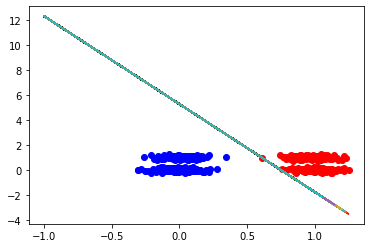

In [24]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Oitava configuração

In [25]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    print("Rodada ", i + 1)
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -1, 1, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Rodada  1
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.2101661  -0.73790109 -0.65149108]
quantidade de exemplos corretos:  493
quantidade de exemplos errados:  107

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.5401661  -0.00978906 -0.40705322]
quantidade de exemplos corretos:  516
quantidade de exemplos errados:  84

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.1401661   0.20884878 -0.24228622]
quantidade de exemplos corretos:  571
quantidade de exemplos errados:  29

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.0098339   0.26511617 -0.15205651]
quantidade de exemplos corretos:  590
quantidade de exemplos errados:  10

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.0498339   0.27806489 -0.11004213]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na époc

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.15415378  0.56570139 -0.12391301]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.15415378  0.56570139 -0.12391301]
quantidade de vezes que o peso foi ajustado:  86


Rodada  10
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.61228891 -0.28018564 -0.37356393]
quantidade de exemplos corretos:  497
quantidade de exemplos errados:  103

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.24228891  0.06832568 -0.23568178]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.05228891  0.16870255 -0.126515  ]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 4 #################################
Vetor de pesos na época  4 : 

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.28687716 0.39110671 0.13815454]
quantidade de vezes que o peso foi ajustado:  177


Rodada  19
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.72856126 -0.09335902 -0.94251515]
quantidade de exemplos corretos:  516
quantidade de exemplos errados:  84

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.11143874  0.7210496  -0.5846343 ]
quantidade de exemplos corretos:  560
quantidade de exemplos errados:  40

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.08856126  0.7805862  -0.44844462]
quantidade de exemplos corretos:  585
quantidade de exemplos errados:  15

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.15856126  0.79410637 -0.39027271]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.54088264  1.11489804 -0.12972736]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.54088264  1.11489804 -0.12972736]
quantidade de vezes que o peso foi ajustado:  28


Rodada  26
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.79019253 -0.68715643 -0.56516038]
quantidade de exemplos corretos:  502
quantidade de exemplos errados:  98

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.18980747  0.29025066 -0.36945202]
quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 1.92530885e-04  3.75972160e-01 -2.31608879e-01]
quantidade de exemplos corretos:  586
quantidade de exemplos errados:  14

Epoch: 4 #################################
Vetor de pesos na 

pesos final:  [0.50439466 0.66719961 0.255535  ]
quantidade de vezes que o peso foi ajustado:  72


Rodada  35
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.91408969 -0.50952426 -0.4109105 ]
quantidade de exemplos corretos:  454
quantidade de exemplos errados:  146

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.37408969 -0.02298527 -0.26683869]
quantidade de exemplos corretos:  540
quantidade de exemplos errados:  60

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.09408969  0.13935044 -0.15156112]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.00591031  0.17480109 -0.08724716]
quantidade de exemplos corretos:  593
quantidade de exemplos errados:  7

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.03591031  0.18246011 -0.06112587]
quantidade de exemplos corretos:  597
q

quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.32543067  0.99775468 -0.26899315]
quantidade de vezes que o peso foi ajustado:  25


Rodada  44
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.31484638 -0.23561577  0.39614338]
quantidade de exemplos corretos:  511
quantidade de exemplos errados:  89

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.01515362 0.06239578 0.20051392]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.07515362 0.12791551 0.09650087]
quantidade de exemplos corretos:  594
quantidade de exemplos errados:  6

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.09515362 0.13657907 0.05273211]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.09515362

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.05762078  0.25052705 -0.0847269 ]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.06762078  0.24834934 -0.0831247 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.06762078  0.24834934 -0.0831247 ]
quantidade de vezes que o peso foi ajustado:  212


Rodada  51
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.11011702 0.88270102 0.29982566]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.33011702 0.85341825 0.13099103]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.35011

quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.07755061 0.11636125 0.06649587]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.08755061 0.12112458 0.04243386]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.08755061 0.12112458 0.04243386]
quantidade de vezes que o peso foi ajustado:  152


Rodada  60
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.06894028  0.41282052  0.93389491]
quantidade de exemplos corretos:  511
quantidade de exemplos errados:  89

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.42105972 0.57742296 0.46557505]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.46105972 

quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 8 #################################
Vetor de pesos na época  8 : [ 0.17105647  0.70220878 -0.24380345]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 9 #################################
Vetor de pesos na época  9 : [ 0.18105647  0.70003108 -0.24220125]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 10 #################################
Vetor de pesos na época  10 : [ 0.19105647  0.69785337 -0.24059904]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.19105647  0.69785337 -0.24059904]
quantidade de vezes que o peso foi ajustado:  106


Rodada  67
Epoch: 1 #################################
Vetor de pesos na época  1 : [0.3667138  0.54171152 0.90151104]
quantidade de exemplos corretos:  546
quantidade de exemplos errados:  54

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.

Vetor de pesos na época  5 : [0.41170791 0.54513742 0.22672505]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.41170791 0.55030935 0.21347423]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [0.41170791 0.55548127 0.20022341]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.41170791 0.55548127 0.20022341]
quantidade de vezes que o peso foi ajustado:  122


Rodada  75
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.05433938 -0.16652761  0.63617724]
quantidade de exemplos corretos:  520
quantidade de exemplos errados:  80

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.10566062 0.16586762 0.31010508]
quantidade de exemplos corretos:  578
quantidade de exemplos errados:  22

Epoch: 3 ############

quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.12759527 0.17139324 0.07299019]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [0.12759527 0.17656517 0.05973936]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.12759527 0.17656517 0.05973936]
quantidade de vezes que o peso foi ajustado:  184


Rodada  82
Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.2605007  -0.1036544   0.14591643]
quantidade de exemplos corretos:  548
quantidade de exemplos errados:  52

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.0005007   0.04239593  0.07346454]
quantidade de exemplos corretos:  591
quantidade de exemplos errados:  9

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.0294993 

quantidade de exemplos corretos:  538
quantidade de exemplos errados:  62

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.34010027 0.61105677 0.15102203]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.35010027 0.60760894 0.14052896]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.36010027 0.60416112 0.1300359 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.36010027 0.60416112 0.1300359 ]
quantidade de vezes que o peso foi ajustado:  64


Rodada  92
Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.47572203  0.68411703 -0.6811603 ]
quantidade de exemplos corretos:  575
quantidade de exemplos errados:  25

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.22572203  

# Gráfico 8

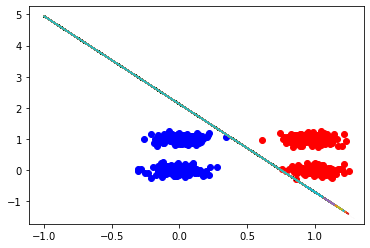

In [26]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)

# Nona configuração

In [27]:
vEpoca = []
vAjuste = [] 
for i in range (100):
    (pred,W, epoca, qtdeAj) = train_perceptron(X, Y, -0.5, 0.5, 0.01)
    vEpoca.append(epoca)
    vAjuste.append(qtdeAj)
impressao(vEpoca, vAjuste)

Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.20533351 -0.02955338 -0.46208543]
quantidade de exemplos corretos:  543
quantidade de exemplos errados:  57

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.15533351  0.23301506 -0.28593404]
quantidade de exemplos corretos:  567
quantidade de exemplos errados:  33

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.00533351  0.30472478 -0.17467229]
quantidade de exemplos corretos:  588
quantidade de exemplos errados:  12

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.05466649  0.31439592 -0.13064678]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.07466649  0.31572289 -0.1161335 ]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.0

Vetor de pesos na época  5 : [0.10402471 0.13936841 0.04006209]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.10402471 0.13936841 0.04006209]
quantidade de vezes que o peso foi ajustado:  82


Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.29341537 -0.02114882  0.21637446]
quantidade de exemplos corretos:  582
quantidade de exemplos errados:  18

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.11341537 0.16090409 0.21068388]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.14341537 0.20335455 0.12216688]
quantidade de exemplos corretos:  595
quantidade de exemplos errados:  5

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.15341537 0.21355595 0.08762931]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 ########################

quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.08601971  0.35739491 -0.12213004]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.09601971  0.3552172  -0.12052784]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.09601971  0.35915688 -0.10916476]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.09601971  0.35915688 -0.10916476]
quantidade de vezes que o peso foi ajustado:  76


Epoch: 1 #################################
Vetor de pesos na época  1 : [0.39802235 0.06264251 0.07019688]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.19802235 0.259

quantidade de exemplos corretos:  572
quantidade de exemplos errados:  28

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.15450951  0.02135693 -0.11308708]
quantidade de exemplos corretos:  576
quantidade de exemplos errados:  24

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.03450951  0.07807445 -0.06077488]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.00549049  0.09189285 -0.03445053]
quantidade de exemplos corretos:  597
quantidade de exemplos errados:  3

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.01549049  0.09541605 -0.02274601]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.02549049  0.09343814 -0.02204494]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

peso

quantidade de exemplos corretos:  559
quantidade de exemplos errados:  41

Epoch: 2 #################################
Vetor de pesos na época  2 : [ 0.0112438   0.31734095 -0.17639554]
quantidade de exemplos corretos:  589
quantidade de exemplos errados:  11

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.0612438   0.32850182 -0.13276649]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.0812438   0.33004694 -0.11671941]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.0812438   0.33398663 -0.10535633]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.0912438   0.33180892 -0.10375413]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

peso

quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.0793318   0.29401994 -0.09265184]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.0793318   0.29401994 -0.09265184]
quantidade de vezes que o peso foi ajustado:  94


Epoch: 1 #################################
Vetor de pesos na época  1 : [ 0.40416391 -0.01235263 -0.45138713]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.02583609  0.4022137  -0.28527988]
quantidade de exemplos corretos:  580
quantidade de exemplos errados:  20

Epoch: 3 #################################
Vetor de pesos na época  3 : [ 0.05416391  0.436401   -0.20177145]
quantidade de exemplos corretos:  592
quantidade de exemplos errados:  8

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.09416391 

Vetor de pesos na época  3 : [ 0.10339663  0.44827069 -0.17278447]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.10339663  0.45221037 -0.16142139]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.11339663  0.45003267 -0.15981918]
quantidade de exemplos corretos:  598
quantidade de exemplos errados:  2

Epoch: 6 #################################
Vetor de pesos na época  6 : [ 0.11339663  0.45397235 -0.14845611]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 7 #################################
Vetor de pesos na época  7 : [ 0.12339663  0.45179464 -0.1468539 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [ 0.12339663  0.45179464 -0.1468539 ]
quantidade de vezes que o peso foi ajustado:  15


Epoch: 1 ###########

pesos final:  [ 0.1113557   0.39415327 -0.12316765]
quantidade de vezes que o peso foi ajustado:  52


Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.03155951 -0.41382223 -0.31785997]
quantidade de exemplos corretos:  544
quantidade de exemplos errados:  56

Epoch: 2 #################################
Vetor de pesos na época  2 : [-0.27155951  0.00865938 -0.19824164]
quantidade de exemplos corretos:  557
quantidade de exemplos errados:  43

Epoch: 3 #################################
Vetor de pesos na época  3 : [-0.06155951  0.11723734 -0.10197592]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 4 #################################
Vetor de pesos na época  4 : [ 0.00844049  0.13556285 -0.06136971]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 5 #################################
Vetor de pesos na época  5 : [ 0.02844049  0.14001366 -0.04547347]
quantidade de exemplos corretos:  599
quantidade

quantidade de exemplos corretos:  531
quantidade de exemplos errados:  69

Epoch: 2 #################################
Vetor de pesos na época  2 : [0.06099355 0.11708734 0.19017617]
quantidade de exemplos corretos:  587
quantidade de exemplos errados:  13

Epoch: 3 #################################
Vetor de pesos na época  3 : [0.11099355 0.14911634 0.09433328]
quantidade de exemplos corretos:  596
quantidade de exemplos errados:  4

Epoch: 4 #################################
Vetor de pesos na época  4 : [0.11099355 0.1631889  0.07030321]
quantidade de exemplos corretos:  599
quantidade de exemplos errados:  1

Epoch: 5 #################################
Vetor de pesos na época  5 : [0.12099355 0.16106519 0.0588733 ]
quantidade de exemplos corretos:  600
quantidade de exemplos errados:  0

pesos final:  [0.12099355 0.16106519 0.0588733 ]
quantidade de vezes que o peso foi ajustado:  87


Epoch: 1 #################################
Vetor de pesos na época  1 : [-0.23962941  0.12678066 -0.

# Gráfico 9

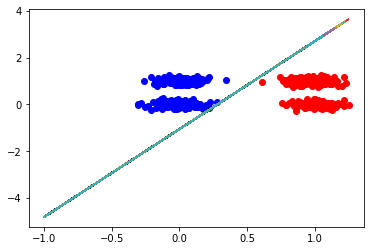

In [28]:
cont = 0
for i in X:
    plt.plot(i[1],i[2],'ro' if (Y[cont] == 1.0) else 'bo')
    cont = cont + 1
for i in range(len(X)):#np.linspace(np.amin(X),np.amax(X)):
    x = X[i]
    yi = (W[0]/W[2]) - (W[1]/W[2]) * x
    plt.plot(x,yi)